# Librerias

In [1]:
"""Verificación del entorno GPU: comprobamos que CUDA esté disponible,
ya que varios modelos del proyecto requieren aceleración por GPU."""

!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2025 NVIDIA Corporation
Built on Fri_Feb_21_20:23:50_PST_2025
Cuda compilation tools, release 12.8, V12.8.93
Build cuda_12.8.r12.8/compiler.35583870_0


In [2]:
"""
Configuración de compatibilidad: se fuerza el uso de
Keras 2 (legacy) para garantizar compatibilidad con TensorFlow Hub,
necesario para los modelos avanzados.
"""

import os
# Esta línea obliga a Colab a usar Keras 2 (compatible con TF-Hub)
os.environ["TF_USE_LEGACY_KERAS"] = "1"

import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

# Verificamos que se haya aplicado el cambio (debe salir True)
print("¿Está usando Legacy Keras?:", str(os.environ.get("TF_USE_LEGACY_KERAS") == "1"))

¿Está usando Legacy Keras?: True


In [3]:
!pip install cupy-cuda12x factor-analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 3.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor-analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=ccebbb64821204a47435380a0589454f9a037771f3eba903d3396c8f4dafcd3f
  Stored in directory: /root/.cache/pip/wheels/a2/af/06/f4d4ed4d9d714fda437fb1583629417319603c2266e7b233cc
Successfully built factor-analyzer


In [4]:
import cupy as cp
import numpy as np

try:
    # Preguntamos a la GPU sus datos
    print(f"✅ Versión de CuPy detectada: {cp.__version__}")
    print(f"✅ Dispositivo CUDA: {cp.cuda.runtime.getDeviceCount()} GPU(s) encontrada(s)")

    # Hacemos una suma simple en la GPU para confirmar
    x = cp.array([1, 2, 3])
    print(f"✅ Prueba de cálculo en GPU exitosa: {x}")

except Exception as e:
    print(f"❌ Algo falló: {e}")

✅ Versión de CuPy detectada: 14.0.1
✅ Dispositivo CUDA: 1 GPU(s) encontrada(s)
✅ Prueba de cálculo en GPU exitosa: [1 2 3]


In [ ]:
# ═══════════════════════════════════════════════════════════════
# LIBRERÍAS GENERALES
# ═══════════════════════════════════════════════════════════════

import pandas as pd
import os
import cv2
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt
import gc
import umap
from google.colab import drive
from factor_analyzer import FactorAnalyzer
from tqdm.notebook import tqdm
import seaborn as sns
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
import shutil
from scipy.ndimage import gaussian_filter
import tensorflow_hub as hub
import time
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

# ═══════════════════════════════════════════════════════════════
# SCIKIT-LEARN — Preprocesamiento y utilidades
# ═══════════════════════════════════════════════════════════════

from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder
from sklearn.decomposition import PCA, FactorAnalysis, TruncatedSVD
from sklearn.manifold import trustworthiness, _utils
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, confusion_matrix,
                             f1_score, accuracy_score, ConfusionMatrixDisplay)
from sklearn.utils.class_weight import compute_class_weight
from sklearn.utils import class_weight
from sklearn.feature_selection import SelectFromModel
from sklearn.manifold import trustworthiness as sklearn_trustworthiness

# ── Modelos finales presentados en la tesis ──────────────────
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

# ── Modelos de exploración (probados durante el proceso investigativo) ──
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from sklearn.naive_bayes import GaussianNB, ComplementNB
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier, AdaBoostClassifier

# ═══════════════════════════════════════════════════════════════
# TENSORFLOW / KERAS
# ═══════════════════════════════════════════════════════════════

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import (Dense, Dropout, BatchNormalization,
                                     GlobalAveragePooling2D, Conv2D,
                                     Flatten, MaxPooling2D)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import layers, models, callbacks, utils, initializers, optimizers
from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import backend as K

# ── Modelos finales presentados en la tesis ──────────────────
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.applications.efficientnet import preprocess_input as effnet_preprocess

# ── Modelos de exploración ────────────────────────────────────

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess  # ← renombrado para evitar sobreescritura


from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess

from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input as inception_preprocess

# ═══════════════════════════════════════════════════════════════
# CONFIGURACIÓN DE ADVERTENCIAS
# ═══════════════════════════════════════════════════════════════

import warnings
from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)

In [ ]:
drive.mount('/content/drive')

# **Código para modelos con reducción de dimensionalidad**

## Preprocesamiento de las imágenes

### Carga de las imágenes

In [ ]:
"""
Para preservar la proporción original de las imágenes de fondo de ojo
y evitar distorsiones geométricas que podrían afectar el aprendizaje de
los modelos, se implementa un redimensionamiento con padding. Las áreas
sin información se rellenan con negro, color que no interfiere con las
estructuras retinianas de interés.
"""


def resize_with_padding(image, target_size):
    """
    Redimensiona una imagen manteniendo su proporción (aspect ratio)
    y agrega bordes negros (padding) para llegar al tamaño objetivo.
    """
    h, w = image.shape[:2]
    target_w, target_h = target_size

    # Calcular la escala para ajustar la dimensión más grande al target
    scale = min(target_w / w, target_h / h)
    new_w = int(w * scale)
    new_h = int(h * scale)

    # Redimensionar la imagen original
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # Crear un lienzo negro del tamaño objetivo
    canvas = np.zeros((target_h, target_w, 3), dtype=np.uint8)

    # Calcular posición para centrar la imagen
    x_offset = (target_w - new_w) // 2
    y_offset = (target_h - new_h) // 2

    # Pegar la imagen redimensionada en el centro del lienzo
    canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized

    return canvas

In [ ]:
folder_path = '/content/drive/MyDrive/enfermedades oculares/preprocessed_images'
IMG_SIZE = (128, 128)

def load_all_images(folder, img_size):

    images_list = [] # Lista para almacenar las matrices de imágenes
    filenames_list = []

    # Verifica si la carpeta existe.
    if not os.path.exists(folder):
        print(f"Error: La carpeta '{folder}' no fue encontrada.")
        return [],[]

    for filename in sorted(os.listdir(folder)):
        if filename.endswith(('jpg', 'png', 'jpeg', 'JPG', 'PNG')):
            file_path = os.path.join(folder, filename)

            # Carga la imagen a color
            img = cv2.imread(file_path)

            if img is not None:
                img_processed = resize_with_padding(img, img_size)
                images_list.append(img_processed)
                filenames_list.append(filename)
            else:
                print(f"Advertencia: No se pudo cargar la imagen {filename}. Se omitirá.")

    return images_list, filenames_list

#Llama a la función para cargar todas las imágenes en una lista
all_images,image_filenames = load_all_images(folder_path, IMG_SIZE)



In [ ]:
print("Número de imágenes cargadas:", len(all_images))
print("Número de nombres registrados:", len(image_filenames))
print("Primeros 10 nombres de imágenes:")
print(image_filenames[:10])

Número de imágenes cargadas: 6392
Número de nombres registrados: 6392
Primeros 10 nombres de imágenes:
['0_left.jpg', '0_right.jpg', '1005_right.jpg', '1006_left.jpg', '1006_right.jpg', '1008_left.jpg', '1008_right.jpg', '100_left.jpg', '100_right.jpg', '1010_left.jpg']


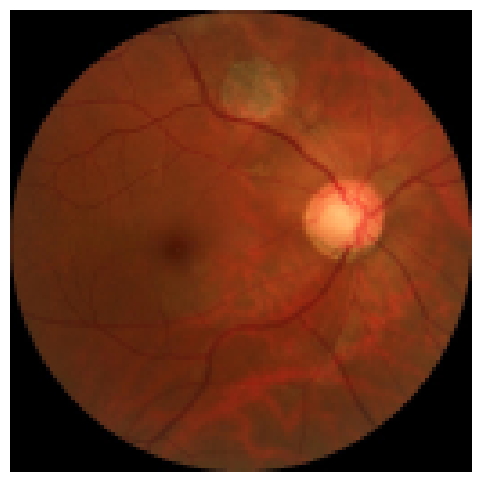


--- Contenido de la matriz (segmento central) ---
Forma del segmento: (5, 5, 3)
[[[ 21  53 139]
  [ 22  55 139]
  [ 22  56 140]
  [ 22  58 142]
  [ 24  57 144]]

 [[ 22  54 139]
  [ 22  56 140]
  [ 23  57 142]
  [ 21  56 145]
  [ 22  57 146]]

 [[ 22  54 140]
  [ 23  57 142]
  [ 24  56 145]
  [ 22  57 147]
  [ 22  56 148]]

 [[ 21  56 142]
  [ 23  54 146]
  [ 22  55 149]
  [ 22  57 150]
  [ 21  56 147]]

 [[ 20  55 137]
  [ 22  54 142]
  [ 22  54 149]
  [ 23  54 148]
  [ 22  54 151]]]


In [ ]:
# Visualiza la matriz de la primera imagen
if len(all_images) > 0:
    # Selecciona la primera imagen de la lista
    first_image = all_images[500]

    # Convierte el formato de color de BGR (OpenCV) a RGB (Matplotlib)
    first_image_rgb = cv2.cvtColor(first_image, cv2.COLOR_BGR2RGB)


    # Define el tamaño del segmento que quieres visualizar (por ejemplo, 5x5 píxeles)
    target_size = 5

    # Obtiene las dimensiones de la imagen
    h, w, c = first_image.shape

    # Calcula la esquina superior izquierda del segmento central
    start_y = (h - target_size) // 2
    start_x = (w - target_size) // 2


    # Extrae el segmento central de la matriz
    center_segment = first_image[start_y : start_y + target_size,
                             start_x : start_x + target_size]


    # Muestra la imagen usando Matplotlib
    plt.figure(figsize=(8, 6))
    plt.imshow(first_image_rgb)
    #plt.title(f"Visualización de la Matriz de una Imagen ({first_image.shape[0]}x{first_image.shape[1]}x{first_image.shape[2]})")
    plt.axis('off')
    plt.show()

    print("\n--- Contenido de la matriz (segmento central) ---")
    print(f"Forma del segmento: {center_segment.shape}")
    print(center_segment)
else:
    print("No se encontraron imágenes. Por favor, revisa la ruta y los archivos.")

### Aplanamiento de las matrices:

se convierte una matriz en un unico vector.

**Ejemplo:**

Matriz:

```
[[[5,   10,   50], [  20, 25,   15]],
 [[50,   20, 30], [23, 20,   15]]]
```

Vector plano:

```
[[5, 10, 50,    20, 25, 15,    50, 20, 30,    23, 20, 15]]
```


In [ ]:
if len(all_images) > 0:
    # toma la  lista y la convierte en un solo array de NumPy.
    # El resultado es una matriz con una forma de (6392,128,128,3),
    # donde la primera dimensión (6392) es el número de imágenes.
    images_array = np.array(all_images)

    # Obtiene las dimensiones del array (número de muestras, alto, ancho, canales)
    n_samples, h, w, c = images_array.shape

    # Aplana cada imagen a un vector unidimensional
    datos_aplanados = images_array.reshape((n_samples, h * w * c))

    print("Aplanamiento completado con éxito.")
    print(f"Forma de los datos aplanados: {datos_aplanados.shape}")
else:
    print("No se encontraron imágenes para aplanar.")

Aplanamiento completado con éxito.
Forma de los datos aplanados: (6392, 49152)


### Creación de labels

In [ ]:
# Carga del csv con la información de los ojos
try:
    df = pd.read_csv('/content/drive/MyDrive/enfermedades oculares/full_df.csv')
    print("✅ DataFrame 'full_df.csv' cargado con éxito.")
except FileNotFoundError:
    print("🚨 Error: Asegúrate de que 'full_df.csv' esté en el directorio correcto.")
    df = None

if df is not None:
    df.head(2)

✅ DataFrame 'full_df.csv' cargado con éxito.


In [ ]:
# Quita corchetes, comillas y espacios innecesarios
df["labels"] = df["labels"].str.replace(r"[\[\]' ]", "", regex=True)
df.head(1)

,ID,Patient Age,Patient Sex,Left-Fundus,Right-Fundus,Left-Diagnostic Keywords,Right-Diagnostic Keywords,N,D,G,C,A,H,M,O,filepath,labels,target,filename
0,0,69,Female,0_left.jpg,0_right.jpg,cataract,normal fundus,0,0,0,1,0,0,0,0,../input/ocular-disease-recognition-odir5k/ODI...,N,"[1, 0, 0, 0, 0, 0, 0, 0]",0_right.jpg


In [ ]:
# Mapeamos cada nombre de archivo a su label correspondiente
dicc_labels = dict(zip(df['filename'], df['labels']))
print(f"✅ Diccionario creado con {len(dicc_labels)} entradas.")

# Asignar labels a las imágenes cargadas
labels_final = []
faltantes = []
for n in image_filenames:
    if n in dicc_labels:
        labels_final.append(dicc_labels[n])
    else:
        faltantes.append(n)

if faltantes:
    print(f"⚠️ {len(faltantes)} imágenes sin label en el CSV: {faltantes[:5]}")
else:
    print(f"✅ Labels asignados correctamente a {len(labels_final)} imágenes.")

✅ Diccionario creado con 6392 entradas.
✅ Labels asignados correctamente a 6392 imágenes.


In [ ]:
encoder = LabelEncoder()
y = encoder.fit_transform(labels_final)

print(y[:10])
print(len(y))

[1 6 6 6 7 6 7 7 6 6]
6392


In [ ]:
"""
Verificación del mapeo entre etiquetas originales y
códigos numéricos asignados por el LabelEncoder.
"""

for clase, codigo in zip(encoder.classes_, range(len(encoder.classes_))):
    print(f"{clase}  →  {codigo}")

A  →  0
C  →  1
D  →  2
G  →  3
H  →  4
M  →  5
N  →  6
O  →  7


### Dividir en datos de entrenamiento y testeo


In [ ]:
datos_aplanados_train, datos_aplanados_test, y_train, y_test, filenames_train, filenames_test = train_test_split(
    datos_aplanados,
    y,
    image_filenames,
    test_size=0.2,
    random_state=42,
    stratify=y
)


In [ ]:
print("Distribución en TRAIN:")
unique, counts = np.unique(y_train, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  {encoder.classes_[u]} ({u}): {c} imágenes")

print("\nDistribución en TEST:")
unique, counts = np.unique(y_test, return_counts=True)
for u, c in zip(unique, counts):
    print(f"  {encoder.classes_[u]} ({u}): {c} imágenes")

Distribución en TRAIN:
  A (0): 213 imágenes
  C (1): 234 imágenes
  D (2): 1286 imágenes
  G (3): 227 imágenes
  H (4): 103 imágenes
  M (5): 186 imágenes
  N (6): 2298 imágenes
  O (7): 566 imágenes

Distribución en TEST:
  A (0): 53 imágenes
  C (1): 59 imágenes
  D (2): 322 imágenes
  G (3): 57 imágenes
  H (4): 25 imágenes
  M (5): 46 imágenes
  N (6): 575 imágenes
  O (7): 142 imágenes


### Estandarización de los datos

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(datos_aplanados_train)
X_test_scaled  = scaler.transform(datos_aplanados_test)

In [ ]:
X_train_scaled.shape

(5113, 49152)

## Elección de factores y componentes

### Análisis paralelo Horn

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ANÁLISIS PARALELO DE HORN
# ═══════════════════════════════════════════════════════════════════════════
# El análisis paralelo de Horn es un método estadístico para determinar el
# número óptimo de componentes (PCA) o factores (AF) a retener. La idea es
# comparar los autovalores reales de los datos contra los autovalores
# generados por matrices de datos aleatorios (ruido puro). Solo se retienen
# los componentes/factores cuyos autovalores superen el umbral del ruido,
# garantizando que la información retenida sea estadísticamente significativa.
#
# Se utiliza aceleración por GPU (CuPy) para manejar eficientemente las
# operaciones matriciales sobre los 49.152 features de las imágenes aplanadas.
# ═══════════════════════════════════════════════════════════════════════════

def horn_parallel_analysis(datos, metodo='pca', n_vars=2000,
                            num_simulations=50, num_repeats=3, random_state=42):
    """
    Análisis paralelo (Horn) unificado para PCA y AF usando GPU (CuPy).

    Parámetros:
    -----------
    datos          : array estandarizado de entrenamiento (X_train_scaled)
    metodo         : 'pca' usa matriz de covarianza | 'af' usa matriz de correlación
    n_vars         : número máximo de variables a muestrear por repetición
    num_simulations: simulaciones de Monte Carlo para estimar el umbral de ruido
    num_repeats    : repeticiones para verificar estabilidad del resultado
    random_state   : semilla para reproducibilidad

    Retorna:
    --------
    lista de diccionarios con resultados por repetición
    """

    nombre_col = "Componente" if metodo == 'pca' else "Factor"
    print(f"🚀 Iniciando Análisis Paralelo de Horn [{metodo.upper()}] en GPU: "
          f"{cp.cuda.runtime.getDeviceCount()} dispositivo(s).")

    rng = np.random.default_rng(random_state)
    n_samples, n_features = datos.shape
    resultados = []

    for rep in range(num_repeats):
        print(f"\n🔄 Repetición {rep+1}/{num_repeats}")

        # ── 1) Selección aleatoria de variables ───────────────────────────
        # Se muestrea un subconjunto de variables para reducir el costo
        # computacional sin perder representatividad estadística.
        selected_vars = rng.choice(n_features, size=min(n_vars, n_features), replace=False)
        subset = datos[:, selected_vars]

        # ── 2) Estandarización y cálculo de autovalores reales en GPU ─────
        # Se estandariza en CPU (sklearn es eficiente para esto) y luego
        # se transfiere a GPU para las operaciones matriciales pesadas.
        subset = StandardScaler().fit_transform(subset)
        subset_gpu = cp.asarray(subset)

        # PCA usa covarianza; AF usa correlación (equivalente a covarianza
        # sobre datos estandarizados, pero es la convención estándar del método)
        if metodo == 'pca':
            matrix = cp.cov(subset_gpu, rowvar=False)
        else:
            # En AF con Horn se usa la matriz de correlación porque refleja
            # relaciones lineales entre variables independientemente de su escala.
            # El denominador len(variables) es correcto aquí porque la varianza
            # total de la matriz de correlación estandarizada equivale al número
            # de variables.
            matrix = cp.corrcoef(subset_gpu, rowvar=False)

        eigvals_real_gpu = cp.linalg.eigvalsh(matrix)[::-1]
        eigvals_real = cp.asnumpy(eigvals_real_gpu)

        # Liberamos memoria GPU inmediatamente tras obtener los resultados
        del subset_gpu, matrix, eigvals_real_gpu
        cp.get_default_memory_pool().free_all_blocks()

        # ── 3) Simulaciones de Monte Carlo en GPU ─────────────────────────
        # Generamos matrices de ruido aleatorio del mismo tamaño que los datos
        # reales y calculamos sus autovalores. El promedio de estos autovalores
        # representa el umbral que debe superar cada componente/factor real
        # para ser considerado significativo.
        rand_eigs = np.zeros((num_simulations, len(selected_vars)))

        for i in range(num_simulations):
            semilla = random_state + i + (rep * 1000)
            rnd_gpu = cp.random.default_rng(semilla)

            random_data_gpu = rnd_gpu.standard_normal(
                size=(n_samples, len(selected_vars)),
                dtype=cp.float32
            )

            if metodo == 'pca':
                cov_rnd_gpu = cp.cov(random_data_gpu, rowvar=False)
            else:
                cov_rnd_gpu = cp.corrcoef(random_data_gpu, rowvar=False)

            eigs_rnd_gpu = cp.linalg.eigvalsh(cov_rnd_gpu)[::-1]
            rand_eigs[i, :] = cp.asnumpy(eigs_rnd_gpu)

            del random_data_gpu, cov_rnd_gpu, eigs_rnd_gpu
            # Liberamos memoria cada 10 iteraciones para evitar saturar la VRAM
            if i % 10 == 0:
                cp.get_default_memory_pool().free_all_blocks()

        mean_rand_eigs = rand_eigs.mean(axis=0)

        # ── 4) Criterio de selección de Horn ──────────────────────────────
        # Se retienen únicamente los componentes/factores cuyos autovalores
        # reales superan el promedio de los autovalores aleatorios.
        selected_mask = eigvals_real > mean_rand_eigs
        num_selected = selected_mask.sum()
        selected_indices = [idx+1 for idx, v in enumerate(selected_mask) if v]

        # ── 5) Cálculo de varianza explicada ──────────────────────────────
        if metodo == 'pca':
            total_var = eigvals_real.sum()
            var_individual = eigvals_real / total_var * 100
        else:
            var_individual = eigvals_real / len(selected_vars) * 100

        var_acumulada = np.cumsum(var_individual)

        # ── 6) Tabla de resultados ─────────────────────────────────────────
        tabla = pd.DataFrame({
            nombre_col: np.arange(1, len(selected_vars)+1),
            "Autovalor real": eigvals_real,
            "Autovalor aleatorio medio": mean_rand_eigs,
            "Varianza individual (%)": var_individual,
            "Varianza acumulada (%)": var_acumulada,
            "Seleccionado": selected_mask
        }).round(2)

        tabla_filtrada = tabla[tabla["Seleccionado"]].reset_index(drop=True)

        resultados.append({
            "repeticion": rep+1,
            f"num_{nombre_col.lower()}s": num_selected,
            f"{nombre_col.lower()}s": selected_indices,
            "tabla": tabla_filtrada
        })

        var_final = tabla_filtrada['Varianza acumulada (%)'].iloc[-1] if not tabla_filtrada.empty else 0
        print(f"📌 {nombre_col}s retenidos: {num_selected} | Varianza acumulada: {var_final:.2f}%")

    return resultados

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Función de visualización para ambos métodos
# ─────────────────────────────────────────────────────────────────────────────

def graficar_horn(resultados, metodo='pca'):
    """
    Grafica el análisis paralelo de Horn mostrando los autovalores reales
    versus el umbral de ruido aleatorio. El punto de cruce indica el número
    óptimo de componentes o factores a retener.

    Parámetros:
    -----------
    resultados : salida de horn_parallel_analysis()
    metodo     : 'pca' o 'af' para ajustar etiquetas del gráfico
    """
    col_x  = "Componente" if metodo == 'pca' else "Factor"
    titulo = "Componentes (PCA)" if metodo == 'pca' else "Factores (AF)"

    df_graf = resultados[-1]['tabla']

    plt.figure(figsize=(12, 6))
    plt.plot(df_graf[col_x], df_graf['Autovalor real'],
             'o-', color='blue', label='Autovalores Reales', markersize=4, alpha=0.8)
    plt.plot(df_graf[col_x], df_graf['Autovalor aleatorio medio'],
             '--', color='red', label='Ruido Aleatorio (Umbral de Horn)', linewidth=2)

    plt.title(f'Análisis Paralelo de Horn — Selección de {titulo}', fontsize=14)
    plt.xlabel(f'Número de {col_x}', fontsize=12)
    plt.ylabel('Autovalor (Eigenvalue)', fontsize=12)
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


⏳ Ejecutando Análisis Paralelo de Horn para PCA...
🚀 Iniciando Análisis Paralelo de Horn [PCA] en GPU: 1 dispositivo(s).

🔄 Repetición 1/3
📌 Componentes retenidos: 29 | Varianza acumulada: 94.80%

🔄 Repetición 2/3
📌 Componentes retenidos: 29 | Varianza acumulada: 94.72%

🔄 Repetición 3/3
📌 Componentes retenidos: 30 | Varianza acumulada: 94.83%


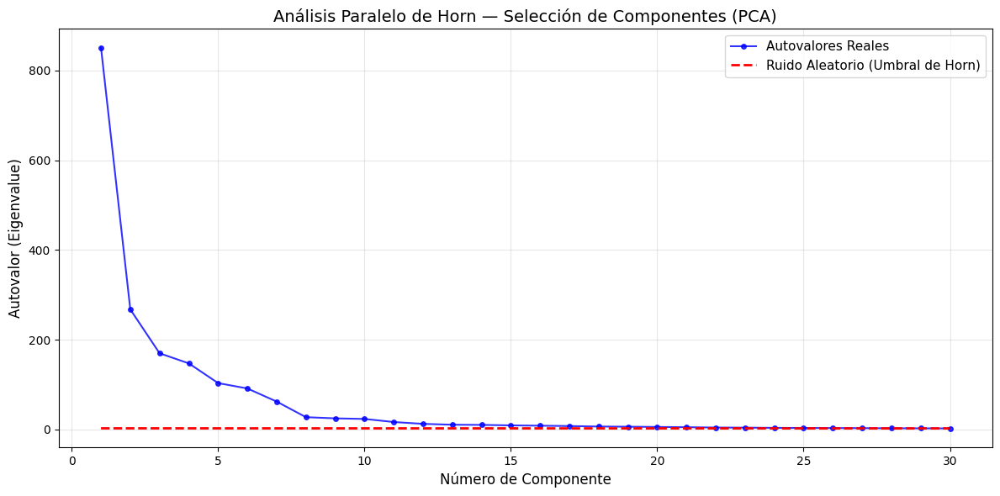

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Ejecución del análisis paralelo de Horn para PCA
# ─────────────────────────────────────────────────────────────────────────────
# Se analiza el conjunto de entrenamiento estandarizado. Se usan 3 repeticiones
# para verificar la estabilidad del número de componentes sugerido.

print("⏳ Ejecutando Análisis Paralelo de Horn para PCA...")
resultados_pca = horn_parallel_analysis(
    datos=X_train_scaled,
    metodo='pca',
    n_vars=2000,
    num_simulations=40,
    num_repeats=3,
    random_state=42
)

graficar_horn(resultados_pca, metodo='pca')

⏳ Ejecutando Análisis Paralelo de Horn para AF...
🚀 Iniciando Análisis Paralelo de Horn [AF] en GPU: 1 dispositivo(s).

🔄 Repetición 1/3
📌 Factors retenidos: 29 | Varianza acumulada: 94.80%

🔄 Repetición 2/3
📌 Factors retenidos: 29 | Varianza acumulada: 94.72%

🔄 Repetición 3/3
📌 Factors retenidos: 30 | Varianza acumulada: 94.83%


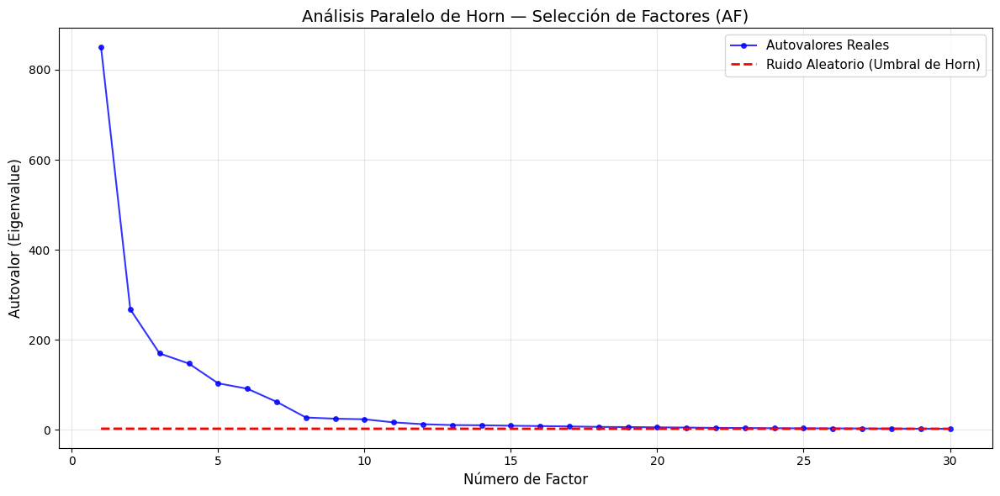

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Ejecución del análisis paralelo de Horn para AF
# ─────────────────────────────────────────────────────────────────────────────
# Se repite el mismo proceso usando la matriz de correlación, que es la
# convención estándar para el Análisis Factorial.

print("⏳ Ejecutando Análisis Paralelo de Horn para AF...")
resultados_af = horn_parallel_analysis(
    datos=X_train_scaled,
    metodo='af',
    n_vars=2000,
    num_simulations=40,
    num_repeats=3,
    random_state=42
)

graficar_horn(resultados_af, metodo='af')

### criterio Yeomans-Golder

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# CRITERIO DE YEOMANS-GOLDER Y CRITERIO DE KAISER
# ═══════════════════════════════════════════════════════════════════════════
# Para determinar el número óptimo de componentes/factores se emplean dos
# criterios complementarios:
#
# 1. Yeomans-Golder (Criterio de Varianza Acumulada):
#    Retiene los componentes/factores necesarios hasta explicar un umbral
#    definido de varianza total (en este caso el 94%). Es útil cuando se
#    quiere garantizar que se conserva una cantidad mínima de información.
#
# 2. Kaiser:
#    Retiene únicamente los componentes/factores con autovalor ≥ 1, es decir,
#    aquellos que explican más varianza que una variable original individual.
#    Es el criterio más clásico y ampliamente reportado en la literatura.
#
# Ambos criterios se aplican tanto para PCA (matriz de covarianza) como para
# AF (matriz de correlación), usando GPU para eficiencia computacional.
# ═══════════════════════════════════════════════════════════════════════════

def criterio_varianza(datos, metodo='pca', n_vars=2000,
                      umbral_varianza=94.0, num_repeats=3, random_state=42):
    """
    Selecciona componentes (PCA) o factores (AF) hasta que la varianza
    acumulada supere el umbral especificado (por defecto 94%).

    Parámetros:
    -----------
    datos           : array estandarizado de entrenamiento (X_train_scaled)
    metodo          : 'pca' usa matriz de covarianza | 'af' usa matriz de correlación
    n_vars          : número máximo de variables a muestrear por repetición
    umbral_varianza : porcentaje de varianza acumulada deseado (ej. 94.0)
    num_repeats     : repeticiones para verificar estabilidad del resultado
    random_state    : semilla para reproducibilidad

    Retorna:
    --------
    lista de diccionarios con resultados por repetición
    """
    nombre_col = "Componente" if metodo == 'pca' else "Factor"

    rng = np.random.default_rng(random_state)
    n_samples, n_features = datos.shape
    resultados = []

    print(f"🎯 Iniciando criterio de varianza [{metodo.upper()}]: "
          f"buscando retener el {umbral_varianza}% de la varianza total...")

    for rep in range(num_repeats):
        print(f"🔄 Repetición {rep+1}/{num_repeats}")

        # ── 1) Selección aleatoria de variables ───────────────────────────
        # Se muestrea un subconjunto para reducir costo computacional
        # manteniendo representatividad estadística.
        sel = rng.choice(n_features, size=min(n_vars, n_features), replace=False)
        subset = datos[:, sel]

        # ── 2) Cálculo de autovalores en GPU ──────────────────────────────
        subset_gpu = cp.asarray(subset)

        # PCA usa covarianza; AF usa correlación.
        # Nota: con datos ya estandarizados ambas matrices son equivalentes,
        # pero se mantiene la distinción conceptual correcta para cada método.
        if metodo == 'pca':
            matrix = cp.cov(subset_gpu, rowvar=False)
        else:
            matrix = cp.corrcoef(subset_gpu, rowvar=False)

        eigvals_gpu = cp.linalg.eigvalsh(matrix)
        eigvals_real = cp.asnumpy(cp.flip(eigvals_gpu))  # Orden descendente

        # Liberamos memoria GPU
        del subset_gpu, matrix, eigvals_gpu
        cp.get_default_memory_pool().free_all_blocks()

        # ── 3) Cálculo de varianza explicada ──────────────────────────────
        # En PCA: se divide entre la suma total de autovalores.
        # En AF:  se divide entre el número de variables (varianza total de
        #         la matriz de correlación estandarizada = nº de variables).
        if metodo == 'pca':
            total_varianza = eigvals_real.sum()
        else:
            total_varianza = len(sel)

        var_indiv_pct = (eigvals_real / total_varianza) * 100.0
        var_acum_pct  = np.cumsum(var_indiv_pct)

        # ── 4) Aplicar criterio de Yeomans-Golder ─────────────────────────
        # Se busca el primer punto donde la varianza acumulada supera el umbral.
        indices_superan = np.where(var_acum_pct >= umbral_varianza)[0]

        if len(indices_superan) > 0:
            num_retenidos = indices_superan[0] + 1
        else:
            # Si con todas las variables no se alcanza el umbral (caso inusual),
            # se retienen todas.
            num_retenidos = len(sel)

        mask_selected = np.zeros(len(sel), dtype=bool)
        mask_selected[:num_retenidos] = True

        # ── 5) Tabla de resultados ─────────────────────────────────────────
        tabla = pd.DataFrame({
            nombre_col: np.arange(1, len(sel)+1),
            "Autovalor": eigvals_real,
            "Varianza_individual_%": var_indiv_pct,
            "Varianza_acumulada_%": var_acum_pct,
            "Seleccionado": mask_selected
        }).round(3)

        tabla_filtrada = tabla[tabla["Seleccionado"]].copy()
        var_final = tabla_filtrada["Varianza_acumulada_%"].iloc[-1]

        resultados.append({
            "repeticion": rep+1,
            f"num_{nombre_col.lower()}s": num_retenidos,
            "varianza_alcanzada": var_final,
            "tabla_completa": tabla,
            "tabla_filtrada": tabla_filtrada
        })

        print(f"✅ Repetición {rep+1}: Se necesitan {num_retenidos} "
              f"{nombre_col.lower()}s para explicar el {var_final:.2f}%")

    return resultados


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Funciones de visualización
# ─────────────────────────────────────────────────────────────────────────────

def graficar_varianza_acumulada(resultados, metodo='pca'):
    """
    Grafica la curva de varianza acumulada y marca el punto de corte
    donde se alcanza el umbral de Yeomans-Golder.
    """
    col_x  = "Componente" if metodo == 'pca' else "Factor"
    titulo = "PCA" if metodo == 'pca' else "Análisis Factorial"
    color  = "blue" if metodo == 'pca' else "purple"

    res = resultados[-1]
    df_yg = res['tabla_completa']
    corte = res[f'num_{col_x.lower()}s']
    var_corte = res['varianza_alcanzada']

    plt.figure(figsize=(10, 6))
    plt.plot(df_yg[col_x], df_yg['Varianza_acumulada_%'],
             label='Varianza Acumulada', color=color, linewidth=2)
    plt.axhline(y=94.0, color='red', linestyle='--', label='Umbral 94%')
    plt.plot(corte, var_corte, 'ro', markersize=8)
    plt.annotate(f'Corte: {corte} {col_x}s\n({var_corte:.2f}%)',
                 xy=(corte, var_corte),
                 xytext=(corte + 5, var_corte - 10),
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=11, fontweight='bold')

    plt.title(f'{titulo} — Varianza Acumulada (Yeomans-Golder)\n'
              f'{col_x}s necesarios: {corte}', fontsize=14)
    plt.xlabel(f'Número de {col_x}s')
    plt.ylabel('Varianza Acumulada (%)')
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    plt.xlim(0, corte + 50)
    plt.ylim(35, 105)
    plt.tight_layout()
    plt.show()


def graficar_kaiser(resultados, metodo='pca'):
    """
    Grafica el criterio de Kaiser (λ ≥ 1) mostrando qué componentes
    o factores superan el umbral de autovalor igual a 1.
    """
    col_x  = "Componente" if metodo == 'pca' else "Factor"
    titulo = "PCA" if metodo == 'pca' else "AF"

    res_ultimo = resultados[-1]
    df_k = res_ultimo['tabla_completa']

    autovalores = df_k['Autovalor']
    num_kaiser  = sum(autovalores >= 1.0)
    mask_aceptados  = autovalores >= 1.0
    mask_descartados = autovalores < 1.0

    plt.figure(figsize=(12, 7))
    plt.plot(df_k[col_x], autovalores, '-', color='gray', alpha=0.4, zorder=1)
    plt.scatter(df_k[col_x][mask_aceptados], autovalores[mask_aceptados],
                color='blue', s=60, label=f'Retenidos (λ ≥ 1)', zorder=2)
    plt.scatter(df_k[col_x][mask_descartados], autovalores[mask_descartados],
                color='darkorange', s=50, alpha=0.7, label='Descartados (λ < 1)', zorder=2)
    plt.axhline(y=1.0, color='red', linestyle='--', linewidth=2,
                label='Criterio Kaiser (λ = 1)')

    plt.title(f'Gráfico de Sedimentación ({titulo})\n'
              f'{col_x}s con λ ≥ 1: {num_kaiser}', fontsize=16)
    plt.xlabel(f'Número de {col_x}', fontsize=12)
    plt.ylabel('Autovalor (Eigenvalue)', fontsize=12)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.ylim(-50, autovalores.max() + 50)
    plt.xlim(0, num_kaiser + 30)
    plt.tight_layout()
    plt.show()

    print(f"\n📋 Últimos 5 {col_x.lower()}s que cumplen Kaiser (λ ≥ 1):")
    display(df_k[mask_aceptados].tail(5))




⏳ Ejecutando criterio de varianza para PCA...
🎯 Iniciando criterio de varianza [PCA]: buscando retener el 94.0% de la varianza total...
🔄 Repetición 1/3
✅ Repetición 1: Se necesitan 24 componentes para explicar el 94.06%
🔄 Repetición 2/3
✅ Repetición 2: Se necesitan 25 componentes para explicar el 94.14%
🔄 Repetición 3/3
✅ Repetición 3: Se necesitan 25 componentes para explicar el 94.12%


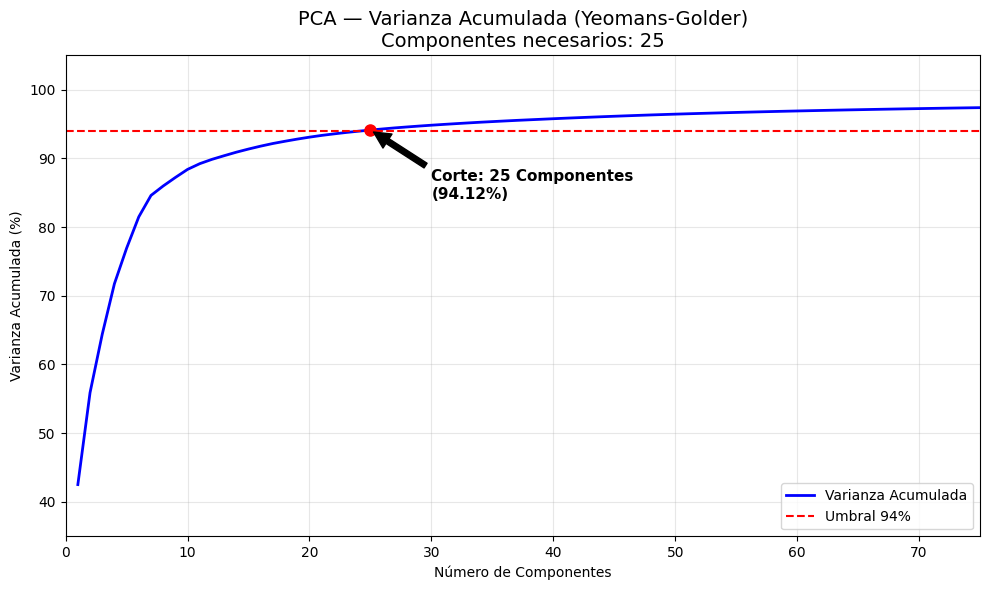

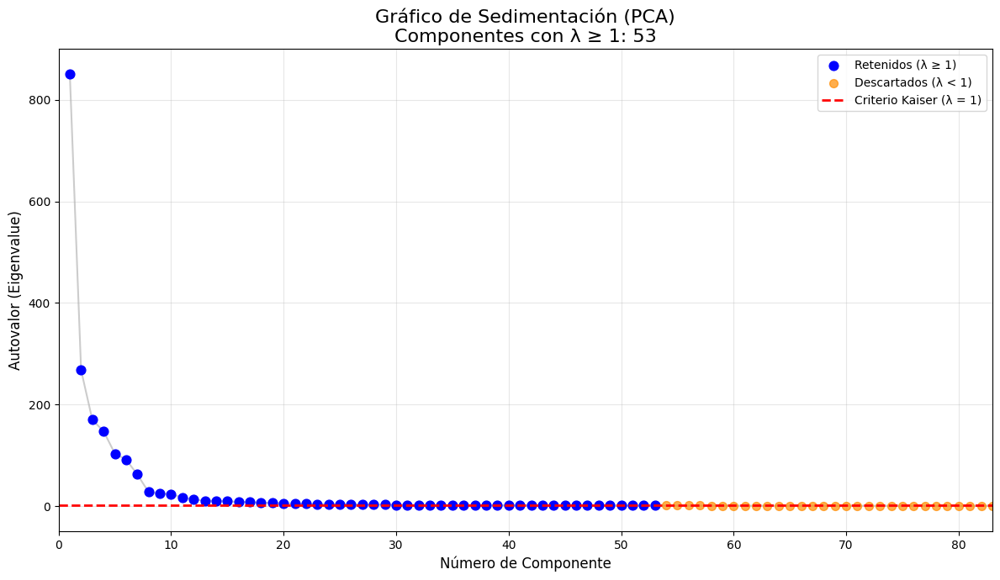


📋 Últimos 5 componentes que cumplen Kaiser (λ ≥ 1):


,Componente,Autovalor,Varianza_individual_%,Varianza_acumulada_%,Seleccionado
48,49,1.162,0.058,96.381,False
49,50,1.139,0.057,96.438,False
50,51,1.060,0.053,96.491,False
51,52,1.027,0.051,96.542,False
52,53,1.003,0.050,96.592,False


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Ejecución para PCA
# ─────────────────────────────────────────────────────────────────────────────

print("⏳ Ejecutando criterio de varianza para PCA...")
resultados_yg_pca = criterio_varianza(
    datos=X_train_scaled,
    metodo='pca',
    n_vars=2000,
    umbral_varianza=94.0,
    num_repeats=3,
    random_state=42
)

graficar_varianza_acumulada(resultados_yg_pca, metodo='pca')
graficar_kaiser(resultados_yg_pca, metodo='pca')


⏳ Ejecutando criterio de varianza para AF...
🎯 Iniciando criterio de varianza [AF]: buscando retener el 94.0% de la varianza total...
🔄 Repetición 1/3
✅ Repetición 1: Se necesitan 24 factors para explicar el 94.06%
🔄 Repetición 2/3
✅ Repetición 2: Se necesitan 25 factors para explicar el 94.14%
🔄 Repetición 3/3
✅ Repetición 3: Se necesitan 25 factors para explicar el 94.12%


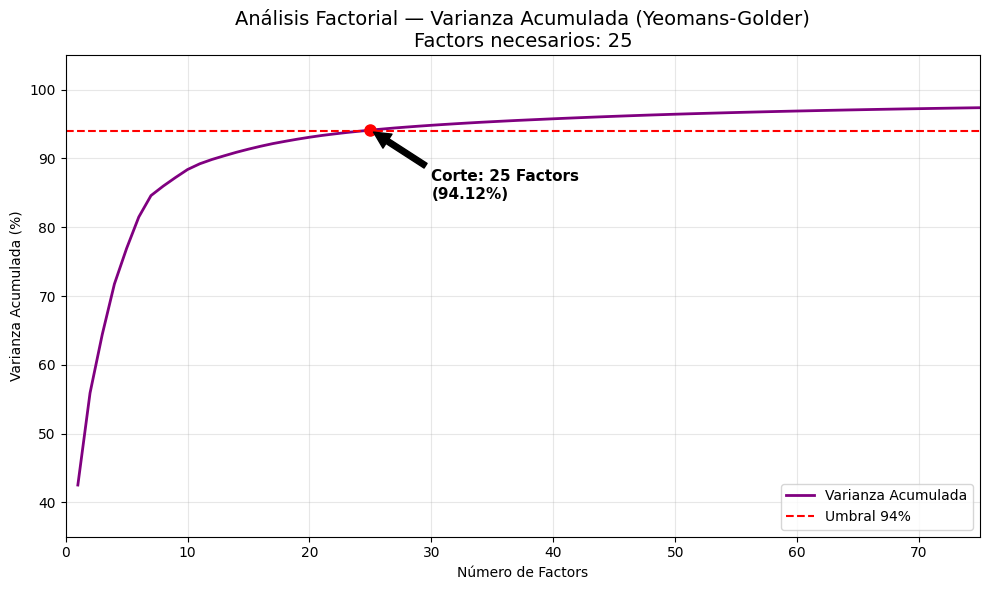

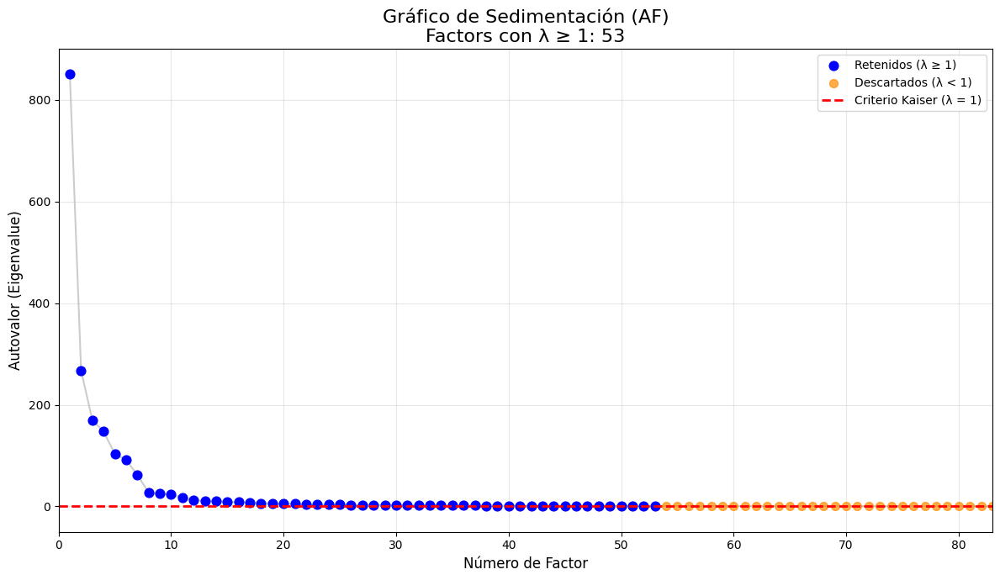


📋 Últimos 5 factors que cumplen Kaiser (λ ≥ 1):


,Factor,Autovalor,Varianza_individual_%,Varianza_acumulada_%,Seleccionado
48,49,1.162,0.058,96.381,False
49,50,1.139,0.057,96.438,False
50,51,1.060,0.053,96.491,False
51,52,1.027,0.051,96.542,False
52,53,1.003,0.050,96.592,False


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Ejecución para AF
# ─────────────────────────────────────────────────────────────────────────────

print("⏳ Ejecutando criterio de varianza para AF...")
resultados_yg_af = criterio_varianza(
    datos=X_train_scaled,
    metodo='af',
    n_vars=2000,
    umbral_varianza=94.0,
    num_repeats=3,
    random_state=42
)

graficar_varianza_acumulada(resultados_yg_af, metodo='af')
graficar_kaiser(resultados_yg_af, metodo='af')

## Kaiser-Meyer-Olkin (KMO)


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# VALIDACIÓN DE ADECUACIÓN MUESTRAL — MEDIDA KMO
# ═══════════════════════════════════════════════════════════════════════════
# Antes de aplicar la reducción de dimensionalidad por Análisis Factorial
# es necesario verificar si los datos son adecuados para este método.
# La medida KMO (Kaiser-Meyer-Olkin) evalúa si las correlaciones entre
# variables son suficientemente altas para que el AF extraiga factores
# significativos. Compara las correlaciones observadas contra las
# correlaciones parciales. Un valor cercano a 1 indica que el AF es
# apropiado. La escala de interpretación es la siguiente:
#
#   0.90 – 1.00 → Excelente
#   0.80 – 0.89 → Bueno
#   0.70 – 0.79 → Aceptable
#   0.60 – 0.69 → Mediocre
#   0.50 – 0.59 → Malo
#   < 0.50      → Inaceptable (AF no recomendado)
#
# Nota: dado el alto número de variables (49.152 features), el cálculo se
# realiza sobre una muestra representativa usando GPU para eficiencia.
# ═══════════════════════════════════════════════════════════════════════════

def calcular_kmo(datos, n_vars=500, random_state=42):
    """
    Calcula la medida KMO (Kaiser-Meyer-Olkin) para evaluar la adecuación
    del Análisis Factorial sobre los datos de entrenamiento.

    Parámetros:
    -----------
    datos        : array estandarizado de entrenamiento (X_train_scaled)
    n_vars       : número de variables a muestrear para eficiencia computacional
    random_state : semilla para reproducibilidad

    Retorna:
    --------
    diccionario con KMO global y KMO por variable
    """
    rng = np.random.default_rng(random_state)
    n_samples, n_features = datos.shape

    # ── 1) Muestreo de variables ───────────────────────────────────────────
    # Se trabaja con un subconjunto representativo para hacer el cálculo
    # computacionalmente viable sin perder validez estadística.
    sel = rng.choice(n_features, size=min(n_vars, n_features), replace=False)
    subset = datos[:, sel]

    print(f"📐 Calculando KMO sobre {subset.shape[1]} variables "
          f"y {subset.shape[0]} muestras...")

    # ── 2) Matriz de correlación en GPU ────────────────────────────────────
    subset_gpu = cp.asarray(subset)
    corr_gpu   = cp.corrcoef(subset_gpu, rowvar=False)
    corr       = cp.asnumpy(corr_gpu)

    del subset_gpu, corr_gpu
    cp.get_default_memory_pool().free_all_blocks()

    # ── 3) Matriz de correlaciones parciales ───────────────────────────────
    # La correlación parcial se obtiene invirtiendo la matriz de correlación
    # (matriz de precisión) y normalizando. Refleja la relación entre dos
    # variables eliminando el efecto del resto.
    try:
        inv_corr = np.linalg.inv(corr)
    except np.linalg.LinAlgError:
        # Si la matriz es singular usamos pseudoinversa
        print("⚠️ Matriz singular detectada, usando pseudoinversa.")
        inv_corr = np.linalg.pinv(corr)

    diag = np.sqrt(np.diag(inv_corr))
    partial_corr = -inv_corr / np.outer(diag, diag)
    np.fill_diagonal(partial_corr, 1.0)

    # ── 4) Cálculo del KMO ────────────────────────────────────────────────
    # KMO = suma(r²ij) / (suma(r²ij) + suma(p²ij))
    # donde r = correlaciones observadas y p = correlaciones parciales
    corr_sq         = corr ** 2
    partial_corr_sq = partial_corr ** 2

    # Excluimos la diagonal (autocorrelaciones)
    np.fill_diagonal(corr_sq, 0)
    np.fill_diagonal(partial_corr_sq, 0)

    # KMO global
    kmo_global  = corr_sq.sum() / (corr_sq.sum() + partial_corr_sq.sum())

    # KMO por variable (útil para identificar variables problemáticas)
    kmo_por_var = corr_sq.sum(axis=1) / (
        corr_sq.sum(axis=1) + partial_corr_sq.sum(axis=1)
    )

    return {
        "kmo_global": kmo_global,
        "kmo_por_variable": kmo_por_var
    }


def interpretar_kmo(kmo_valor):
    """Retorna la interpretación textual del valor KMO."""
    if kmo_valor >= 0.90:
        return "Excelente ✅"
    elif kmo_valor >= 0.80:
        return "Bueno ✅"
    elif kmo_valor >= 0.70:
        return "Aceptable ✅"
    elif kmo_valor >= 0.60:
        return "Mediocre ⚠️"
    elif kmo_valor >= 0.50:
        return "Malo ⚠️"
    else:
        return "Inaceptable ❌ — AF no recomendado"


def graficar_kmo(resultados_kmo):
    """
    Visualiza la distribución del KMO por variable y la clasificación
    del KMO global según la escala estándar de interpretación.
    """
    kmo_vars   = resultados_kmo['kmo_por_variable']
    kmo_global = resultados_kmo['kmo_global']
    interpretacion = interpretar_kmo(kmo_global)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # ── Gráfico 1: Distribución del KMO por variable ──────────────────────
    axes[0].hist(kmo_vars, bins=50, color='steelblue', edgecolor='white', alpha=0.85)
    axes[0].axvline(x=0.50, color='red', linestyle='--', linewidth=2,
                    label='Umbral mínimo (0.50)')
    axes[0].axvline(x=kmo_global, color='green', linestyle='-', linewidth=2,
                    label=f'KMO Global: {kmo_global:.4f}')
    axes[0].set_title('Distribución del KMO por Variable', fontsize=13)
    axes[0].set_xlabel('Valor KMO')
    axes[0].set_ylabel('Frecuencia')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # ── Gráfico 2: Clasificación visual del KMO global ────────────────────
    categorias = ['Inaceptable\n(<0.50)', 'Malo\n(0.50-0.59)',
                  'Mediocre\n(0.60-0.69)', 'Aceptable\n(0.70-0.79)',
                  'Bueno\n(0.80-0.89)', 'Excelente\n(0.90-1.00)']
    colores    = ['#d73027', '#fc8d59', '#fee08b', '#d9ef8b', '#91cf60', '#1a9850']
    umbrales   = [0.50, 0.59, 0.69, 0.79, 0.89, 1.00]

    bars = axes[1].barh(categorias, [1]*6, color=colores, alpha=0.7, edgecolor='white')

    # Resaltamos la categoría donde cae el KMO global
    for i, val in enumerate(umbrales):
        if kmo_global <= val:
            bars[i].set_edgecolor('black')
            bars[i].set_linewidth(3)
            axes[1].text(1.05, i, f'◄ Tu KMO: {kmo_global:.4f}',
                         va='center', fontsize=11, fontweight='bold')
            break

    axes[1].set_xlim(0, 1.3)
    axes[1].set_title(f'Clasificación KMO Global\nValor: {kmo_global:.4f} — {interpretacion}',
                      fontsize=13)
    axes[1].set_xlabel('Escala de referencia')
    axes[1].grid(True, alpha=0.3, axis='x')

    plt.tight_layout()
    plt.show()


⏳ Calculando KMO...
📐 Calculando KMO sobre 500 variables y 5113 muestras...
⚠️ Matriz singular detectada, usando pseudoinversa.

═════════════════════════════════════════════
  RESULTADO — MEDIDA KMO
═════════════════════════════════════════════
  KMO Global       : 0.9796
  Interpretación   : Excelente ✅
═════════════════════════════════════════════

⚠️  Variables con KMO < 0.50: 0 (0.0%)
   (Variables por debajo del umbral aportan poco al AF)


/tmp/ipykernel_435/3330256890.py:160: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


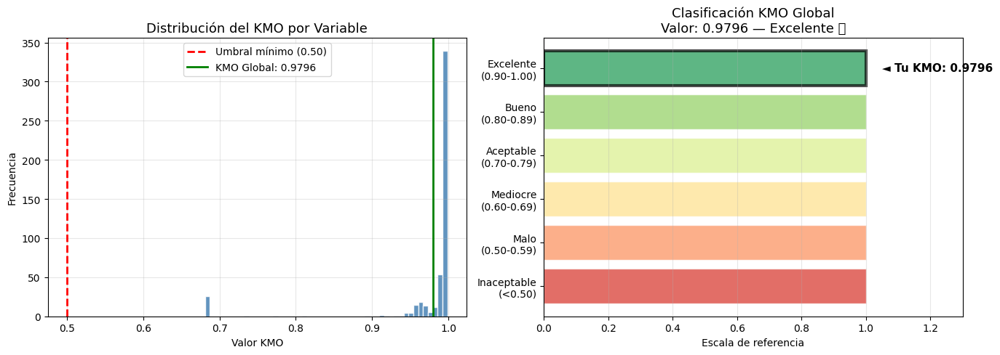

In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Ejecución del análisis KMO
# ─────────────────────────────────────────────────────────────────────────────

print("⏳ Calculando KMO...")
resultados_kmo = calcular_kmo(X_train_scaled, n_vars=500, random_state=42)

kmo_global     = resultados_kmo['kmo_global']
interpretacion = interpretar_kmo(kmo_global)

print("\n" + "═"*45)
print("  RESULTADO — MEDIDA KMO")
print("═"*45)
print(f"  KMO Global       : {kmo_global:.4f}")
print(f"  Interpretación   : {interpretacion}")
print("═"*45)

vars_problematicas = (resultados_kmo['kmo_por_variable'] < 0.50).sum()
print(f"\n⚠️  Variables con KMO < 0.50: {vars_problematicas} "
      f"({vars_problematicas/len(resultados_kmo['kmo_por_variable'])*100:.1f}%)")
print("   (Variables por debajo del umbral aportan poco al AF)")

graficar_kmo(resultados_kmo)

## Reducción de dimensionalidad


### PCA

📌 Componentes sugeridos por Horn          : 30
📌 Componentes sugeridos por Yeomans-Golder: 25
📌 Componentes retenidos (máximo)          : 30

--- Resultados de la reducción PCA ---
Dimensión original de los datos    : 49152 características
Dimensión reducida (componentes)   : 30 componentes
Reducción lograda                  : 99.9%
Varianza explicada total            : 0.9474 (94.74%)
Forma train después de PCA          : (5113, 30)
Forma test después de PCA           : (1279, 30)


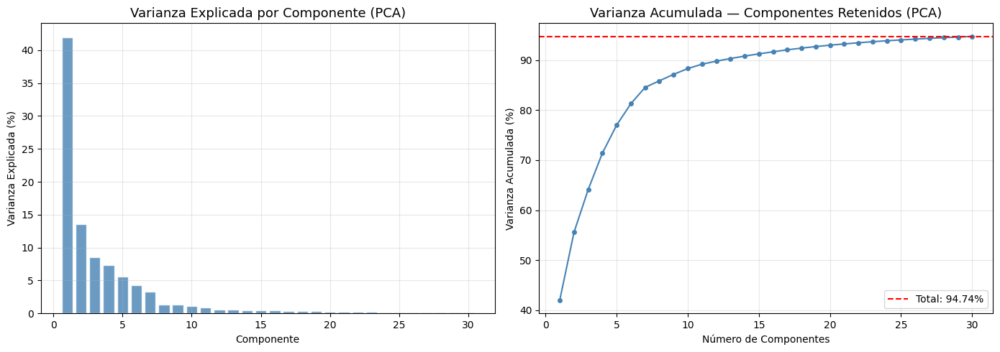


✅ PCA completado. DataFrames df_pca_train y df_pca_test listos.


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# REDUCCIÓN DE DIMENSIONALIDAD — PCA
# ═══════════════════════════════════════════════════════════════════════════

if X_train_scaled.size > 0:

    # Número de componentes definido por los criterios estadísticos previos
    # (Horn y Yeomans-Golder), no de forma arbitraria.
    n_componentes_horn = resultados_pca[-1]['num_componentes']
    n_componentes_yg   = resultados_yg_pca[-1]['num_componentes']
    n_componentes      = max(n_componentes_horn, n_componentes_yg)

    print(f"📌 Componentes sugeridos por Horn          : {n_componentes_horn}")
    print(f"📌 Componentes sugeridos por Yeomans-Golder: {n_componentes_yg}")
    print(f"📌 Componentes retenidos (máximo)          : {n_componentes}")

    # ── Ajuste y transformación ────────────────────────────────────────────
    # Se usa PCA de sklearn, que garantiza el centrado previo de los datos.
    # fit_transform se aplica SOLO sobre train para evitar data leakage.
    # transform se aplica sobre test usando el modelo ya entrenado.
    pca = PCA(n_components=n_componentes, random_state=42)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca  = pca.transform(X_test_scaled)

    # ── Resultados ─────────────────────────────────────────────────────────
    varianza_total = pca.explained_variance_ratio_.sum()

    print("\n--- Resultados de la reducción PCA ---")
    print(f"Dimensión original de los datos    : {X_train_scaled.shape[1]} características")
    print(f"Dimensión reducida (componentes)   : {X_train_pca.shape[1]} componentes")
    print(f"Reducción lograda                  : {(1 - X_train_pca.shape[1]/X_train_scaled.shape[1])*100:.1f}%")
    print(f"Varianza explicada total            : {varianza_total:.4f} ({varianza_total*100:.2f}%)")
    print(f"Forma train después de PCA          : {X_train_pca.shape}")
    print(f"Forma test después de PCA           : {X_test_pca.shape}")

    # ── Gráfica de varianza explicada por componente ───────────────────────
    # Permite verificar visualmente cómo se distribuye la información
    # entre los componentes retenidos.
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Varianza individual
    axes[0].bar(range(1, n_componentes+1),
                pca.explained_variance_ratio_ * 100,
                color='steelblue', alpha=0.8, edgecolor='white')
    axes[0].set_title('Varianza Explicada por Componente (PCA)', fontsize=13)
    axes[0].set_xlabel('Componente')
    axes[0].set_ylabel('Varianza Explicada (%)')
    axes[0].grid(True, alpha=0.3)

    # Varianza acumulada
    axes[1].plot(range(1, n_componentes+1),
                 np.cumsum(pca.explained_variance_ratio_) * 100,
                 'o-', color='steelblue', markersize=4)
    axes[1].axhline(y=varianza_total*100, color='red', linestyle='--',
                    label=f'Total: {varianza_total*100:.2f}%')
    axes[1].set_title('Varianza Acumulada — Componentes Retenidos (PCA)', fontsize=13)
    axes[1].set_xlabel('Número de Componentes')
    axes[1].set_ylabel('Varianza Acumulada (%)')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ── DataFrames con metadatos ───────────────────────────────────────────
    # Se guardan los datos reducidos junto con sus identificadores y labels
    # para facilitar el análisis en etapas posteriores.
    df_pca_train = pd.DataFrame(X_train_pca)
    df_pca_train["filename"] = filenames_train
    df_pca_train["label"]    = y_train

    df_pca_test = pd.DataFrame(X_test_pca)
    df_pca_test["filename"] = filenames_test
    df_pca_test["label"]    = y_test

    print("\n✅ PCA completado. DataFrames df_pca_train y df_pca_test listos.")

else:
    print("❌ La matriz de datos está vacía. Revisa los pasos anteriores.")

In [ ]:
df_pca_train.head()

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,filename,label
0,-30.227728,-15.006368,30.286403,-56.037875,-10.359623,25.143551,8.841630,12.804285,31.322180,-13.640207,...,2.219558,-0.688125,-2.135229,10.296753,5.809384,1.345197,4.945072,4.730487,4622_right.jpg,2
1,-50.400554,-10.888074,17.900143,-168.447825,-6.661046,64.408785,48.914109,38.105712,18.187763,24.807144,...,12.283245,20.879341,-6.596258,2.893137,-9.428845,-0.458236,11.206778,-14.522127,4194_right.jpg,6
2,82.387930,-11.478839,-43.484590,22.976626,-74.390843,-67.069638,-46.898423,8.783263,-25.417279,23.604745,...,0.738584,-10.101228,1.602141,-0.665491,3.514224,2.642417,-14.460410,7.082287,4374_left.jpg,6
3,-6.724850,-8.894790,-23.599239,-99.684944,-61.473131,-5.457571,-18.646678,-31.610572,-5.254422,-0.794716,...,6.087260,-3.814165,0.476705,2.723095,-10.188878,-13.934375,7.372148,-7.365250,139_right.jpg,2
4,119.162555,-30.797349,69.824188,-41.641836,-46.706533,-35.171543,-72.406039,15.996306,19.585858,-26.541688,...,-2.377850,-6.835619,6.903784,0.538289,2.533935,7.912188,15.290304,5.417343,1570_right.jpg,5


### AF

📌 Factores sugeridos por Horn          : 30
📌 Factores sugeridos por Yeomans-Golder: 25
📌 Factores retenidos (máximo)          : 30

--- Resultados del Análisis Factorial ---
Dimensión original de los datos    : 49152 características
Dimensión reducida (factores)      : 30 factores
Reducción lograda                  : 99.9%
Forma train después de AF          : (5113, 30)
Forma test después de AF           : (1279, 30)

Promedio de comunalidades          : 0.9427
Máxima comunalidad                 : 1.0000
Mínima comunalidad                 : 0.2589


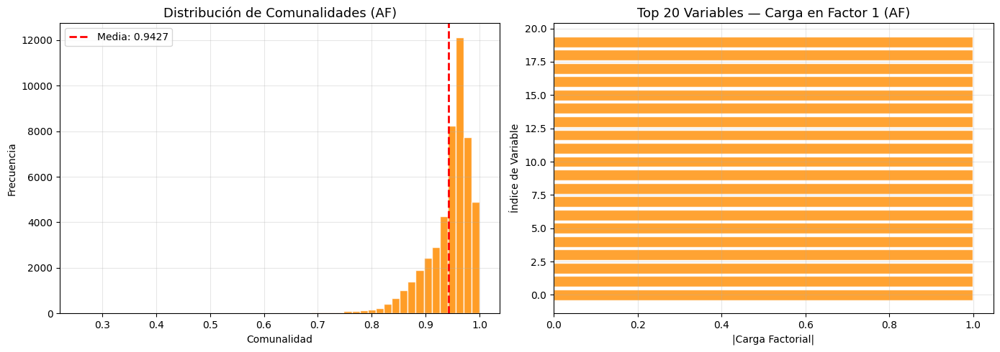


✅ AF completado. DataFrames df_af_train y df_af_test listos.


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# REDUCCIÓN DE DIMENSIONALIDAD — ANÁLISIS FACTORIAL (AF)
# ═══════════════════════════════════════════════════════════════════════════

if X_train_scaled.size > 0:

    # Número de factores definido por los criterios estadísticos previos
    # (Horn y Yeomans-Golder), no de forma arbitraria.
    n_factores_horn = resultados_af[-1]['num_factors']
    n_factores_yg   = resultados_yg_af[-1]['num_factors']
    n_factores      = max(n_factores_horn, n_factores_yg)

    print(f"📌 Factores sugeridos por Horn          : {n_factores_horn}")
    print(f"📌 Factores sugeridos por Yeomans-Golder: {n_factores_yg}")
    print(f"📌 Factores retenidos (máximo)          : {n_factores}")

    # ── Ajuste y transformación ────────────────────────────────────────────
    # fit_transform se aplica SOLO sobre train para evitar data leakage.
    # transform se aplica sobre test usando el modelo ya entrenado.
    fa = FactorAnalysis(n_components=n_factores, rotation='varimax', random_state=42)
    X_train_af = fa.fit_transform(X_train_scaled)
    X_test_af  = fa.transform(X_test_scaled)

    # ── Cargas factoriales y comunalidades ────────────────────────────────
    # Las cargas factoriales indican cuánto contribuye cada variable original
    # a cada factor. Las comunalidades miden qué proporción de la varianza
    # de cada variable es explicada por el conjunto de factores retenidos.
    cargas        = fa.components_.T  # (n_features × n_factores)
    comunalidades = np.sum(cargas**2, axis=1)

    # ── Resultados ─────────────────────────────────────────────────────────
    print("\n--- Resultados del Análisis Factorial ---")
    print(f"Dimensión original de los datos    : {X_train_scaled.shape[1]} características")
    print(f"Dimensión reducida (factores)      : {X_train_af.shape[1]} factores")
    print(f"Reducción lograda                  : {(1 - X_train_af.shape[1]/X_train_scaled.shape[1])*100:.1f}%")
    print(f"Forma train después de AF          : {X_train_af.shape}")
    print(f"Forma test después de AF           : {X_test_af.shape}")
    print(f"\nPromedio de comunalidades          : {comunalidades.mean():.4f}")
    print(f"Máxima comunalidad                 : {comunalidades.max():.4f}")
    print(f"Mínima comunalidad                 : {comunalidades.min():.4f}")

    # ── Gráfica de comunalidades ───────────────────────────────────────────
    # Una comunalidad alta indica que el factor explica bien esa variable.
    # Una comunalidad baja sugiere que esa variable no está bien representada
    # por los factores retenidos.
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Distribución de comunalidades
    axes[0].hist(comunalidades, bins=50, color='darkorange',
                 edgecolor='white', alpha=0.85)
    axes[0].axvline(x=comunalidades.mean(), color='red', linestyle='--',
                    linewidth=2, label=f'Media: {comunalidades.mean():.4f}')
    axes[0].set_title('Distribución de Comunalidades (AF)', fontsize=13)
    axes[0].set_xlabel('Comunalidad')
    axes[0].set_ylabel('Frecuencia')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Cargas del primer factor (el más importante)
    cargas_f1 = np.abs(cargas[:, 0])
    top_idx   = np.argsort(cargas_f1)[-20:]  # Top 20 variables con mayor carga

    axes[1].barh(range(20), cargas_f1[top_idx],
                 color='darkorange', alpha=0.8, edgecolor='white')
    axes[1].set_title('Top 20 Variables — Carga en Factor 1 (AF)', fontsize=13)
    axes[1].set_xlabel('|Carga Factorial|')
    axes[1].set_ylabel('Índice de Variable')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ── DataFrames con metadatos ───────────────────────────────────────────
    df_af_train = pd.DataFrame(X_train_af)
    df_af_train["filename"] = filenames_train
    df_af_train["label"]    = y_train

    df_af_test = pd.DataFrame(X_test_af)
    df_af_test["filename"] = filenames_test
    df_af_test["label"]    = y_test

    print("\n✅ AF completado. DataFrames df_af_train y df_af_test listos.")

else:
    print("❌ La matriz de datos está vacía. Revisa los pasos anteriores.")

### Umap

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# REDUCCIÓN DE DIMENSIONALIDAD — UMAP
# ═══════════════════════════════════════════════════════════════════════════

# ── Detección de GPU ───────────────────────────────────────────────────────
try:
    from cuml.manifold import UMAP as cuUMAP
    use_gpu = True
    print("✅ GPU con RAPIDS disponible — se usará cuML para UMAP")
except ImportError:
    use_gpu = False
    print("⚠️ RAPIDS no encontrado — se usará CPU (umap-learn)")

# ── Parámetros de UMAP ─────────────────────────────────────────────────────
# El número de componentes se toma como el máximo entre Horn y Yeomans-Golder,
# criterio consistente con PCA y AF.
n_componentes_horn_umap = resultados_pca[-1]['num_componentes']
n_componentes_yg_umap   = resultados_yg_pca[-1]['num_componentes']
n_componentes_umap      = max(n_componentes_horn_umap, n_componentes_yg_umap)

print(f"\n📌 Componentes sugeridos por Horn           : {n_componentes_horn_umap}")
print(f"📌 Componentes sugeridos por Yeomans-Golder : {n_componentes_yg_umap}")
print(f"📌 Componentes retenidos (máximo)           : {n_componentes_umap}")

# Parámetros de configuración
n_vecinos    = 30    # ~1% de muestras de entrenamiento, balance estructura local/global
distancia_min = 0.0  # agrupamiento compacto, favorece separación entre clases
metrica      = 'euclidean'

# ── Entrenamiento y transformación ─────────────────────────────────────────
# IMPORTANTE: fit_transform se aplica SOLO sobre entrenamiento para evitar
# fuga de información. transform se aplica sobre prueba con el modelo ya
# ajustado.
print("\n🔹 Entrenando UMAP con datos de entrenamiento...")

if use_gpu:
    X_train_gpu = cp.asarray(X_train_scaled)
    X_test_gpu  = cp.asarray(X_test_scaled)

    reducer_umap = cuUMAP(
        n_components=n_componentes_umap,
        n_neighbors=n_vecinos,
        min_dist=distancia_min,
        metric=metrica,
        random_state=42
    )

    X_train_umap_gpu = reducer_umap.fit_transform(X_train_gpu)
    X_test_umap_gpu  = reducer_umap.transform(X_test_gpu)

    # Convertir a CPU para usar en los modelos de clasificación
    X_train_umap = cp.asnumpy(X_train_umap_gpu)
    X_test_umap  = cp.asnumpy(X_test_umap_gpu)

    del X_train_gpu, X_test_gpu, X_train_umap_gpu, X_test_umap_gpu
    cp.get_default_memory_pool().free_all_blocks()

else:
    reducer_umap = umap.UMAP(
        n_components=n_componentes_umap,
        n_neighbors=n_vecinos,
        min_dist=distancia_min,
        metric=metrica,
        random_state=42
    )

    X_train_umap = reducer_umap.fit_transform(X_train_scaled)
    X_test_umap  = reducer_umap.transform(X_test_scaled)

# ── Resultados ─────────────────────────────────────────────────────────────
print("\n--- Resultados de la reducción UMAP ---")
print(f"Dimensión original                  : {X_train_scaled.shape[1]} características")
print(f"Dimensión reducida (componentes)    : {X_train_umap.shape[1]} componentes")
print(f"Reducción lograda                   : {(1 - X_train_umap.shape[1]/X_train_scaled.shape[1])*100:.1f}%")
print(f"Forma entrenamiento después de UMAP : {X_train_umap.shape}")
print(f"Forma prueba después de UMAP        : {X_test_umap.shape}")

# ── DataFrames con metadatos ───────────────────────────────────────────────
# Se guardan los datos reducidos junto con sus identificadores y etiquetas
# para facilitar el análisis en etapas posteriores.
df_umap_train = pd.DataFrame(X_train_umap)
df_umap_train["filename"] = filenames_train
df_umap_train["label"]    = y_train

df_umap_test = pd.DataFrame(X_test_umap)
df_umap_test["filename"] = filenames_test
df_umap_test["label"]    = y_test

print("\n✅ UMAP completado. DataFrames df_umap_train y df_umap_test listos.")

✅ GPU con RAPIDS disponible — se usará cuML para UMAP

📌 Componentes sugeridos por Horn           : 30
📌 Componentes sugeridos por Yeomans-Golder : 25
📌 Componentes retenidos (máximo)           : 30

🔹 Entrenando UMAP con datos de entrenamiento...

--- Resultados de la reducción UMAP ---
Dimensión original                  : 49152 características
Dimensión reducida (componentes)    : 30 componentes
Reducción lograda                   : 99.9%
Forma entrenamiento después de UMAP : (5113, 30)
Forma prueba después de UMAP        : (1279, 30)

✅ UMAP completado. DataFrames df_umap_train y df_umap_test listos.


#### Revisión de dimensionalidad con UMAP

Para evaluar la calidad de una proyección generada por UMAP, se usan dos medidas llamadas **Trustworthiness y Continuity**.


1.   La Trustworthiness indica qué tan bien seconservan las relaciones locales del espacio original en la representación reducida; es decir, si los puntos que eran vecinos en los datos originales siguen siéndolo después de la reducción
2.  La Continuity mide el grado en que los vecinos en la proyección también lo eran en el espacio original. Por ejemplo, si dos puntos aparecen muy cerca uno del otro en el mapa de baja dimensión pero en realidad estaban lejos en los datos originales, la continuidad disminuye.


  En conjunto, ambas métricas permiten verificar si UMAP mantiene la estructura de los datos sin distorsionar las relaciones entre los puntos al pasar de alta a baja dimensión.

🔹 Evaluando Confiabilidad y Continuidad punto por punto...


  0%|          | 0/5113 [00:00<?, ?it/s]


📊 Resultados — Confiabilidad y Continuidad:
  k= 5 vecinos → Confiabilidad: 0.9801 | Continuidad: 0.9861
  k=10 vecinos → Confiabilidad: 0.9737 | Continuidad: 0.9810
  k=15 vecinos → Confiabilidad: 0.9701 | Continuidad: 0.9777
  k=20 vecinos → Confiabilidad: 0.9671 | Continuidad: 0.9751
  k=30 vecinos → Confiabilidad: 0.9623 | Continuidad: 0.9707
  k=50 vecinos → Confiabilidad: 0.9530 | Continuidad: 0.9628


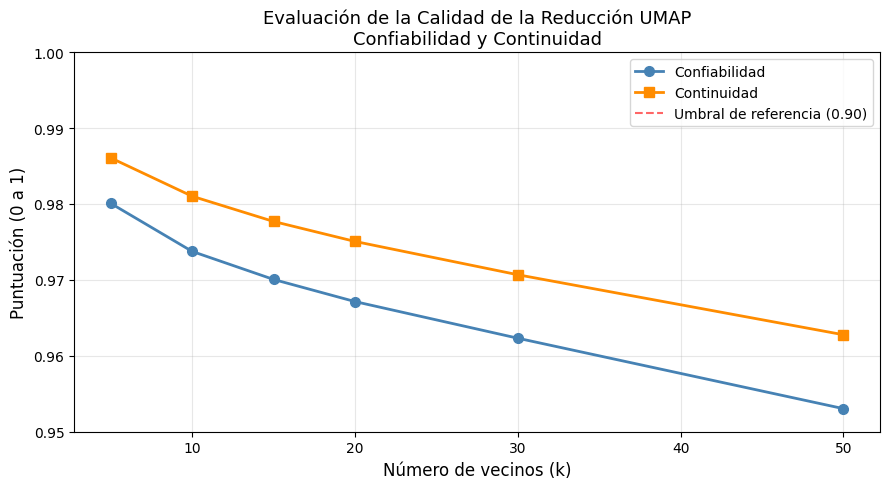


══════════════════════════════════════════════════
  RESUMEN — CALIDAD DE LA REDUCCIÓN UMAP
══════════════════════════════════════════════════
  Confiabilidad promedio : 0.9677
  Continuidad promedio   : 0.9755
══════════════════════════════════════════════════
  ✅ Reducción de alta calidad — estructura preservada correctamente


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# EVALUACIÓN DE LA CALIDAD DE LA REDUCCIÓN UMAP
# ═══════════════════════════════════════════════════════════════════════════

# ── Preparación de datos ───────────────────────────────────────────────────
X_orig_gpu = cp.asarray(X_train_scaled)
X_red_gpu  = cp.asarray(X_train_umap)
n_muestras = X_orig_gpu.shape[0]

# Lista de valores de vecinos a evaluar
lista_vecinos = [5, 10, 15, 20, 30, 50]

# Inicialización de acumuladores
sumas_confiabilidad = {k: 0.0 for k in lista_vecinos}
sumas_continuidad   = {k: 0.0 for k in lista_vecinos}

# ── Cálculo punto por punto en GPU ────────────────────────────────────────
# Para cada punto se calculan las distancias al resto, se obtienen los
# rangos y se comparan los vecindarios en ambos espacios.
print("🔹 Evaluando Confiabilidad y Continuidad punto por punto...")

for i in tqdm(range(n_muestras)):
    # Distancias desde el punto i al resto en ambos espacios
    dist_orig = cp.linalg.norm(X_orig_gpu - X_orig_gpu[i], axis=1)
    dist_red  = cp.linalg.norm(X_red_gpu  - X_red_gpu[i],  axis=1)

    # Rangos ordenados de menor a mayor distancia
    rang_orig = cp.argsort(dist_orig)
    rang_red  = cp.argsort(dist_red)

    for k in lista_vecinos:
        # Vecinos en exceso: están en reducido pero no en original
        # (penaliza la Confiabilidad)
        exceso = cp.setdiff1d(rang_red[:k], rang_orig[:k])

        # Vecinos faltantes: están en original pero no en reducido
        # (penaliza la Continuidad)
        faltantes = cp.setdiff1d(rang_orig[:k], rang_red[:k])

        sumas_confiabilidad[k] += cp.sum(
            cp.array([cp.where(rang_orig == int(j))[0][0] + 1 for j in exceso])
        )
        sumas_continuidad[k] += cp.sum(
            cp.array([cp.where(rang_red == int(j))[0][0] + 1 for j in faltantes])
        )

# ── Normalización ──────────────────────────────────────────────────────────
scores_confiabilidad = {}
scores_continuidad   = {}

for k in lista_vecinos:
    denom = n_muestras * k * (2 * n_muestras - 3 * k - 1)
    scores_confiabilidad[k] = 1 - (2.0 / denom) * sumas_confiabilidad[k].get()
    scores_continuidad[k]   = 1 - (2.0 / denom) * sumas_continuidad[k].get()

# ── Resultados ─────────────────────────────────────────────────────────────
print("\n📊 Resultados — Confiabilidad y Continuidad:")
for k in lista_vecinos:
    print(f"  k={k:>2} vecinos → "
          f"Confiabilidad: {scores_confiabilidad[k]:.4f} | "
          f"Continuidad: {scores_continuidad[k]:.4f}")

# ── Gráfica ────────────────────────────────────────────────────────────────
plt.figure(figsize=(9, 5))
plt.plot(list(scores_confiabilidad.keys()), list(scores_confiabilidad.values()),
         'o-', color='steelblue', label='Confiabilidad', linewidth=2, markersize=7)
plt.plot(list(scores_continuidad.keys()), list(scores_continuidad.values()),
         's-', color='darkorange', label='Continuidad', linewidth=2, markersize=7)
plt.axhline(y=0.90, color='red', linestyle='--',
            alpha=0.6, label='Umbral de referencia (0.90)')
plt.xlabel("Número de vecinos (k)", fontsize=12)
plt.ylabel("Puntuación (0 a 1)", fontsize=12)
plt.title("Evaluación de la Calidad de la Reducción UMAP\n"
          "Confiabilidad y Continuidad", fontsize=13)
plt.ylim(0.95, 1)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ── Resumen ────────────────────────────────────────────────────────────────
conf_prom = np.mean(list(scores_confiabilidad.values()))
cont_prom = np.mean(list(scores_continuidad.values()))

print("\n" + "═"*50)
print("  RESUMEN — CALIDAD DE LA REDUCCIÓN UMAP")
print("═"*50)
print(f"  Confiabilidad promedio : {conf_prom:.4f}")
print(f"  Continuidad promedio   : {cont_prom:.4f}")
print("═"*50)

if conf_prom >= 0.90 and cont_prom >= 0.90:
    print("  ✅ Reducción de alta calidad — estructura preservada correctamente")
elif conf_prom >= 0.80:
    print("  ⚠️ Reducción aceptable — se preservó la mayor parte de la estructura")
else:
    print("  ❌ Reducción de baja calidad — considerar ajustar parámetros de UMAP")

## Entropía de Shannon (PCA, AF)



Sea $x \in \mathbb{R}^n$ un vector asociado a la representación reducida
de las imágenes (por ejemplo, los valores promedio por pixel obtenidos
tras PCA o AF). Para evaluar cuánta información contienen estas
representaciones, utilizamos **la entropía de Shannon**.


$$H(x) = - \sum_{i=1}^{n} p_i \log(p_i)$$,
donde

$$p_i = \frac{|x_i|}{\sum_{j=1}^{n} |x_j|}.$$


La entropía mide la dispersión o incertidumbre del vector: valores más altos indican que la información está distribuida de forma más uniforme, por lo que la representación es más rica y explica mejor la variabilidad de los datos.

La entropía es máxima cuando todos los elementos tienen el mismo peso,
es decir, cuando

$$p_i = \frac{1}{n}.$$


En ese caso,

$$
H_{\max} = - \sum_{i=1}^{n} \frac{1}{n} \log\left(\frac{1}{n}\right)
         = \log(n).$$
        

### Entropía total sobre los datos de validación


Número de muestras de prueba         : 1279
Entropía máxima teórica H_max=log(1279) : 7.1538
(Techo teórico independiente de los métodos de reducción)

══════════════════════════════════════════════════════════════
  ENTROPÍA DE SHANNON — MÉTODOS DE REDUCCIÓN
══════════════════════════════════════════════════════════════
  Método         Entropía   % de H_max
──────────────────────────────────────────────────────────────
  AF               6.6922       93.55%
  PCA              6.7654       94.57%
  UMAP             6.8846       96.24%
──────────────────────────────────────────────────────────────
  H_max (referencia teórica) : 7.1538 (100%)
══════════════════════════════════════════════════════════════

  Interpretación:
  Cada porcentaje indica qué tan cerca está cada método
  de la diversidad informativa máxima posible (7.1538).
  Un porcentaje más alto significa que el método preservó
  mayor variedad de información al reducir las dimensiones.

  📌 Mayor diversidad informativa: UMA

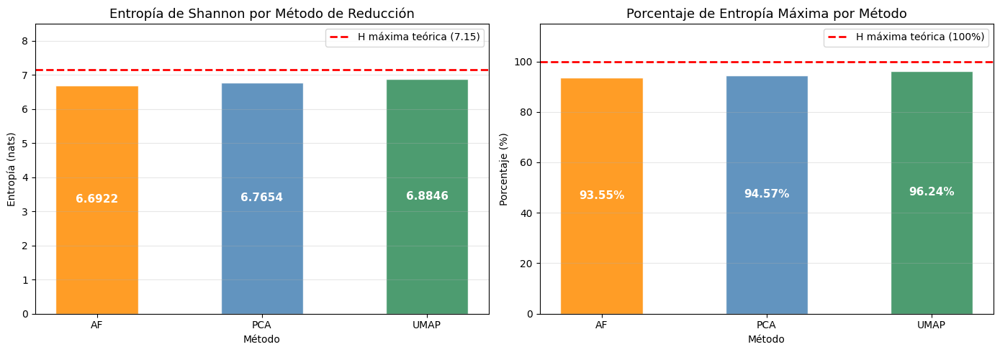

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ENTROPÍA DE SHANNON — COMPARACIÓN DE MÉTODOS DE REDUCCIÓN
# ═══════════════════════════════════════════════════════════════════════════

def entropia_shannon(vec):
    """
    Calcula la entropía de Shannon de un vector de valores.
    Normaliza los valores absolutos para obtener una distribución
    de probabilidad y calcula H = -sum(p * log(p)).

    Parámetros:
    -----------
    vec : vector de valores (componentes, factores o proyecciones)

    Retorna:
    --------
    valor de entropía (float)
    """
    p = np.abs(vec) / np.sum(np.abs(vec))
    p = p[p > 0]  # Excluir ceros para evitar log(0)
    return -np.sum(p * np.log(p))


# ── Entropía máxima teórica ────────────────────────────────────────────────
# H_max = log(N) es el techo teórico de entropía para N muestras.
# No depende de los métodos de reducción sino del tamaño del conjunto
# de prueba. Se usa como referencia para expresar cada entropía como
# porcentaje e interpretar qué tan cerca está cada método del máximo posible.
N     = X_test_af.shape[0]
H_max = np.log(N)
print(f"Número de muestras de prueba         : {N}")
print(f"Entropía máxima teórica H_max=log({N}) : {H_max:.4f}")
print(f"(Techo teórico independiente de los métodos de reducción)")

# ── Representaciones reducidas estandarizadas ─────────────────────────────
# Se estandariza cada representación y se promedia por muestra para obtener
# un vector resumen que capture la activación global de cada punto en el
# espacio reducido.
rep_af   = np.mean((X_test_af   - X_test_af.mean(axis=0))   / X_test_af.std(axis=0),   axis=1)
rep_pca  = np.mean((X_test_pca  - X_test_pca.mean(axis=0))  / X_test_pca.std(axis=0),  axis=1)
rep_umap = np.mean((X_test_umap - X_test_umap.mean(axis=0)) / X_test_umap.std(axis=0), axis=1)

# ── Cálculo de entropías ───────────────────────────────────────────────────
H_af   = entropia_shannon(rep_af)
H_pca  = entropia_shannon(rep_pca)
H_umap = entropia_shannon(rep_umap)

pct_af   = round((H_af   / H_max) * 100, 2)
pct_pca  = round((H_pca  / H_max) * 100, 2)
pct_umap = round((H_umap / H_max) * 100, 2)

# ── Reporte de resultados ──────────────────────────────────────────────────
print("\n" + "═"*62)
print("  ENTROPÍA DE SHANNON — MÉTODOS DE REDUCCIÓN")
print("═"*62)
print(f"  {'Método':<10} {'Entropía':>12} {'% de H_max':>12}")
print("─"*62)
print(f"  {'AF':<10} {H_af:>12.4f} {pct_af:>11.2f}%")
print(f"  {'PCA':<10} {H_pca:>12.4f} {pct_pca:>11.2f}%")
print(f"  {'UMAP':<10} {H_umap:>12.4f} {pct_umap:>11.2f}%")
print("─"*62)
print(f"  H_max (referencia teórica) : {H_max:.4f} (100%)")
print("═"*62)
print("\n  Interpretación:")
print(f"  Cada porcentaje indica qué tan cerca está cada método")
print(f"  de la diversidad informativa máxima posible ({H_max:.4f}).")
print(f"  Un porcentaje más alto significa que el método preservó")
print(f"  mayor variedad de información al reducir las dimensiones.")

# Método con mayor entropía
metodos = {'AF': H_af, 'PCA': H_pca, 'UMAP': H_umap}
mejor   = max(metodos, key=metodos.get)
print(f"\n  📌 Mayor diversidad informativa: {mejor} "
      f"({metodos[mejor]:.4f} — {round(metodos[mejor]/H_max*100,2)}% de H_max)")

# ── Gráfica comparativa ────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

metodos_nombres = ['AF', 'PCA', 'UMAP']
entropias       = [H_af, H_pca, H_umap]
porcentajes     = [pct_af, pct_pca, pct_umap]
colores         = ['darkorange', 'steelblue', 'seagreen']

# Gráfica 1: Valores absolutos de entropía
bars1 = axes[0].bar(metodos_nombres, entropias, color=colores,
                    alpha=0.85, edgecolor='white', width=0.5)
axes[0].axhline(y=H_max, color='red', linestyle='--',
                linewidth=2, label=f'H máxima teórica ({H_max:.2f})')
axes[0].set_title('Entropía de Shannon por Método de Reducción', fontsize=13)
axes[0].set_ylabel('Entropía (nats)')
axes[0].set_xlabel('Método')
axes[0].set_ylim(0, 8.5)
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis='y')

# Etiquetas centradas dentro de cada barra
for bar, val in zip(bars1, entropias):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height()/2,
                 f'{val:.4f}', ha='center', va='center',
                 fontsize=11, fontweight='bold', color='white')

# Gráfica 2: Porcentaje respecto a H máxima
bars2 = axes[1].bar(metodos_nombres, porcentajes, color=colores,
                    alpha=0.85, edgecolor='white', width=0.5)
axes[1].axhline(y=100, color='red', linestyle='--',
                linewidth=2, label='H máxima teórica (100%)')
axes[1].set_title('Porcentaje de Entropía Máxima por Método', fontsize=13)
axes[1].set_ylabel('Porcentaje (%)')
axes[1].set_xlabel('Método')
axes[1].set_ylim(0, 115)
axes[1].legend()
axes[1].grid(True, alpha=0.3, axis='y')

# Etiquetas centradas dentro de cada barra
for bar, val in zip(bars2, porcentajes):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height()/2,
                 f'{val}%', ha='center', va='center',
                 fontsize=11, fontweight='bold', color='white')

plt.tight_layout()
plt.show()

## Modelos presentados en el documento

###Smote para balanceo de datos

In [ ]:
sm = SMOTE(random_state=42)

X_train_pca_sm, y_train_pca_sm = sm.fit_resample(X_train_pca, y_train)
X_train_af_sm, y_train_af_sm = sm.fit_resample(X_train_af, y_train)
X_train_umap_sm, y_train_umap_sm = sm.fit_resample(X_train_umap, y_train)

In [ ]:
print("Distribución original:", np.bincount(y_train))
print("Distribución SMOTE:", np.bincount(y_train_pca_sm))

Distribución original: [ 213  234 1286  227  103  186 2298  566]
Distribución SMOTE: [2298 2298 2298 2298 2298 2298 2298 2298]


### Regresión Logística

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# MODELO 1: REGRESIÓN LOGÍSTICA
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_logreg(X_train, y_train, X_test, y_test, balanceado=False):
    """
    Entrena y evalúa un modelo de Regresión Logística.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    balanceado : si True usa class_weight='balanced', si False no pondera clases

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = LogisticRegression(
        class_weight='balanced' if balanceado else None,
        C=0.1,              # Regularización para evitar sobreajuste
        max_iter=5000,      # Alto para garantizar convergencia
        random_state=42,
        solver='saga',      # Más eficiente para multiclase con muchas muestras
        multi_class='multinomial',  # Apropiado para 8 clases
        n_jobs=-1
    )

    inicio  = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def reportar_logreg(resultados_por_dataset, y_test, encoder,
                    condicion="SIN BALANCE", color_mapa='Blues'):
    """
    Genera reporte de clasificación y matriz de confusión para cada
    representación reducida evaluada.

    Parámetros:
    -----------
    resultados_por_dataset : diccionario con resultados por reducción
    y_test                 : etiquetas reales de prueba
    encoder                : LabelEncoder con nombres de clases
    condicion              : texto descriptivo de la condición de balanceo
    color_mapa             : color del mapa de la matriz de confusión
    """
    clases_nombres = encoder.classes_

    print(f"\n{'='*70}")
    print(f"  REGRESIÓN LOGÍSTICA [{condicion}]")
    print(f"{'='*70}")

    for nombre, res in resultados_por_dataset.items():
        print(f"\n>>> {nombre}")
        print(f"    Accuracy : {res['accuracy']:.4f}")
        print(f"    Tiempo   : {res['tiempo']:.4f}s")
        print(f"\n--- Reporte de clasificación ---")
        print(classification_report(
            y_test, res['y_pred'],
            target_names=clases_nombres,
            zero_division=0
        ))

        # Matriz de confusión
        fig, ax = plt.subplots(figsize=(8, 6))
        cm   = confusion_matrix(y_test, res['y_pred'])
        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=clases_nombres
        )
        disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
        ax.set_xlabel('Predicción')
        ax.set_ylabel('Real')
        plt.title(f'Regresión Logística [{condicion}]\nDatos: {nombre}')
        plt.tight_layout()
        plt.show()


In [ ]:
# ── Definición de datasets por condición de balanceo ──────────────────────
# Tres diccionarios independientes para cada condición. SMOTE usa los datos
# ya balanceados sintéticamente. Class weight usa los datos originales pero
# el modelo ajusta los pesos internamente.

datasets_sin_balance = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,     X_test_pca,  y_train),
    f"AF   ({n_factores} fact.)"        : (X_train_af,      X_test_af,   y_train),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap,    X_test_umap, y_train)
}

datasets_smote = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca_sm,  X_test_pca,  y_train_pca_sm),
    f"AF   ({n_factores} fact.)"        : (X_train_af_sm,   X_test_af,   y_train_af_sm),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap_sm, X_test_umap, y_train_umap_sm)
}

datasets_class_weight = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,     X_test_pca,  y_train),
    f"AF   ({n_factores} fact.)"        : (X_train_af,      X_test_af,   y_train),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap,    X_test_umap, y_train)
}

⏳ Entrenando Regresión Logística sin balanceo...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



  REGRESIÓN LOGÍSTICA [SIN BALANCE]

>>> PCA  (30 comp.)
    Accuracy : 0.4441
    Tiempo   : 10.7656s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.50      0.02      0.04        53
           C       0.36      0.27      0.31        59
           D       0.34      0.57      0.43       322
           G       0.25      0.05      0.09        57
           H       0.00      0.00      0.00        25
           M       0.48      0.63      0.55        46
           N       0.54      0.59      0.56       575
           O       0.00      0.00      0.00       142

    accuracy                           0.44      1279
   macro avg       0.31      0.27      0.25      1279
weighted avg       0.40      0.44      0.40      1279



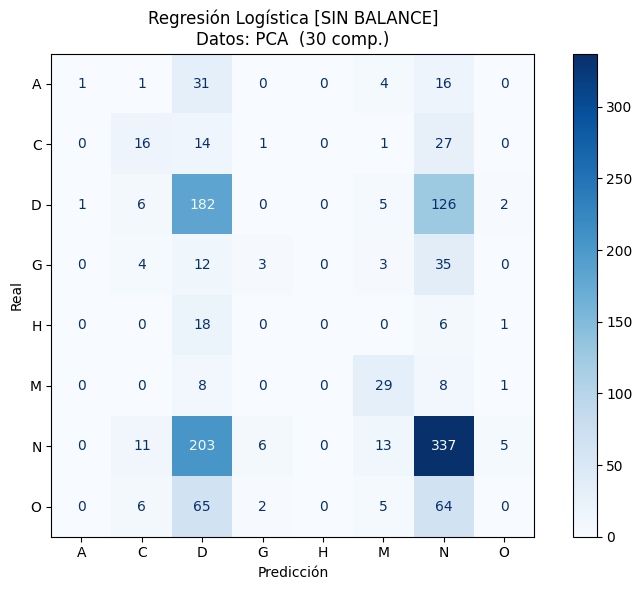


>>> AF   (30 fact.)
    Accuracy : 0.4558
    Tiempo   : 2.6586s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.25      0.08      0.13        59
           D       0.29      0.12      0.17       322
           G       0.22      0.04      0.06        57
           H       0.00      0.00      0.00        25
           M       0.66      0.63      0.64        46
           N       0.48      0.88      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.46      1279
   macro avg       0.24      0.22      0.20      1279
weighted avg       0.33      0.46      0.35      1279



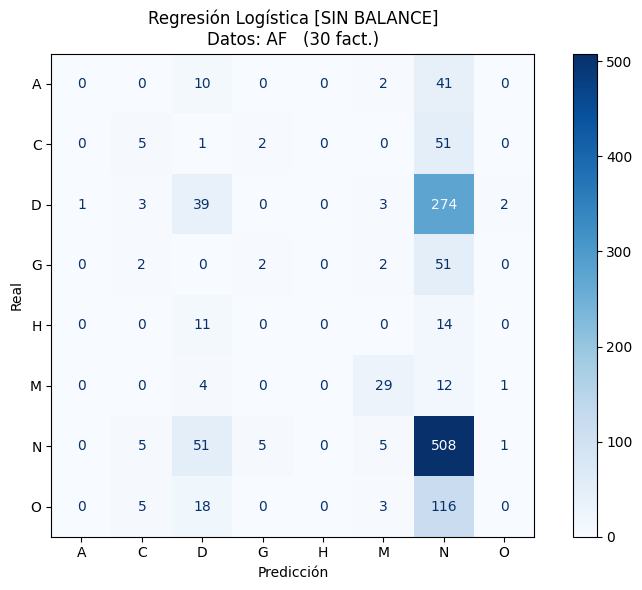


>>> UMAP (30 comp.)
    Accuracy : 0.4511
    Tiempo   : 0.2971s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.33      0.03      0.06       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.45      0.99      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.45      1279
   macro avg       0.10      0.13      0.08      1279
weighted avg       0.29      0.45      0.29      1279



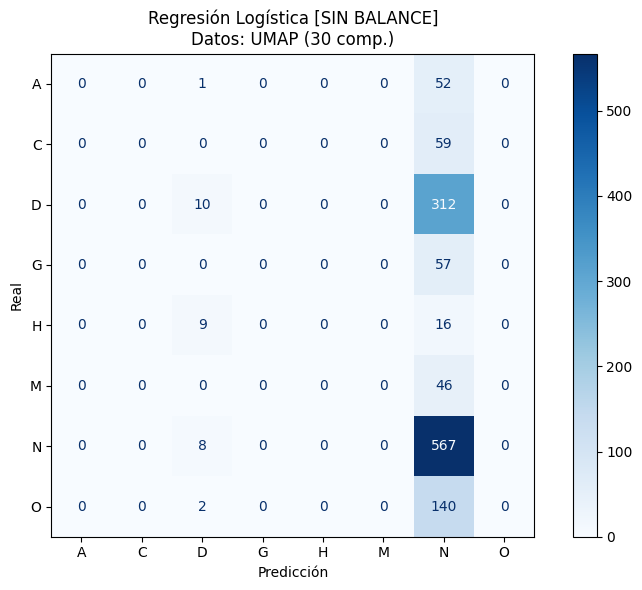

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("⏳ Entrenando Regresión Logística sin balanceo...")
resultados_sin_balance = {}
for nombre, (X_tr, X_te, y_tr) in datasets_sin_balance.items():
    resultados_sin_balance[nombre] = entrenar_logreg(
        X_tr, y_tr, X_te, y_test, balanceado=False
    )
reportar_logreg(resultados_sin_balance, y_test, encoder,
                condicion="SIN BALANCE", color_mapa='Blues')


⏳ Entrenando Regresión Logística con balanceo SMOTE...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid t


  REGRESIÓN LOGÍSTICA [BALANCEADO (SMOTE)]

>>> PCA  (30 comp.)
    Accuracy : 0.1892
    Tiempo   : 115.2351s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.07      0.19      0.10        53
           C       0.19      0.61      0.29        59
           D       0.37      0.12      0.19       322
           G       0.13      0.49      0.20        57
           H       0.05      0.52      0.10        25
           M       0.21      0.70      0.32        46
           N       0.58      0.11      0.19       575
           O       0.17      0.13      0.15       142

    accuracy                           0.19      1279
   macro avg       0.22      0.36      0.19      1279
weighted avg       0.40      0.19      0.19      1279



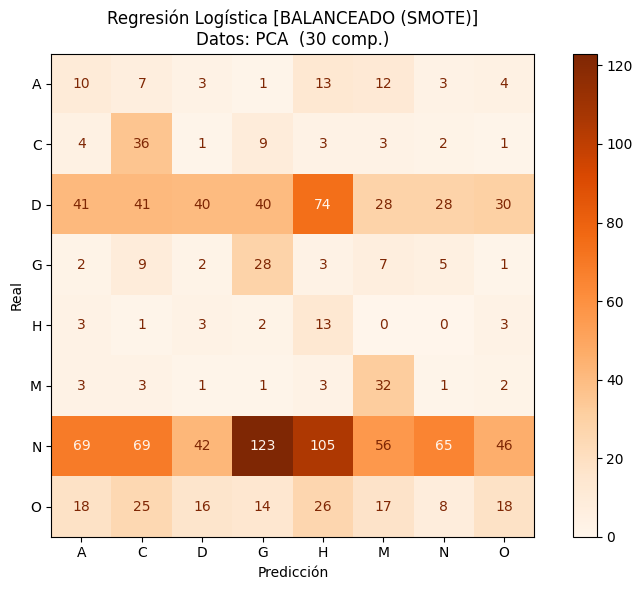


>>> AF   (30 fact.)
    Accuracy : 0.2095
    Tiempo   : 11.6693s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.13      0.07        53
           C       0.19      0.58      0.29        59
           D       0.35      0.11      0.17       322
           G       0.12      0.46      0.20        57
           H       0.06      0.52      0.11        25
           M       0.25      0.72      0.37        46
           N       0.60      0.16      0.26       575
           O       0.19      0.18      0.19       142

    accuracy                           0.21      1279
   macro avg       0.23      0.36      0.20      1279
weighted avg       0.41      0.21      0.22      1279



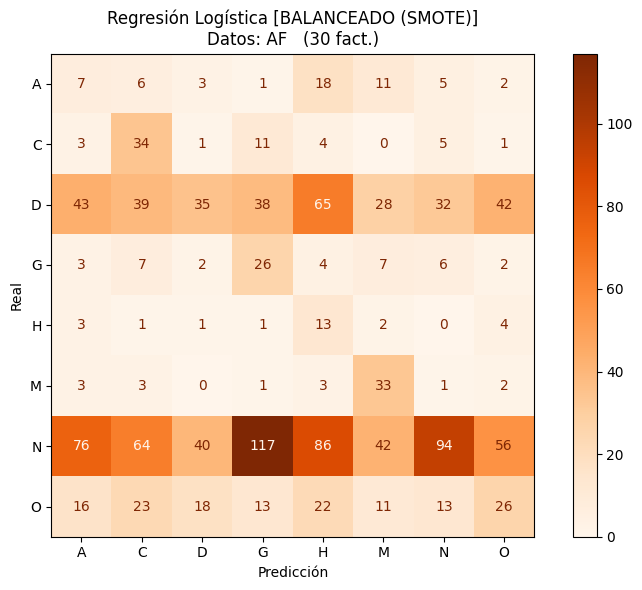


>>> UMAP (30 comp.)
    Accuracy : 0.1314
    Tiempo   : 0.8362s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.02      0.02      0.02        53
           C       0.09      0.27      0.13        59
           D       0.52      0.03      0.06       322
           G       0.10      0.60      0.18        57
           H       0.05      0.44      0.10        25
           M       0.06      0.39      0.10        46
           N       0.52      0.12      0.19       575
           O       0.15      0.07      0.10       142

    accuracy                           0.13      1279
   macro avg       0.19      0.24      0.11      1279
weighted avg       0.40      0.13      0.13      1279



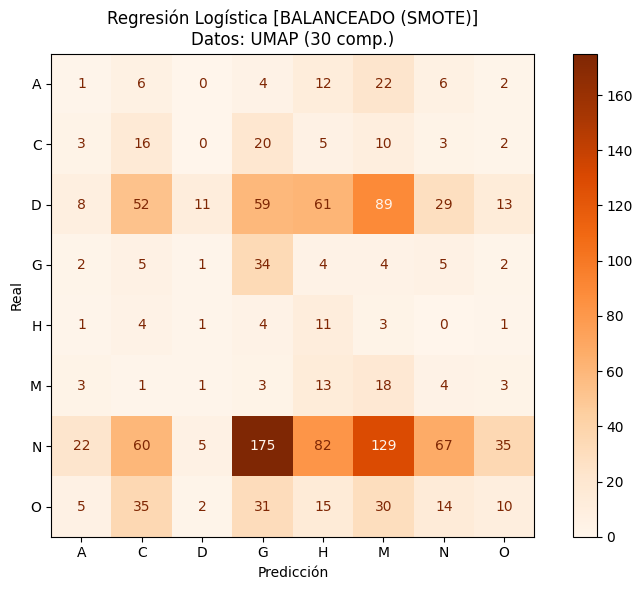

In [ ]:
# ── Ejecución con balanceo SMOTE ───────────────────────────────────────────
# SMOTE genera muestras sintéticas equilibrando el conjunto de entrenamiento.
# Es especialmente útil cuando el desbalance es severo como en este caso
# (N=2873 imágenes vs H=128 imágenes).
print("\n⏳ Entrenando Regresión Logística con balanceo SMOTE...")
resultados_smote = {}
for nombre, (X_tr, X_te, y_tr) in datasets_smote.items():
    resultados_smote[nombre] = entrenar_logreg(
        X_tr, y_tr, X_te, y_test, balanceado=False
    )
reportar_logreg(resultados_smote, y_test, encoder,
                condicion="BALANCEADO (SMOTE)", color_mapa='Oranges')


⏳ Entrenando Regresión Logística con class weight...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



  REGRESIÓN LOGÍSTICA [BALANCEADO (Class Weight)]

>>> PCA  (30 comp.)
    Accuracy : 0.1548
    Tiempo   : 9.8719s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.06      0.15      0.09        53
           C       0.19      0.63      0.29        59
           D       0.37      0.13      0.19       322
           G       0.12      0.54      0.20        57
           H       0.05      0.48      0.10        25
           M       0.15      0.76      0.26        46
           N       0.65      0.03      0.06       575
           O       0.16      0.12      0.14       142

    accuracy                           0.15      1279
   macro avg       0.22      0.35      0.16      1279
weighted avg       0.43      0.15      0.13      1279



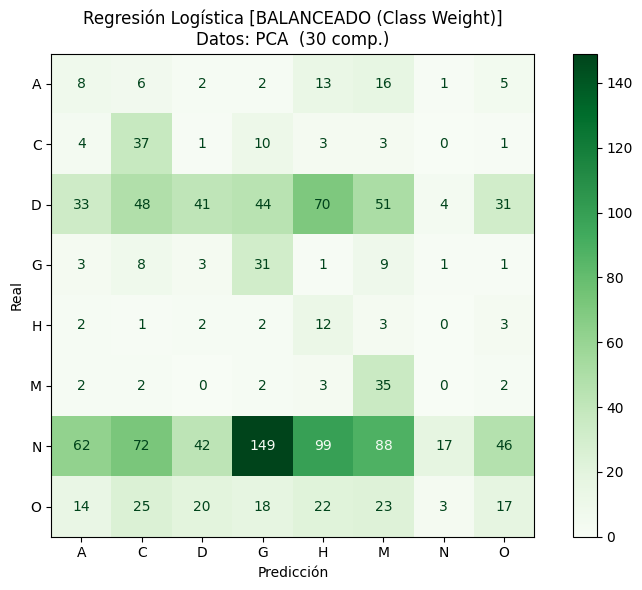


>>> AF   (30 fact.)
    Accuracy : 0.2103
    Tiempo   : 2.9447s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.06      0.15      0.08        53
           C       0.18      0.51      0.27        59
           D       0.34      0.12      0.18       322
           G       0.11      0.47      0.18        57
           H       0.06      0.52      0.11        25
           M       0.26      0.74      0.38        46
           N       0.60      0.17      0.26       575
           O       0.17      0.15      0.16       142

    accuracy                           0.21      1279
   macro avg       0.22      0.35      0.20      1279
weighted avg       0.40      0.21      0.22      1279



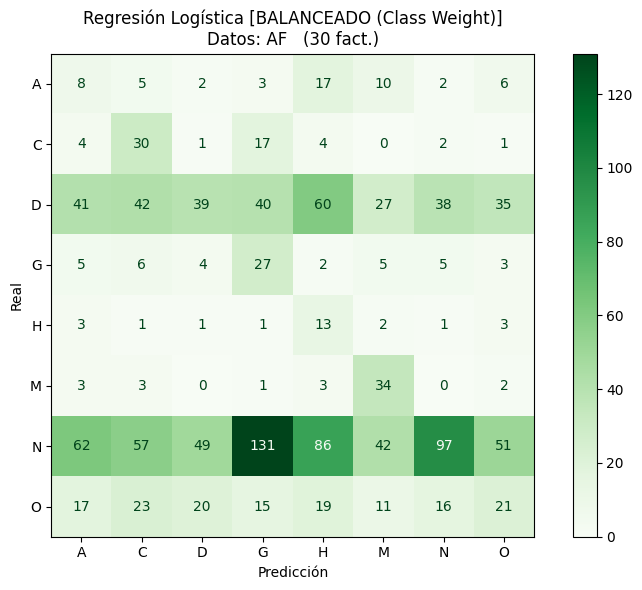


>>> UMAP (30 comp.)
    Accuracy : 0.1509
    Tiempo   : 0.2264s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.06      0.05        53
           C       0.10      0.27      0.15        59
           D       0.29      0.02      0.05       322
           G       0.11      0.67      0.19        57
           H       0.10      0.36      0.16        25
           M       0.06      0.39      0.10        46
           N       0.54      0.15      0.23       575
           O       0.12      0.11      0.11       142

    accuracy                           0.15      1279
   macro avg       0.17      0.25      0.13      1279
weighted avg       0.34      0.15      0.15      1279



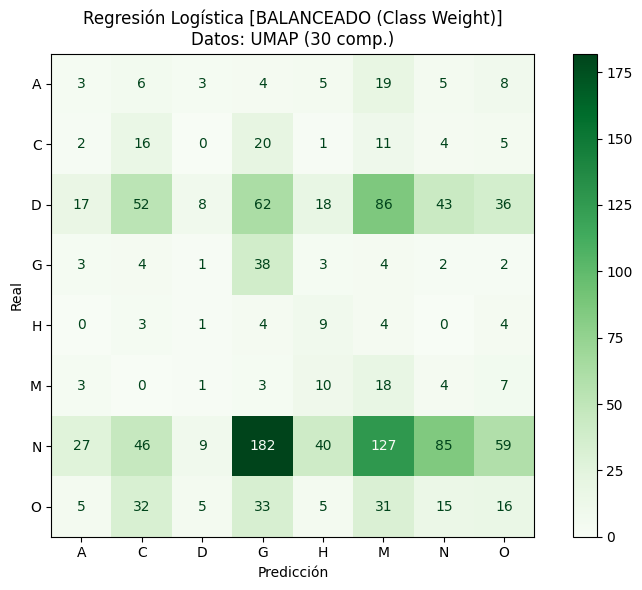

In [ ]:
# ── Ejecución con balanceo class weight ───────────────────────────────────
# class_weight='balanced' ajusta los pesos de cada clase inversamente
# proporcional a su frecuencia. Es una alternativa más ligera a SMOTE
# que no genera datos sintéticos sino que penaliza más los errores
# en clases minoritarias durante el entrenamiento.
print("\n⏳ Entrenando Regresión Logística con class weight...")
resultados_class_weight = {}
for nombre, (X_tr, X_te, y_tr) in datasets_class_weight.items():
    resultados_class_weight[nombre] = entrenar_logreg(
        X_tr, y_tr, X_te, y_test, balanceado=True
    )
reportar_logreg(resultados_class_weight, y_test, encoder,
                condicion="BALANCEADO (Class Weight)", color_mapa='Greens')

In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*75)
print("  RESUMEN COMPARATIVO — REGRESIÓN LOGÍSTICA")
print("═"*75)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'SMOTE':>12} "
      f"{'Class Weight':>14}")
print("─"*75)

for nombre in datasets_sin_balance.keys():
    acc_sin = resultados_sin_balance[nombre]['accuracy']
    acc_sm  = resultados_smote[nombre]['accuracy']
    acc_cw  = resultados_class_weight[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_sm:>12.4f} {acc_cw:>14.4f}")

print("═"*75)


═══════════════════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — REGRESIÓN LOGÍSTICA
═══════════════════════════════════════════════════════════════════════════
  Dataset                    Sin balance        SMOTE   Class Weight
───────────────────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4441       0.1892         0.1548
  AF   (30 fact.)                 0.4558       0.2095         0.2103
  UMAP (30 comp.)                 0.4511       0.1314         0.1509
═══════════════════════════════════════════════════════════════════════════


### Soporte vectorial (SVC)

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# MÁQUINAS DE SOPORTE VECTORIAL (SVM)
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_svm(X_train, y_train, X_test, y_test,
                 kernel='rbf', balanceado=False):
    """
    Entrena y evalúa un modelo SVM con el kernel especificado.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    kernel     : tipo de kernel ('linear', 'rbf', 'poly', 'sigmoid')
    balanceado : si True usa class_weight='balanced'

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo, predicciones e iteraciones
    """
    limite_iter = 10000

    modelo = SVC(
        kernel=kernel,
        class_weight='balanced' if balanceado else None,
        C=10,               # Mayor flexibilidad en la frontera de decisión
        gamma='scale',      # Escala automática según número de características
        degree=3,           # Solo aplica para kernel poly
        coef0=1.0,          # Solo aplica para kernel poly y sigmoid
        cache_size=1000,    # Memoria caché en MB para acelerar el entrenamiento
        max_iter=limite_iter,
        random_state=42
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    # Verificación de convergencia
    if np.max(modelo.n_iter_) >= limite_iter:
        print(f"    ⚠️ Kernel {kernel.upper()}: se alcanzó el límite de "
              f"iteraciones ({limite_iter}). Considera aumentar max_iter.")

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred,
        'n_iter'  : modelo.n_iter_
    }


def reportar_svm(resultados_por_dataset, y_test, encoder,
                 condicion="SIN BALANCE", color_mapa='Blues'):
    """
    Genera reporte de clasificación y matriz de confusión para cada
    combinación de reducción dimensional y kernel evaluada.

    Parámetros:
    -----------
    resultados_por_dataset : diccionario {dataset: {kernel: resultado}}
    y_test                 : etiquetas reales de prueba
    encoder                : LabelEncoder con nombres de clases
    condicion              : texto descriptivo de la condición de balanceo
    color_mapa             : color del mapa de la matriz de confusión
    """
    clases_nombres = encoder.classes_

    print(f"\n{'='*70}")
    print(f"  SVM [{condicion}]")
    print(f"{'='*70}")

    for nombre_dataset, resultados_kernels in resultados_por_dataset.items():
        print(f"\n{'─'*50}")
        print(f"  Datos: {nombre_dataset}")
        print(f"{'─'*50}")

        for kernel, res in resultados_kernels.items():
            print(f"\n  Kernel: {kernel.upper()}")
            print(f"  Accuracy : {res['accuracy']:.4f}")
            print(f"  Tiempo   : {res['tiempo']:.4f}s")
            print(f"\n--- Reporte de clasificación ---")
            print(classification_report(
                y_test, res['y_pred'],
                target_names=clases_nombres,
                zero_division=0
            ))

            # Matriz de confusión
            fig, ax = plt.subplots(figsize=(8, 6))
            cm   = confusion_matrix(y_test, res['y_pred'])
            disp = ConfusionMatrixDisplay(
                confusion_matrix=cm,
                display_labels=clases_nombres
            )
            disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
            ax.set_xlabel('Predicción')
            ax.set_ylabel('Real')
            plt.title(f'SVM Kernel {kernel.upper()} [{condicion}]\n'
                      f'Datos: {nombre_dataset}')
            plt.tight_layout()
            plt.show()

In [ ]:
# ── Definición de datasets por condición de balanceo ──────────────────────
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

datasets_sin_balance = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,     X_test_pca,  y_train),
    f"AF   ({n_factores} fact.)"        : (X_train_af,      X_test_af,   y_train),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap,    X_test_umap, y_train)
}

datasets_smote = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca_sm,  X_test_pca,  y_train_pca_sm),
    f"AF   ({n_factores} fact.)"        : (X_train_af_sm,   X_test_af,   y_train_af_sm),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap_sm, X_test_umap, y_train_umap_sm)
}

datasets_class_weight = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,     X_test_pca,  y_train),
    f"AF   ({n_factores} fact.)"        : (X_train_af,      X_test_af,   y_train),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap,    X_test_umap, y_train)
}

In [ ]:
def correr_svm_por_condicion(datasets, kernels, y_test, encoder,
                              condicion, color_mapa, balanceado=False):
    """
    Corre SVM para todos los datasets y kernels bajo una condición
    de balanceo específica.
    """
    print(f"\n⏳ Entrenando SVM [{condicion}]...")
    resultados = {}

    for nombre, (X_tr, X_te, y_tr) in datasets.items():
        resultados[nombre] = {}
        for kernel in kernels:
            print(f"  → {nombre} | Kernel: {kernel.upper()}...", end="")
            resultados[nombre][kernel] = entrenar_svm(
                X_tr, y_tr, X_te, y_test,
                kernel=kernel,
                balanceado=balanceado
            )
            print(f" Accuracy: {resultados[nombre][kernel]['accuracy']:.4f}")

    reportar_svm(resultados, y_test, encoder,
                 condicion=condicion, color_mapa=color_mapa)
    return resultados


⏳ Entrenando SVM [SIN BALANCE]...
  → PCA  (30 comp.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.2729
  → PCA  (30 comp.) | Kernel: RBF...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel RBF: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4855
  → PCA  (30 comp.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4613
  → PCA  (30 comp.) | Kernel: SIGMOID... Accuracy: 0.3573
  → AF   (30 fact.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.2721
  → AF   (30 fact.) | Kernel: RBF...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel RBF: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4754
  → AF   (30 fact.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4394
  → AF   (30 fact.) | Kernel: SIGMOID... Accuracy: 0.3229
  → UMAP (30 comp.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4511
  → UMAP (30 comp.) | Kernel: RBF...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel RBF: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4527
  → UMAP (30 comp.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.4550
  → UMAP (30 comp.) | Kernel: SIGMOID... Accuracy: 0.3057

  SVM [SIN BALANCE]

──────────────────────────────────────────────────
  Datos: PCA  (30 comp.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.2729
  Tiempo   : 3.7671s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.04      0.08      0.05        53
           C       0.10      0.25      0.14        59
           D       0.21      0.14      0.17       322
           G       0.10      0.09      0.09        57
           H       0.06      0.16      0.09        25
           M       0.21      0.28      0.24        46
           N       0.51      0.43      0.47       575
           O       0.10      0.11      0.10       142

    accuracy                           0.27      1279
   macro avg       0.17      0.19      0.17   

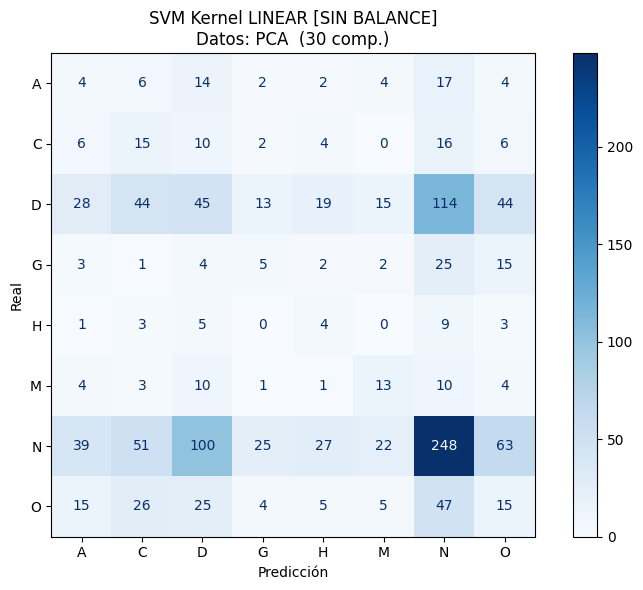


  Kernel: RBF
  Accuracy : 0.4855
  Tiempo   : 2.9659s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.39      0.15      0.22        59
           D       0.39      0.21      0.27       322
           G       0.00      0.00      0.00        57
           H       1.00      0.08      0.15        25
           M       0.67      0.61      0.64        46
           N       0.50      0.89      0.64       575
           O       0.14      0.01      0.03       142

    accuracy                           0.49      1279
   macro avg       0.39      0.24      0.24      1279
weighted avg       0.40      0.49      0.40      1279



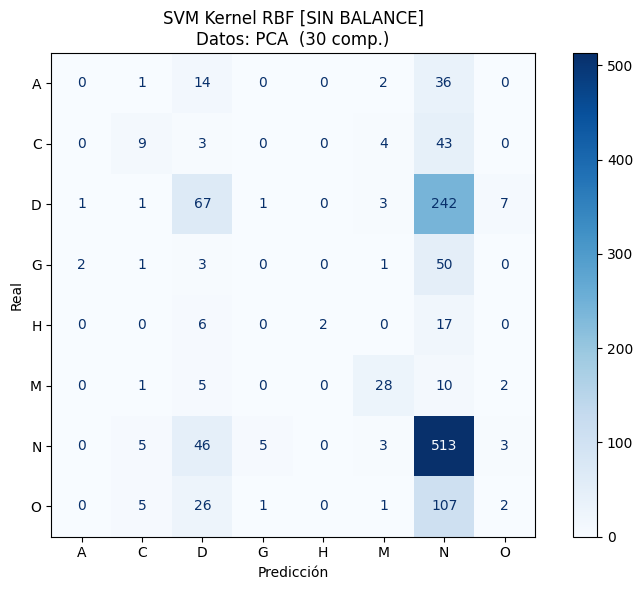


  Kernel: POLY
  Accuracy : 0.4613
  Tiempo   : 3.3063s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.21      0.06      0.09        53
           C       0.38      0.25      0.30        59
           D       0.34      0.17      0.23       322
           G       0.09      0.02      0.03        57
           H       0.20      0.04      0.07        25
           M       0.59      0.50      0.54        46
           N       0.50      0.84      0.62       575
           O       0.22      0.04      0.07       142

    accuracy                           0.46      1279
   macro avg       0.32      0.24      0.24      1279
weighted avg       0.39      0.46      0.39      1279



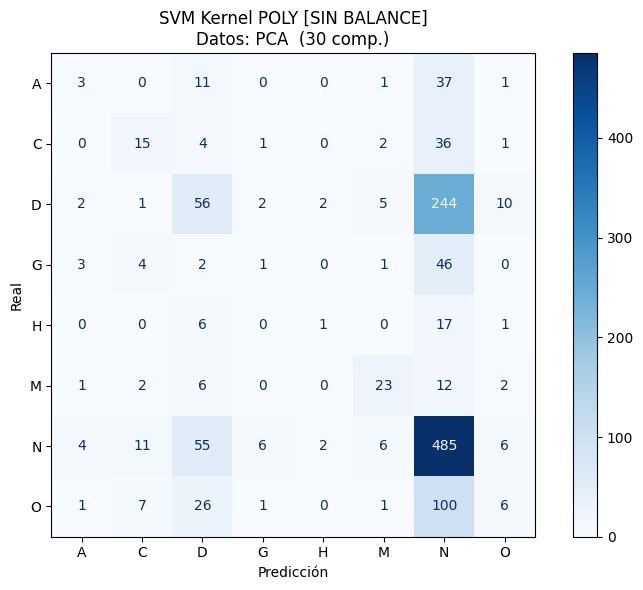


  Kernel: SIGMOID
  Accuracy : 0.3573
  Tiempo   : 1.8442s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.03      0.02      0.02        53
           C       0.00      0.00      0.00        59
           D       0.26      0.10      0.14       322
           G       0.00      0.00      0.00        57
           H       0.03      0.08      0.04        25
           M       0.00      0.00      0.00        46
           N       0.48      0.68      0.57       575
           O       0.13      0.22      0.16       142

    accuracy                           0.36      1279
   macro avg       0.12      0.14      0.12      1279
weighted avg       0.30      0.36      0.31      1279



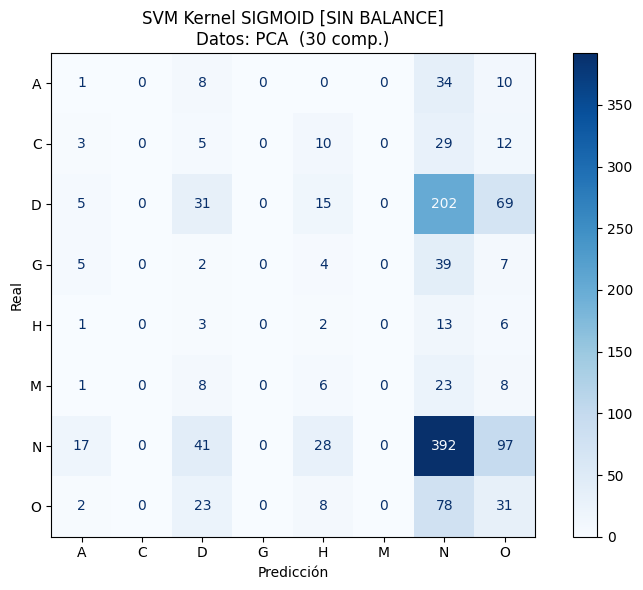


──────────────────────────────────────────────────
  Datos: AF   (30 fact.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.2721
  Tiempo   : 3.8902s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.04      0.04        53
           C       0.19      0.24      0.21        59
           D       0.22      0.17      0.19       322
           G       0.14      0.12      0.13        57
           H       0.00      0.00      0.00        25
           M       0.49      0.50      0.49        46
           N       0.47      0.35      0.40       575
           O       0.12      0.33      0.18       142

    accuracy                           0.27      1279
   macro avg       0.21      0.22      0.21      1279
weighted avg       0.31      0.27      0.28      1279



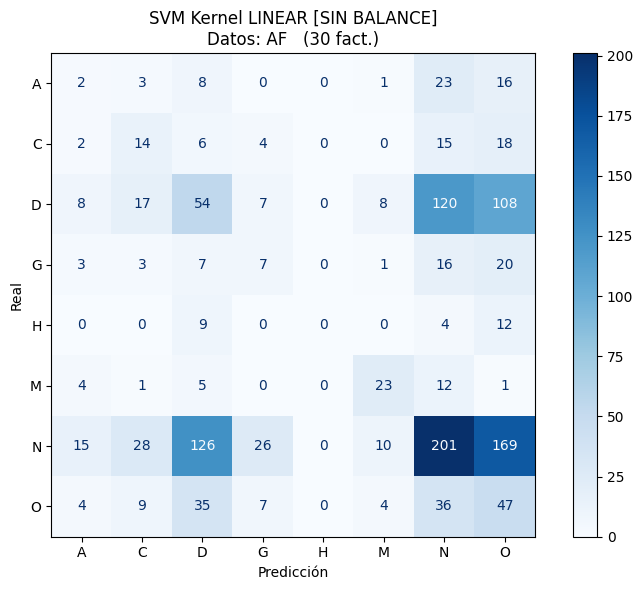


  Kernel: RBF
  Accuracy : 0.4754
  Tiempo   : 2.9108s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.20      0.04      0.06        53
           C       0.56      0.32      0.41        59
           D       0.38      0.26      0.31       322
           G       0.20      0.07      0.10        57
           H       0.80      0.16      0.27        25
           M       0.67      0.48      0.56        46
           N       0.50      0.81      0.62       575
           O       0.24      0.06      0.09       142

    accuracy                           0.48      1279
   macro avg       0.44      0.27      0.30      1279
weighted avg       0.43      0.48      0.42      1279



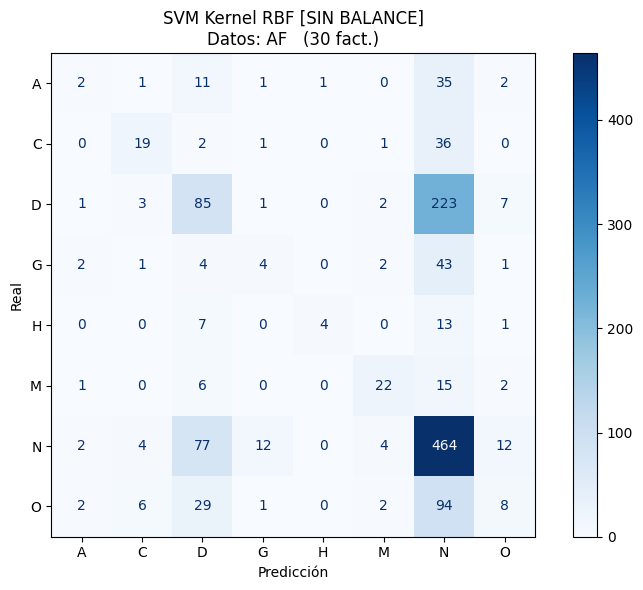


  Kernel: POLY
  Accuracy : 0.4394
  Tiempo   : 2.9327s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.11      0.08      0.09        53
           C       0.34      0.39      0.36        59
           D       0.40      0.23      0.29       322
           G       0.13      0.11      0.12        57
           H       0.17      0.12      0.14        25
           M       0.48      0.52      0.50        46
           N       0.51      0.73      0.60       575
           O       0.20      0.08      0.11       142

    accuracy                           0.44      1279
   macro avg       0.29      0.28      0.28      1279
weighted avg       0.40      0.44      0.40      1279



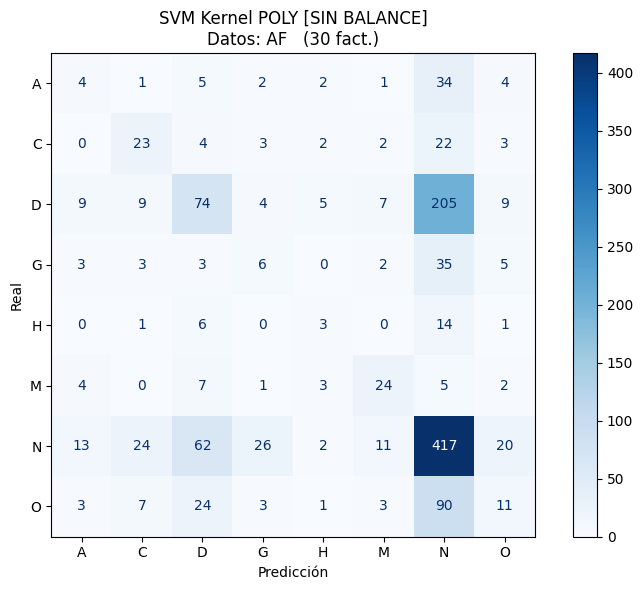


  Kernel: SIGMOID
  Accuracy : 0.3229
  Tiempo   : 1.7789s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.04      0.08      0.05        53
           C       0.09      0.05      0.06        59
           D       0.26      0.17      0.21       322
           G       0.05      0.02      0.03        57
           H       0.00      0.00      0.00        25
           M       0.13      0.24      0.17        46
           N       0.46      0.58      0.51       575
           O       0.11      0.02      0.04       142

    accuracy                           0.32      1279
   macro avg       0.14      0.15      0.13      1279
weighted avg       0.29      0.32      0.30      1279



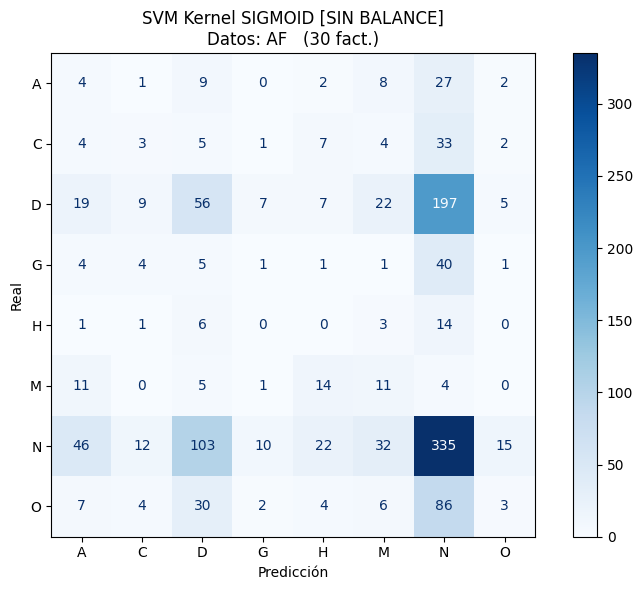


──────────────────────────────────────────────────
  Datos: UMAP (30 comp.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.4511
  Tiempo   : 3.4129s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.33      0.03      0.06       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.45      0.99      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.45      1279
   macro avg       0.10      0.13      0.08      1279
weighted avg       0.29      0.45      0.29      1279



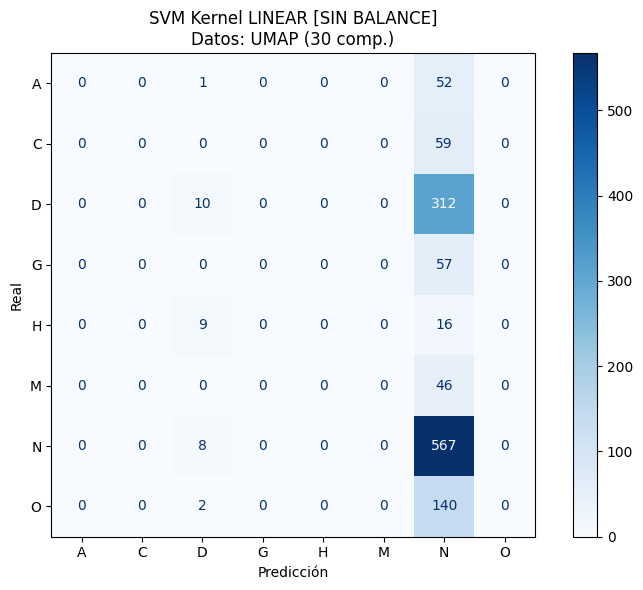


  Kernel: RBF
  Accuracy : 0.4527
  Tiempo   : 3.7820s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.38      0.05      0.08       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.46      0.98      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.45      1279
   macro avg       0.10      0.13      0.09      1279
weighted avg       0.30      0.45      0.30      1279



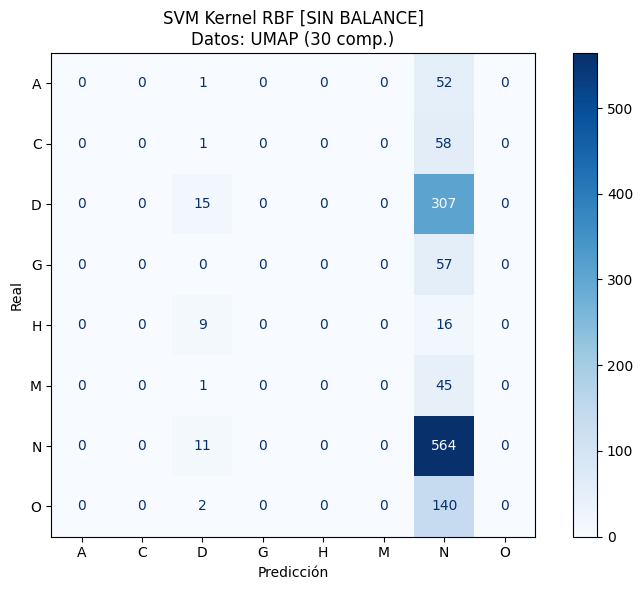


  Kernel: POLY
  Accuracy : 0.4550
  Tiempo   : 3.5996s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.67      0.07      0.12        59
           D       0.39      0.05      0.08       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.46      0.98      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.46      1279
   macro avg       0.19      0.14      0.10      1279
weighted avg       0.34      0.46      0.31      1279



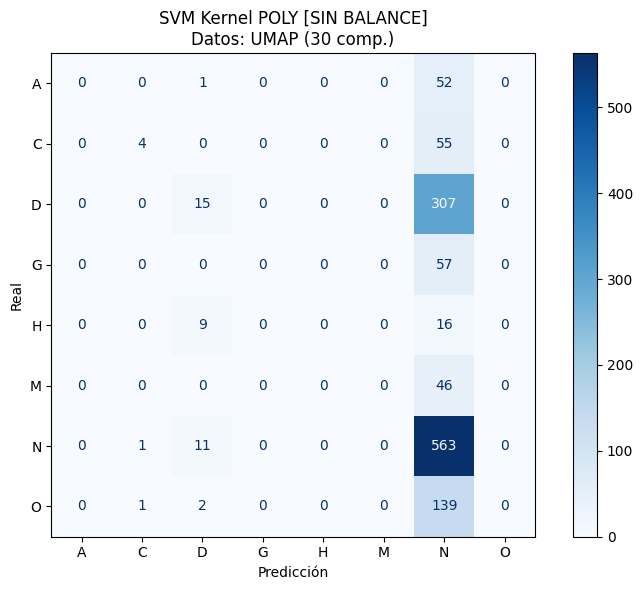


  Kernel: SIGMOID
  Accuracy : 0.3057
  Tiempo   : 2.8409s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.02      0.04      0.03        53
           C       0.75      0.05      0.10        59
           D       0.27      0.17      0.21       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.45      0.53      0.49       575
           O       0.09      0.18      0.11       142

    accuracy                           0.31      1279
   macro avg       0.20      0.12      0.12      1279
weighted avg       0.31      0.31      0.29      1279



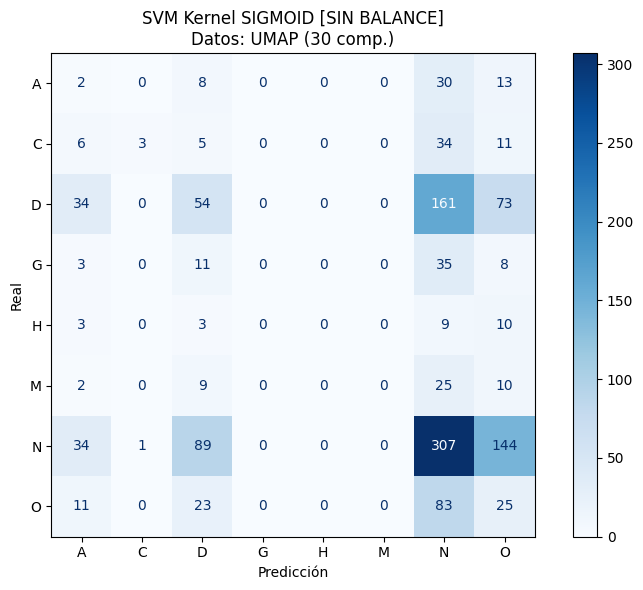


⏳ Entrenando SVM [BALANCEADO (SMOTE)]...
  → PCA  (30 comp.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.1767
  → PCA  (30 comp.) | Kernel: RBF...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel RBF: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.3041
  → PCA  (30 comp.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.3049
  → PCA  (30 comp.) | Kernel: SIGMOID... Accuracy: 0.1603
  → AF   (30 fact.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.1970
  → AF   (30 fact.) | Kernel: RBF...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel RBF: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.3831
  → AF   (30 fact.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.3589
  → AF   (30 fact.) | Kernel: SIGMOID... Accuracy: 0.1196
  → UMAP (30 comp.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.1040
  → UMAP (30 comp.) | Kernel: RBF... Accuracy: 0.1259
  → UMAP (30 comp.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.1368
  → UMAP (30 comp.) | Kernel: SIGMOID... Accuracy: 0.0453

  SVM [BALANCEADO (SMOTE)]

──────────────────────────────────────────────────
  Datos: PCA  (30 comp.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.1767
  Tiempo   : 12.2576s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.02      0.04      0.03        53
           C       0.15      0.17      0.16        59
           D       0.29      0.10      0.15       322
           G       0.12      0.28      0.16        57
           H       0.05      0.24      0.09        25
           M       0.15      0.33      0.21        46
           N       0.49      0.14      0.22       575
           O       0.13      0.45      0.20       142

    accuracy                           0.18      1279
   macro avg       0.17      0.22     

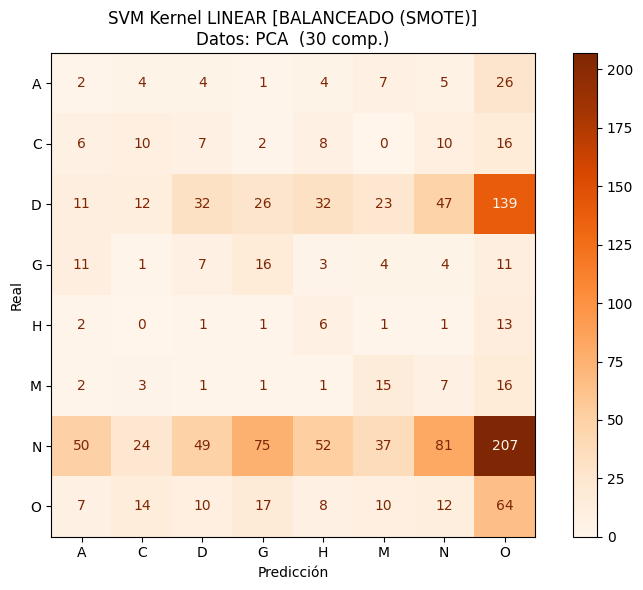


  Kernel: RBF
  Accuracy : 0.3041
  Tiempo   : 16.5493s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.10      0.25      0.14        53
           C       0.25      0.47      0.33        59
           D       0.39      0.35      0.37       322
           G       0.13      0.28      0.17        57
           H       0.10      0.36      0.15        25
           M       0.65      0.65      0.65        46
           N       0.54      0.28      0.37       575
           O       0.11      0.13      0.12       142

    accuracy                           0.30      1279
   macro avg       0.28      0.35      0.29      1279
weighted avg       0.40      0.30      0.33      1279



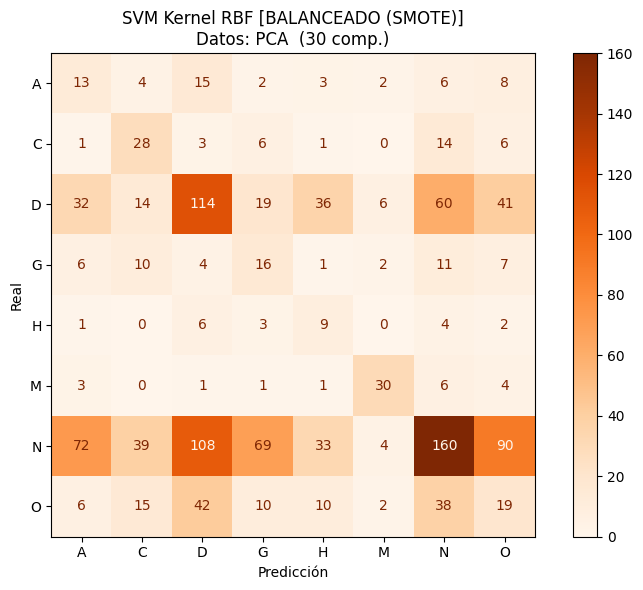


  Kernel: POLY
  Accuracy : 0.3049
  Tiempo   : 17.2688s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.26      0.14        53
           C       0.28      0.49      0.36        59
           D       0.39      0.33      0.35       322
           G       0.15      0.30      0.20        57
           H       0.09      0.36      0.14        25
           M       0.51      0.65      0.57        46
           N       0.56      0.28      0.38       575
           O       0.13      0.17      0.15       142

    accuracy                           0.30      1279
   macro avg       0.27      0.36      0.28      1279
weighted avg       0.41      0.30      0.33      1279



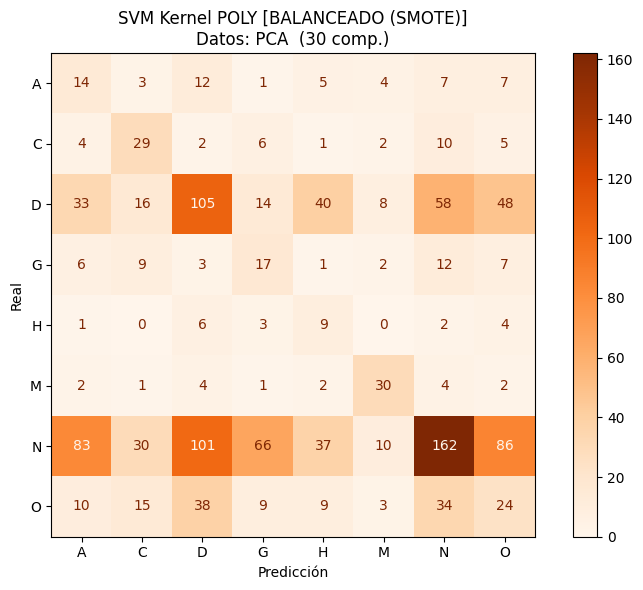


  Kernel: SIGMOID
  Accuracy : 0.1603
  Tiempo   : 25.7689s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.04      0.05        53
           C       0.03      0.02      0.02        59
           D       0.29      0.47      0.36       322
           G       0.09      0.19      0.13        57
           H       0.02      0.32      0.03        25
           M       0.16      0.09      0.11        46
           N       0.46      0.04      0.08       575
           O       0.09      0.04      0.05       142

    accuracy                           0.16      1279
   macro avg       0.15      0.15      0.10      1279
weighted avg       0.31      0.16      0.14      1279



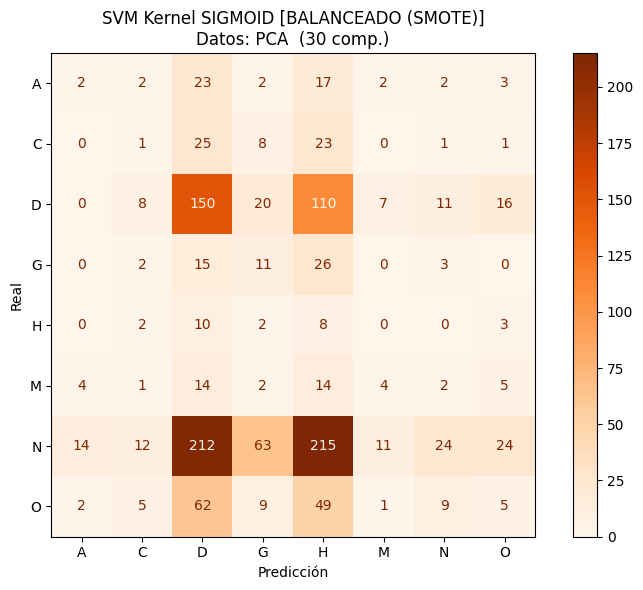


──────────────────────────────────────────────────
  Datos: AF   (30 fact.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.1970
  Tiempo   : 14.3451s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.29      0.10      0.15        59
           D       0.44      0.02      0.04       322
           G       0.12      0.09      0.10        57
           H       0.02      0.08      0.03        25
           M       0.33      0.28      0.30        46
           N       0.44      0.25      0.32       575
           O       0.11      0.54      0.18       142

    accuracy                           0.20      1279
   macro avg       0.22      0.17      0.14      1279
weighted avg       0.35      0.20      0.20      1279



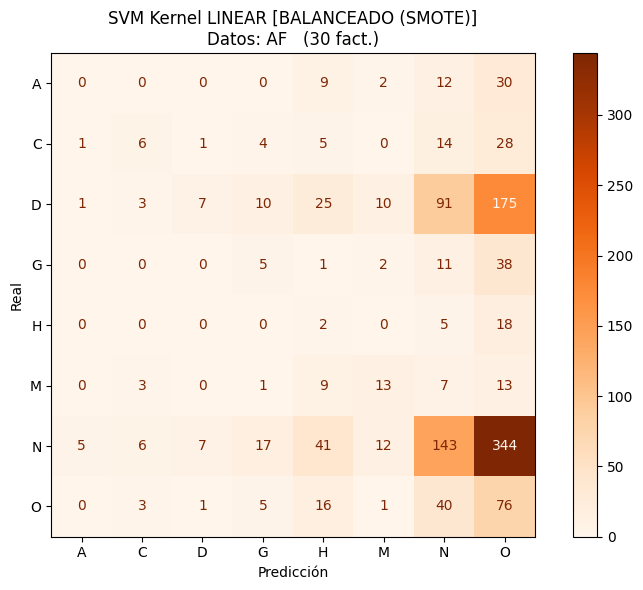


  Kernel: RBF
  Accuracy : 0.3831
  Tiempo   : 12.6331s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.11      0.17      0.13        53
           C       0.41      0.47      0.44        59
           D       0.36      0.36      0.36       322
           G       0.15      0.19      0.17        57
           H       0.18      0.24      0.20        25
           M       0.57      0.54      0.56        46
           N       0.52      0.48      0.50       575
           O       0.16      0.15      0.15       142

    accuracy                           0.38      1279
   macro avg       0.31      0.33      0.31      1279
weighted avg       0.40      0.38      0.39      1279



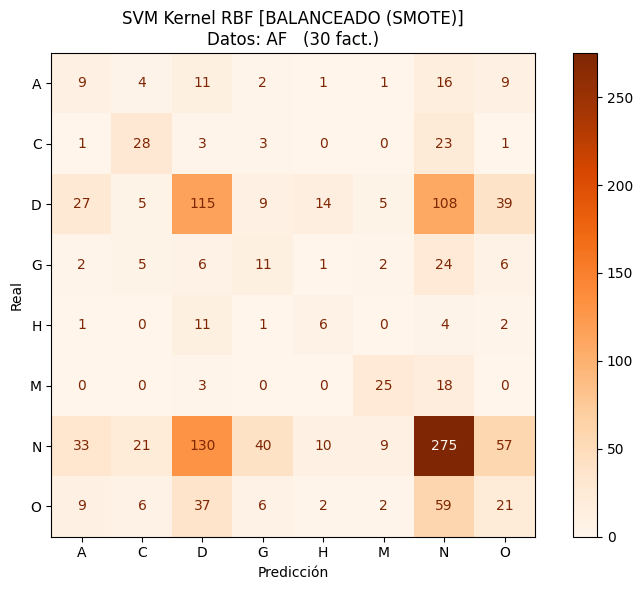


  Kernel: POLY
  Accuracy : 0.3589
  Tiempo   : 10.8563s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.11      0.21      0.15        53
           C       0.34      0.47      0.40        59
           D       0.35      0.31      0.33       322
           G       0.13      0.19      0.15        57
           H       0.23      0.32      0.27        25
           M       0.53      0.59      0.56        46
           N       0.52      0.44      0.48       575
           O       0.14      0.16      0.15       142

    accuracy                           0.36      1279
   macro avg       0.29      0.34      0.31      1279
weighted avg       0.39      0.36      0.37      1279



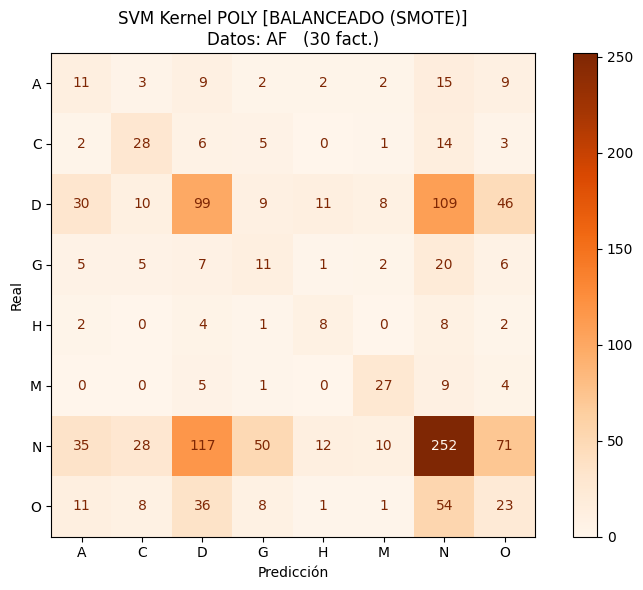


  Kernel: SIGMOID
  Accuracy : 0.1196
  Tiempo   : 24.5763s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.23      0.08        53
           C       0.14      0.39      0.20        59
           D       0.35      0.05      0.09       322
           G       0.11      0.28      0.16        57
           H       0.03      0.28      0.05        25
           M       0.07      0.41      0.12        46
           N       0.48      0.09      0.15       575
           O       0.27      0.04      0.07       142

    accuracy                           0.12      1279
   macro avg       0.19      0.22      0.12      1279
weighted avg       0.35      0.12      0.13      1279



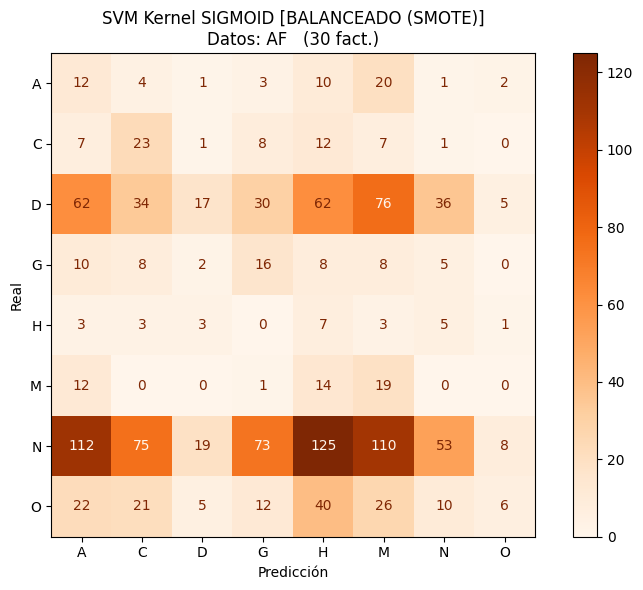


──────────────────────────────────────────────────
  Datos: UMAP (30 comp.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.1040
  Tiempo   : 34.6972s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.06      0.05        53
           C       0.06      0.31      0.09        59
           D       0.29      0.15      0.19       322
           G       0.08      0.11      0.09        57
           H       0.02      0.20      0.04        25
           M       0.08      0.39      0.13        46
           N       0.00      0.00      0.00       575
           O       0.17      0.25      0.20       142

    accuracy                           0.10      1279
   macro avg       0.09      0.18      0.10      1279
weighted avg       0.10      0.10      0.09      1279



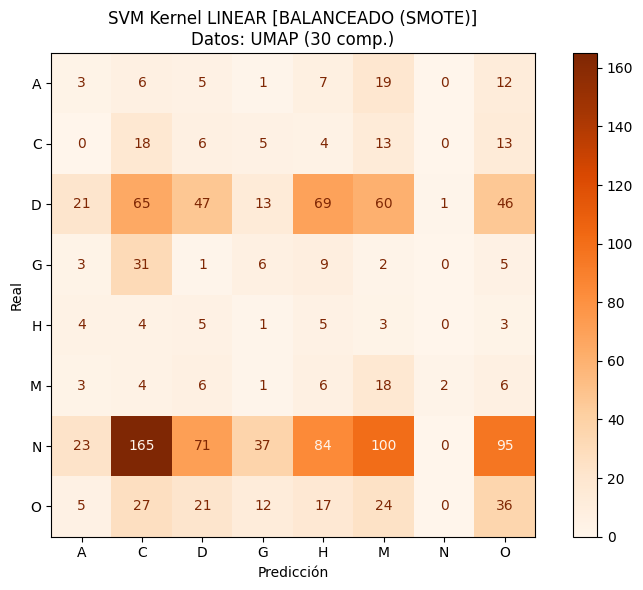


  Kernel: RBF
  Accuracy : 0.1259
  Tiempo   : 30.7083s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.08      0.21      0.12        53
           C       0.15      0.39      0.22        59
           D       0.32      0.08      0.13       322
           G       0.12      0.51      0.20        57
           H       0.05      0.60      0.09        25
           M       0.08      0.35      0.13        46
           N       0.48      0.05      0.08       575
           O       0.15      0.10      0.12       142

    accuracy                           0.13      1279
   macro avg       0.18      0.29      0.13      1279
weighted avg       0.33      0.13      0.11      1279



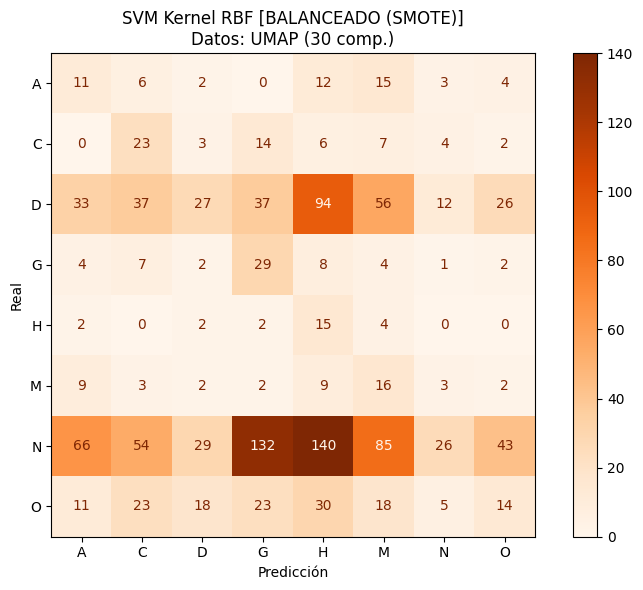


  Kernel: POLY
  Accuracy : 0.1368
  Tiempo   : 35.8983s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.07      0.23      0.11        53
           C       0.15      0.41      0.22        59
           D       0.31      0.10      0.15       322
           G       0.12      0.51      0.20        57
           H       0.05      0.52      0.09        25
           M       0.11      0.41      0.17        46
           N       0.49      0.05      0.08       575
           O       0.16      0.14      0.15       142

    accuracy                           0.14      1279
   macro avg       0.18      0.30      0.15      1279
weighted avg       0.34      0.14      0.12      1279



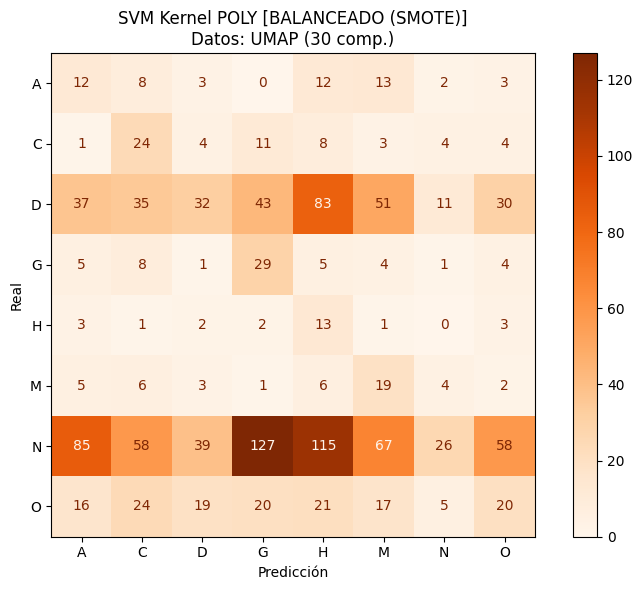


  Kernel: SIGMOID
  Accuracy : 0.0453
  Tiempo   : 34.3893s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.58      0.10        53
           C       0.04      0.25      0.06        59
           D       0.14      0.01      0.01       322
           G       0.04      0.11      0.06        57
           H       0.00      0.00      0.00        25
           M       0.11      0.02      0.04        46
           N       0.60      0.01      0.01       575
           O       0.00      0.00      0.00       142

    accuracy                           0.05      1279
   macro avg       0.12      0.12      0.03      1279
weighted avg       0.32      0.05      0.02      1279



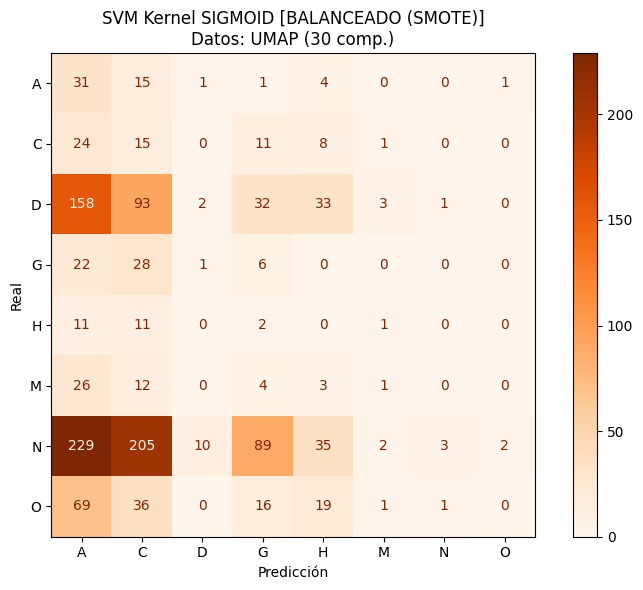


⏳ Entrenando SVM [BALANCEADO (Class Weight)]...
  → PCA  (30 comp.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.2854
  → PCA  (30 comp.) | Kernel: RBF... Accuracy: 0.2752
  → PCA  (30 comp.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.2877
  → PCA  (30 comp.) | Kernel: SIGMOID... Accuracy: 0.0516
  → AF   (30 fact.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.2869
  → AF   (30 fact.) | Kernel: RBF... Accuracy: 0.3534
  → AF   (30 fact.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.3354
  → AF   (30 fact.) | Kernel: SIGMOID... Accuracy: 0.0837
  → UMAP (30 comp.) | Kernel: LINEAR...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel LINEAR: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.1126
  → UMAP (30 comp.) | Kernel: RBF... Accuracy: 0.1274
  → UMAP (30 comp.) | Kernel: POLY...

/usr/local/lib/python3.12/dist-packages/sklearn/svm/_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


    ⚠️ Kernel POLY: se alcanzó el límite de iteraciones (10000). Considera aumentar max_iter.
 Accuracy: 0.1282
  → UMAP (30 comp.) | Kernel: SIGMOID... Accuracy: 0.0727

  SVM [BALANCEADO (Class Weight)]

──────────────────────────────────────────────────
  Datos: PCA  (30 comp.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.2854
  Tiempo   : 3.7219s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.03      0.04      0.04        53
           C       0.10      0.31      0.15        59
           D       0.25      0.17      0.20       322
           G       0.09      0.09      0.09        57
           H       0.07      0.16      0.09        25
           M       0.21      0.28      0.24        46
           N       0.52      0.44      0.48       575
           O       0.10      0.11      0.10       142

    accuracy                           0.29      1279
   macro avg       0.17      0.2

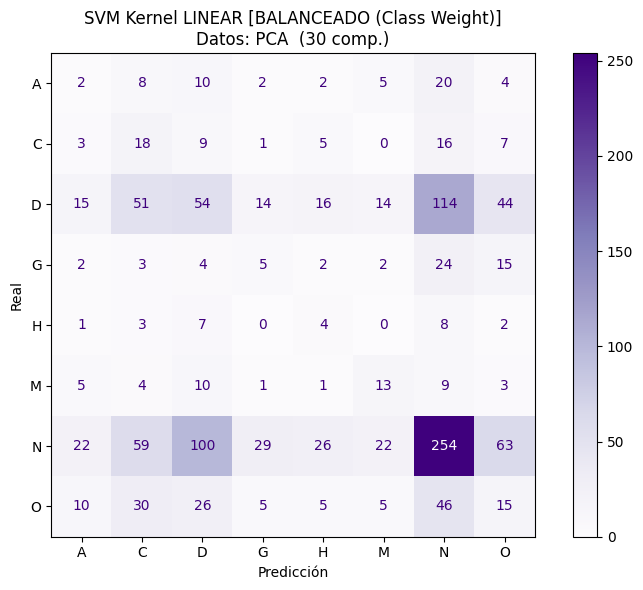


  Kernel: RBF
  Accuracy : 0.2752
  Tiempo   : 3.3998s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.25      0.13        53
           C       0.22      0.46      0.30        59
           D       0.37      0.30      0.34       322
           G       0.15      0.35      0.21        57
           H       0.06      0.40      0.11        25
           M       0.60      0.65      0.62        46
           N       0.58      0.23      0.33       575
           O       0.12      0.13      0.13       142

    accuracy                           0.28      1279
   macro avg       0.27      0.35      0.27      1279
weighted avg       0.41      0.28      0.30      1279



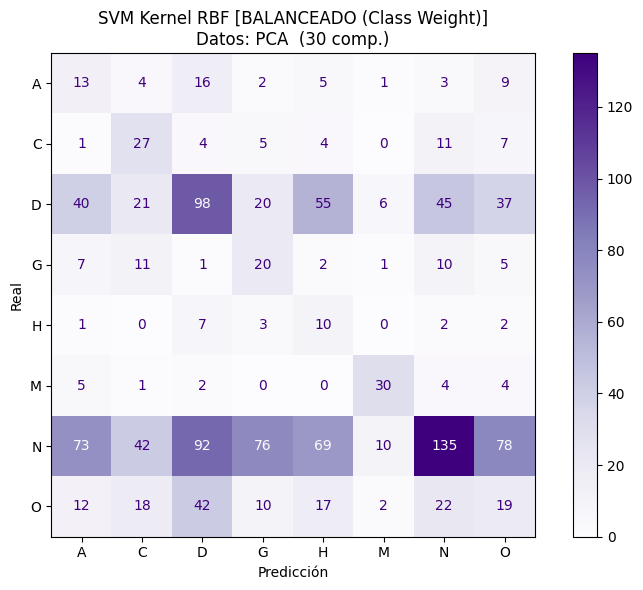


  Kernel: POLY
  Accuracy : 0.2877
  Tiempo   : 3.9770s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.28      0.14        53
           C       0.24      0.54      0.34        59
           D       0.38      0.32      0.35       322
           G       0.14      0.30      0.19        57
           H       0.07      0.40      0.12        25
           M       0.55      0.65      0.59        46
           N       0.62      0.25      0.36       575
           O       0.10      0.12      0.11       142

    accuracy                           0.29      1279
   macro avg       0.27      0.36      0.27      1279
weighted avg       0.43      0.29      0.31      1279



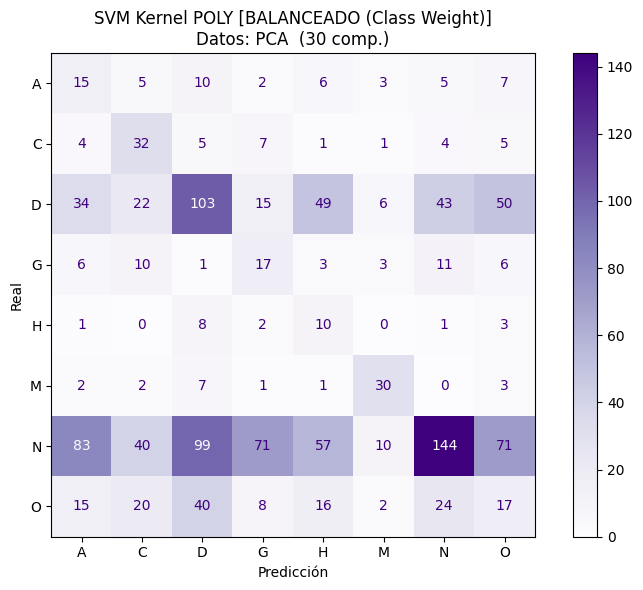


  Kernel: SIGMOID
  Accuracy : 0.0516
  Tiempo   : 3.6948s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.05      0.49      0.08        59
           D       0.25      0.01      0.01       322
           G       0.09      0.18      0.12        57
           H       0.01      0.16      0.02        25
           M       0.12      0.11      0.12        46
           N       0.45      0.03      0.05       575
           O       0.12      0.01      0.01       142

    accuracy                           0.05      1279
   macro avg       0.14      0.12      0.05      1279
weighted avg       0.29      0.05      0.04      1279



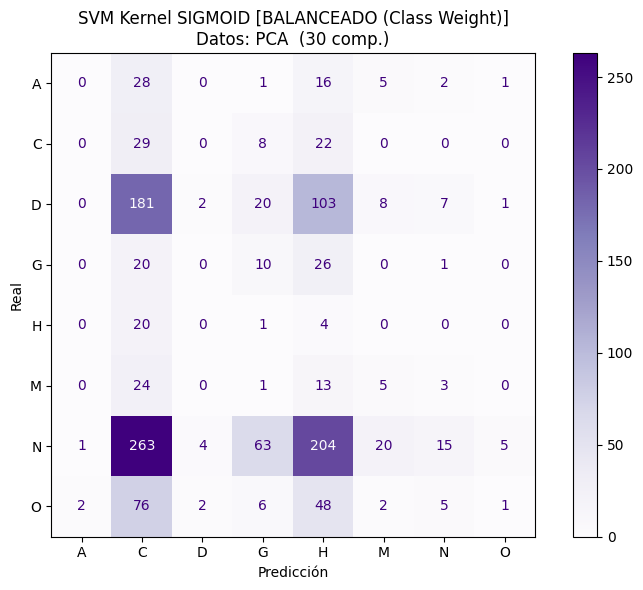


──────────────────────────────────────────────────
  Datos: AF   (30 fact.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.2869
  Tiempo   : 4.2784s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.02      0.02      0.02        53
           C       0.25      0.24      0.24        59
           D       0.26      0.16      0.20       322
           G       0.13      0.09      0.10        57
           H       0.04      0.08      0.06        25
           M       0.59      0.22      0.32        46
           N       0.47      0.42      0.45       575
           O       0.11      0.30      0.16       142

    accuracy                           0.29      1279
   macro avg       0.23      0.19      0.19      1279
weighted avg       0.33      0.29      0.30      1279



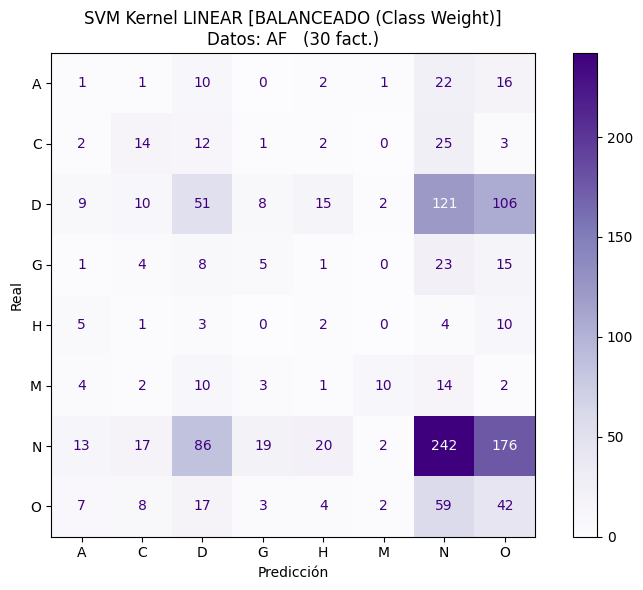


  Kernel: RBF
  Accuracy : 0.3534
  Tiempo   : 3.0694s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.06      0.13      0.09        53
           C       0.33      0.46      0.39        59
           D       0.39      0.40      0.39       322
           G       0.13      0.23      0.17        57
           H       0.13      0.36      0.19        25
           M       0.62      0.54      0.58        46
           N       0.55      0.37      0.44       575
           O       0.17      0.18      0.18       142

    accuracy                           0.35      1279
   macro avg       0.30      0.34      0.30      1279
weighted avg       0.41      0.35      0.37      1279



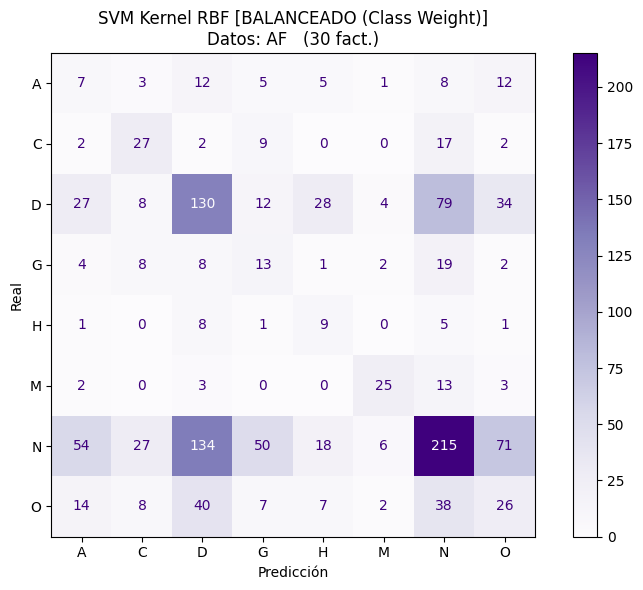


  Kernel: POLY
  Accuracy : 0.3354
  Tiempo   : 3.0664s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.21      0.12        53
           C       0.29      0.47      0.36        59
           D       0.36      0.38      0.37       322
           G       0.10      0.16      0.12        57
           H       0.12      0.32      0.18        25
           M       0.49      0.54      0.52        46
           N       0.56      0.35      0.43       575
           O       0.15      0.16      0.16       142

    accuracy                           0.34      1279
   macro avg       0.27      0.32      0.28      1279
weighted avg       0.40      0.34      0.35      1279



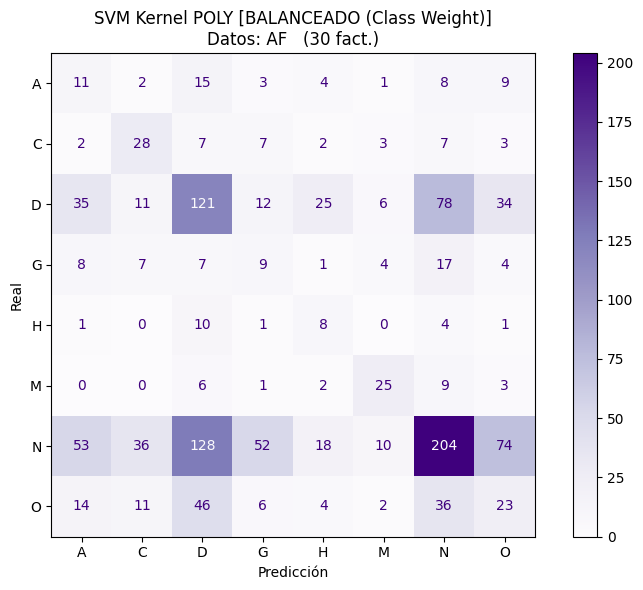


  Kernel: SIGMOID
  Accuracy : 0.0837
  Tiempo   : 4.1555s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.04      0.08      0.05        53
           C       0.12      0.42      0.19        59
           D       0.32      0.07      0.11       322
           G       0.10      0.25      0.14        57
           H       0.01      0.12      0.02        25
           M       0.04      0.46      0.08        46
           N       0.46      0.03      0.06       575
           O       0.04      0.01      0.01       142

    accuracy                           0.08      1279
   macro avg       0.14      0.18      0.08      1279
weighted avg       0.31      0.08      0.08      1279



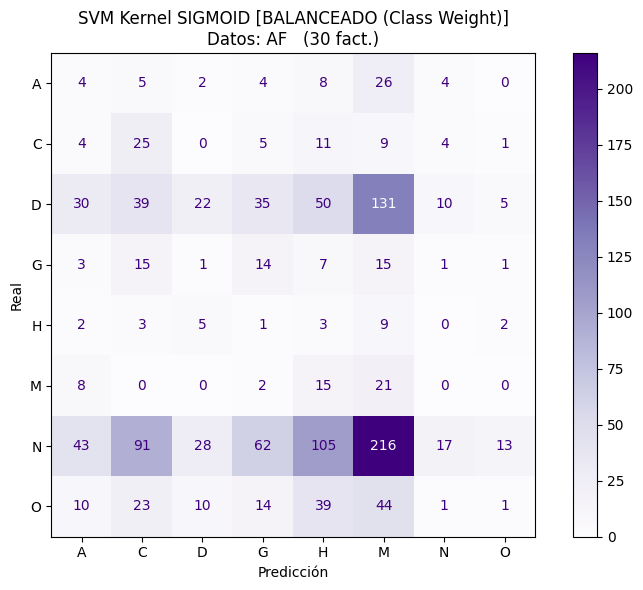


──────────────────────────────────────────────────
  Datos: UMAP (30 comp.)
──────────────────────────────────────────────────

  Kernel: LINEAR
  Accuracy : 0.1126
  Tiempo   : 4.9789s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.02      0.09      0.03        53
           C       0.09      0.34      0.15        59
           D       0.29      0.03      0.06       322
           G       0.11      0.44      0.17        57
           H       0.20      0.36      0.25        25
           M       0.07      0.57      0.13        46
           N       0.49      0.08      0.14       575
           O       0.14      0.02      0.04       142

    accuracy                           0.11      1279
   macro avg       0.18      0.24      0.12      1279
weighted avg       0.33      0.11      0.11      1279



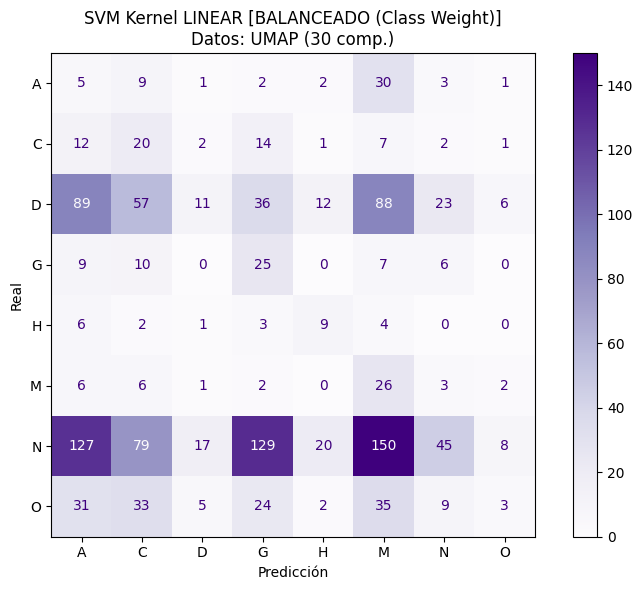


  Kernel: RBF
  Accuracy : 0.1274
  Tiempo   : 4.2306s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.25      0.13        53
           C       0.15      0.39      0.21        59
           D       0.34      0.14      0.20       322
           G       0.12      0.53      0.19        57
           H       0.05      0.52      0.09        25
           M       0.08      0.35      0.13        46
           N       0.42      0.02      0.04       575
           O       0.14      0.08      0.11       142

    accuracy                           0.13      1279
   macro avg       0.17      0.28      0.14      1279
weighted avg       0.31      0.13      0.11      1279



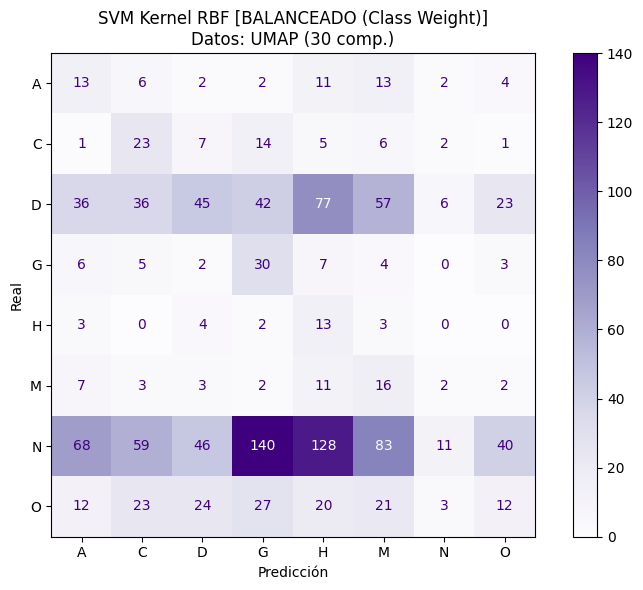


  Kernel: POLY
  Accuracy : 0.1282
  Tiempo   : 4.6031s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.07      0.17      0.09        53
           C       0.14      0.39      0.21        59
           D       0.33      0.12      0.18       322
           G       0.12      0.53      0.19        57
           H       0.05      0.56      0.10        25
           M       0.07      0.33      0.12        46
           N       0.46      0.03      0.06       575
           O       0.16      0.11      0.13       142

    accuracy                           0.13      1279
   macro avg       0.18      0.28      0.13      1279
weighted avg       0.33      0.13      0.11      1279



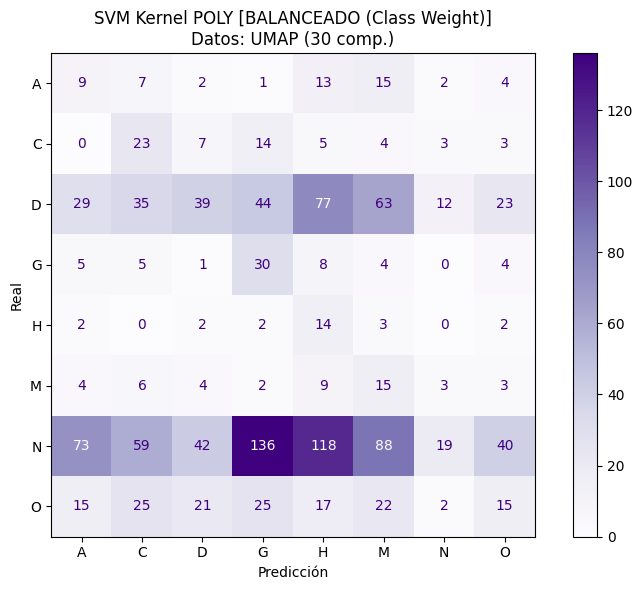


  Kernel: SIGMOID
  Accuracy : 0.0727
  Tiempo   : 4.8234s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.57      0.10        53
           C       0.10      0.14      0.12        59
           D       0.35      0.04      0.07       322
           G       0.06      0.14      0.09        57
           H       0.01      0.04      0.02        25
           M       0.00      0.00      0.00        46
           N       1.00      0.00      0.00       575
           O       0.08      0.23      0.12       142

    accuracy                           0.07      1279
   macro avg       0.21      0.14      0.06      1279
weighted avg       0.56      0.07      0.05      1279



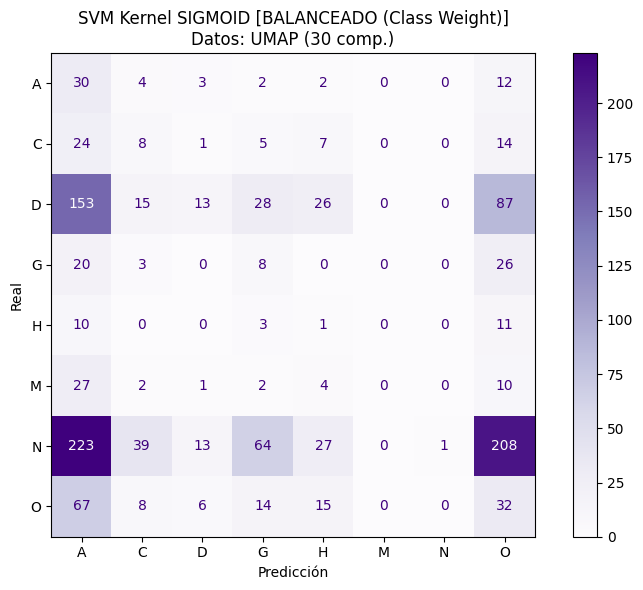

In [ ]:
# ── Ejecución de las tres condiciones ─────────────────────────────────────
resultados_svm_sin_balance   = correr_svm_por_condicion(
    datasets_sin_balance, kernels, y_test, encoder,
    condicion="SIN BALANCE", color_mapa='Blues', balanceado=False
)

resultados_svm_smote         = correr_svm_por_condicion(
    datasets_smote, kernels, y_test, encoder,
    condicion="BALANCEADO (SMOTE)", color_mapa='Oranges', balanceado=False
)

resultados_svm_class_weight  = correr_svm_por_condicion(
    datasets_class_weight, kernels, y_test, encoder,
    condicion="BALANCEADO (Class Weight)", color_mapa='Purples', balanceado=True
)

In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*85)
print("  RESUMEN COMPARATIVO — SVM")
print("═"*85)
print(f"  {'Dataset':<25} {'Kernel':<10} {'Sin balance':>12} "
      f"{'SMOTE':>12} {'Class Weight':>14}")
print("─"*85)

for nombre in datasets_sin_balance.keys():
    for kernel in kernels:
        acc_sin = resultados_svm_sin_balance[nombre][kernel]['accuracy']
        acc_sm  = resultados_svm_smote[nombre][kernel]['accuracy']
        acc_cw  = resultados_svm_class_weight[nombre][kernel]['accuracy']
        print(f"  {nombre:<25} {kernel.upper():<10} {acc_sin:>12.4f} "
              f"{acc_sm:>12.4f} {acc_cw:>14.4f}")
    print("─"*85)

print("═"*85)


═════════════════════════════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — SVM
═════════════════════════════════════════════════════════════════════════════════════
  Dataset                   Kernel      Sin balance        SMOTE   Class Weight
─────────────────────────────────────────────────────────────────────────────────────
  PCA  (30 comp.)           LINEAR           0.2729       0.1767         0.2854
  PCA  (30 comp.)           RBF              0.4855       0.3041         0.2752
  PCA  (30 comp.)           POLY             0.4613       0.3049         0.2877
  PCA  (30 comp.)           SIGMOID          0.3573       0.1603         0.0516
─────────────────────────────────────────────────────────────────────────────────────
  AF   (30 fact.)           LINEAR           0.2721       0.1970         0.2869
  AF   (30 fact.)           RBF              0.4754       0.3831         0.3534
  AF   (30 fact.)           POLY             0.4394       0.3589   

###Red Neuronal Convolucional


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# RED NEURONAL CONVOLUCIONAL 1D (CNN)
# ═══════════════════════════════════════════════════════════════════════════

def construir_cnn1d(longitud_entrada, num_clases):
    """
    Construye una CNN 1D para clasificación de representaciones reducidas.
    Trata el vector de componentes como una secuencia y aplica filtros
    convolucionales para detectar patrones locales.

    Parámetros:
    -----------
    longitud_entrada : número de componentes/factores (30 en este caso)
    num_clases       : número de clases a clasificar (8)

    Retorna:
    --------
    modelo de Keras compilable
    """
    # Entrada: vector de componentes con canal adicional para Conv1D
    entrada = layers.Input(shape=(longitud_entrada, 1))

    # ── Bloque convolucional 1: patrones simples ───────────────────────────
    x = layers.Conv1D(64, kernel_size=3, padding='same',
                      activation='relu',
                      kernel_regularizer=regularizers.l2(1e-4))(entrada)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(2)(x)

    # ── Bloque convolucional 2: patrones más complejos ─────────────────────
    x = layers.Conv1D(128, kernel_size=3, padding='same',
                      activation='relu',
                      kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.MaxPooling1D(2)(x)

    # ── Bloque convolucional 3: patrones de alto nivel ─────────────────────
    x = layers.Conv1D(256, kernel_size=3, padding='same',
                      activation='relu',
                      kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)

    # Reduce el tensor a un vector promediando por canal
    x = layers.GlobalAveragePooling1D()(x)

    # ── Capa densa con regularización ─────────────────────────────────────
    x = layers.Dense(128, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.4)(x)

    # ── Capa de salida ─────────────────────────────────────────────────────
    salida = layers.Dense(num_clases, activation='softmax')(x)

    return models.Model(inputs=entrada, outputs=salida)


def entrenar_cnn1d(X_train, y_train, X_test, y_test,
                   encoder, semilla=42, epocas=80,
                   tam_lote=32, pesos_clases=None):
    """
    Entrena y evalúa una CNN 1D con una semilla específica.

    Parámetros:
    -----------
    X_train       : datos de entrenamiento reducidos
    y_train       : etiquetas de entrenamiento
    X_test        : datos de prueba reducidos
    y_test        : etiquetas de prueba
    encoder       : LabelEncoder con nombres de clases
    semilla       : semilla para reproducibilidad (varía en Monte Carlo)
    epocas        : número máximo de épocas (EarlyStopping detiene antes)
    tam_lote      : tamaño del lote de entrenamiento
    pesos_clases  : diccionario de pesos por clase o None

    Retorna:
    --------
    diccionario con modelo, accuracy, pérdida, historial y predicciones
    """
    # Limpieza de sesión para evitar acumulación en memoria
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    # Conversión de tipos
    X_train = np.asarray(X_train, dtype=np.float32)
    X_test  = np.asarray(X_test,  dtype=np.float32)
    y_train = np.asarray(y_train, dtype=np.int32)
    y_test  = np.asarray(y_test,  dtype=np.int32)

    n_componentes = X_train.shape[1]
    num_clases    = len(encoder.classes_)

    # Reshape: agrega dimensión de canal requerida por Conv1D
    X_train_c = X_train.reshape((-1, n_componentes, 1))
    X_test_c  = X_test.reshape((-1, n_componentes, 1))

    # Construcción y compilación
    modelo = construir_cnn1d(n_componentes, num_clases)
    modelo.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Callbacks para evitar sobreajuste y reducir tasa de aprendizaje
    detener_pronto = callbacks.EarlyStopping(
        monitor='val_loss', patience=8,
        restore_best_weights=True
    )
    reducir_lr = callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=4
    )

    # Entrenamiento
    historial = modelo.fit(
        X_train_c, y_train,
        validation_split=0.15,
        epochs=epocas,
        batch_size=tam_lote,
        class_weight=pesos_clases,
        callbacks=[detener_pronto, reducir_lr],
        verbose=0
    )

    # Evaluación
    perdida, acc = modelo.evaluate(X_test_c, y_test, verbose=0)
    y_pred = np.argmax(modelo.predict(X_test_c, verbose=0), axis=1)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'perdida'  : perdida,
        'historial': historial,
        'y_pred'   : y_pred
    }


def buscar_mejor_cnn1d(X_train, y_train, X_test, y_test,
                        encoder, etiqueta="PCA",
                        n_intentos=20, pesos_clases=None,
                        condicion="SIN BALANCE", color_mapa='Blues'):
    """
    Búsqueda Monte Carlo del mejor modelo CNN 1D variando la semilla
    de inicialización. Reporta el modelo con mayor accuracy.

    Parámetros:
    -----------
    X_train      : datos de entrenamiento
    y_train      : etiquetas de entrenamiento
    X_test       : datos de prueba
    y_test       : etiquetas de prueba
    encoder      : LabelEncoder con nombres de clases
    etiqueta     : nombre del dataset para los títulos
    n_intentos   : número de semillas a probar
    pesos_clases : diccionario de pesos o None
    condicion    : descripción de la condición de balanceo
    color_mapa   : color para la matriz de confusión

    Retorna:
    --------
    mejor modelo encontrado
    """
    print(f"\n{'='*70}")
    print(f"  CNN 1D [{condicion}] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc      = 0.0
    mejor_resultado = None
    inicio_global  = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_cnn1d(
            X_train, y_train, X_test, y_test,
            encoder, semilla=semilla_actual,
            pesos_clases=pesos_clases
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")
            del res

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte y visualización del mejor modelo ───────────────────────────
    historial      = mejor_resultado['historial']
    y_pred         = mejor_resultado['y_pred']
    clases_nombres = encoder.classes_

    print(f"\n--- Reporte de clasificación [{etiqueta} | {condicion}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    # Gráficas: pérdida, accuracy y matriz de confusión
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    # Pérdida
    axes[0].plot(historial.history['loss'],     label='Entrenamiento')
    axes[0].plot(historial.history['val_loss'], label='Validación')
    axes[0].set_title(f'Pérdida — {etiqueta}')
    axes[0].set_xlabel('Época')
    axes[0].set_ylabel('Pérdida')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(historial.history['accuracy'],     label='Entrenamiento')
    axes[1].plot(historial.history['val_accuracy'], label='Validación')
    axes[1].set_title(f'Exactitud — {etiqueta}')
    axes[1].set_xlabel('Época')
    axes[1].set_ylabel('Exactitud')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    # Matriz de confusión
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=color_mapa,
        xticklabels=clases_nombres,
        yticklabels=clases_nombres,
        ax=axes[2]
    )
    axes[2].set_title(f'Matriz de Confusión\n{etiqueta} [{condicion}]')
    axes[2].set_xlabel('Predicción')
    axes[2].set_ylabel('Real')

    plt.tight_layout()
    plt.show()

    return mejor_resultado


In [ ]:
# ── Definición de datasets y pesos por condición ──────────────────────────
# Pesos para class_weight calculados sobre datos de entrenamiento originales
clases_unicas  = np.unique(y_train)
pesos_calculados = compute_class_weight(
    'balanced', classes=clases_unicas, y=y_train
)
pesos_clases_dict = dict(enumerate(pesos_calculados))

# Pesos para SMOTE: al estar balanceado no se necesitan pesos adicionales
pesos_smote_pca  = None
pesos_smote_af   = None
pesos_smote_umap = None


                                                                      
  CNN 1D — SIN BALANCEO
                                                                      

  CNN 1D [SIN BALANCE] — PCA (30 comp.)
  Buscando mejor modelo en 20 intentos...
  Intento 01/20 | Accuracy: 0.4715  🌟 ¡Nuevo récord!
  Intento 02/20 | Accuracy: 0.4621
  Intento 03/20 | Accuracy: 0.4707
  Intento 04/20 | Accuracy: 0.4754  🌟 ¡Nuevo récord!
  Intento 05/20 | Accuracy: 0.4699
  Intento 06/20 | Accuracy: 0.4730
  Intento 07/20 | Accuracy: 0.4722
  Intento 08/20 | Accuracy: 0.4582
  Intento 09/20 | Accuracy: 0.4550
  Intento 10/20 | Accuracy: 0.4582
  Intento 11/20 | Accuracy: 0.4699
  Intento 12/20 | Accuracy: 0.4730
  Intento 13/20 | Accuracy: 0.4832  🌟 ¡Nuevo récord!
  Intento 14/20 | Accuracy: 0.4644
  Intento 15/20 | Accuracy: 0.4691
  Intento 16/20 | Accuracy: 0.4722
  Intento 17/20 | Accuracy: 0.4668
  Intento 18/20 | Accuracy: 0.4699
  Intento 19/20 | Accuracy: 0.4785
  Intento 20/20 | Accuracy: 0.4

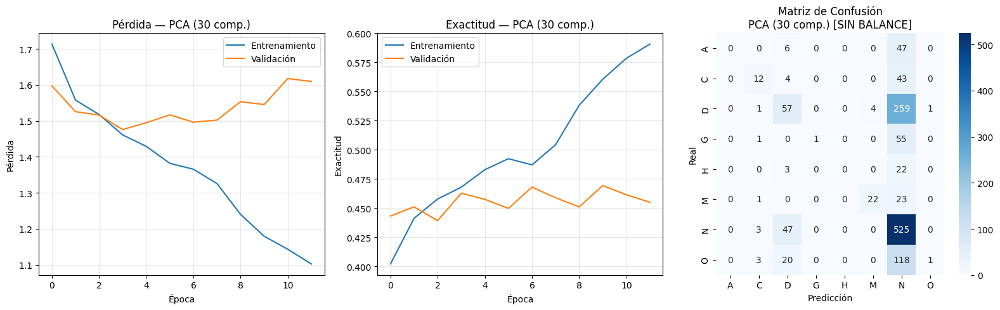


  CNN 1D [SIN BALANCE] — AF (30 fact.)
  Buscando mejor modelo en 20 intentos...
  Intento 01/20 | Accuracy: 0.4347  🌟 ¡Nuevo récord!
  Intento 02/20 | Accuracy: 0.4738  🌟 ¡Nuevo récord!
  Intento 03/20 | Accuracy: 0.4707
  Intento 04/20 | Accuracy: 0.4574
  Intento 05/20 | Accuracy: 0.4464
  Intento 06/20 | Accuracy: 0.4410
  Intento 07/20 | Accuracy: 0.4590
  Intento 08/20 | Accuracy: 0.4339
  Intento 09/20 | Accuracy: 0.4488
  Intento 10/20 | Accuracy: 0.4418
  Intento 11/20 | Accuracy: 0.4676
  Intento 12/20 | Accuracy: 0.4519
  Intento 13/20 | Accuracy: 0.4660
  Intento 14/20 | Accuracy: 0.4691
  Intento 15/20 | Accuracy: 0.4511
  Intento 16/20 | Accuracy: 0.4550
  Intento 17/20 | Accuracy: 0.4457
  Intento 18/20 | Accuracy: 0.4722
  Intento 19/20 | Accuracy: 0.4605
  Intento 20/20 | Accuracy: 0.4621

✅ Búsqueda finalizada en 297.8s
🏆 Mejor accuracy: 0.4738

--- Reporte de clasificación [AF (30 fact.) | SIN BALANCE] ---
              precision    recall  f1-score   support

     

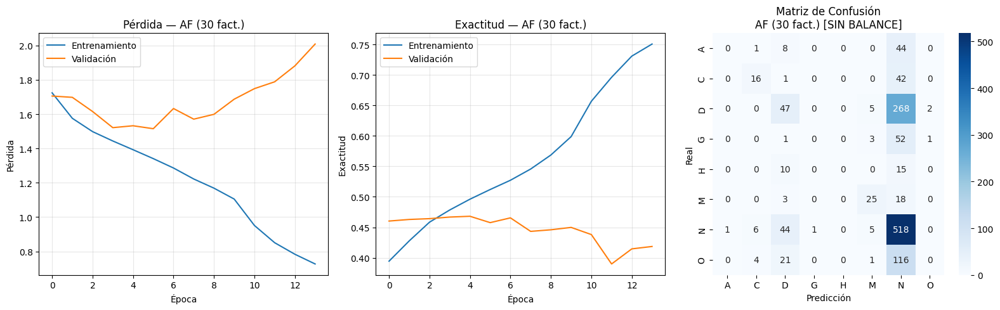


  CNN 1D [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 20 intentos...
  Intento 01/20 | Accuracy: 0.4535  🌟 ¡Nuevo récord!
  Intento 02/20 | Accuracy: 0.4488
  Intento 03/20 | Accuracy: 0.4550  🌟 ¡Nuevo récord!
  Intento 04/20 | Accuracy: 0.4527
  Intento 05/20 | Accuracy: 0.4472
  Intento 06/20 | Accuracy: 0.4543
  Intento 07/20 | Accuracy: 0.4519
  Intento 08/20 | Accuracy: 0.4441
  Intento 09/20 | Accuracy: 0.4558  🌟 ¡Nuevo récord!
  Intento 10/20 | Accuracy: 0.4574  🌟 ¡Nuevo récord!
  Intento 11/20 | Accuracy: 0.4605  🌟 ¡Nuevo récord!
  Intento 12/20 | Accuracy: 0.4574
  Intento 13/20 | Accuracy: 0.4519
  Intento 14/20 | Accuracy: 0.4566
  Intento 15/20 | Accuracy: 0.4527
  Intento 16/20 | Accuracy: 0.4535
  Intento 17/20 | Accuracy: 0.4597
  Intento 18/20 | Accuracy: 0.4566
  Intento 19/20 | Accuracy: 0.4488
  Intento 20/20 | Accuracy: 0.4457

✅ Búsqueda finalizada en 709.3s
🏆 Mejor accuracy: 0.4605

--- Reporte de clasificación [UMAP (30 comp.) | SIN BALANCE] ---
  

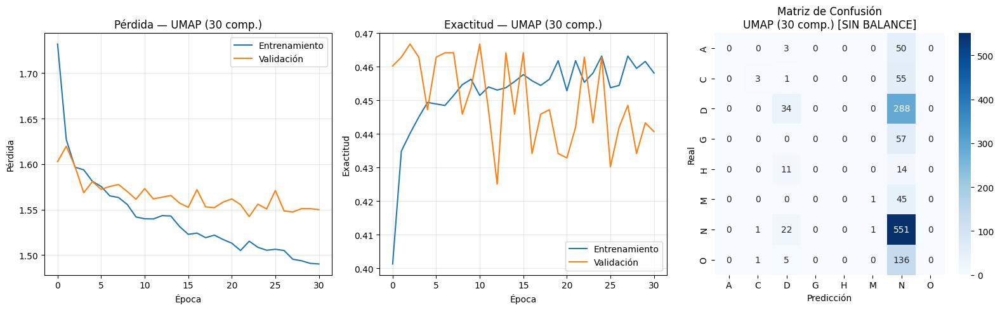

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("\n" + " "*70)
print("  CNN 1D — SIN BALANCEO")
print(" "*70)

res_cnn_pca_sin  = buscar_mejor_cnn1d(
    X_train_pca,  y_train, X_test_pca,  y_test, encoder,
    etiqueta=f"PCA ({n_componentes} comp.)",
    n_intentos=20, condicion="SIN BALANCE", color_mapa='Blues'
)
res_cnn_af_sin   = buscar_mejor_cnn1d(
    X_train_af,   y_train, X_test_af,   y_test, encoder,
    etiqueta=f"AF ({n_factores} fact.)",
    n_intentos=20, condicion="SIN BALANCE", color_mapa='Blues'
)
res_cnn_umap_sin = buscar_mejor_cnn1d(
    X_train_umap, y_train, X_test_umap, y_test, encoder,
    etiqueta=f"UMAP ({n_componentes_umap} comp.)",
    n_intentos=20, condicion="SIN BALANCE", color_mapa='Blues'
)



                                                                      
  CNN 1D — CLASS WEIGHT
                                                                      

  CNN 1D [CLASS WEIGHT] — PCA (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.3346  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.2854
  Intento 03/10 | Accuracy: 0.2353
  Intento 04/10 | Accuracy: 0.2791
  Intento 05/10 | Accuracy: 0.2322
  Intento 06/10 | Accuracy: 0.2862
  Intento 07/10 | Accuracy: 0.2854
  Intento 08/10 | Accuracy: 0.2690
  Intento 09/10 | Accuracy: 0.2463
  Intento 10/10 | Accuracy: 0.2533

✅ Búsqueda finalizada en 257.7s
🏆 Mejor accuracy: 0.3346

--- Reporte de clasificación [PCA (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.08      0.13      0.10        53
           C       0.37      0.39      0.38        59
           D       0.34      0.38      0.36       322
           G       0.22      0.39      0

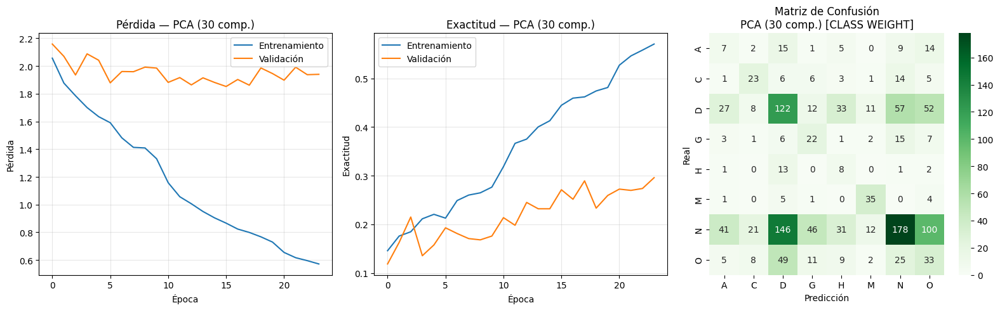


  CNN 1D [CLASS WEIGHT] — AF (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.2807  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.2776
  Intento 03/10 | Accuracy: 0.3253  🌟 ¡Nuevo récord!
  Intento 04/10 | Accuracy: 0.2877
  Intento 05/10 | Accuracy: 0.3167
  Intento 06/10 | Accuracy: 0.2979
  Intento 07/10 | Accuracy: 0.3253
  Intento 08/10 | Accuracy: 0.2987
  Intento 09/10 | Accuracy: 0.3221
  Intento 10/10 | Accuracy: 0.2979

✅ Búsqueda finalizada en 247.7s
🏆 Mejor accuracy: 0.3253

--- Reporte de clasificación [AF (30 fact.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.09      0.08      0.08        53
           C       0.39      0.31      0.34        59
           D       0.34      0.38      0.36       322
           G       0.14      0.21      0.17        57
           H       0.17      0.28      0.22        25
           M       0.41      0.65      0.50        46
           N       0.50      

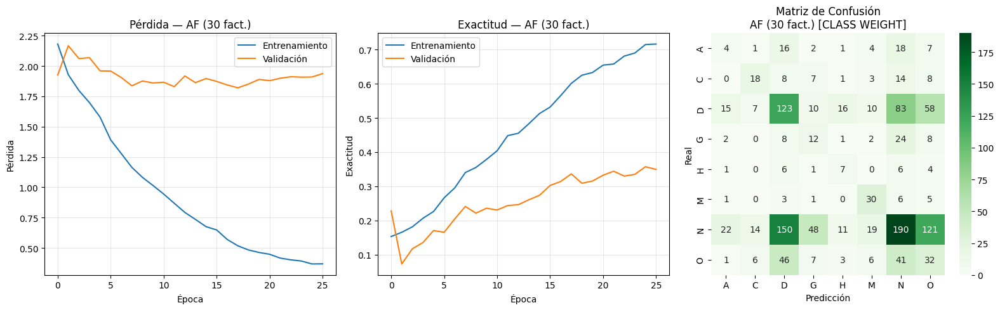


  CNN 1D [CLASS WEIGHT] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.2103  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1431
  Intento 03/10 | Accuracy: 0.1689
  Intento 04/10 | Accuracy: 0.1204
  Intento 05/10 | Accuracy: 0.1830
  Intento 06/10 | Accuracy: 0.1869
  Intento 07/10 | Accuracy: 0.1798
  Intento 08/10 | Accuracy: 0.2518  🌟 ¡Nuevo récord!
  Intento 09/10 | Accuracy: 0.1783
  Intento 10/10 | Accuracy: 0.1243

✅ Búsqueda finalizada en 257.9s
🏆 Mejor accuracy: 0.2518

--- Reporte de clasificación [UMAP (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.25      1.00      0.40       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.00  

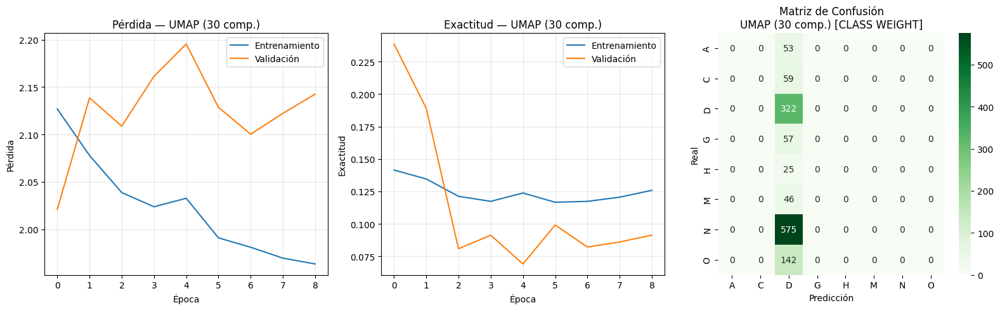

In [ ]:
# ── Ejecución con class weight ─────────────────────────────────────────────
print("\n" + " "*70)
print("  CNN 1D — CLASS WEIGHT")
print(" "*70)

res_cnn_pca_cw   = buscar_mejor_cnn1d(
    X_train_pca,  y_train, X_test_pca,  y_test, encoder,
    etiqueta=f"PCA ({n_componentes} comp.)",
    n_intentos=10, pesos_clases=pesos_clases_dict,
    condicion="CLASS WEIGHT", color_mapa='Greens'
)
res_cnn_af_cw    = buscar_mejor_cnn1d(
    X_train_af,   y_train, X_test_af,   y_test, encoder,
    etiqueta=f"AF ({n_factores} fact.)",
    n_intentos=10, pesos_clases=pesos_clases_dict,
    condicion="CLASS WEIGHT", color_mapa='Greens'
)
res_cnn_umap_cw  = buscar_mejor_cnn1d(
    X_train_umap, y_train, X_test_umap, y_test, encoder,
    etiqueta=f"UMAP ({n_componentes_umap} comp.)",
    n_intentos=10, pesos_clases=pesos_clases_dict,
    condicion="CLASS WEIGHT", color_mapa='Greens'
)


In [ ]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*65)
print("  RESUMEN COMPARATIVO — CNN 1D")
print("═"*65)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Class Weight':>14}")
print("─"*65)

for nombre, sin, cw in [
    (f"PCA  ({n_componentes} comp.)",      res_cnn_pca_sin,  res_cnn_pca_cw),
    (f"AF   ({n_factores} fact.)",         res_cnn_af_sin,   res_cnn_af_cw),
    (f"UMAP ({n_componentes_umap} comp.)", res_cnn_umap_sin, res_cnn_umap_cw),
]:
    print(f"  {nombre:<25} {sin['accuracy']:>12.4f} {cw['accuracy']:>14.4f}")

print("═"*65)


═════════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — CNN 1D
═════════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Class Weight
─────────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4832         0.3346
  AF   (30 fact.)                 0.4738         0.3253
  UMAP (30 comp.)                 0.4605         0.2518
═════════════════════════════════════════════════════════════════


In [ ]:
#verificar si los datos se guardaron en memoria

try:
    print(f"✅ X_train_pca  : {X_train_pca.shape}")
    print(f"✅ X_train_af   : {X_train_af.shape}")
    print(f"✅ X_train_umap : {X_train_umap.shape}")
    print(f"✅ y_train      : {y_train.shape}")
    print(f"✅ y_test       : {y_test.shape}")
    print(f"✅ n_componentes: {n_componentes}")
    print(f"✅ n_factores   : {n_factores}")
    print("\n🟢 Todo en memoria, puedes correr CNN directamente")
except NameError as e:
    print(f"❌ Variable perdida: {e}")
    print("⚠️ Debes correr todo desde el principio")

✅ X_train_pca  : (5113, 30)
✅ X_train_af   : (5113, 30)
✅ X_train_umap : (5113, 30)
✅ y_train      : (5113,)
✅ y_test       : (1279,)
✅ n_componentes: 30
✅ n_factores   : 30

🟢 Todo en memoria, puedes correr CNN directamente


### Red tipo transformer


                                                                      
  TRANSFORMER — SIN BALANCEO
                                                                      

  TRANSFORMER [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4511  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4519  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4535  🌟 ¡Nuevo récord!
  Intento 04/10 | Accuracy: 0.4527
  Intento 05/10 | Accuracy: 0.4527
  Intento 06/10 | Accuracy: 0.4488
  Intento 07/10 | Accuracy: 0.4472
  Intento 08/10 | Accuracy: 0.4519
  Intento 09/10 | Accuracy: 0.4535
  Intento 10/10 | Accuracy: 0.4527

✅ Búsqueda finalizada en 1129.8s
🏆 Mejor accuracy: 0.4535

--- Reporte de clasificación [PCA  (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.38      0.17      0.24        59
           D       0.00      0.00      0.00    

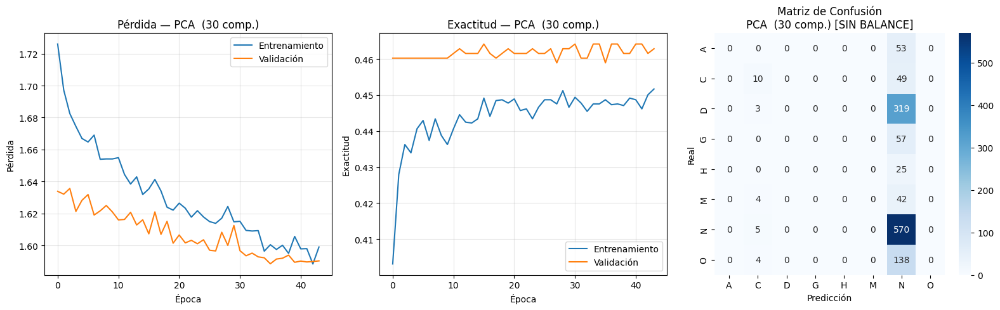


  TRANSFORMER [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4511  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4496
  Intento 03/10 | Accuracy: 0.4504
  Intento 04/10 | Accuracy: 0.4511
  Intento 05/10 | Accuracy: 0.4496
  Intento 06/10 | Accuracy: 0.4504
  Intento 07/10 | Accuracy: 0.4496
  Intento 08/10 | Accuracy: 0.4504
  Intento 09/10 | Accuracy: 0.4504
  Intento 10/10 | Accuracy: 0.4519  🌟 ¡Nuevo récord!

✅ Búsqueda finalizada en 993.6s
🏆 Mejor accuracy: 0.4519

--- Reporte de clasificación [AF   (30 fact.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.80      0.07      0.12        59
           D       0.00      0.00      0.00       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.4

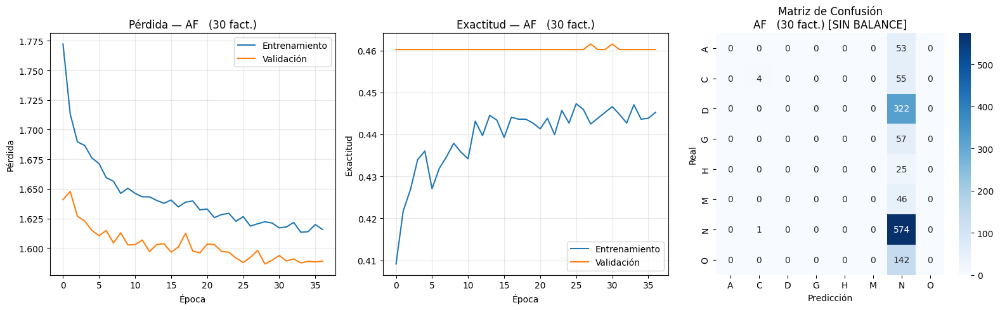


  TRANSFORMER [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4496  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4511  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4504
  Intento 04/10 | Accuracy: 0.4496
  Intento 05/10 | Accuracy: 0.4496
  Intento 06/10 | Accuracy: 0.4535  🌟 ¡Nuevo récord!
  Intento 07/10 | Accuracy: 0.4496
  Intento 08/10 | Accuracy: 0.4496
  Intento 09/10 | Accuracy: 0.4496
  Intento 10/10 | Accuracy: 0.4511

✅ Búsqueda finalizada en 1010.2s
🏆 Mejor accuracy: 0.4535

--- Reporte de clasificación [UMAP (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.39      0.05      0.08       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
   

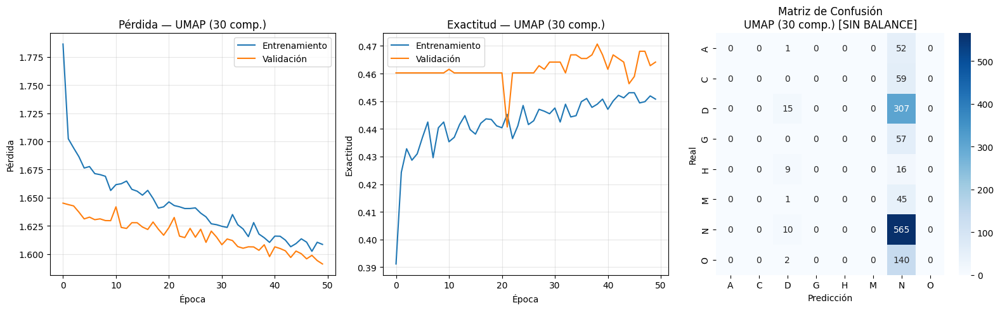

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# RED TIPO TRANSFORMER
# ═══════════════════════════════════════════════════════════════════════════


def bloque_transformer(x, num_cabezas, dim_clave, dim_ffn, tasa_dropout=0.1):
    """
    Parámetros:
    -----------
    x            : tensor de entrada
    num_cabezas  : número de cabezas de atención
    dim_clave    : dimensión de cada cabeza de atención
    dim_ffn      : dimensión de la red feed-forward interna
    tasa_dropout : tasa de dropout para regularización

    Retorna:
    --------
    tensor de salida con la misma forma que la entrada
    """
    # ── Atención multi-cabeza con conexión residual ────────────────────────
    atencion = layers.MultiHeadAttention(
        num_heads=num_cabezas,
        key_dim=dim_clave,
        dropout=tasa_dropout
    )(x, x)
    atencion = layers.Dropout(tasa_dropout)(atencion)
    x = layers.Add()([x, atencion])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    # ── Red feed-forward con conexión residual ─────────────────────────────
    ffn = layers.Dense(dim_ffn, activation='relu',
                       kernel_regularizer=regularizers.l2(1e-4))(x)
    ffn = layers.Dropout(tasa_dropout)(ffn)
    ffn = layers.Dense(x.shape[-1],
                       kernel_regularizer=regularizers.l2(1e-4))(ffn)
    ffn = layers.Dropout(tasa_dropout)(ffn)
    x = layers.Add()([x, ffn])
    x = layers.LayerNormalization(epsilon=1e-6)(x)

    return x


def construir_transformer(n_caracteristicas, n_clases,
                           dim_proyeccion=128, num_cabezas=4,
                           dim_clave=32, dim_ffn=256,
                           n_bloques=2, tasa_dropout=0.1):
    """
    Construye un Transformer tabular para clasificación de representaciones
    reducidas. Trata cada componente como un token de una secuencia.

    Parámetros:
    -----------
    n_caracteristicas : número de componentes/factores de entrada (30)
    n_clases          : número de clases a clasificar (8)
    dim_proyeccion    : dimensión de la proyección inicial de cada token
    num_cabezas       : número de cabezas de atención multi-cabeza
    dim_clave         : dimensión de cada cabeza de atención
    dim_ffn           : dimensión interna de la red feed-forward
    n_bloques         : número de bloques Transformer apilados
    tasa_dropout      : tasa de dropout para regularización

    Retorna:
    --------
    modelo de Keras sin compilar
    """
    entrada = layers.Input(shape=(n_caracteristicas,))

    # ── Proyección inicial ─────────────────────────────────────────────────
    # Cada componente se trata como un token. Se expande a una secuencia
    # y se proyecta a una dimensión mayor para enriquecer la representación.
    x = layers.Reshape((n_caracteristicas, 1))(entrada)
    x = layers.Dense(dim_proyeccion,
                     kernel_regularizer=regularizers.l2(1e-4))(x)

    # ── Bloques Transformer apilados ──────────────────────────────────────
    # Múltiples bloques permiten capturar relaciones de mayor complejidad
    # entre los componentes en capas sucesivas de abstracción.
    for _ in range(n_bloques):
        x = bloque_transformer(
            x,
            num_cabezas=num_cabezas,
            dim_clave=dim_clave,
            dim_ffn=dim_ffn,
            tasa_dropout=tasa_dropout
        )

    # ── Agregación y clasificación ─────────────────────────────────────────
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.3)(x)
    x = layers.Dense(64, activation='relu',
                     kernel_regularizer=regularizers.l2(1e-4))(x)
    x = layers.Dropout(0.2)(x)
    salida = layers.Dense(n_clases, activation='softmax')(x)

    return models.Model(entrada, salida)


def entrenar_transformer(X_train, y_train, X_test, y_test,
                          encoder, semilla=42, epocas=50,
                          tam_lote=32, pesos_clases=None):
    """
    Parámetros:
    -----------
    X_train      : datos de entrenamiento reducidos
    y_train      : etiquetas de entrenamiento
    X_test       : datos de prueba reducidos
    y_test       : etiquetas de prueba
    encoder      : LabelEncoder con nombres de clases
    semilla      : semilla para Monte Carlo
    epocas       : número máximo de épocas
    tam_lote     : tamaño del lote
    pesos_clases : diccionario de pesos por clase o None

    Retorna:
    --------
    diccionario con modelo, accuracy, pérdida, historial y predicciones
    """
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    X_train = np.asarray(X_train, dtype=np.float32)
    X_test  = np.asarray(X_test,  dtype=np.float32)
    y_train = np.asarray(y_train, dtype=np.int32)
    y_test  = np.asarray(y_test,  dtype=np.int32)

    n_caracteristicas = X_train.shape[1]
    n_clases          = len(encoder.classes_)

    modelo = construir_transformer(n_caracteristicas, n_clases)
    modelo.compile(
        optimizer=tf.keras.optimizers.Adam(
            learning_rate=1e-4,
            weight_decay=1e-5  # Regularización adicional en el optimizador
        ),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # Callbacks
    detener_pronto = callbacks.EarlyStopping(
        monitor='val_loss', patience=8,
        restore_best_weights=True
    )
    reducir_lr = callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=4, min_lr=1e-6
    )

    inicio = time.time()
    historial = modelo.fit(
        X_train, y_train,
        validation_split=0.15,  # Separación interna, NO usar X_test aquí
        epochs=epocas,
        batch_size=tam_lote,
        class_weight=pesos_clases,
        callbacks=[detener_pronto, reducir_lr],
        verbose=0
    )
    duracion = time.time() - inicio

    perdida, acc = modelo.evaluate(X_test, y_test, verbose=0)
    y_pred = np.argmax(modelo.predict(X_test, verbose=0), axis=1)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'perdida'  : perdida,
        'historial': historial,
        'tiempo'   : duracion,
        'y_pred'   : y_pred
    }


def buscar_mejor_transformer(X_train, y_train, X_test, y_test,
                              encoder, etiqueta="PCA",
                              n_intentos=10, pesos_clases=None,
                              condicion="SIN BALANCE", color_mapa='Blues'):
    """
    Búsqueda Monte Carlo del mejor Transformer variando la semilla.
    Reporta el modelo con mayor accuracy entre todos los intentos.
    """
    print(f"\n{'='*70}")
    print(f"  TRANSFORMER [{condicion}] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_transformer(
            X_train, y_train, X_test, y_test,
            encoder, semilla=semilla_actual,
            pesos_clases=pesos_clases
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")
            del res

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte y visualización ────────────────────────────────────────────
    historial      = mejor_resultado['historial']
    y_pred         = mejor_resultado['y_pred']
    clases_nombres = encoder.classes_

    print(f"\n--- Reporte de clasificación [{etiqueta} | {condicion}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    # Pérdida
    axes[0].plot(historial.history['loss'],     label='Entrenamiento')
    axes[0].plot(historial.history['val_loss'], label='Validación')
    axes[0].set_title(f'Pérdida — {etiqueta}')
    axes[0].set_xlabel('Época')
    axes[0].set_ylabel('Pérdida')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    # Accuracy
    axes[1].plot(historial.history['accuracy'],     label='Entrenamiento')
    axes[1].plot(historial.history['val_accuracy'], label='Validación')
    axes[1].set_title(f'Exactitud — {etiqueta}')
    axes[1].set_xlabel('Época')
    axes[1].set_ylabel('Exactitud')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    # Matriz de confusión
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=color_mapa,
        xticklabels=clases_nombres,
        yticklabels=clases_nombres,
        ax=axes[2]
    )
    axes[2].set_title(f'Matriz de Confusión\n{etiqueta} [{condicion}]')
    axes[2].set_xlabel('Predicción')
    axes[2].set_ylabel('Real')

    plt.tight_layout()
    plt.show()

    return mejor_resultado


# ── Cálculo de pesos para class weight ────────────────────────────────────
clases_unicas    = np.unique(y_train)
pesos_calculados = compute_class_weight(
    'balanced', classes=clases_unicas, y=y_train
)
pesos_clases_dict = dict(enumerate(pesos_calculados))

# ── Definición de datasets ─────────────────────────────────────────────────
datasets_transformer = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca,  y_train),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af,   y_train),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap, y_train)
}

# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("\n" + " "*70)
print("  TRANSFORMER — SIN BALANCEO")
print(" "*70)

resultados_trans_sin = {}
for nombre, (X_tr, X_te, y_tr) in datasets_transformer.items():
    resultados_trans_sin[nombre] = buscar_mejor_transformer(
        X_tr, y_tr, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        condicion="SIN BALANCE", color_mapa='Blues'
    )




                                                                      
  TRANSFORMER — CLASS WEIGHT
                                                                      

  TRANSFORMER [CLASS WEIGHT] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1087  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1259  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1407  🌟 ¡Nuevo récord!
  Intento 04/10 | Accuracy: 0.0844
  Intento 05/10 | Accuracy: 0.1454  🌟 ¡Nuevo récord!
  Intento 06/10 | Accuracy: 0.1321
  Intento 07/10 | Accuracy: 0.1071
  Intento 08/10 | Accuracy: 0.1525  🌟 ¡Nuevo récord!
  Intento 09/10 | Accuracy: 0.1126
  Intento 10/10 | Accuracy: 0.2111  🌟 ¡Nuevo récord!

✅ Búsqueda finalizada en 470.8s
🏆 Mejor accuracy: 0.2111

--- Reporte de clasificación [PCA  (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.12      0.17      0.14   

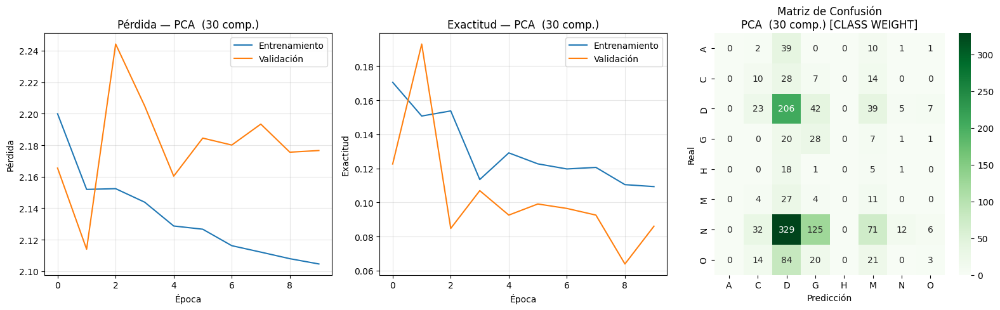


  TRANSFORMER [CLASS WEIGHT] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1126  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1454  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1368
  Intento 04/10 | Accuracy: 0.0938
  Intento 05/10 | Accuracy: 0.1884  🌟 ¡Nuevo récord!
  Intento 06/10 | Accuracy: 0.1790
  Intento 07/10 | Accuracy: 0.0500
  Intento 08/10 | Accuracy: 0.0649
  Intento 09/10 | Accuracy: 0.1329
  Intento 10/10 | Accuracy: 0.2260  🌟 ¡Nuevo récord!

✅ Búsqueda finalizada en 403.0s
🏆 Mejor accuracy: 0.2260

--- Reporte de clasificación [AF   (30 fact.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.02      0.02      0.02        53
           C       0.09      0.07      0.08        59
           D       0.26      0.11      0.16       322
           G       0.07      0.40      0.11        57
           H       0.03      0.04      0.03        25
           M       0.13      0.72     

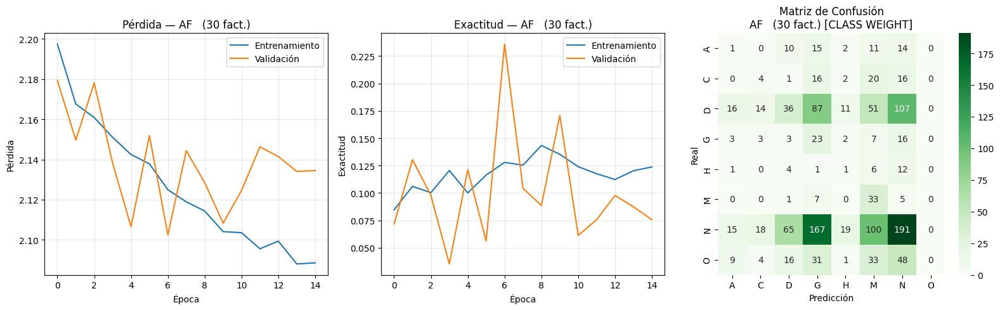


  TRANSFORMER [CLASS WEIGHT] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.2306  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.3761  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1024
  Intento 04/10 | Accuracy: 0.1486
  Intento 05/10 | Accuracy: 0.1783
  Intento 06/10 | Accuracy: 0.2346
  Intento 07/10 | Accuracy: 0.2400
  Intento 08/10 | Accuracy: 0.0790
  Intento 09/10 | Accuracy: 0.1243
  Intento 10/10 | Accuracy: 0.2033

✅ Búsqueda finalizada en 347.8s
🏆 Mejor accuracy: 0.3761

--- Reporte de clasificación [UMAP (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.05      0.05      0.05        59
           D       0.00      0.00      0.00       322
           G       0.15      0.33      0.20        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0

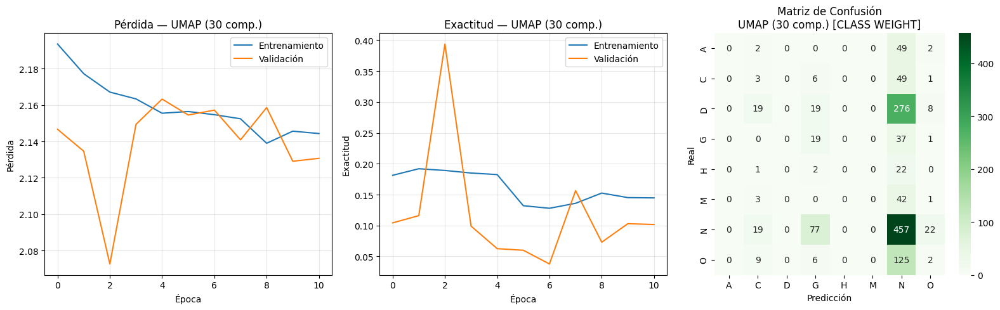

In [ ]:
# ── Ejecución con class weight ─────────────────────────────────────────────
print("\n" + " "*70)
print("  TRANSFORMER — CLASS WEIGHT")
print(" "*70)

resultados_trans_cw = {}
for nombre, (X_tr, X_te, y_tr) in datasets_transformer.items():
    resultados_trans_cw[nombre] = buscar_mejor_transformer(
        X_tr, y_tr, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        pesos_clases=pesos_clases_dict,
        condicion="CLASS WEIGHT", color_mapa='Greens'
    )


In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — TRANSFORMER")
print("═"*60)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Class Weight':>14}")
print("─"*60)

for nombre in datasets_transformer.keys():
    acc_sin = resultados_trans_sin[nombre]['accuracy']
    acc_cw  = resultados_trans_cw[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_cw:>14.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — TRANSFORMER
════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Class Weight
────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4535         0.2111
  AF   (30 fact.)                 0.4519         0.2260
  UMAP (30 comp.)                 0.4535         0.3761
════════════════════════════════════════════════════════════


## Modelos de exploración

### Red densa o Perceptrón Multicapa (MLP) - Tensorflow

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# MODELO DE EXPLORACIÓN 1: PERCEPTRÓN MULTICAPA PROFUNDO (MLP) — TENSORFLOW
# ═══════════════════════════════════════════════════════════════════════════
# El Perceptrón Multicapa es una red neuronal totalmente conectada que
# aprende combinaciones no lineales de los componentes reducidos. A diferencia
# de la CNN 1D que captura patrones locales, el MLP puede aprender cualquier
# combinación de los componentes simultáneamente.
#
# Se usa activación GELU (Gaussian Error Linear Unit) que suaviza la
# transición del ReLU estándar, e inicialización HeNormal apropiada para
# activaciones tipo ReLU/GELU.
#
# Se usa búsqueda Monte Carlo con 10 semillas porque las redes neuronales
# tienen inicialización aleatoria de pesos que puede afectar el resultado.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════

def construir_mlp(n_caracteristicas, n_clases):
    """
    Construye un MLP profundo con activación GELU e inicialización HeNormal.

    Parámetros:
    -----------
    n_caracteristicas : número de componentes/factores de entrada
    n_clases          : número de clases a clasificar (8)

    Retorna:
    --------
    modelo de Keras compilado
    """
    modelo = models.Sequential([
        layers.Input(shape=(n_caracteristicas,)),

        # ── Capa 1 ────────────────────────────────────────────────────────
        layers.Dense(256, activation='gelu',
                     kernel_initializer=initializers.HeNormal(),
                     kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # ── Capa 2 ────────────────────────────────────────────────────────
        layers.Dense(128, activation='gelu',
                     kernel_initializer=initializers.HeNormal(),
                     kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        # ── Capa 3 ────────────────────────────────────────────────────────
        layers.Dense(64, activation='gelu',
                     kernel_initializer=initializers.HeNormal(),
                     kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.2),

        # ── Capa 4 ────────────────────────────────────────────────────────
        layers.Dense(32, activation='gelu',
                     kernel_initializer=initializers.HeNormal(),
                     kernel_regularizer=regularizers.l2(1e-4)),
        layers.BatchNormalization(),

        # ── Capa de salida ────────────────────────────────────────────────
        layers.Dense(n_clases, activation='softmax')
    ])

    modelo.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return modelo


def entrenar_mlp(X_train, y_train, X_test, y_test,
                 encoder, semilla=42, epocas=50,
                 tam_lote=32, pesos_clases=None):
    """
    Entrena y evalúa un MLP profundo con una semilla específica.

    Parámetros:
    -----------
    X_train      : datos de entrenamiento reducidos
    y_train      : etiquetas de entrenamiento
    X_test       : datos de prueba reducidos
    y_test       : etiquetas de prueba
    encoder      : LabelEncoder con nombres de clases
    semilla      : semilla para Monte Carlo
    epocas       : número máximo de épocas
    tam_lote     : tamaño del lote
    pesos_clases : diccionario de pesos por clase o None

    Retorna:
    --------
    diccionario con modelo, accuracy, pérdida, historial y predicciones
    """
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    X_train = np.asarray(X_train, dtype=np.float32)
    X_test  = np.asarray(X_test,  dtype=np.float32)
    y_train = np.asarray(y_train, dtype=np.int32)
    y_test  = np.asarray(y_test,  dtype=np.int32)

    n_caracteristicas = X_train.shape[1]
    n_clases          = len(encoder.classes_)

    modelo = construir_mlp(n_caracteristicas, n_clases)

    detener_pronto = callbacks.EarlyStopping(
        monitor='val_loss', patience=5,
        restore_best_weights=True
    )
    reducir_lr = callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=3, min_lr=1e-6
    )

    inicio = time.time()
    historial = modelo.fit(
        X_train, y_train,
        validation_split=0.15,  # Separación interna, NO usar X_test aquí
        epochs=epocas,
        batch_size=tam_lote,
        class_weight=pesos_clases,
        callbacks=[detener_pronto, reducir_lr],
        verbose=0
    )
    duracion = time.time() - inicio

    perdida, acc = modelo.evaluate(X_test, y_test, verbose=0)
    y_pred = np.argmax(modelo.predict(X_test, verbose=0), axis=1)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'perdida'  : perdida,
        'historial': historial,
        'tiempo'   : duracion,
        'y_pred'   : y_pred
    }


def buscar_mejor_mlp(X_train, y_train, X_test, y_test,
                     encoder, etiqueta="PCA",
                     n_intentos=10, pesos_clases=None,
                     condicion="SIN BALANCE", color_mapa='Blues'):
    """
    Búsqueda Monte Carlo del mejor MLP variando la semilla de inicialización.
    Reporta el modelo con mayor accuracy entre todos los intentos.
    """
    print(f"\n{'='*70}")
    print(f"  MLP [{condicion}] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_mlp(
            X_train, y_train, X_test, y_test,
            encoder, semilla=semilla_actual,
            pesos_clases=pesos_clases
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")
            del res

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte y visualización ────────────────────────────────────────────
    historial      = mejor_resultado['historial']
    y_pred         = mejor_resultado['y_pred']
    clases_nombres = encoder.classes_

    print(f"\n--- Reporte de clasificación [{etiqueta} | {condicion}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    axes[0].plot(historial.history['loss'],     label='Entrenamiento')
    axes[0].plot(historial.history['val_loss'], label='Validación')
    axes[0].set_title(f'Pérdida — {etiqueta}')
    axes[0].set_xlabel('Época')
    axes[0].set_ylabel('Pérdida')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)

    axes[1].plot(historial.history['accuracy'],     label='Entrenamiento')
    axes[1].plot(historial.history['val_accuracy'], label='Validación')
    axes[1].set_title(f'Exactitud — {etiqueta}')
    axes[1].set_xlabel('Época')
    axes[1].set_ylabel('Exactitud')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)

    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=color_mapa,
        xticklabels=clases_nombres,
        yticklabels=clases_nombres,
        ax=axes[2]
    )
    axes[2].set_title(f'Matriz de Confusión\n{etiqueta} [{condicion}]')
    axes[2].set_xlabel('Predicción')
    axes[2].set_ylabel('Real')

    plt.tight_layout()
    plt.show()

    return mejor_resultado


# ── Cálculo de pesos para class weight ────────────────────────────────────
clases_unicas    = np.unique(y_train)
pesos_calculados = compute_class_weight(
    'balanced', classes=clases_unicas, y=y_train
)
pesos_clases_dict = dict(enumerate(pesos_calculados))

# ── Definición de datasets ─────────────────────────────────────────────────
datasets_mlp = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca,  y_train),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af,   y_train),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap, y_train)
}


                                                                      
  MLP — SIN BALANCEO
                                                                      

  MLP [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4949  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4863
  Intento 03/10 | Accuracy: 0.4887
  Intento 04/10 | Accuracy: 0.4973  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.4941
  Intento 06/10 | Accuracy: 0.4910
  Intento 07/10 | Accuracy: 0.4902
  Intento 08/10 | Accuracy: 0.5059  🌟 ¡Nuevo récord!
  Intento 09/10 | Accuracy: 0.4941
  Intento 10/10 | Accuracy: 0.4949

✅ Búsqueda finalizada en 370.3s
🏆 Mejor accuracy: 0.5059

--- Reporte de clasificación [PCA  (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       1.00      0.02      0.04        53
           C       0.45      0.24      0.31        59
           D       0.43      0.28      0.34       322
          

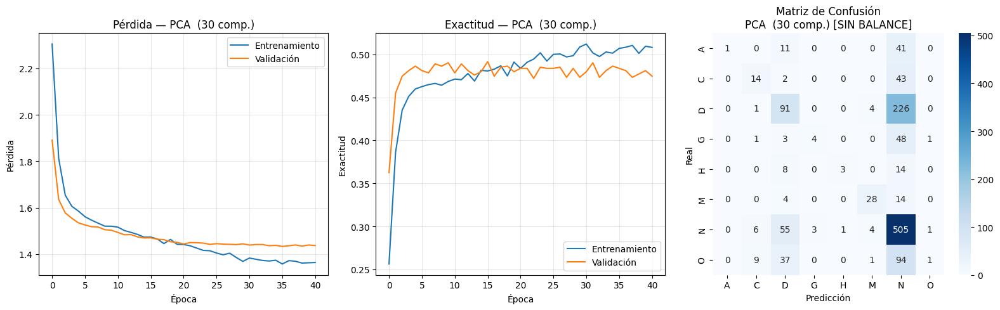


  MLP [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4902  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4871
  Intento 03/10 | Accuracy: 0.4980  🌟 ¡Nuevo récord!
  Intento 04/10 | Accuracy: 0.4746
  Intento 05/10 | Accuracy: 0.4926
  Intento 06/10 | Accuracy: 0.4980
  Intento 07/10 | Accuracy: 0.4926
  Intento 08/10 | Accuracy: 0.4754
  Intento 09/10 | Accuracy: 0.4934
  Intento 10/10 | Accuracy: 0.4754

✅ Búsqueda finalizada en 293.6s
🏆 Mejor accuracy: 0.4980

--- Reporte de clasificación [AF   (30 fact.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.44      0.29      0.35        59
           D       0.44      0.22      0.30       322
           G       0.43      0.05      0.09        57
           H       0.67      0.16      0.26        25
           M       0.75      0.65      0.70        46
           N       0.50      0

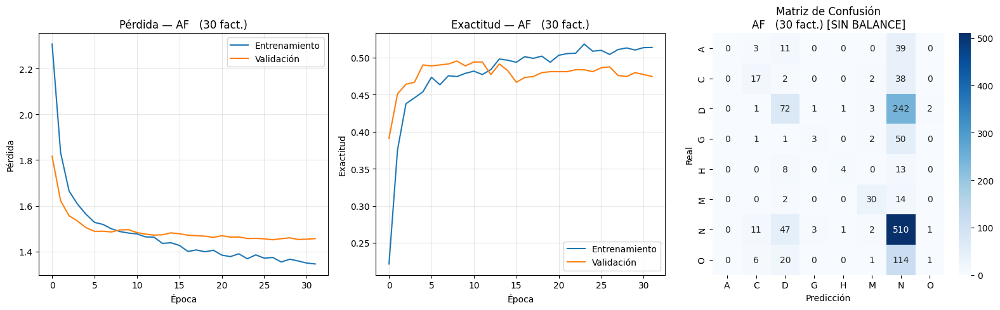


  MLP [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4449  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4410
  Intento 03/10 | Accuracy: 0.4449
  Intento 04/10 | Accuracy: 0.4582  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.4496
  Intento 06/10 | Accuracy: 0.4511
  Intento 07/10 | Accuracy: 0.4464
  Intento 08/10 | Accuracy: 0.4519
  Intento 09/10 | Accuracy: 0.4496
  Intento 10/10 | Accuracy: 0.4543

✅ Búsqueda finalizada en 495.2s
🏆 Mejor accuracy: 0.4582

--- Reporte de clasificación [UMAP (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.46      0.08      0.14       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.46      0

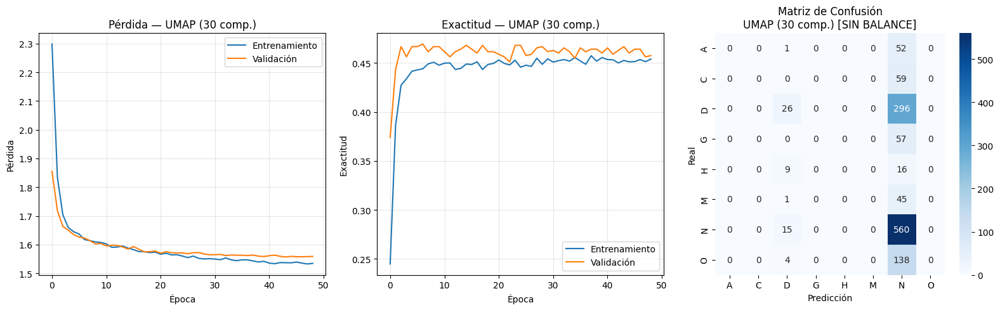

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("\n" + " "*70)
print("  MLP — SIN BALANCEO")
print(" "*70)

resultados_mlp_sin = {}
for nombre, (X_tr, X_te, y_tr) in datasets_mlp.items():
    resultados_mlp_sin[nombre] = buscar_mejor_mlp(
        X_tr, y_tr, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        condicion="SIN BALANCE", color_mapa='Blues'
    )



                                                                      
  MLP — CLASS WEIGHT
                                                                      

  MLP [CLASS WEIGHT] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1814  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1501
  Intento 03/10 | Accuracy: 0.1720
  Intento 04/10 | Accuracy: 0.2048  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.1689
  Intento 06/10 | Accuracy: 0.1360
  Intento 07/10 | Accuracy: 0.1892
  Intento 08/10 | Accuracy: 0.1876
  Intento 09/10 | Accuracy: 0.1642
  Intento 10/10 | Accuracy: 0.1634

✅ Búsqueda finalizada en 332.2s
🏆 Mejor accuracy: 0.2048

--- Reporte de clasificación [PCA  (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.08      0.36      0.13        53
           C       0.22      0.63      0.32        59
           D       0.36      0.22      0.27       322
           G       0.13   

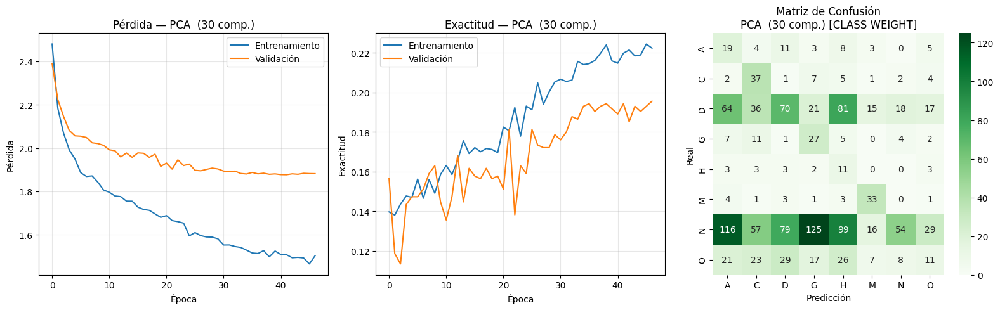


  MLP [CLASS WEIGHT] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1908  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1634
  Intento 03/10 | Accuracy: 0.1681
  Intento 04/10 | Accuracy: 0.2009  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.2033  🌟 ¡Nuevo récord!
  Intento 06/10 | Accuracy: 0.1814
  Intento 07/10 | Accuracy: 0.1822
  Intento 08/10 | Accuracy: 0.1908
  Intento 09/10 | Accuracy: 0.2166  🌟 ¡Nuevo récord!
  Intento 10/10 | Accuracy: 0.1837

✅ Búsqueda finalizada en 261.6s
🏆 Mejor accuracy: 0.2166

--- Reporte de clasificación [AF   (30 fact.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.09      0.28      0.13        53
           C       0.24      0.58      0.34        59
           D       0.34      0.19      0.24       322
           G       0.11      0.47      0.18        57
           H       0.06      0.64      0.11        25
           M       0.47      0.87      0.61   

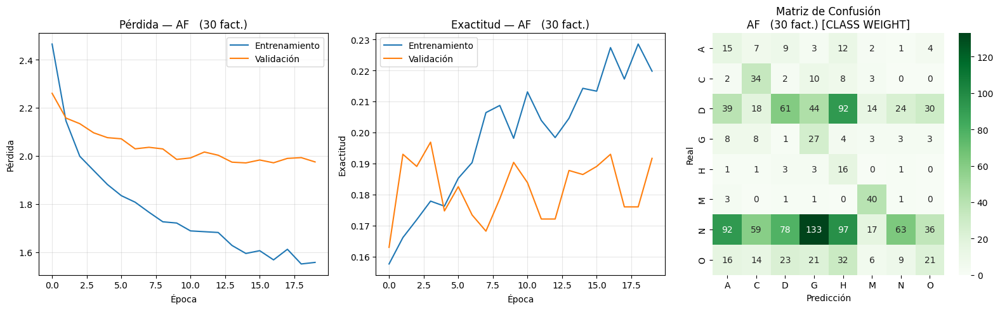


  MLP [CLASS WEIGHT] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1048  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1134  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1439  🌟 ¡Nuevo récord!
  Intento 04/10 | Accuracy: 0.1149
  Intento 05/10 | Accuracy: 0.1360
  Intento 06/10 | Accuracy: 0.1149
  Intento 07/10 | Accuracy: 0.1611  🌟 ¡Nuevo récord!
  Intento 08/10 | Accuracy: 0.1095
  Intento 09/10 | Accuracy: 0.1345
  Intento 10/10 | Accuracy: 0.1142

✅ Búsqueda finalizada en 194.0s
🏆 Mejor accuracy: 0.1611

--- Reporte de clasificación [UMAP (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.15      0.06      0.08        53
           C       0.07      0.14      0.10        59
           D       0.30      0.16      0.21       322
           G       0.13      0.46      0.21        57
           H       0.04      0.52      0.08        25
           M       0.07      0.28      0.11   

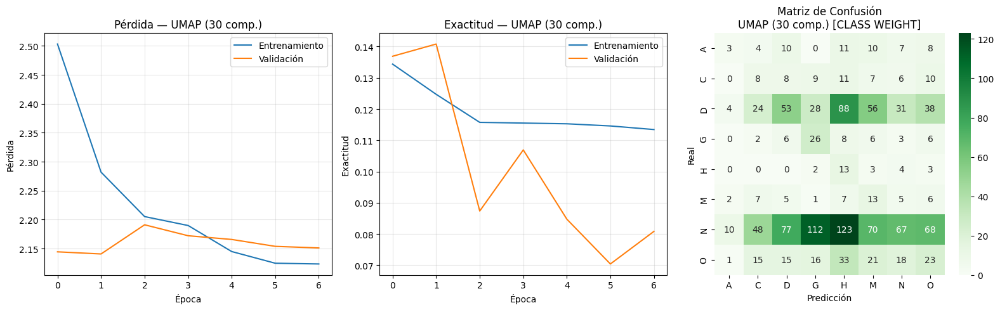

In [ ]:
# ── Ejecución con class weight ─────────────────────────────────────────────
print("\n" + " "*70)
print("  MLP — CLASS WEIGHT")
print(" "*70)

resultados_mlp_cw = {}
for nombre, (X_tr, X_te, y_tr) in datasets_mlp.items():
    resultados_mlp_cw[nombre] = buscar_mejor_mlp(
        X_tr, y_tr, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        pesos_clases=pesos_clases_dict,
        condicion="CLASS WEIGHT", color_mapa='Greens'
    )

In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — MLP")
print("═"*60)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Class Weight':>14}")
print("─"*60)

for nombre in datasets_mlp.keys():
    acc_sin = resultados_mlp_sin[nombre]['accuracy']
    acc_cw  = resultados_mlp_cw[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_cw:>14.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — MLP
════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Class Weight
────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.5059         0.2048
  AF   (30 fact.)                 0.4980         0.2166
  UMAP (30 comp.)                 0.4582         0.1611
════════════════════════════════════════════════════════════


### MLP CLASIFFIER - Scikit Learn



                                                                      
  MLP SKLEARN — SIN BALANCEO
                                                                      

  MLP SKLEARN [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Nota: MLPClassifier no soporta class_weight
  Intento 01/10 | Accuracy: 0.4167  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4535  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4425
  Intento 04/10 | Accuracy: 0.4504
  Intento 05/10 | Accuracy: 0.4347
  Intento 06/10 | Accuracy: 0.4371
  Intento 07/10 | Accuracy: 0.4504
  Intento 08/10 | Accuracy: 0.4347
  Intento 09/10 | Accuracy: 0.4347
  Intento 10/10 | Accuracy: 0.4191

✅ Búsqueda finalizada en 15.2s
🏆 Mejor accuracy: 0.4535
🔄 Épocas entrenadas: 50

--- Reporte de clasificación [PCA  (30 comp.)] ---
              precision    recall  f1-score   support

           A       0.11      0.06      0.07        53
           C       0.28      0.15      0.20        59
           

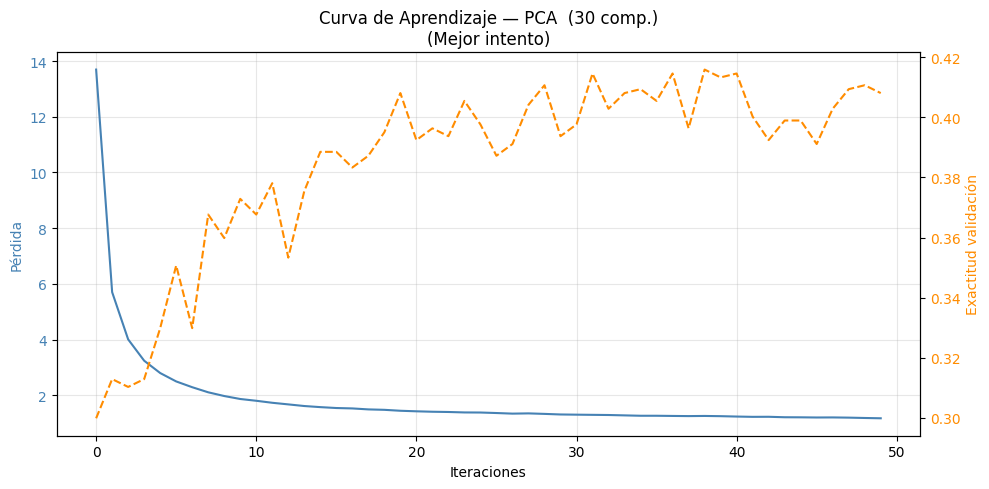

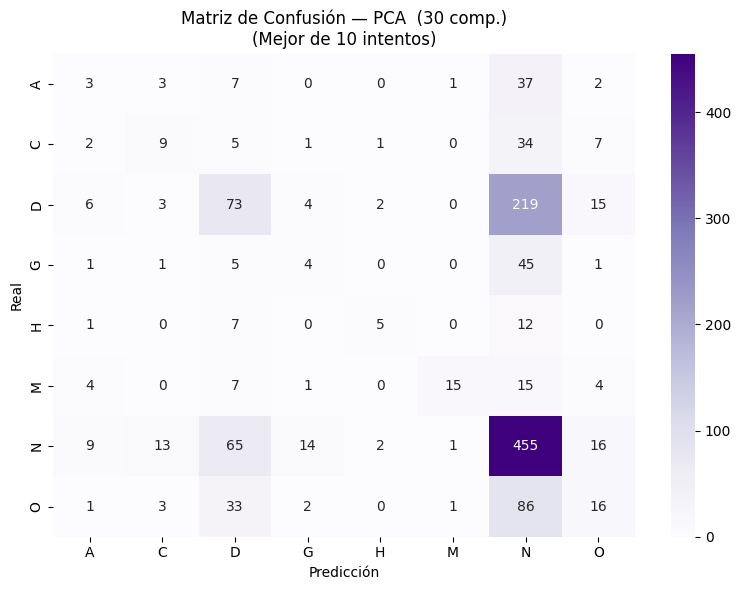


  MLP SKLEARN [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Nota: MLPClassifier no soporta class_weight
  Intento 01/10 | Accuracy: 0.4816  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4691
  Intento 03/10 | Accuracy: 0.4816
  Intento 04/10 | Accuracy: 0.4590
  Intento 05/10 | Accuracy: 0.4730
  Intento 06/10 | Accuracy: 0.4715
  Intento 07/10 | Accuracy: 0.4801
  Intento 08/10 | Accuracy: 0.4832  🌟 ¡Nuevo récord!
  Intento 09/10 | Accuracy: 0.4894  🌟 ¡Nuevo récord!
  Intento 10/10 | Accuracy: 0.4777

✅ Búsqueda finalizada en 10.1s
🏆 Mejor accuracy: 0.4894
🔄 Épocas entrenadas: 35

--- Reporte de clasificación [AF   (30 fact.)] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.58      0.19      0.28        59
           D       0.39      0.22      0.28       322
           G       0.20      0.04      0.06        57
           H       0.00      0.00      0.00        25
   

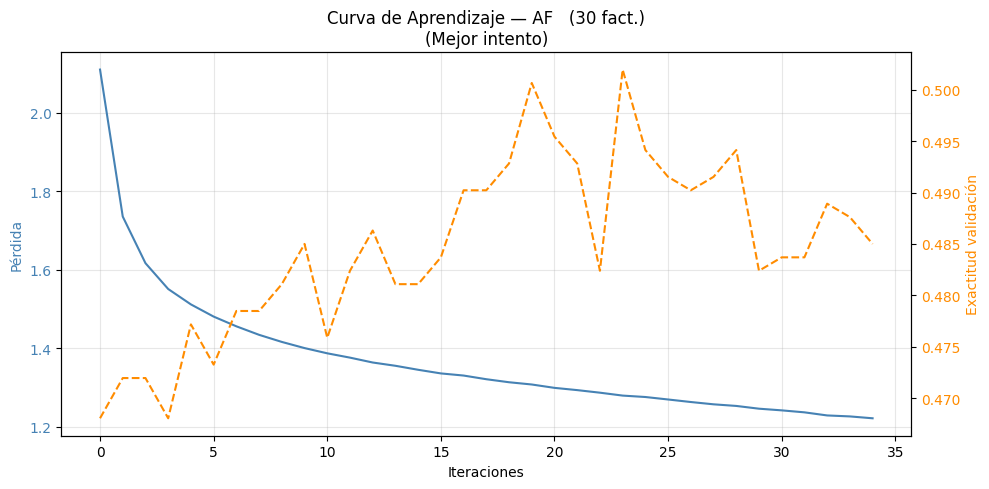

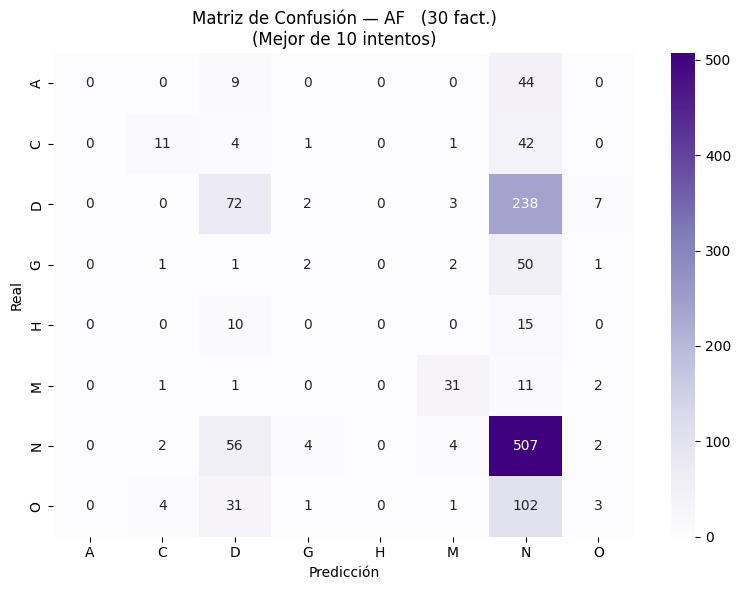


  MLP SKLEARN [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Nota: MLPClassifier no soporta class_weight
  Intento 01/10 | Accuracy: 0.4433  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4511  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4511
  Intento 04/10 | Accuracy: 0.4496
  Intento 05/10 | Accuracy: 0.4511
  Intento 06/10 | Accuracy: 0.4504
  Intento 07/10 | Accuracy: 0.4535  🌟 ¡Nuevo récord!
  Intento 08/10 | Accuracy: 0.4511
  Intento 09/10 | Accuracy: 0.4496
  Intento 10/10 | Accuracy: 0.4511

✅ Búsqueda finalizada en 5.9s
🏆 Mejor accuracy: 0.4535
🔄 Épocas entrenadas: 36

--- Reporte de clasificación [UMAP (30 comp.)] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.40      0.04      0.08       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
    

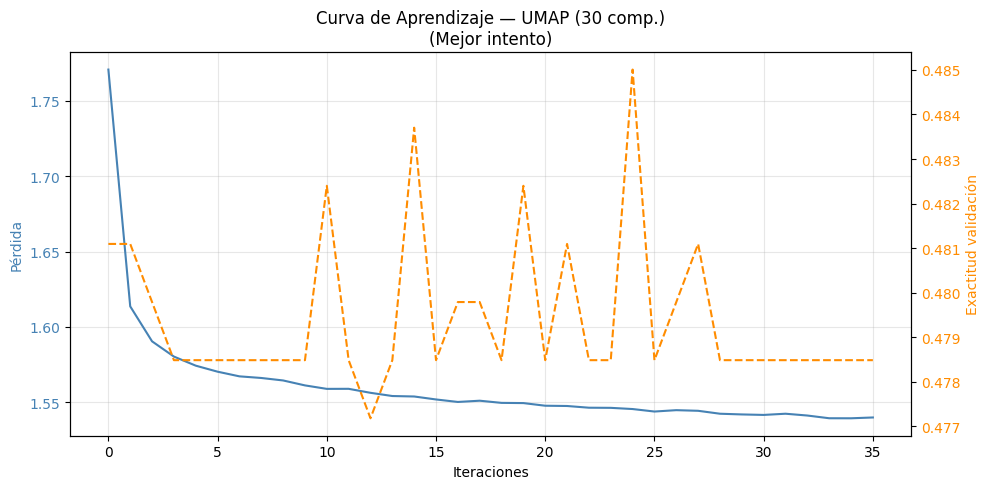

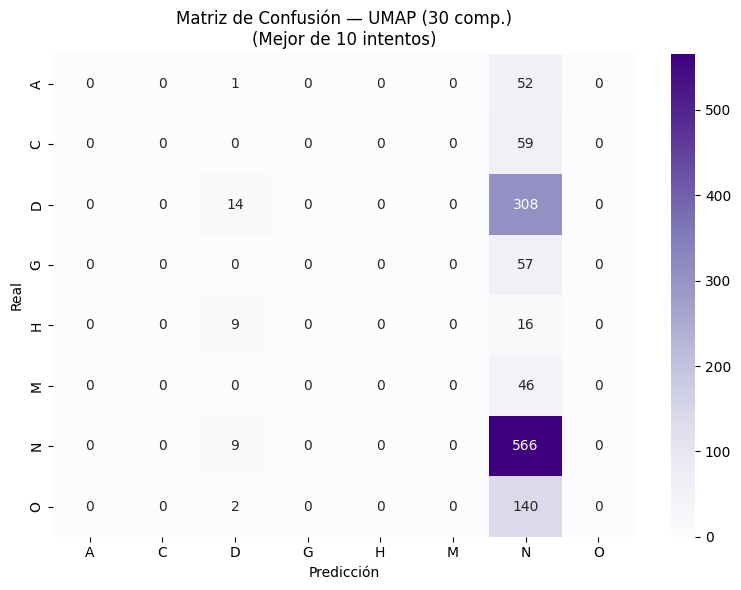


══════════════════════════════════════════════════
  RESUMEN — MLP SKLEARN
══════════════════════════════════════════════════
  Dataset                     Accuracy
──────────────────────────────────────────────────
  PCA  (30 comp.)               0.4535
  AF   (30 fact.)               0.4894
  UMAP (30 comp.)               0.4535
══════════════════════════════════════════════════


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# MLP CLASSIFIER — SCIKIT-LEARN
# ═══════════════════════════════════════════════════════════════════════════
# El MLPClassifier de Scikit-learn es una implementación más ligera del
# Perceptrón Multicapa optimizada para datos tabulares. A diferencia del
# MLP de TensorFlow, usa un solver de optimización completo (Adam) sin
# necesidad de definir épocas manualmente, y detiene el entrenamiento
# automáticamente cuando la validación deja de mejorar.
#
# Nota: MLPClassifier no soporta el parámetro class_weight, por lo que
# este modelo solo se evalúa sin balanceo de clases.
#
# Se usa búsqueda Monte Carlo con 10 semillas porque la inicialización
# aleatoria de pesos puede afectar el resultado final.
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_mlp_sklearn(X_train, y_train, X_test, y_test, semilla=42):
    """
    Entrena y evalúa un MLPClassifier de Scikit-learn con una semilla
    específica.

    Parámetros:
    -----------
    X_train : datos de entrenamiento reducidos
    y_train : etiquetas de entrenamiento
    X_test  : datos de prueba reducidos
    y_test  : etiquetas de prueba
    semilla : semilla para Monte Carlo

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = MLPClassifier(
        hidden_layer_sizes=(64, 32),
        activation='relu',
        solver='adam',
        alpha=0.1,              # Regularización L2
        batch_size=128,
        learning_rate='adaptive',
        learning_rate_init=0.001,
        max_iter=1000,
        early_stopping=True,    # Detiene cuando validación no mejora
        validation_fraction=0.15,
        n_iter_no_change=10,    # Paciencia reducida de 30 a 10
        random_state=semilla,
        verbose=False
    )

    inicio  = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def buscar_mejor_mlp_sklearn(X_train, y_train, X_test, y_test,
                              encoder, etiqueta="PCA",
                              n_intentos=10, color_mapa='Purples'):
    """
    Búsqueda Monte Carlo del mejor MLPClassifier variando la semilla.
    Reporta el modelo con mayor accuracy entre todos los intentos.
    """
    print(f"\n{'='*70}")
    print(f"  MLP SKLEARN [SIN BALANCE] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"  Nota: MLPClassifier no soporta class_weight")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_mlp_sklearn(
            X_train, y_train, X_test, y_test,
            semilla=semilla_actual
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")
    print(f"🔄 Épocas entrenadas: {mejor_resultado['modelo'].n_iter_}")

    # ── Reporte ────────────────────────────────────────────────────────────
    y_pred         = mejor_resultado['y_pred']
    clases_nombres = encoder.classes_
    modelo_ganador = mejor_resultado['modelo']

    print(f"\n--- Reporte de clasificación [{etiqueta}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    # ── Gráfica de curvas de aprendizaje ───────────────────────────────────
    # Se usa doble eje porque pérdida y accuracy tienen escalas diferentes
    fig, ax1 = plt.subplots(figsize=(10, 5))

    ax1.set_xlabel('Iteraciones')
    ax1.set_ylabel('Pérdida', color='steelblue')
    ax1.plot(modelo_ganador.loss_curve_,
             color='steelblue', label='Pérdida entrenamiento')
    ax1.tick_params(axis='y', labelcolor='steelblue')
    ax1.grid(True, alpha=0.3)

    ax2 = ax1.twinx()
    ax2.set_ylabel('Exactitud validación', color='darkorange')
    ax2.plot(modelo_ganador.validation_scores_,
             color='darkorange', linestyle='--',
             label='Exactitud validación')
    ax2.tick_params(axis='y', labelcolor='darkorange')

    plt.title(f'Curva de Aprendizaje — {etiqueta}\n(Mejor intento)')
    fig.tight_layout()
    plt.show()

    # ── Matriz de confusión ────────────────────────────────────────────────
    cm = confusion_matrix(y_test, y_pred)
    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap=color_mapa,
        xticklabels=clases_nombres,
        yticklabels=clases_nombres,
        ax=ax
    )
    ax.set_title(f'Matriz de Confusión — {etiqueta}\n'
                 f'(Mejor de {n_intentos} intentos)')
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.tight_layout()
    plt.show()

    return mejor_resultado


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_mlp_sk = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}

# ── Ejecución ──────────────────────────────────────────────────────────────
print("\n" + " "*70)
print("  MLP SKLEARN — SIN BALANCEO")
print(" "*70)

resultados_mlp_sk = {}
for nombre, (X_tr, X_te) in datasets_mlp_sk.items():
    resultados_mlp_sk[nombre] = buscar_mejor_mlp_sklearn(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10
    )

# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*50)
print("  RESUMEN — MLP SKLEARN")
print("═"*50)
print(f"  {'Dataset':<25} {'Accuracy':>10}")
print("─"*50)

for nombre, res in resultados_mlp_sk.items():
    print(f"  {nombre:<25} {res['accuracy']:>10.4f}")

print("═"*50)

### Análisis discriminante lineal (LDA)

⏳ Entrenando LDA sin balanceo...

  LDA [SIN BALANCE]

>>> PCA  (30 comp.)
    Accuracy : 0.4738
    Tiempo   : 0.0819s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.43      0.22      0.29        59
           D       0.38      0.14      0.21       322
           G       0.44      0.07      0.12        57
           H       0.38      0.36      0.37        25
           M       0.60      0.61      0.60        46
           N       0.48      0.88      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.47      1279
   macro avg       0.34      0.29      0.28      1279
weighted avg       0.38      0.47      0.38      1279



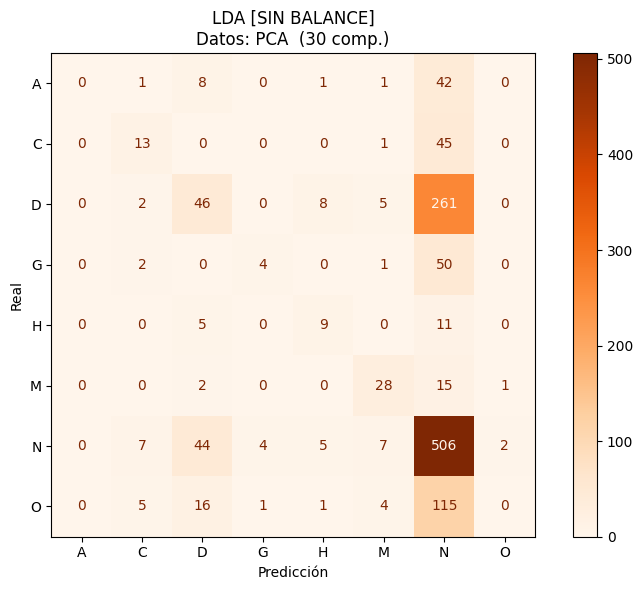


>>> AF   (30 fact.)
    Accuracy : 0.4629
    Tiempo   : 0.0351s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.36      0.17      0.23        59
           D       0.31      0.10      0.15       322
           G       0.08      0.02      0.03        57
           H       0.35      0.36      0.35        25
           M       0.61      0.67      0.64        46
           N       0.48      0.89      0.62       575
           O       0.00      0.00      0.00       142

    accuracy                           0.46      1279
   macro avg       0.27      0.28      0.25      1279
weighted avg       0.34      0.46      0.36      1279



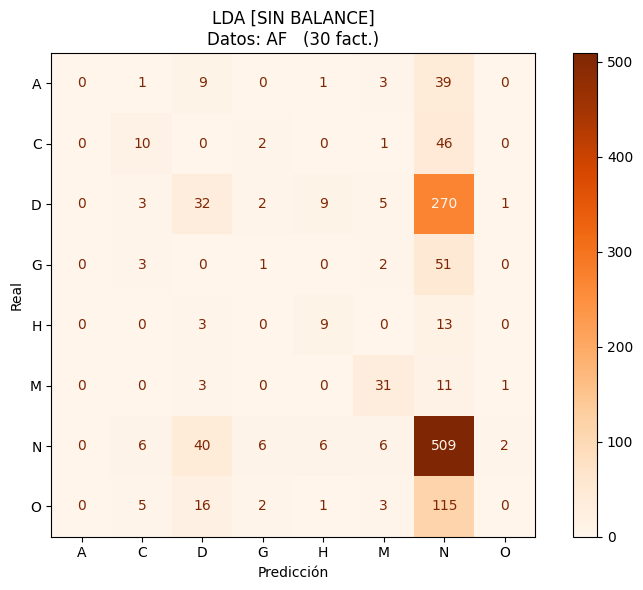


>>> UMAP (30 comp.)
    Accuracy : 0.4378
    Tiempo   : 0.0772s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.33      0.10      0.16        59
           D       0.39      0.04      0.07       322
           G       0.21      0.05      0.08        57
           H       0.38      0.24      0.29        25
           M       0.07      0.04      0.05        46
           N       0.46      0.92      0.61       575
           O       0.00      0.00      0.00       142

    accuracy                           0.44      1279
   macro avg       0.23      0.17      0.16      1279
weighted avg       0.34      0.44      0.31      1279



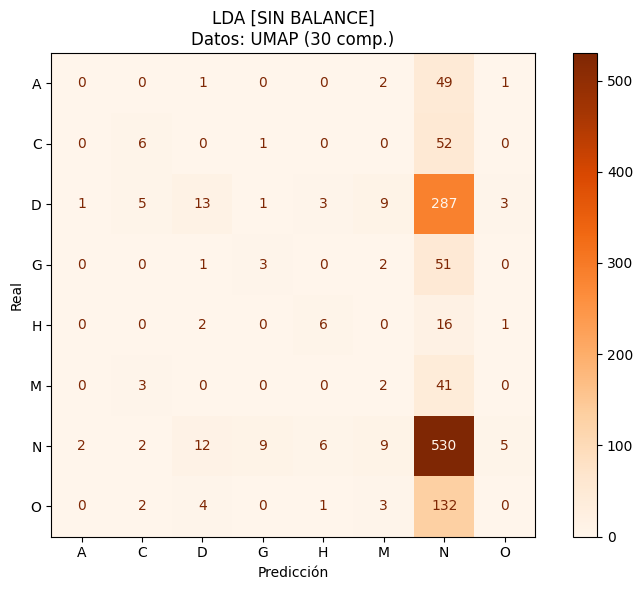

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ANÁLISIS DISCRIMINANTE LINEAL (LDA)
# ═══════════════════════════════════════════════════════════════════════════
# El Análisis Discriminante Lineal busca las proyecciones lineales que
# maximizan la separación entre clases minimizando la varianza intra-clase
# y maximizando la varianza inter-clase. Es especialmente útil cuando las
# clases tienen distribuciones gaussianas.
#
# El balanceo en LDA se realiza mediante el parámetro priors, que define
# la probabilidad a priori de cada clase. Con priors iguales (1/8) se
# fuerza al modelo a tratar todas las clases por igual, independientemente
# de su frecuencia real en los datos.
#
# Nota: LDA es un modelo completamente determinista, por lo que una sola
# corrida es suficiente y reproducible.
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_lda(X_train, y_train, X_test, y_test,
                 balanceado=False, n_clases=8):
    """
    Entrena y evalúa un modelo LDA.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    balanceado : si True usa priors iguales, si False usa frecuencias reales
    n_clases   : número de clases (para calcular priors iguales)

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    # Priors iguales fuerzan al modelo a tratar todas las clases por igual
    priors = [1 / n_clases] * n_clases if balanceado else None

    modelo = LinearDiscriminantAnalysis(
        solver='svd',  # Mejor para espacios de alta dimensión
        priors=priors
    )

    inicio = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def reportar_lda(resultados_por_dataset, y_test, encoder,
                 condicion="SIN BALANCE", color_mapa='Oranges'):
    """
    Genera reporte de clasificación y matriz de confusión para cada
    representación reducida evaluada.
    """
    clases_nombres = encoder.classes_

    print(f"\n{'='*70}")
    print(f"  LDA [{condicion}]")
    print(f"{'='*70}")

    for nombre, res in resultados_por_dataset.items():
        print(f"\n>>> {nombre}")
        print(f"    Accuracy : {res['accuracy']:.4f}")
        print(f"    Tiempo   : {res['tiempo']:.4f}s")
        print(f"\n--- Reporte de clasificación ---")
        print(classification_report(
            y_test, res['y_pred'],
            target_names=clases_nombres,
            zero_division=0
        ))

        fig, ax = plt.subplots(figsize=(8, 6))
        cm   = confusion_matrix(y_test, res['y_pred'])
        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=clases_nombres
        )
        disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
        ax.set_xlabel('Predicción')
        ax.set_ylabel('Real')
        plt.title(f'LDA [{condicion}]\nDatos: {nombre}')
        plt.tight_layout()
        plt.show()


# ── Definición de datasets ─────────────────────────────────────────────────
n_clases = len(encoder.classes_)

datasets_lda = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}

# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("⏳ Entrenando LDA sin balanceo...")
resultados_lda_sin = {}
for nombre, (X_tr, X_te) in datasets_lda.items():
    resultados_lda_sin[nombre] = entrenar_lda(
        X_tr, y_train, X_te, y_test,
        balanceado=False, n_clases=n_clases
    )
reportar_lda(resultados_lda_sin, y_test, encoder,
             condicion="SIN BALANCE", color_mapa='Oranges')



⏳ Entrenando LDA con balanceo (priors iguales)...

  LDA [BALANCEADO (Priors Iguales)]

>>> PCA  (30 comp.)
    Accuracy : 0.2565
    Tiempo   : 0.0354s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.07      0.23      0.11        53
           C       0.22      0.47      0.30        59
           D       0.40      0.27      0.32       322
           G       0.13      0.53      0.21        57
           H       0.12      0.36      0.19        25
           M       0.30      0.72      0.42        46
           N       0.57      0.19      0.29       575
           O       0.13      0.14      0.13       142

    accuracy                           0.26      1279
   macro avg       0.24      0.36      0.25      1279
weighted avg       0.40      0.26      0.27      1279



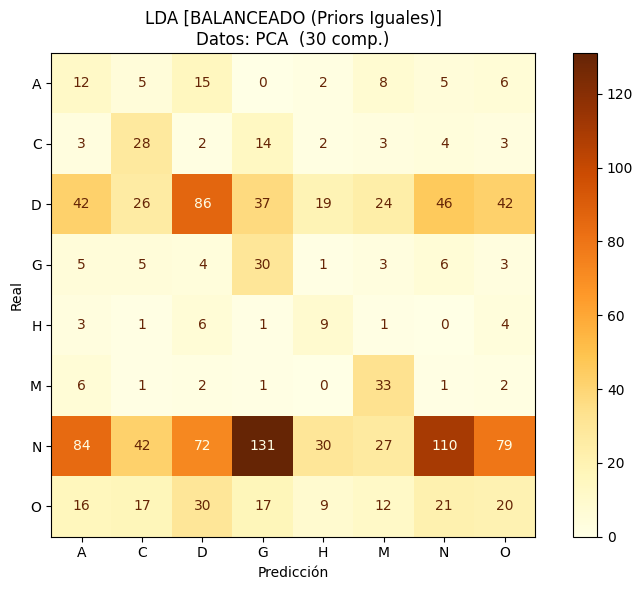


>>> AF   (30 fact.)
    Accuracy : 0.2471
    Tiempo   : 0.0463s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.06      0.19      0.09        53
           C       0.21      0.46      0.29        59
           D       0.36      0.20      0.25       322
           G       0.10      0.40      0.16        57
           H       0.12      0.36      0.18        25
           M       0.31      0.72      0.44        46
           N       0.59      0.22      0.32       575
           O       0.14      0.17      0.15       142

    accuracy                           0.25      1279
   macro avg       0.23      0.34      0.23      1279
weighted avg       0.40      0.25      0.27      1279



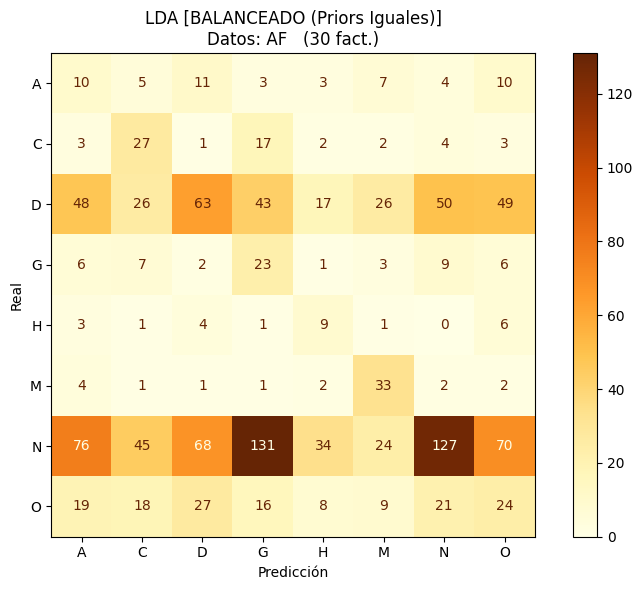


>>> UMAP (30 comp.)
    Accuracy : 0.1517
    Tiempo   : 0.0411s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.06      0.32      0.10        53
           C       0.09      0.20      0.13        59
           D       0.28      0.09      0.13       322
           G       0.12      0.47      0.19        57
           H       0.12      0.32      0.18        25
           M       0.05      0.20      0.08        46
           N       0.49      0.11      0.18       575
           O       0.18      0.20      0.19       142

    accuracy                           0.15      1279
   macro avg       0.18      0.24      0.15      1279
weighted avg       0.33      0.15      0.16      1279



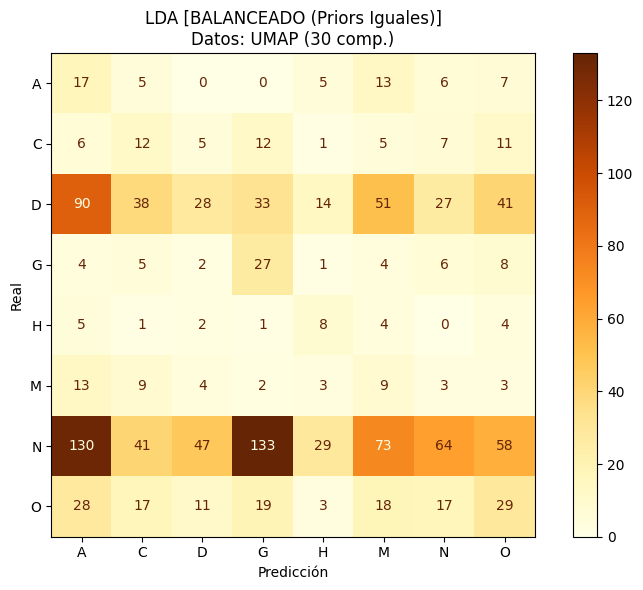

In [ ]:
# ── Ejecución con balanceo (priors iguales) ────────────────────────────────
# priors=[1/8]*8 fuerza al modelo a tratar todas las clases con igual
# probabilidad a priori, compensando el desbalance del dataset.
print("\n⏳ Entrenando LDA con balanceo (priors iguales)...")
resultados_lda_bal = {}
for nombre, (X_tr, X_te) in datasets_lda.items():
    resultados_lda_bal[nombre] = entrenar_lda(
        X_tr, y_train, X_te, y_test,
        balanceado=True, n_clases=n_clases
    )
reportar_lda(resultados_lda_bal, y_test, encoder,
             condicion="BALANCEADO (Priors Iguales)", color_mapa='YlOrBr')


In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — LDA")
print("═"*60)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Priors Iguales':>16}")
print("─"*60)

for nombre in datasets_lda.keys():
    acc_sin = resultados_lda_sin[nombre]['accuracy']
    acc_bal = resultados_lda_bal[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_bal:>16.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — LDA
════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Priors Iguales
────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4738           0.2565
  AF   (30 fact.)                 0.4629           0.2471
  UMAP (30 comp.)                 0.4378           0.1517
════════════════════════════════════════════════════════════


### Modelos basados en distancias: KNN y Clasificador de Centroide

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# K-VECINOS MÁS CERCANOS (KNN) Y
# CLASIFICADOR DE CENTROIDE MÁS CERCANO
# ═══════════════════════════════════════════════════════════════════════════
# Ambos modelos son métodos basados en distancias que clasifican nuevas
# muestras según su proximidad a los datos de entrenamiento.
#
# KNN asigna la clase de los k vecinos más cercanos. Se evalúan dos
# estrategias de votación:
# - Uniforme  : todos los vecinos tienen el mismo peso (sin balance implícito)
# - Distancia : los vecinos más cercanos pesan más (balance implícito)
#
# El Clasificador de Centroide asigna la clase cuyo centroide (promedio)
# es más cercano a la muestra nueva. Es más rápido que KNN pero asume
# que cada clase forma un grupo compacto alrededor de su centroide.
#
# Nota: ambos modelos son completamente deterministas dado un conjunto de
# datos fijo, por lo que una sola corrida es suficiente y reproducible.
# ═══════════════════════════════════════════════════════════════════════════

# ── KNN ───────────────────────────────────────────────────────────────────

def entrenar_knn(X_train, y_train, X_test, y_test, pesos='uniform'):
    """
    Entrena y evalúa un modelo KNN.

    Parámetros:
    -----------
    X_train : datos de entrenamiento reducidos
    y_train : etiquetas de entrenamiento
    X_test  : datos de prueba reducidos
    y_test  : etiquetas de prueba
    pesos   : 'uniform' (voto igual) o 'distance' (peso por cercanía)

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = KNeighborsClassifier(
        n_neighbors=5,
        weights=pesos,
        n_jobs=-1
    )

    inicio = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def reportar_resultados(resultados_por_dataset, y_test, encoder,
                        titulo, color_mapa='Blues'):
    """
    Genera reporte de clasificación y matriz de confusión para cada
    representación reducida evaluada.
    """
    clases_nombres = encoder.classes_

    print(f"\n{'='*70}")
    print(f"  {titulo}")
    print(f"{'='*70}")

    for nombre, res in resultados_por_dataset.items():
        print(f"\n>>> {nombre}")
        print(f"    Accuracy : {res['accuracy']:.4f}")
        print(f"    Tiempo   : {res['tiempo']:.4f}s")
        print(f"\n--- Reporte de clasificación ---")
        print(classification_report(
            y_test, res['y_pred'],
            target_names=clases_nombres,
            zero_division=0
        ))

        fig, ax = plt.subplots(figsize=(8, 6))
        cm   = confusion_matrix(y_test, res['y_pred'])
        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=clases_nombres
        )
        disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
        ax.set_xlabel('Predicción')
        ax.set_ylabel('Real')
        plt.title(f'{titulo}\nDatos: {nombre}')
        plt.tight_layout()
        plt.show()


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_vecinos = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}

# ═══════════════════════════════════════════════════════════════════════════
# CLASIFICADOR DE CENTROIDE MÁS CERCANO
# ═══════════════════════════════════════════════════════════════════════════
# Asigna cada muestra a la clase cuyo centroide (promedio de todas las
# muestras de esa clase) es el más cercano. Es más rápido que KNN pero
# asume que cada clase forma un grupo compacto alrededor de su centroide.
#
# Nota: NearestCentroid no soporta class_weight ni tiene parámetros de
# aleatoriedad, por lo que solo se evalúa una condición sin balanceo.
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_centroide(X_train, y_train, X_test, y_test):
    """
    Entrena y evalúa un Clasificador de Centroide Más Cercano.

    Parámetros:
    -----------
    X_train : datos de entrenamiento reducidos
    y_train : etiquetas de entrenamiento
    X_test  : datos de prueba reducidos
    y_test  : etiquetas de prueba

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = NearestCentroid(metric='euclidean')

    inicio = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }



⏳ Entrenando KNN con pesos uniformes...

  KNN UNIFORME (Sin balance)

>>> PCA  (30 comp.)
    Accuracy : 0.3823
    Tiempo   : 0.0026s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.19      0.15      0.17        53
           C       0.33      0.27      0.30        59
           D       0.28      0.39      0.33       322
           G       0.00      0.00      0.00        57
           H       0.33      0.04      0.07        25
           M       0.91      0.22      0.35        46
           N       0.48      0.56      0.52       575
           O       0.13      0.04      0.06       142

    accuracy                           0.38      1279
   macro avg       0.33      0.21      0.22      1279
weighted avg       0.37      0.38      0.36      1279



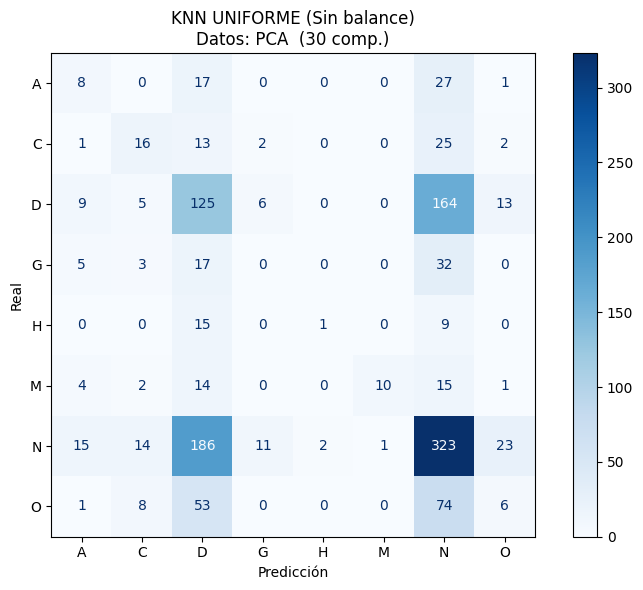


>>> AF   (30 fact.)
    Accuracy : 0.4159
    Tiempo   : 0.0012s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.03      0.02      0.02        53
           C       0.43      0.36      0.39        59
           D       0.32      0.42      0.37       322
           G       0.32      0.11      0.16        57
           H       0.10      0.04      0.06        25
           M       0.87      0.28      0.43        46
           N       0.50      0.61      0.55       575
           O       0.20      0.04      0.07       142

    accuracy                           0.42      1279
   macro avg       0.34      0.23      0.25      1279
weighted avg       0.40      0.42      0.39      1279



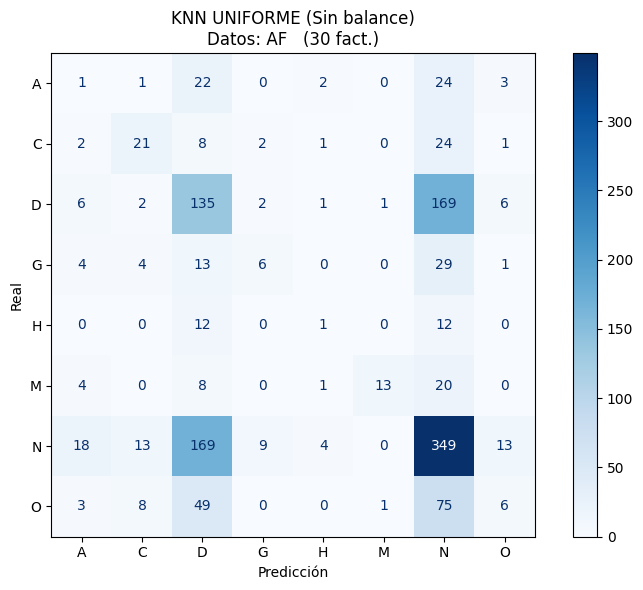


>>> UMAP (30 comp.)
    Accuracy : 0.3925
    Tiempo   : 0.0010s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.06      0.06      0.06        53
           C       0.19      0.15      0.17        59
           D       0.32      0.39      0.35       322
           G       0.15      0.07      0.10        57
           H       0.40      0.08      0.13        25
           M       0.22      0.11      0.14        46
           N       0.49      0.60      0.54       575
           O       0.20      0.06      0.09       142

    accuracy                           0.39      1279
   macro avg       0.25      0.19      0.20      1279
weighted avg       0.36      0.39      0.36      1279



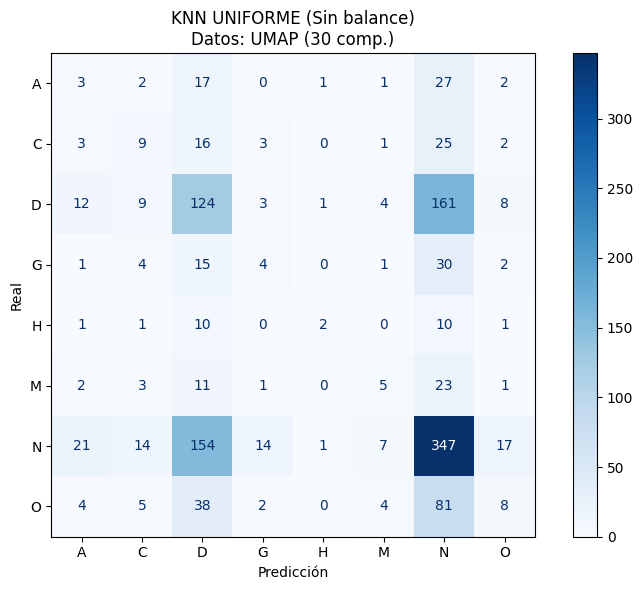

In [ ]:
# ── Ejecución KNN uniforme ─────────────────────────────────────────────────
print("⏳ Entrenando KNN con pesos uniformes...")
resultados_knn_uniform = {}
for nombre, (X_tr, X_te) in datasets_vecinos.items():
    resultados_knn_uniform[nombre] = entrenar_knn(
        X_tr, y_train, X_te, y_test, pesos='uniform'
    )
reportar_resultados(resultados_knn_uniform, y_test, encoder,
                    titulo="KNN UNIFORME (Sin balance)",
                    color_mapa='Blues')


⏳ Entrenando KNN con pesos por distancia...

  KNN DISTANCIA (Balance implícito)

>>> PCA  (30 comp.)
    Accuracy : 0.4058
    Tiempo   : 0.0023s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.16      0.08      0.10        53
           C       0.33      0.22      0.27        59
           D       0.30      0.33      0.31       322
           G       0.05      0.02      0.03        57
           H       1.00      0.04      0.08        25
           M       0.90      0.20      0.32        46
           N       0.50      0.65      0.56       575
           O       0.16      0.11      0.13       142

    accuracy                           0.41      1279
   macro avg       0.43      0.20      0.22      1279
weighted avg       0.39      0.41      0.38      1279



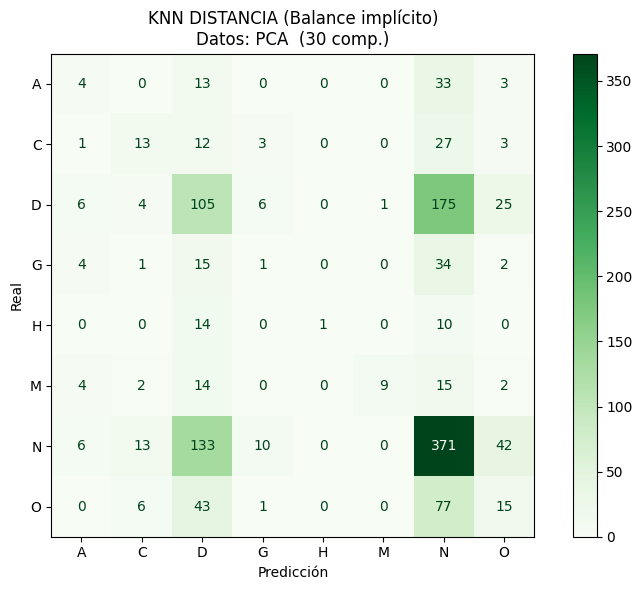


>>> AF   (30 fact.)
    Accuracy : 0.4269
    Tiempo   : 0.0012s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.04      0.02      0.03        53
           C       0.49      0.32      0.39        59
           D       0.36      0.37      0.36       322
           G       0.28      0.09      0.13        57
           H       0.09      0.04      0.06        25
           M       0.88      0.30      0.45        46
           N       0.49      0.65      0.56       575
           O       0.19      0.08      0.12       142

    accuracy                           0.43      1279
   macro avg       0.35      0.23      0.26      1279
weighted avg       0.40      0.43      0.40      1279



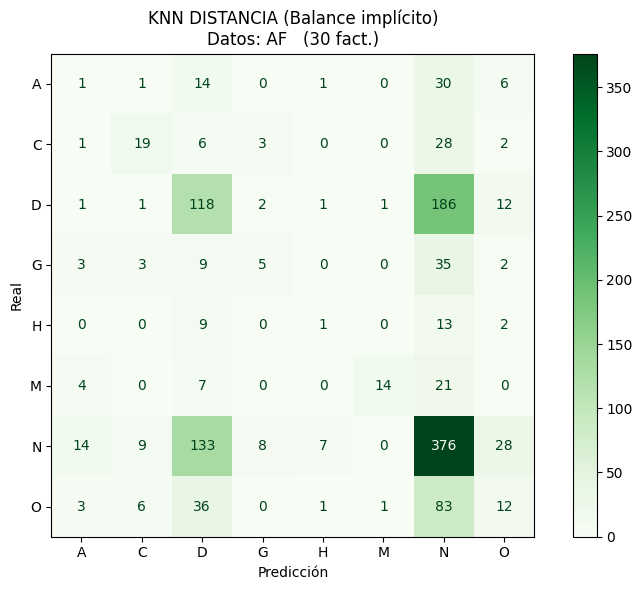


>>> UMAP (30 comp.)
    Accuracy : 0.3839
    Tiempo   : 0.0011s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.04      0.02      0.03        53
           C       0.23      0.12      0.16        59
           D       0.30      0.28      0.29       322
           G       0.17      0.07      0.10        57
           H       0.20      0.08      0.11        25
           M       0.15      0.09      0.11        46
           N       0.48      0.64      0.55       575
           O       0.14      0.08      0.10       142

    accuracy                           0.38      1279
   macro avg       0.21      0.17      0.18      1279
weighted avg       0.34      0.38      0.35      1279



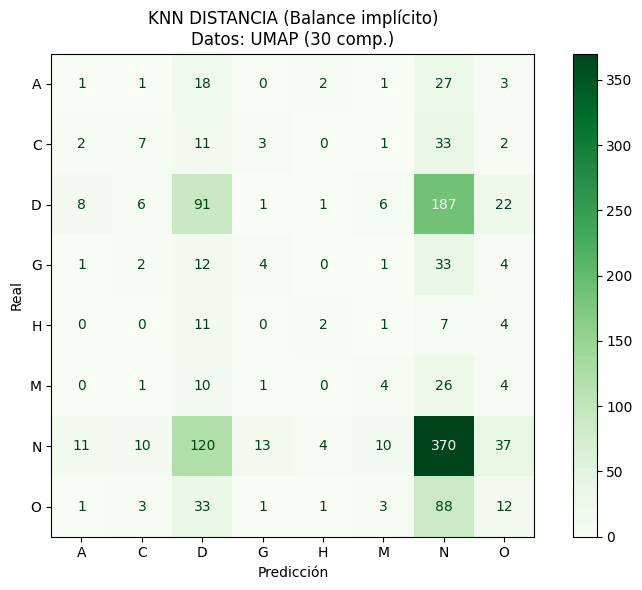

In [ ]:
# ── Ejecución KNN por distancia ────────────────────────────────────────────
# Con pesos por distancia los vecinos más cercanos tienen mayor influencia,
# lo que puede compensar parcialmente el desbalance de clases.
print("\n⏳ Entrenando KNN con pesos por distancia...")
resultados_knn_dist = {}
for nombre, (X_tr, X_te) in datasets_vecinos.items():
    resultados_knn_dist[nombre] = entrenar_knn(
        X_tr, y_train, X_te, y_test, pesos='distance'
    )
reportar_resultados(resultados_knn_dist, y_test, encoder,
                    titulo="KNN DISTANCIA (Balance implícito)",
                    color_mapa='Greens')



In [ ]:
# ── Tabla resumen KNN ──────────────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — KNN")
print("═"*60)
print(f"  {'Dataset':<25} {'Uniforme':>10} {'Distancia':>12}")
print("─"*60)

for nombre in datasets_vecinos.keys():
    acc_u = resultados_knn_uniform[nombre]['accuracy']
    acc_d = resultados_knn_dist[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_u:>10.4f} {acc_d:>12.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — KNN
════════════════════════════════════════════════════════════
  Dataset                     Uniforme    Distancia
────────────────────────────────────────────────────────────
  PCA  (30 comp.)               0.3823       0.4058
  AF   (30 fact.)               0.4159       0.4269
  UMAP (30 comp.)               0.3925       0.3839
════════════════════════════════════════════════════════════



⏳ Entrenando Clasificador de Centroide...

  CLASIFICADOR DE CENTROIDE MÁS CERCANO

>>> PCA  (30 comp.)
    Accuracy : 0.1493
    Tiempo   : 0.0063s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.03      0.02      0.02        53
           C       0.12      0.27      0.17        59
           D       0.30      0.04      0.07       322
           G       0.09      0.72      0.16        57
           H       0.11      0.28      0.16        25
           M       0.09      0.59      0.15        46
           N       0.48      0.12      0.19       575
           O       0.16      0.11      0.13       142

    accuracy                           0.15      1279
   macro avg       0.17      0.27      0.13      1279
weighted avg       0.32      0.15      0.14      1279



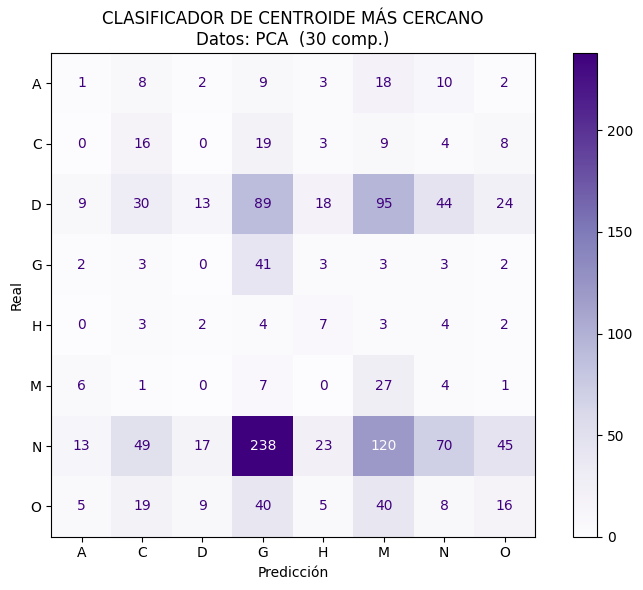


>>> AF   (30 fact.)
    Accuracy : 0.2455
    Tiempo   : 0.0043s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.07      0.21      0.10        53
           C       0.21      0.44      0.29        59
           D       0.34      0.19      0.25       322
           G       0.11      0.46      0.18        57
           H       0.12      0.36      0.18        25
           M       0.33      0.72      0.46        46
           N       0.58      0.21      0.31       575
           O       0.13      0.17      0.15       142

    accuracy                           0.25      1279
   macro avg       0.24      0.34      0.24      1279
weighted avg       0.39      0.25      0.26      1279



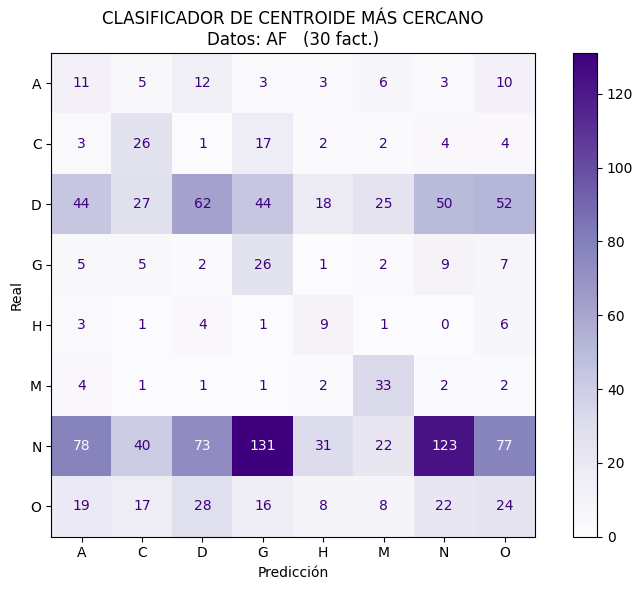


>>> UMAP (30 comp.)
    Accuracy : 0.1439
    Tiempo   : 0.0041s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.06      0.06        53
           C       0.00      0.00      0.00        59
           D       0.32      0.10      0.15       322
           G       0.08      0.65      0.15        57
           H       0.00      0.00      0.00        25
           M       0.04      0.35      0.07        46
           N       0.49      0.15      0.23       575
           O       0.09      0.06      0.07       142

    accuracy                           0.14      1279
   macro avg       0.14      0.17      0.09      1279
weighted avg       0.32      0.14      0.16      1279



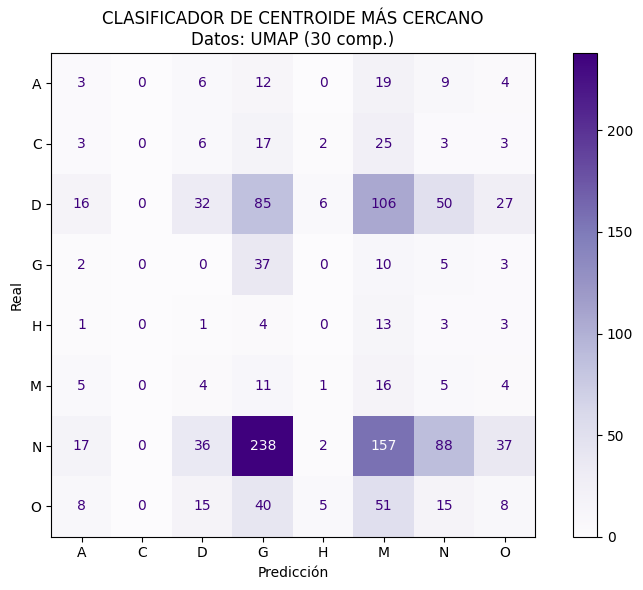

In [ ]:
# ── Ejecución ──────────────────────────────────────────────────────────────
print("\n⏳ Entrenando Clasificador de Centroide...")
resultados_centroide = {}
for nombre, (X_tr, X_te) in datasets_vecinos.items():
    resultados_centroide[nombre] = entrenar_centroide(
        X_tr, y_train, X_te, y_test
    )
reportar_resultados(resultados_centroide, y_test, encoder,
                    titulo="CLASIFICADOR DE CENTROIDE MÁS CERCANO",
                    color_mapa='Purples')


In [ ]:
# ── Tabla resumen Centroide ────────────────────────────────────────────────
print("\n" + "═"*50)
print("  RESUMEN — CLASIFICADOR DE CENTROIDE")
print("═"*50)
print(f"  {'Dataset':<25} {'Accuracy':>10}")
print("─"*50)

for nombre, res in resultados_centroide.items():
    print(f"  {nombre:<25} {res['accuracy']:>10.4f}")

print("═"*50)


══════════════════════════════════════════════════
  RESUMEN — CLASIFICADOR DE CENTROIDE
══════════════════════════════════════════════════
  Dataset                     Accuracy
──────────────────────────────────────────────────
  PCA  (30 comp.)               0.1493
  AF   (30 fact.)               0.2455
  UMAP (30 comp.)               0.1439
══════════════════════════════════════════════════


### Modelos Probabilísticos: Gaussian Naive Bayes y Complement Naive Bayes

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# MODELOS PROBABILÍSTICOS NAIVE BAYES
# ═══════════════════════════════════════════════════════════════════════════
# Los modelos Naive Bayes aplican el teorema de Bayes asumiendo independencia
# condicional entre características. Son modelos probabilísticos que estiman
# la probabilidad de pertenencia a cada clase.
#
# Se evalúan dos variantes:
#
# - Gaussian Naive Bayes: asume que las características siguen una
#   distribución gaussiana. Es el más común para datos continuos como
#   los componentes de PCA, AF y UMAP.
#
# - Complement Naive Bayes: diseñado específicamente para datos
#   desbalanceados. En lugar de modelar cada clase, modela el complemento
#   (todas las otras clases). Requiere valores no negativos, por lo que
#   se aplica un MinMaxScaler interno antes del entrenamiento.
#   Importante: el scaler se ajusta SOLO sobre entrenamiento para evitar
#   fuga de información hacia los datos de prueba.
#
# Nota: ambos modelos son completamente deterministas dado un conjunto de
# datos fijo, por lo que una sola corrida es suficiente y reproducible.
# ═══════════════════════════════════════════════════════════════════════════

def reportar_naive_bayes(resultados_por_dataset, y_test, encoder,
                         titulo, color_mapa='Oranges'):
    """
    Genera reporte de clasificación y matriz de confusión para cada
    representación reducida evaluada en los modelos Naive Bayes.

    Parámetros:
    -----------
    resultados_por_dataset : diccionario con resultados por reducción
    y_test                 : etiquetas reales de prueba
    encoder                : LabelEncoder con nombres de clases
    titulo                 : título descriptivo del modelo
    color_mapa             : color para la matriz de confusión
    """
    clases_nombres = encoder.classes_

    print(f"\n{'='*70}")
    print(f"  {titulo}")
    print(f"{'='*70}")

    for nombre, res in resultados_por_dataset.items():
        print(f"\n>>> {nombre}")
        print(f"    Accuracy : {res['accuracy']:.4f}")
        print(f"    Tiempo   : {res['tiempo']:.4f}s")
        print(f"\n--- Reporte de clasificación ---")
        print(classification_report(
            y_test, res['y_pred'],
            target_names=clases_nombres,
            zero_division=0
        ))

        fig, ax = plt.subplots(figsize=(8, 6))
        cm   = confusion_matrix(y_test, res['y_pred'])
        disp = ConfusionMatrixDisplay(
            confusion_matrix=cm,
            display_labels=clases_nombres
        )
        disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
        ax.set_xlabel('Predicción')
        ax.set_ylabel('Real')
        plt.title(f'{titulo}\nDatos: {nombre}')
        plt.tight_layout()
        plt.show()


def entrenar_gaussian_nb(X_train, y_train, X_test, y_test):
    """
    Entrena y evalúa un modelo Gaussian Naive Bayes.

    Parámetros:
    -----------
    X_train : datos de entrenamiento reducidos
    y_train : etiquetas de entrenamiento
    X_test  : datos de prueba reducidos
    y_test  : etiquetas de prueba

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = GaussianNB()

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def entrenar_complement_nb(X_train, y_train, X_test, y_test):
    """
    Entrena y evalúa un modelo Complement Naive Bayes.
    Aplica MinMaxScaler internamente porque ComplementNB requiere
    valores no negativos. El scaler se ajusta solo sobre entrenamiento
    para evitar fuga de información hacia los datos de prueba.

    Parámetros:
    -----------
    X_train : datos de entrenamiento reducidos
    y_train : etiquetas de entrenamiento
    X_test  : datos de prueba reducidos
    y_test  : etiquetas de prueba

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    # Corrección de valores negativos — fit solo en train
    scaler      = MinMaxScaler()
    X_train_pos = scaler.fit_transform(X_train)
    X_test_pos  = scaler.transform(X_test)

    modelo = ComplementNB()

    inicio   = time.time()
    modelo.fit(X_train_pos, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test_pos)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_nb = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}



⏳ Entrenando Gaussian Naive Bayes...

  GAUSSIAN NAIVE BAYES

>>> PCA  (30 comp.)
    Accuracy : 0.3041
    Tiempo   : 0.0063s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.33      0.02      0.04        53
           C       0.20      0.19      0.19        59
           D       0.27      0.70      0.39       322
           G       0.12      0.07      0.09        57
           H       0.32      0.28      0.30        25
           M       0.28      0.65      0.39        46
           N       0.52      0.19      0.28       575
           O       0.14      0.02      0.04       142

    accuracy                           0.30      1279
   macro avg       0.27      0.26      0.21      1279
weighted avg       0.36      0.30      0.26      1279



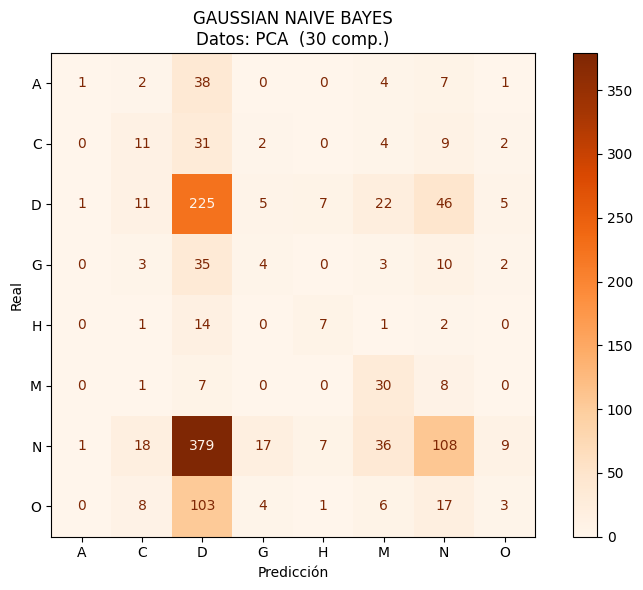


>>> AF   (30 fact.)
    Accuracy : 0.2502
    Tiempo   : 0.0039s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.21      0.08      0.12        59
           D       0.27      0.70      0.39       322
           G       0.08      0.11      0.09        57
           H       0.16      0.28      0.21        25
           M       0.27      0.70      0.39        46
           N       0.53      0.03      0.05       575
           O       0.19      0.19      0.19       142

    accuracy                           0.25      1279
   macro avg       0.21      0.26      0.18      1279
weighted avg       0.35      0.25      0.17      1279



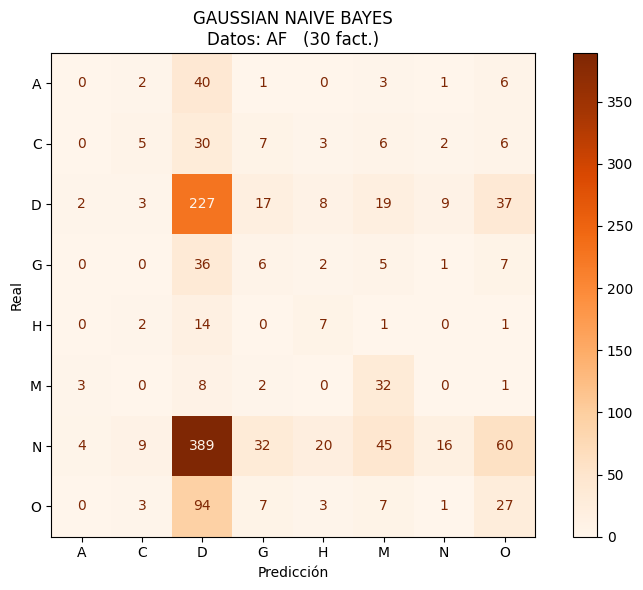


>>> UMAP (30 comp.)
    Accuracy : 0.2776
    Tiempo   : 0.0030s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.06      0.05        53
           C       0.25      0.08      0.13        59
           D       0.31      0.46      0.37       322
           G       0.13      0.46      0.20        57
           H       0.13      0.36      0.19        25
           M       0.06      0.13      0.09        46
           N       0.49      0.27      0.35       575
           O       0.09      0.02      0.03       142

    accuracy                           0.28      1279
   macro avg       0.19      0.23      0.18      1279
weighted avg       0.33      0.28      0.28      1279



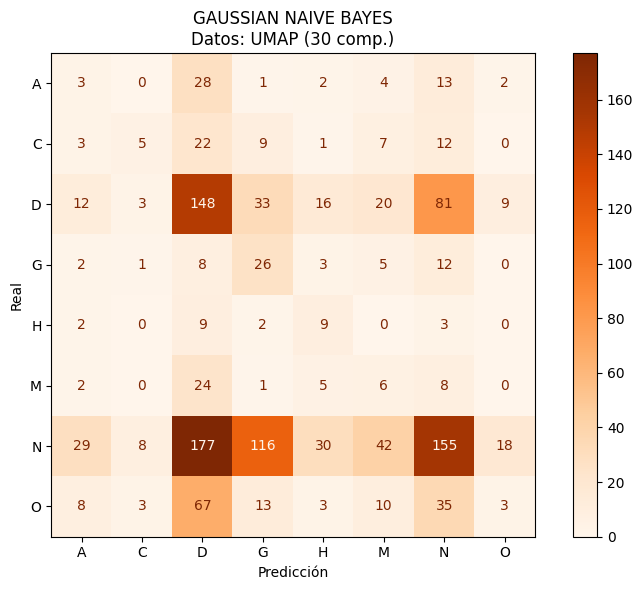

In [ ]:
# ── Ejecución Gaussian NB ──────────────────────────────────────────────────
print("⏳ Entrenando Gaussian Naive Bayes...")
resultados_gnb = {}
for nombre, (X_tr, X_te) in datasets_nb.items():
    resultados_gnb[nombre] = entrenar_gaussian_nb(
        X_tr, y_train, X_te, y_test
    )
reportar_naive_bayes(resultados_gnb, y_test, encoder,
                     titulo="GAUSSIAN NAIVE BAYES",
                     color_mapa='Oranges')



⏳ Entrenando Complement Naive Bayes...

  COMPLEMENT NAIVE BAYES

>>> PCA  (30 comp.)
    Accuracy : 0.3964
    Tiempo   : 0.0030s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.50      0.02      0.04        53
           C       0.22      0.42      0.29        59
           D       0.33      0.42      0.37       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.19      0.46      0.27        46
           N       0.53      0.55      0.54       575
           O       0.27      0.05      0.08       142

    accuracy                           0.40      1279
   macro avg       0.26      0.24      0.20      1279
weighted avg       0.39      0.40      0.37      1279



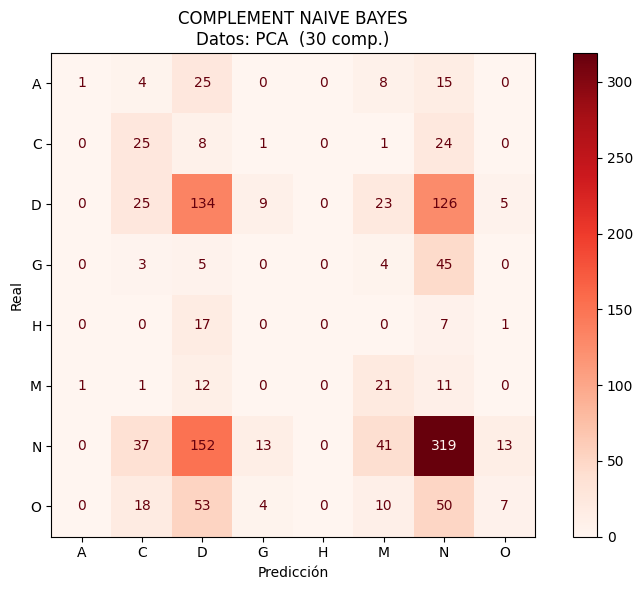


>>> AF   (30 fact.)
    Accuracy : 0.3659
    Tiempo   : 0.0023s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.28      0.14      0.18        59
           D       0.30      0.46      0.36       322
           G       0.00      0.00      0.00        57
           H       1.00      0.04      0.08        25
           M       0.14      0.50      0.22        46
           N       0.52      0.49      0.50       575
           O       0.19      0.07      0.10       142

    accuracy                           0.37      1279
   macro avg       0.30      0.21      0.18      1279
weighted avg       0.37      0.37      0.35      1279



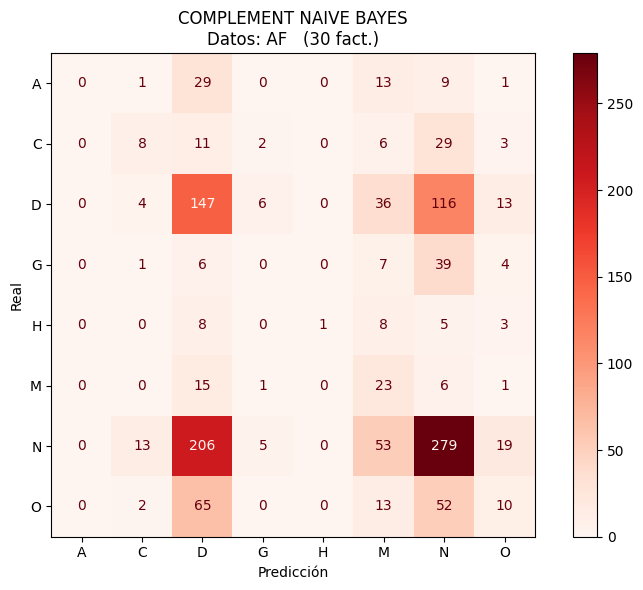


>>> UMAP (30 comp.)
    Accuracy : 0.3753
    Tiempo   : 0.0024s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.29      0.51      0.37       322
           G       0.07      0.05      0.06        57
           H       0.00      0.00      0.00        25
           M       0.07      0.09      0.08        46
           N       0.53      0.54      0.53       575
           O       0.00      0.00      0.00       142

    accuracy                           0.38      1279
   macro avg       0.12      0.15      0.13      1279
weighted avg       0.32      0.38      0.34      1279



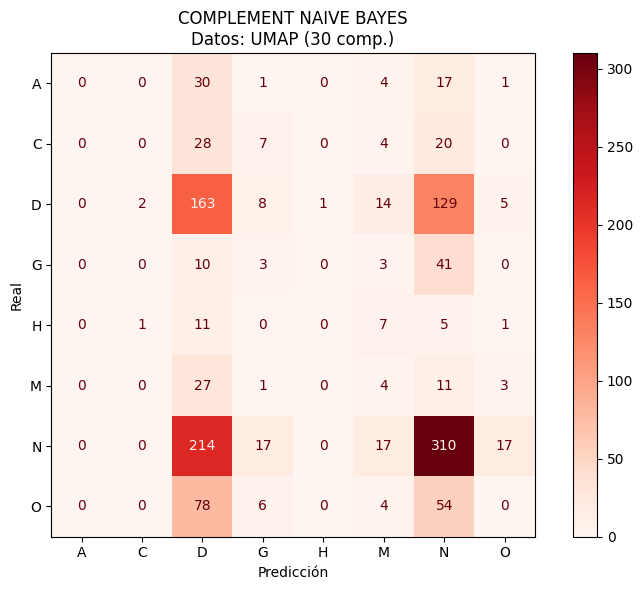

In [ ]:
# ── Ejecución Complement NB ────────────────────────────────────────────────
print("\n⏳ Entrenando Complement Naive Bayes...")
resultados_cnb = {}
for nombre, (X_tr, X_te) in datasets_nb.items():
    resultados_cnb[nombre] = entrenar_complement_nb(
        X_tr, y_train, X_te, y_test
    )
reportar_naive_bayes(resultados_cnb, y_test, encoder,
                     titulo="COMPLEMENT NAIVE BAYES",
                     color_mapa='Reds')

In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — NAIVE BAYES")
print("═"*60)
print(f"  {'Dataset':<25} {'Gaussian':>10} {'Complement':>12}")
print("─"*60)

for nombre in datasets_nb.keys():
    acc_g = resultados_gnb[nombre]['accuracy']
    acc_c = resultados_cnb[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_g:>10.4f} {acc_c:>12.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — NAIVE BAYES
════════════════════════════════════════════════════════════
  Dataset                     Gaussian   Complement
────────────────────────────────────────────────────────────
  PCA  (30 comp.)               0.3041       0.3964
  AF   (30 fact.)               0.2502       0.3659
  UMAP (30 comp.)               0.2776       0.3753
════════════════════════════════════════════════════════════


### Árboles de decisión

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ÁRBOLES DE DECISIÓN
# ═══════════════════════════════════════════════════════════════════════════
# Los Árboles de Decisión construyen reglas de clasificación jerárquicas
# dividiendo recursivamente el espacio de características según el criterio
# de Gini. Son modelos interpretables que permiten visualizar las reglas
# aprendidas.
#
# La profundidad máxima se limita a 10 para evitar sobreajuste, y se
# controla adicionalmente mediante class_weight para el balanceo.
#
# Se usa búsqueda Monte Carlo con 10 semillas porque DecisionTreeClassifier
# usa aleatoriedad para romper empates en los splits, lo que puede afectar
# la estructura del árbol resultante.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_arbol(X_train, y_train, X_test, y_test,
                   semilla=42, balanceado=False):
    """
    Entrena y evalúa un Árbol de Decisión con una semilla específica.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    semilla    : semilla para Monte Carlo
    balanceado : si True usa class_weight='balanced'

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = DecisionTreeClassifier(
        criterion='gini',
        max_depth=10,
        class_weight='balanced' if balanceado else None,
        random_state=semilla
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def buscar_mejor_arbol(X_train, y_train, X_test, y_test,
                       encoder, etiqueta="PCA",
                       n_intentos=10, balanceado=False,
                       condicion="SIN BALANCE", color_mapa='Oranges'):
    """
    Búsqueda Monte Carlo del mejor Árbol de Decisión variando la semilla.
    """
    print(f"\n{'='*70}")
    print(f"  ÁRBOL DE DECISIÓN [{condicion}] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_arbol(
            X_train, y_train, X_test, y_test,
            semilla=semilla_actual, balanceado=balanceado
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte ────────────────────────────────────────────────────────────
    clases_nombres = encoder.classes_
    y_pred         = mejor_resultado['y_pred']

    print(f"\n--- Reporte de clasificación [{etiqueta} | {condicion}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    # ── Matriz de confusión ────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 6))
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        display_labels=clases_nombres,
        cmap=color_mapa,
        ax=ax,
        colorbar=True
    )
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.title(f'Árbol de Decisión [{condicion}]\nDatos: {etiqueta}')
    plt.tight_layout()
    plt.show()

    return mejor_resultado


def graficar_arbol(modelo, etiqueta, encoder, n_componentes, profundidad=3):
    """
    Visualiza la estructura del árbol de decisión hasta una profundidad dada.

    Parámetros:
    -----------
    modelo       : modelo DecisionTreeClassifier entrenado
    etiqueta     : nombre descriptivo para el título
    encoder      : LabelEncoder con nombres de clases
    n_componentes: número de componentes del espacio reducido
    profundidad  : niveles del árbol a mostrar (default 3)
    """
    clases_nombres  = encoder.classes_
    nombres_features = [f"Comp {i+1}" for i in range(n_componentes)]

    plt.figure(figsize=(34, 14), dpi=100)

    anotaciones = plot_tree(
        modelo,
        max_depth=profundidad,
        feature_names=nombres_features,
        class_names=clases_nombres,
        filled=True,
        rounded=True,
        fontsize=11,
        precision=2,
        impurity=False
    )

    # Limpieza de texto: eliminar líneas de 'value' y corchetes
    for texto in anotaciones:
        lineas     = texto.get_text().split('\n')
        lineas_limpias = [
            l for l in lineas
            if not l.startswith('value')
            and '[' not in l
            and ']' not in l
        ]
        texto.set_text('\n'.join(lineas_limpias))

    plt.title(f'Estructura del Árbol — {etiqueta} (Profundidad {profundidad})',
              fontsize=18, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_arboles = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca,  n_componentes),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af,   n_factores),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap, n_componentes_umap)
}

# Diccionario para guardar mejores modelos y poder graficarlos
modelos_arboles = {}




                                                                      
  ÁRBOLES DE DECISIÓN — SIN BALANCEO
                                                                      

  ÁRBOL DE DECISIÓN [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4253  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4269  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4339  🌟 ¡Nuevo récord!
  Intento 04/10 | Accuracy: 0.4261
  Intento 05/10 | Accuracy: 0.4308
  Intento 06/10 | Accuracy: 0.4269
  Intento 07/10 | Accuracy: 0.4300
  Intento 08/10 | Accuracy: 0.4277
  Intento 09/10 | Accuracy: 0.4308
  Intento 10/10 | Accuracy: 0.4300

✅ Búsqueda finalizada en 3.0s
🏆 Mejor accuracy: 0.4339

--- Reporte de clasificación [PCA  (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.39      0.12      0.18        59
           D       0.34      0.28   

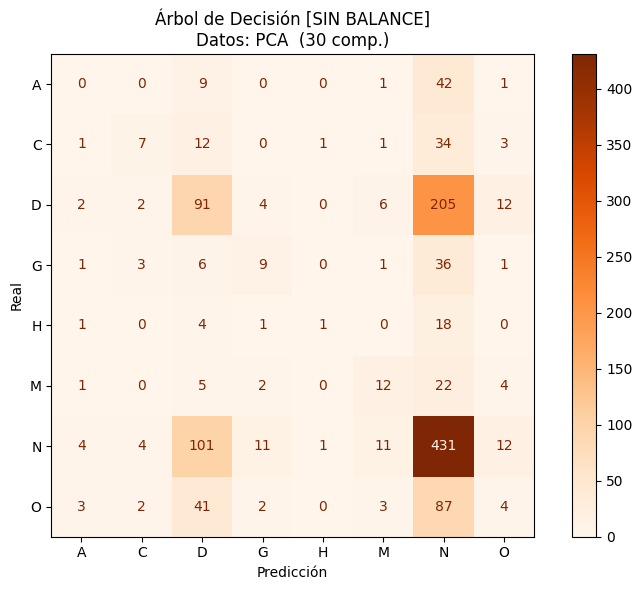


  ÁRBOL DE DECISIÓN [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4089  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4066
  Intento 03/10 | Accuracy: 0.4089
  Intento 04/10 | Accuracy: 0.4081
  Intento 05/10 | Accuracy: 0.4058
  Intento 06/10 | Accuracy: 0.4105  🌟 ¡Nuevo récord!
  Intento 07/10 | Accuracy: 0.4089
  Intento 08/10 | Accuracy: 0.4081
  Intento 09/10 | Accuracy: 0.4081
  Intento 10/10 | Accuracy: 0.4113  🌟 ¡Nuevo récord!

✅ Búsqueda finalizada en 2.8s
🏆 Mejor accuracy: 0.4113

--- Reporte de clasificación [AF   (30 fact.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.32      0.12      0.17        59
           D       0.33      0.25      0.28       322
           G       0.09      0.04      0.05        57
           H       0.12      0.04      0.06        25
           M       0.31      0.22      0.26        46


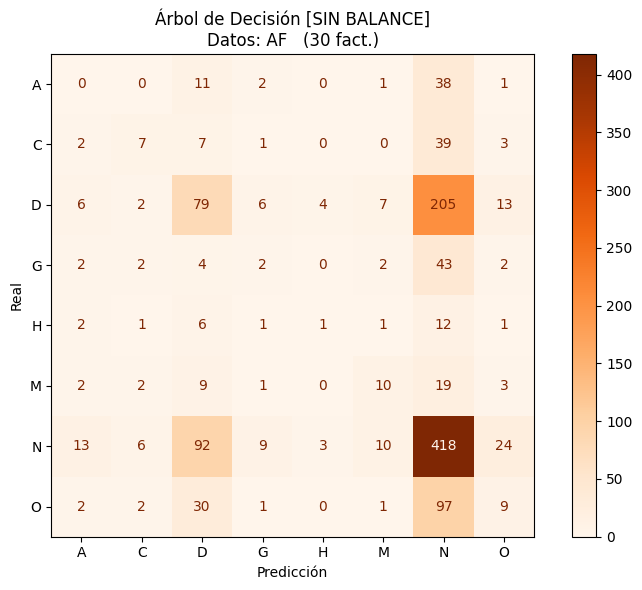


  ÁRBOL DE DECISIÓN [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.3862  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.3847
  Intento 03/10 | Accuracy: 0.3839
  Intento 04/10 | Accuracy: 0.3894  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.3831
  Intento 06/10 | Accuracy: 0.3855
  Intento 07/10 | Accuracy: 0.3855
  Intento 08/10 | Accuracy: 0.3886
  Intento 09/10 | Accuracy: 0.3909  🌟 ¡Nuevo récord!
  Intento 10/10 | Accuracy: 0.3800

✅ Búsqueda finalizada en 2.9s
🏆 Mejor accuracy: 0.3909

--- Reporte de clasificación [UMAP (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.23      0.05      0.08        59
           D       0.26      0.14      0.18       322
           G       0.05      0.04      0.04        57
           H       0.12      0.04      0.06        25
           M       0.23      0.11      0.15        46


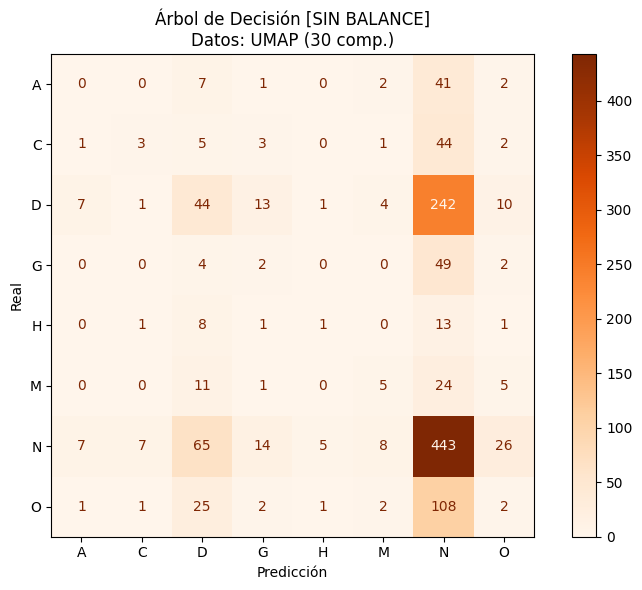

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("\n" + " "*70)
print("  ÁRBOLES DE DECISIÓN — SIN BALANCEO")
print(" "*70)

resultados_arboles_sin = {}
for nombre, (X_tr, X_te, n_comp) in datasets_arboles.items():
    res = buscar_mejor_arbol(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        balanceado=False,
        condicion="SIN BALANCE", color_mapa='Oranges'
    )
    resultados_arboles_sin[nombre] = res
    modelos_arboles[f"{nombre} - SIN BALANCE"] = (res['modelo'], n_comp)



                                                                      
  ÁRBOLES DE DECISIÓN — CLASS WEIGHT
                                                                      

  ÁRBOL DE DECISIÓN [CLASS WEIGHT] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1415  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1431  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1423
  Intento 04/10 | Accuracy: 0.1470  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.1462
  Intento 06/10 | Accuracy: 0.1439
  Intento 07/10 | Accuracy: 0.1439
  Intento 08/10 | Accuracy: 0.1446
  Intento 09/10 | Accuracy: 0.1415
  Intento 10/10 | Accuracy: 0.1415

✅ Búsqueda finalizada en 3.1s
🏆 Mejor accuracy: 0.1470

--- Reporte de clasificación [PCA  (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.05      0.25      0.09        53
           C       0.12      0.51      0.19        59
           D       0.28      0.12 

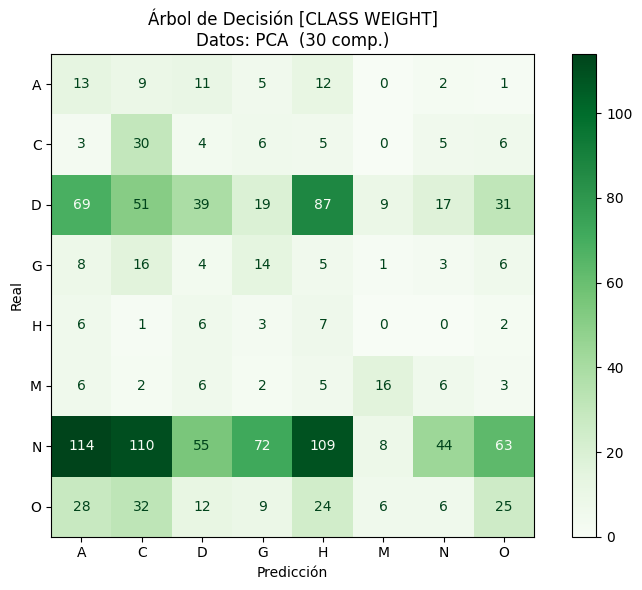


  ÁRBOL DE DECISIÓN [CLASS WEIGHT] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1439  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1462  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1439
  Intento 04/10 | Accuracy: 0.1415
  Intento 05/10 | Accuracy: 0.1392
  Intento 06/10 | Accuracy: 0.1423
  Intento 07/10 | Accuracy: 0.1470  🌟 ¡Nuevo récord!
  Intento 08/10 | Accuracy: 0.1431
  Intento 09/10 | Accuracy: 0.1423
  Intento 10/10 | Accuracy: 0.1407

✅ Búsqueda finalizada en 3.1s
🏆 Mejor accuracy: 0.1470

--- Reporte de clasificación [AF   (30 fact.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.07      0.23      0.11        53
           C       0.10      0.27      0.15        59
           D       0.28      0.15      0.20       322
           G       0.11      0.32      0.17        57
           H       0.03      0.32      0.05        25
           M       0.31      0.43      0.36        4

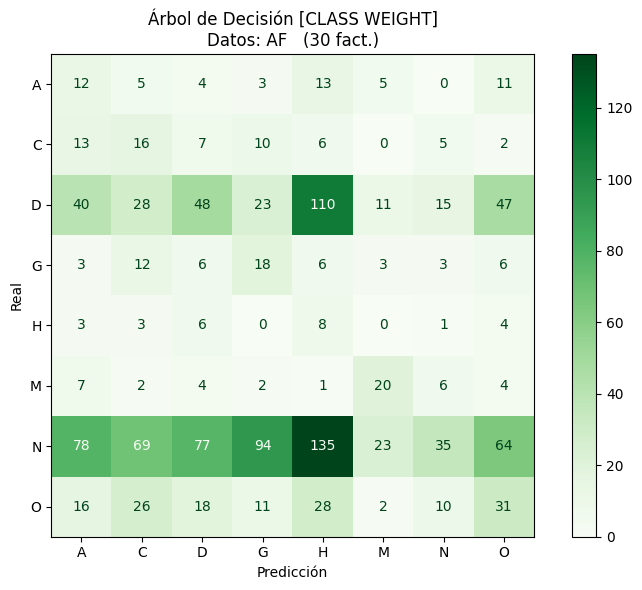


  ÁRBOL DE DECISIÓN [CLASS WEIGHT] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.1407  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.1446  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.1439
  Intento 04/10 | Accuracy: 0.1431
  Intento 05/10 | Accuracy: 0.1431
  Intento 06/10 | Accuracy: 0.1423
  Intento 07/10 | Accuracy: 0.1360
  Intento 08/10 | Accuracy: 0.1446
  Intento 09/10 | Accuracy: 0.1423
  Intento 10/10 | Accuracy: 0.1415

✅ Búsqueda finalizada en 2.9s
🏆 Mejor accuracy: 0.1446

--- Reporte de clasificación [UMAP (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.05      0.21      0.08        53
           C       0.19      0.34      0.24        59
           D       0.32      0.10      0.15       322
           G       0.13      0.37      0.19        57
           H       0.02      0.20      0.04        25
           M       0.08      0.37      0.12        46
           N    

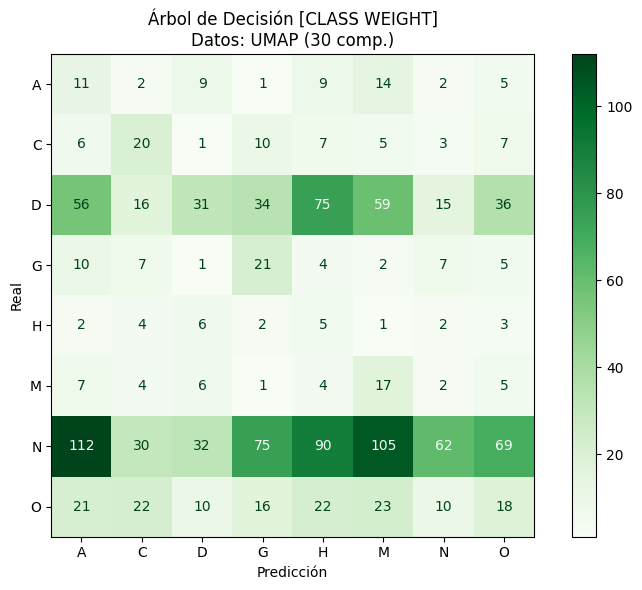

In [ ]:
# ── Ejecución con class weight ─────────────────────────────────────────────
print("\n" + " "*70)
print("  ÁRBOLES DE DECISIÓN — CLASS WEIGHT")
print(" "*70)

resultados_arboles_cw = {}
for nombre, (X_tr, X_te, n_comp) in datasets_arboles.items():
    res = buscar_mejor_arbol(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        balanceado=True,
        condicion="CLASS WEIGHT", color_mapa='Greens'
    )
    resultados_arboles_cw[nombre] = res
    modelos_arboles[f"{nombre} - CLASS WEIGHT"] = (res['modelo'], n_comp)


In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — ÁRBOLES DE DECISIÓN")
print("═"*60)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Class Weight':>14}")
print("─"*60)

for nombre in datasets_arboles.keys():
    acc_sin = resultados_arboles_sin[nombre]['accuracy']
    acc_cw  = resultados_arboles_cw[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_cw:>14.4f}")




════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — ÁRBOLES DE DECISIÓN
════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Class Weight
────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4339         0.1470
  AF   (30 fact.)                 0.4113         0.1470
  UMAP (30 comp.)                 0.3909         0.1446



📊 Visualizando estructura de los mejores árboles...


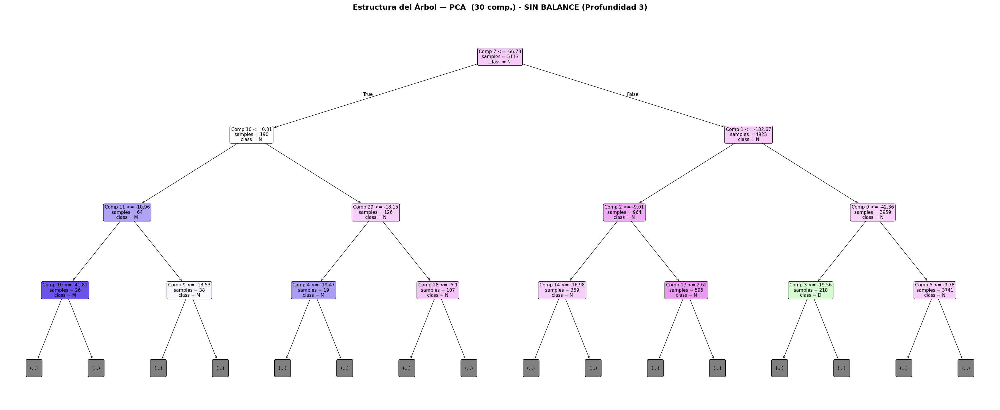

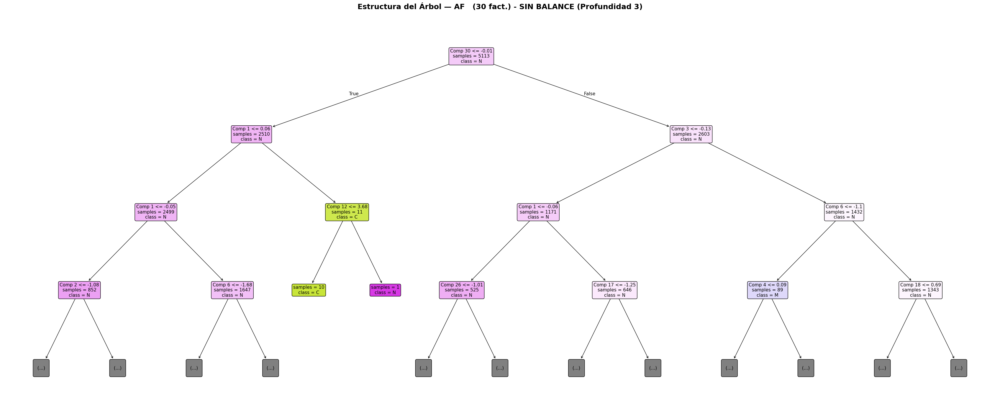

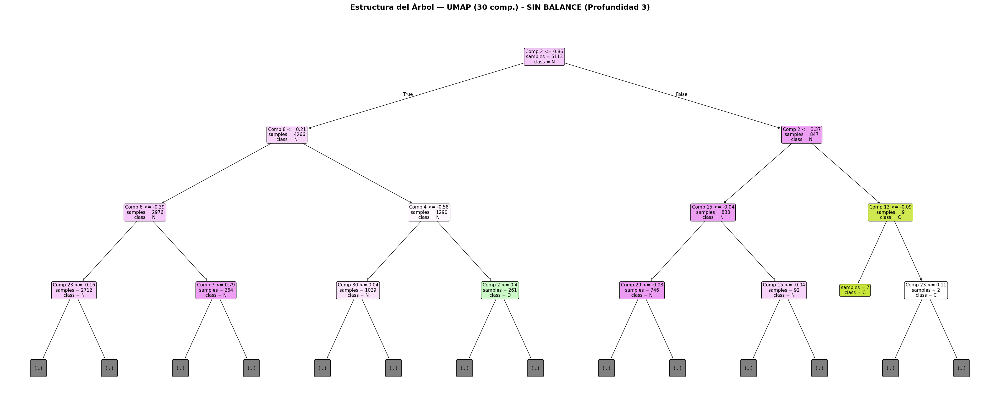

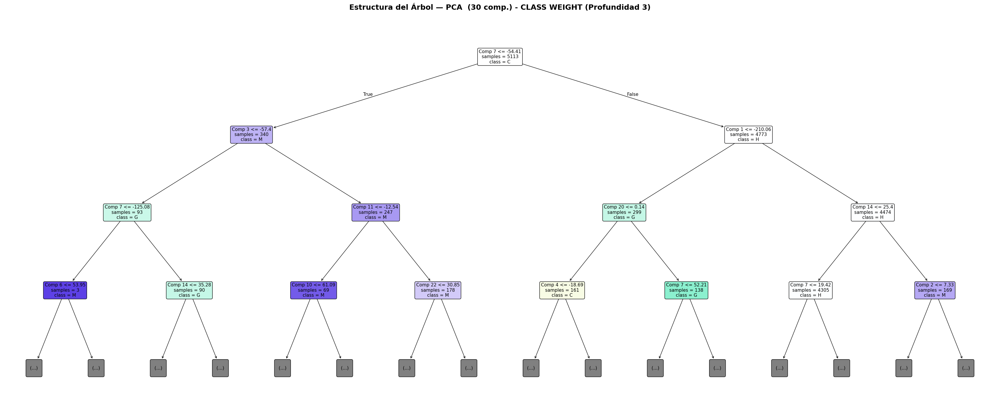

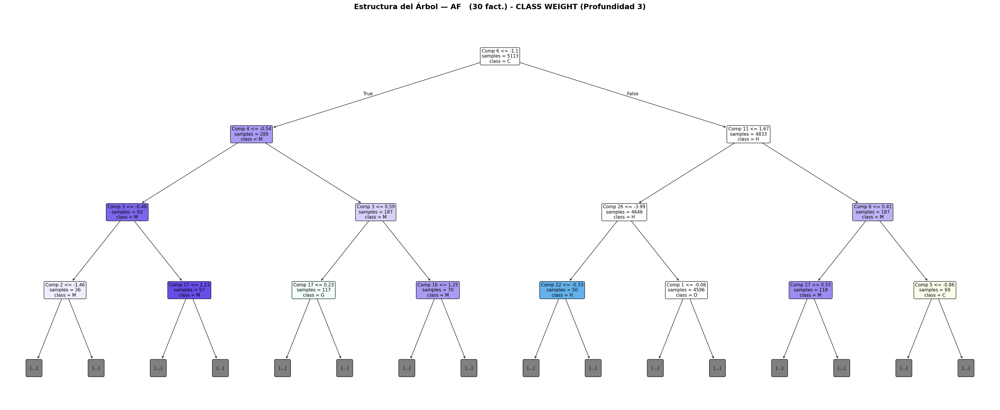

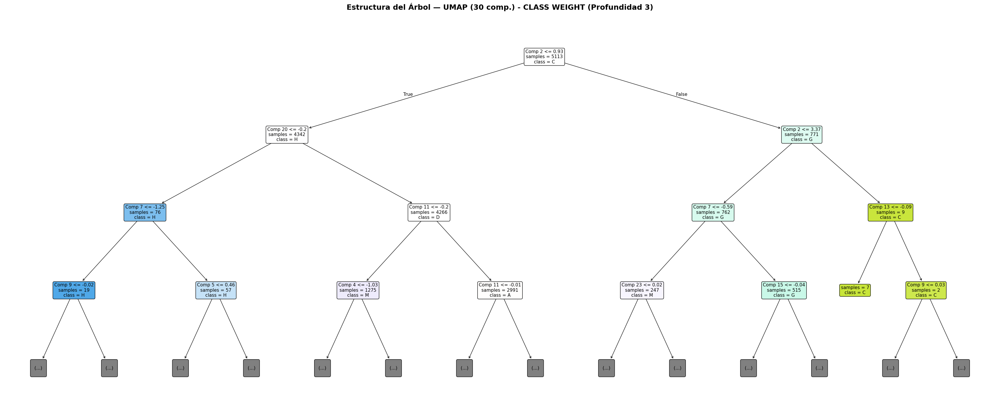

In [ ]:
# ── Visualización de árboles ───────────────────────────────────────────────
# Se visualizan los mejores árboles de cada configuración hasta profundidad 3
# para mantener la legibilidad en la tesis.
print("\n📊 Visualizando estructura de los mejores árboles...")

for clave, (modelo, n_comp) in modelos_arboles.items():
    graficar_arbol(
        modelo=modelo,
        etiqueta=clave,
        encoder=encoder,
        n_componentes=n_comp,
        profundidad=3
    )

### Random forest

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# BOSQUES ALEATORIOS (RANDOM FOREST)
# ═══════════════════════════════════════════════════════════════════════════
# Random Forest construye múltiples árboles de decisión en paralelo, cada
# uno entrenado con una muestra aleatoria del dataset (bagging) y un
# subconjunto aleatorio de características. La predicción final se obtiene
# por votación mayoritaria entre todos los árboles.
#
# Esta combinación de aleatoriedad hace que Random Forest sea más robusto
# al sobreajuste que un árbol de decisión individual, y generalmente
# produce mejores resultados en datos tabulares.
#
# Se limita max_depth=15 para evitar sobreajuste en el espacio reducido
# de 30 componentes.
#
# Se usa búsqueda Monte Carlo con 10 semillas porque la aleatoriedad en
# la selección de muestras y características puede afectar el resultado.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_rf(X_train, y_train, X_test, y_test,
                semilla=42, balanceado=False, n_arboles=100):
    """
    Entrena y evalúa un modelo Random Forest con una semilla específica.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    semilla    : semilla para Monte Carlo
    balanceado : si True usa class_weight='balanced'
    n_arboles  : número de árboles en el bosque

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = RandomForestClassifier(
        n_estimators=n_arboles,
        criterion='gini',
        max_depth=15,           # Limitado para evitar sobreajuste
        class_weight='balanced' if balanceado else None,
        random_state=semilla,
        n_jobs=-1               # Usa todos los núcleos disponibles
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def buscar_mejor_rf(X_train, y_train, X_test, y_test,
                    encoder, etiqueta="PCA",
                    n_intentos=10, balanceado=False,
                    condicion="SIN BALANCE", color_mapa='Blues'):
    """
    Búsqueda Monte Carlo del mejor Random Forest variando la semilla.
    Reporta el modelo con mayor accuracy entre todos los intentos.
    """
    print(f"\n{'='*70}")
    print(f"  RANDOM FOREST [{condicion}] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_rf(
            X_train, y_train, X_test, y_test,
            semilla=semilla_actual,
            balanceado=balanceado
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte ────────────────────────────────────────────────────────────
    clases_nombres = encoder.classes_
    y_pred         = mejor_resultado['y_pred']

    print(f"\n--- Reporte de clasificación [{etiqueta} | {condicion}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    # ── Matriz de confusión ────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 6))
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        display_labels=clases_nombres,
        cmap=color_mapa,
        ax=ax,
        colorbar=True
    )
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.title(f'Random Forest [{condicion}]\nDatos: {etiqueta}')
    plt.tight_layout()
    plt.show()

    return mejor_resultado


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_rf = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}




                                                                      
  RANDOM FOREST — SIN BALANCEO
                                                                      

  RANDOM FOREST [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4824  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4816
  Intento 03/10 | Accuracy: 0.4722
  Intento 04/10 | Accuracy: 0.4785
  Intento 05/10 | Accuracy: 0.4754
  Intento 06/10 | Accuracy: 0.4777
  Intento 07/10 | Accuracy: 0.4762
  Intento 08/10 | Accuracy: 0.4808
  Intento 09/10 | Accuracy: 0.4769
  Intento 10/10 | Accuracy: 0.4636

✅ Búsqueda finalizada en 9.7s
🏆 Mejor accuracy: 0.4824

--- Reporte de clasificación [PCA  (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.73      0.14      0.23        59
           D       0.43      0.16      0.23       322
           G       0.00     

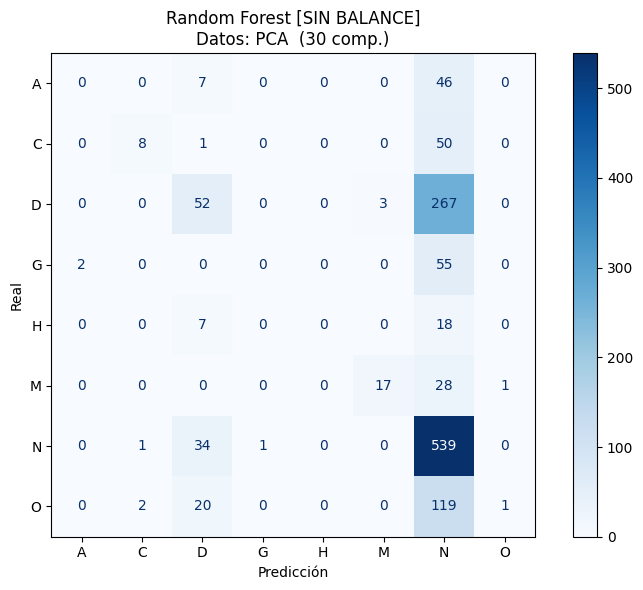


  RANDOM FOREST [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4636  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4793  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4769
  Intento 04/10 | Accuracy: 0.4715
  Intento 05/10 | Accuracy: 0.4730
  Intento 06/10 | Accuracy: 0.4769
  Intento 07/10 | Accuracy: 0.4785
  Intento 08/10 | Accuracy: 0.4769
  Intento 09/10 | Accuracy: 0.4816  🌟 ¡Nuevo récord!
  Intento 10/10 | Accuracy: 0.4793

✅ Búsqueda finalizada en 9.3s
🏆 Mejor accuracy: 0.4816

--- Reporte de clasificación [AF   (30 fact.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.58      0.12      0.20        59
           D       0.40      0.18      0.25       322
           G       0.33      0.02      0.03        57
           H       0.00      0.00      0.00        25
           M       0.90      0.39      0.55        46
    

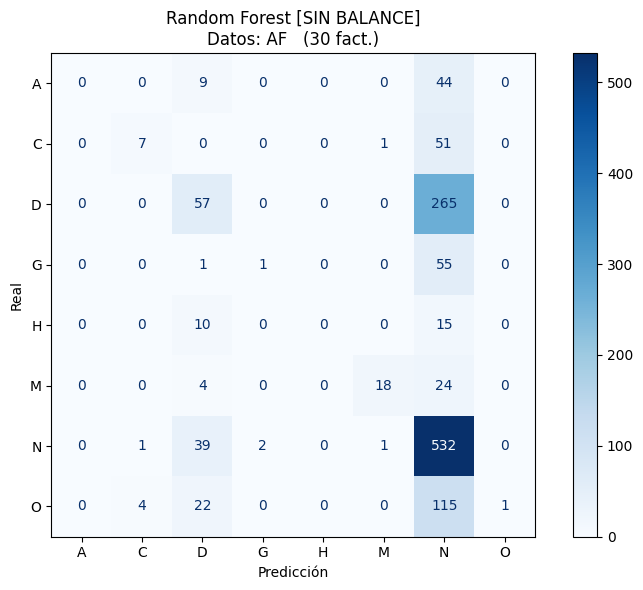


  RANDOM FOREST [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4222  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4238  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4230
  Intento 04/10 | Accuracy: 0.4230
  Intento 05/10 | Accuracy: 0.4277  🌟 ¡Nuevo récord!
  Intento 06/10 | Accuracy: 0.4300  🌟 ¡Nuevo récord!
  Intento 07/10 | Accuracy: 0.4261
  Intento 08/10 | Accuracy: 0.4355  🌟 ¡Nuevo récord!
  Intento 09/10 | Accuracy: 0.4332
  Intento 10/10 | Accuracy: 0.4277

✅ Búsqueda finalizada en 8.9s
🏆 Mejor accuracy: 0.4355

--- Reporte de clasificación [UMAP (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.36      0.08      0.14        59
           D       0.37      0.26      0.30       322
           G       0.00      0.00      0.00        57
           H       0.33      0.04      0.07        25
           M       0.4

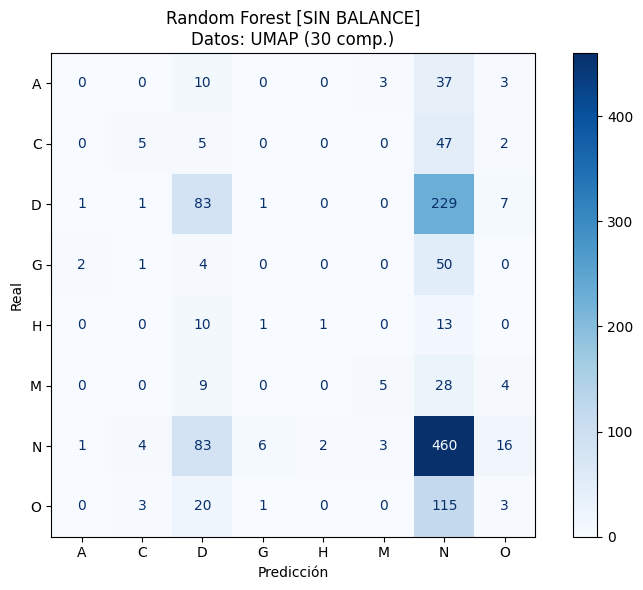

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("\n" + " "*70)
print("  RANDOM FOREST — SIN BALANCEO")
print(" "*70)

resultados_rf_sin = {}
for nombre, (X_tr, X_te) in datasets_rf.items():
    resultados_rf_sin[nombre] = buscar_mejor_rf(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        balanceado=False,
        condicion="SIN BALANCE", color_mapa='Blues'
    )




                                                                      
  RANDOM FOREST — CLASS WEIGHT
                                                                      

  RANDOM FOREST [CLASS WEIGHT] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4652  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4691  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4644
  Intento 04/10 | Accuracy: 0.4668
  Intento 05/10 | Accuracy: 0.4660
  Intento 06/10 | Accuracy: 0.4644
  Intento 07/10 | Accuracy: 0.4738  🌟 ¡Nuevo récord!
  Intento 08/10 | Accuracy: 0.4644
  Intento 09/10 | Accuracy: 0.4660
  Intento 10/10 | Accuracy: 0.4715

✅ Búsqueda finalizada en 9.1s
🏆 Mejor accuracy: 0.4738

--- Reporte de clasificación [PCA  (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.67      0.20      0.31        59
           D       0.37      0.28      0.32 

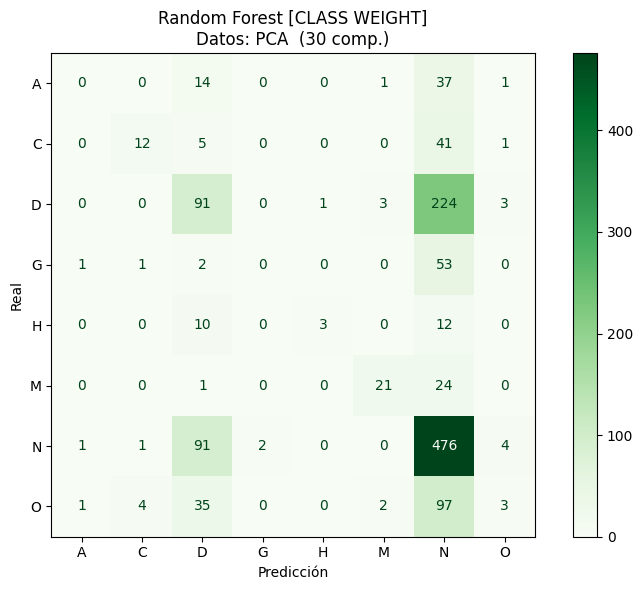


  RANDOM FOREST [CLASS WEIGHT] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4715  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4738  🌟 ¡Nuevo récord!
  Intento 03/10 | Accuracy: 0.4644
  Intento 04/10 | Accuracy: 0.4722
  Intento 05/10 | Accuracy: 0.4683
  Intento 06/10 | Accuracy: 0.4793  🌟 ¡Nuevo récord!
  Intento 07/10 | Accuracy: 0.4683
  Intento 08/10 | Accuracy: 0.4652
  Intento 09/10 | Accuracy: 0.4550
  Intento 10/10 | Accuracy: 0.4636

✅ Búsqueda finalizada en 9.0s
🏆 Mejor accuracy: 0.4793

--- Reporte de clasificación [AF   (30 fact.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.33      0.02      0.04        53
           C       0.57      0.20      0.30        59
           D       0.39      0.31      0.35       322
           G       0.00      0.00      0.00        57
           H       1.00      0.08      0.15        25
           M       0.84      0.46      0.59        46
  

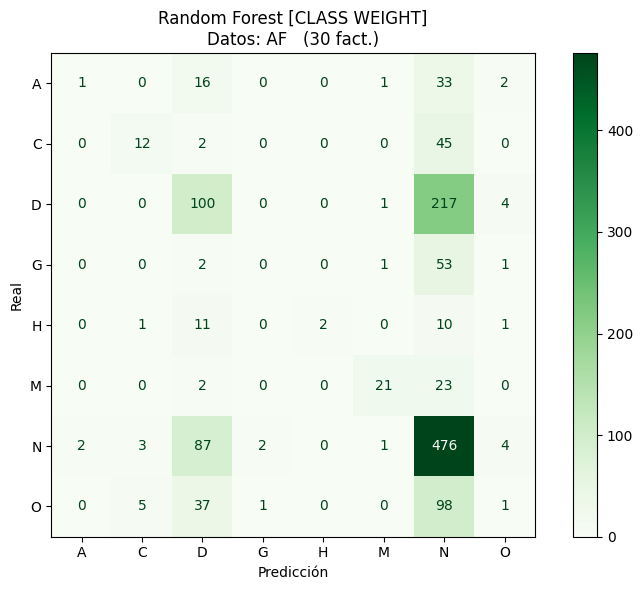


  RANDOM FOREST [CLASS WEIGHT] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.3956  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.3933
  Intento 03/10 | Accuracy: 0.3894
  Intento 04/10 | Accuracy: 0.4019  🌟 ¡Nuevo récord!
  Intento 05/10 | Accuracy: 0.3933
  Intento 06/10 | Accuracy: 0.3909
  Intento 07/10 | Accuracy: 0.3800
  Intento 08/10 | Accuracy: 0.3964
  Intento 09/10 | Accuracy: 0.3933
  Intento 10/10 | Accuracy: 0.3909

✅ Búsqueda finalizada en 9.3s
🏆 Mejor accuracy: 0.4019

--- Reporte de clasificación [UMAP (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.14      0.06      0.08        53
           C       0.33      0.22      0.26        59
           D       0.32      0.31      0.32       322
           G       0.18      0.09      0.12        57
           H       0.33      0.08      0.13        25
           M       0.23      0.17      0.20        46
           N       0

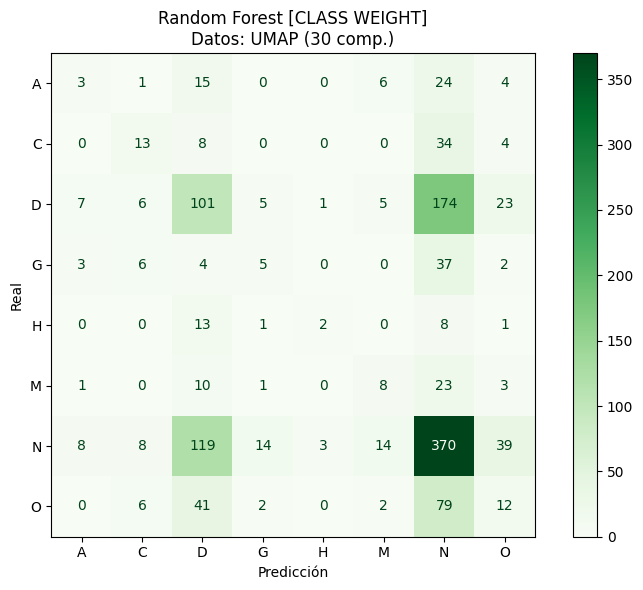

In [ ]:
# ── Ejecución con class weight ─────────────────────────────────────────────
print("\n" + " "*70)
print("  RANDOM FOREST — CLASS WEIGHT")
print(" "*70)

resultados_rf_cw = {}
for nombre, (X_tr, X_te) in datasets_rf.items():
    resultados_rf_cw[nombre] = buscar_mejor_rf(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        balanceado=True,
        condicion="CLASS WEIGHT", color_mapa='Greens'
    )


In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — RANDOM FOREST")
print("═"*60)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Class Weight':>14}")
print("─"*60)

for nombre in datasets_rf.keys():
    acc_sin = resultados_rf_sin[nombre]['accuracy']
    acc_cw  = resultados_rf_cw[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_cw:>14.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — RANDOM FOREST
════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Class Weight
────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4824         0.4738
  AF   (30 fact.)                 0.4816         0.4793
  UMAP (30 comp.)                 0.4355         0.4019
════════════════════════════════════════════════════════════


### ÁRBOLES DE GRADIENTE POTENCIADO

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ÁRBOLES DE GRADIENTE POTENCIADO (GRADIENT BOOSTING)
# ═══════════════════════════════════════════════════════════════════════════
# HistGradientBoostingClassifier construye árboles de forma secuencial donde
# cada árbol corrige los errores del anterior. A diferencia de Random Forest
# que construye árboles en paralelo, el boosting construye árboles en serie
# lo que permite mayor precisión pero también mayor riesgo de sobreajuste.
#
# Se usa la versión histograma (Hist) que es significativamente más rápida
# que GradientBoostingClassifier estándar al agrupar los valores continuos
# en bins discretos antes de calcular los splits.
#
# Se usa búsqueda Monte Carlo con 10 semillas porque el orden aleatorio
# de los datos en cada iteración puede afectar el resultado final.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_gb(X_train, y_train, X_test, y_test,
                semilla=42, balanceado=False):
    """
    Entrena y evalúa un modelo HistGradientBoostingClassifier.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    semilla    : semilla para Monte Carlo
    balanceado : si True usa class_weight='balanced'

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = HistGradientBoostingClassifier(
        learning_rate=0.1,
        max_iter=100,
        class_weight='balanced' if balanceado else None,
        random_state=semilla
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def buscar_mejor_gb(X_train, y_train, X_test, y_test,
                    encoder, etiqueta="PCA",
                    n_intentos=10, balanceado=False,
                    condicion="SIN BALANCE", color_mapa='Oranges'):
    """
    Búsqueda Monte Carlo del mejor Gradient Boosting variando la semilla.
    Reporta el modelo con mayor accuracy entre todos los intentos.
    """
    print(f"\n{'='*70}")
    print(f"  GRADIENT BOOSTING [{condicion}] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_gb(
            X_train, y_train, X_test, y_test,
            semilla=semilla_actual,
            balanceado=balanceado
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte ────────────────────────────────────────────────────────────
    clases_nombres = encoder.classes_
    y_pred         = mejor_resultado['y_pred']

    print(f"\n--- Reporte de clasificación [{etiqueta} | {condicion}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    # ── Matriz de confusión ────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 6))
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        display_labels=clases_nombres,
        cmap=color_mapa,
        ax=ax,
        colorbar=True
    )
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.title(f'Gradient Boosting [{condicion}]\nDatos: {etiqueta}')
    plt.tight_layout()
    plt.show()

    return mejor_resultado


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_gb = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}




                                                                      
  GRADIENT BOOSTING — SIN BALANCEO
                                                                      

  GRADIENT BOOSTING [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4722  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4722
  Intento 03/10 | Accuracy: 0.4722
  Intento 04/10 | Accuracy: 0.4722
  Intento 05/10 | Accuracy: 0.4722
  Intento 06/10 | Accuracy: 0.4722
  Intento 07/10 | Accuracy: 0.4722
  Intento 08/10 | Accuracy: 0.4722
  Intento 09/10 | Accuracy: 0.4722
  Intento 10/10 | Accuracy: 0.4722

✅ Búsqueda finalizada en 38.3s
🏆 Mejor accuracy: 0.4722

--- Reporte de clasificación [PCA  (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       1.00      0.02      0.04        53
           C       0.45      0.15      0.23        59
           D       0.37      0.29      0.33       322
           G       

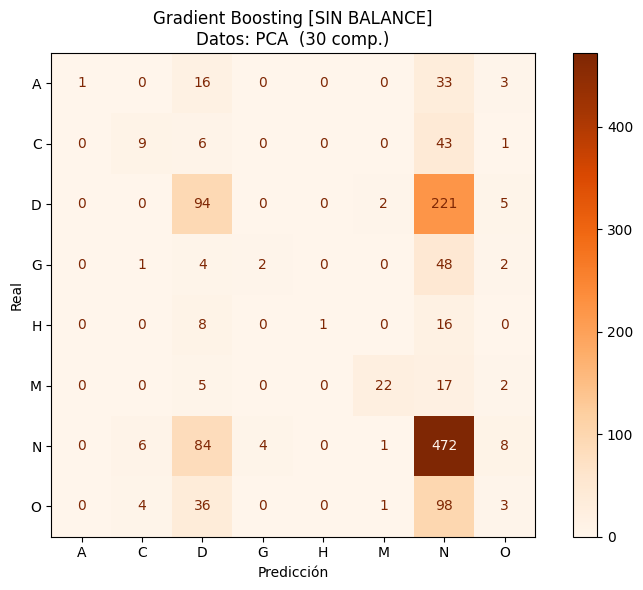


  GRADIENT BOOSTING [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4910  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4910
  Intento 03/10 | Accuracy: 0.4910
  Intento 04/10 | Accuracy: 0.4910
  Intento 05/10 | Accuracy: 0.4910
  Intento 06/10 | Accuracy: 0.4910
  Intento 07/10 | Accuracy: 0.4910
  Intento 08/10 | Accuracy: 0.4910
  Intento 09/10 | Accuracy: 0.4910
  Intento 10/10 | Accuracy: 0.4910

✅ Búsqueda finalizada en 39.7s
🏆 Mejor accuracy: 0.4910

--- Reporte de clasificación [AF   (30 fact.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.62      0.17      0.27        59
           D       0.40      0.29      0.33       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.84      0.57      0.68        46
           N       0.51      0.86  

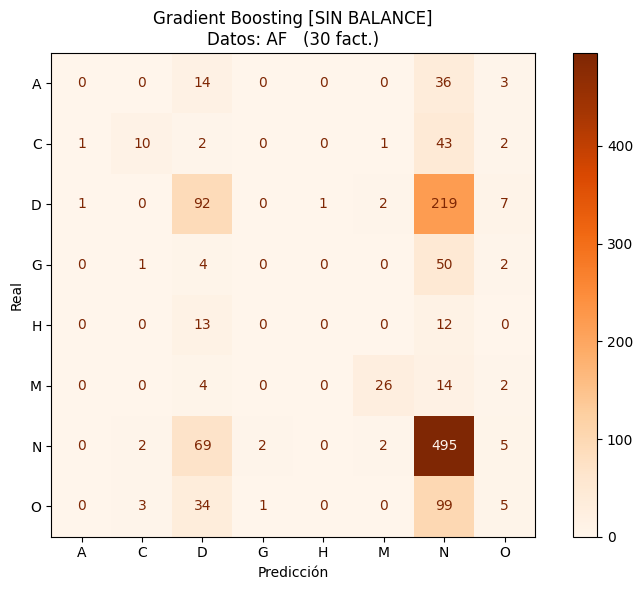


  GRADIENT BOOSTING [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4128  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4128
  Intento 03/10 | Accuracy: 0.4128
  Intento 04/10 | Accuracy: 0.4128
  Intento 05/10 | Accuracy: 0.4128
  Intento 06/10 | Accuracy: 0.4128
  Intento 07/10 | Accuracy: 0.4128
  Intento 08/10 | Accuracy: 0.4128
  Intento 09/10 | Accuracy: 0.4128
  Intento 10/10 | Accuracy: 0.4128

✅ Búsqueda finalizada en 29.1s
🏆 Mejor accuracy: 0.4128

--- Reporte de clasificación [UMAP (30 comp.) | SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.31      0.08      0.13        59
           D       0.32      0.27      0.30       322
           G       0.12      0.04      0.05        57
           H       0.25      0.04      0.07        25
           M       0.31      0.17      0.22        46
           N       0.47      0.73  

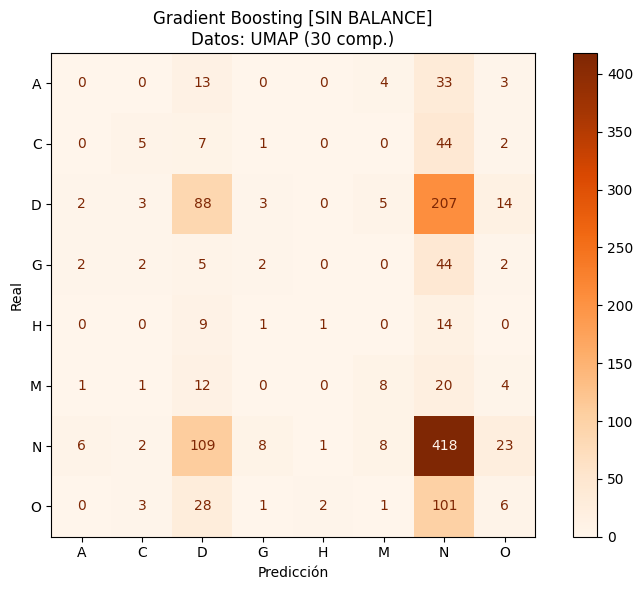

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("\n" + " "*70)
print("  GRADIENT BOOSTING — SIN BALANCEO")
print(" "*70)

resultados_gb_sin = {}
for nombre, (X_tr, X_te) in datasets_gb.items():
    resultados_gb_sin[nombre] = buscar_mejor_gb(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        balanceado=False,
        condicion="SIN BALANCE", color_mapa='Oranges'
    )




  GRADIENT BOOSTING — CLASS WEIGHT


  GRADIENT BOOSTING [CLASS WEIGHT] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4347  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4347
  Intento 03/10 | Accuracy: 0.4347
  Intento 04/10 | Accuracy: 0.4347
  Intento 05/10 | Accuracy: 0.4347
  Intento 06/10 | Accuracy: 0.4347
  Intento 07/10 | Accuracy: 0.4347
  Intento 08/10 | Accuracy: 0.4347
  Intento 09/10 | Accuracy: 0.4347
  Intento 10/10 | Accuracy: 0.4347

✅ Búsqueda finalizada en 34.7s
🏆 Mejor accuracy: 0.4347

--- Reporte de clasificación [PCA  (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.18      0.04      0.06        53
           C       0.43      0.25      0.32        59
           D       0.33      0.33      0.33       322
           G       0.32      0.16      0.21        57
           H       0.57      0.16      0.25        25
           M       0.82      0.59      0.68      

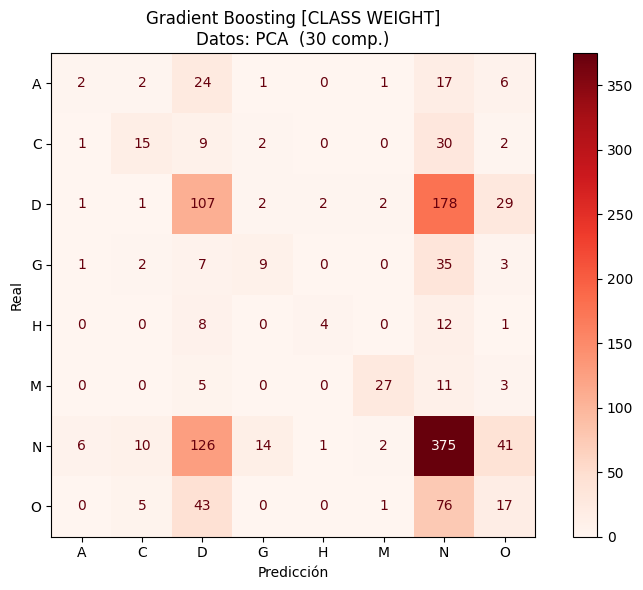


  GRADIENT BOOSTING [CLASS WEIGHT] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.4425  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.4425
  Intento 03/10 | Accuracy: 0.4425
  Intento 04/10 | Accuracy: 0.4425
  Intento 05/10 | Accuracy: 0.4425
  Intento 06/10 | Accuracy: 0.4425
  Intento 07/10 | Accuracy: 0.4425
  Intento 08/10 | Accuracy: 0.4425
  Intento 09/10 | Accuracy: 0.4425
  Intento 10/10 | Accuracy: 0.4425

✅ Búsqueda finalizada en 47.8s
🏆 Mejor accuracy: 0.4425

--- Reporte de clasificación [AF   (30 fact.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.11      0.02      0.03        53
           C       0.53      0.29      0.37        59
           D       0.34      0.37      0.35       322
           G       0.19      0.05      0.08        57
           H       0.50      0.08      0.14        25
           M       0.79      0.59      0.68        46
           N       0.51      0.67

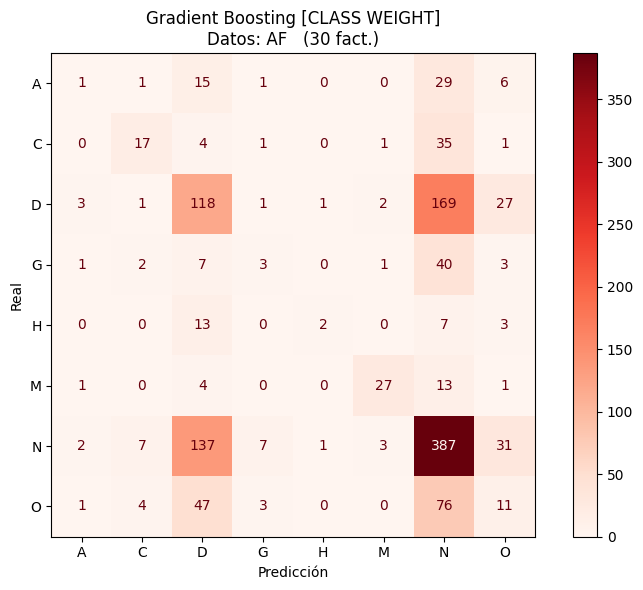


  GRADIENT BOOSTING [CLASS WEIGHT] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...
  Intento 01/10 | Accuracy: 0.3471  🌟 ¡Nuevo récord!
  Intento 02/10 | Accuracy: 0.3471
  Intento 03/10 | Accuracy: 0.3471
  Intento 04/10 | Accuracy: 0.3471
  Intento 05/10 | Accuracy: 0.3471
  Intento 06/10 | Accuracy: 0.3471
  Intento 07/10 | Accuracy: 0.3471
  Intento 08/10 | Accuracy: 0.3471
  Intento 09/10 | Accuracy: 0.3471
  Intento 10/10 | Accuracy: 0.3471

✅ Búsqueda finalizada en 31.3s
🏆 Mejor accuracy: 0.3471

--- Reporte de clasificación [UMAP (30 comp.) | CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.04      0.04      0.04        53
           C       0.29      0.27      0.28        59
           D       0.32      0.34      0.33       322
           G       0.12      0.12      0.12        57
           H       0.23      0.12      0.16        25
           M       0.26      0.30      0.28        46
           N       0.51      0.49

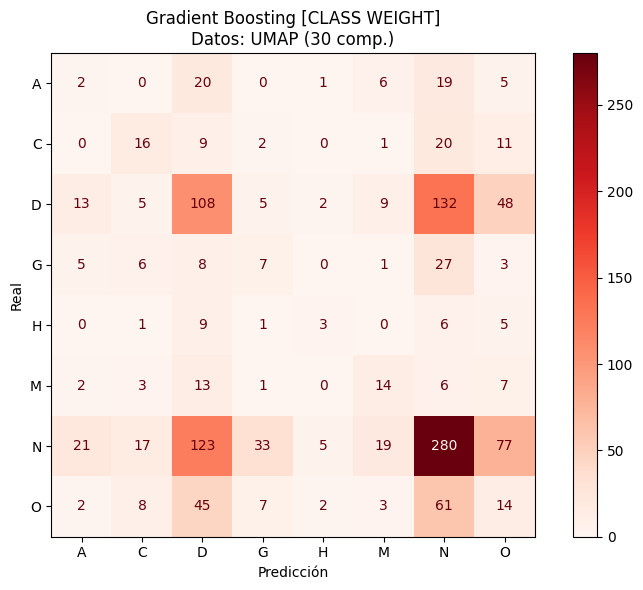

In [ ]:
# ── Ejecución con class weight ─────────────────────────────────────────────
print("\n" + ""*70)
print("  GRADIENT BOOSTING — CLASS WEIGHT")
print(""*70)

resultados_gb_cw = {}
for nombre, (X_tr, X_te) in datasets_gb.items():
    resultados_gb_cw[nombre] = buscar_mejor_gb(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        balanceado=True,
        condicion="CLASS WEIGHT", color_mapa='Reds'
    )


In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  RESUMEN COMPARATIVO — GRADIENT BOOSTING")
print("═"*60)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Class Weight':>14}")
print("─"*60)

for nombre in datasets_gb.keys():
    acc_sin = resultados_gb_sin[nombre]['accuracy']
    acc_cw  = resultados_gb_cw[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_cw:>14.4f}")

print("═"*60)


════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — GRADIENT BOOSTING
════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Class Weight
────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4722         0.4347
  AF   (30 fact.)                 0.4910         0.4425
  UMAP (30 comp.)                 0.4128         0.3471
════════════════════════════════════════════════════════════


### Análisis discriminante cuadrático (QDA)


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ANÁLISIS DISCRIMINANTE CUADRÁTICO (QDA)
# ═══════════════════════════════════════════════════════════════════════════
# El Análisis Discriminante Cuadrático es una extensión no lineal del LDA
# que permite fronteras de decisión cuadráticas entre clases. A diferencia
# del LDA que asume la misma matriz de covarianza para todas las clases,
# el QDA estima una matriz de covarianza individual por clase.
#
# Se usa reg_param=0.1 para regularizar las matrices de covarianza y evitar
# errores de singularidad en clases con pocas muestras como H (128 imágenes).
#
# El balanceo se realiza mediante priors iguales (1/8), igual que en LDA.
#
# Nota: QDA es completamente determinista dado un conjunto de datos fijo,
# por lo que una sola corrida es suficiente y reproducible.
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_qda(X_train, y_train, X_test, y_test,
                 balanceado=False, n_clases=8):
    """
    Entrena y evalúa un modelo QDA.

    Parámetros:
    -----------
    X_train    : datos de entrenamiento reducidos
    y_train    : etiquetas de entrenamiento
    X_test     : datos de prueba reducidos
    y_test     : etiquetas de prueba
    balanceado : si True usa priors iguales entre clases
    n_clases   : número de clases para calcular priors iguales

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    priors = [1 / n_clases] * n_clases if balanceado else None

    modelo = QuadraticDiscriminantAnalysis(
        reg_param=0.1,  # Regularización para evitar matrices singulares
        priors=priors   # en clases con pocas muestras como H (128 imágenes)
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def reportar_qda(resultados_por_dataset, y_test, encoder,
                 condicion="SIN BALANCE", color_mapa='Reds'):
    """
    Genera reporte de clasificación y matriz de confusión para cada
    representación reducida evaluada en QDA.
    """
    clases_nombres = encoder.classes_

    print(f"\n{'='*70}")
    print(f"  QDA [{condicion}]")
    print(f"{'='*70}")

    for nombre, res in resultados_por_dataset.items():
        print(f"\n>>> {nombre}")
        print(f"    Accuracy : {res['accuracy']:.4f}")
        print(f"    Tiempo   : {res['tiempo']:.4f}s")
        print(f"\n--- Reporte de clasificación ---")
        print(classification_report(
            y_test, res['y_pred'],
            target_names=clases_nombres,
            zero_division=0
        ))

        fig, ax = plt.subplots(figsize=(8, 6))
        ConfusionMatrixDisplay.from_predictions(
            y_test, res['y_pred'],
            display_labels=clases_nombres,
            cmap=color_mapa,
            ax=ax,
            colorbar=True
        )
        ax.set_xlabel('Predicción')
        ax.set_ylabel('Real')
        plt.title(f'QDA [{condicion}]\nDatos: {nombre}')
        plt.tight_layout()
        plt.show()


# ── Definición de datasets ─────────────────────────────────────────────────
n_clases     = len(encoder.classes_)
datasets_qda = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}



⏳ Entrenando QDA sin balanceo...

  QDA [SIN BALANCE]

>>> PCA  (30 comp.)
    Accuracy : 0.2158
    Tiempo   : 0.0159s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.15      0.17      0.16        53
           C       0.50      0.15      0.23        59
           D       0.27      0.43      0.33       322
           G       0.10      0.16      0.12        57
           H       0.05      0.60      0.09        25
           M       0.37      0.78      0.50        46
           N       0.62      0.07      0.12       575
           O       0.14      0.15      0.14       142

    accuracy                           0.22      1279
   macro avg       0.28      0.31      0.21      1279
weighted avg       0.41      0.22      0.20      1279



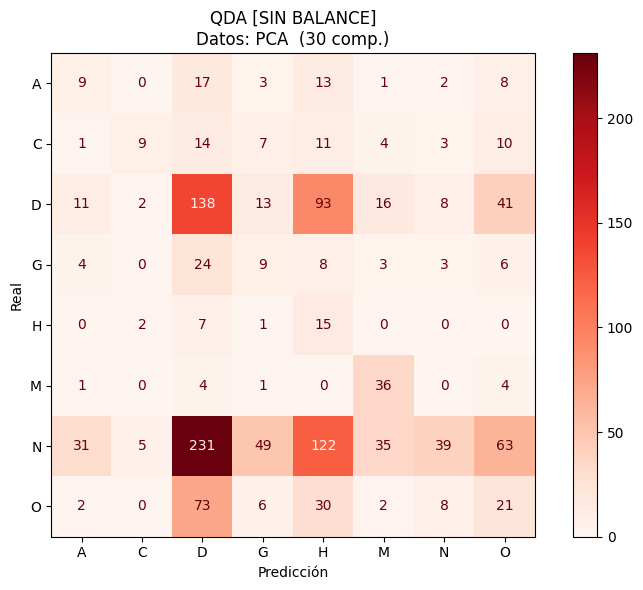


>>> AF   (30 fact.)
    Accuracy : 0.2275
    Tiempo   : 0.0143s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.10      0.11      0.11        53
           C       0.75      0.10      0.18        59
           D       0.27      0.38      0.32       322
           G       0.10      0.16      0.13        57
           H       0.05      0.64      0.10        25
           M       0.38      0.76      0.50        46
           N       0.59      0.14      0.22       575
           O       0.14      0.14      0.14       142

    accuracy                           0.23      1279
   macro avg       0.30      0.30      0.21      1279
weighted avg       0.41      0.23      0.23      1279



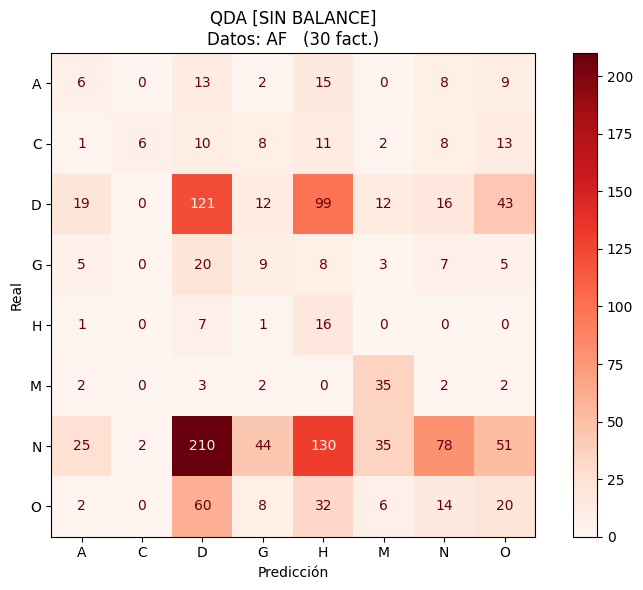


>>> UMAP (30 comp.)
    Accuracy : 0.4253
    Tiempo   : 0.0171s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.26      0.03      0.06       322
           G       0.08      0.09      0.08        57
           H       0.30      0.36      0.33        25
           M       0.00      0.00      0.00        46
           N       0.45      0.90      0.60       575
           O       0.00      0.00      0.00       142

    accuracy                           0.43      1279
   macro avg       0.14      0.17      0.13      1279
weighted avg       0.28      0.43      0.30      1279



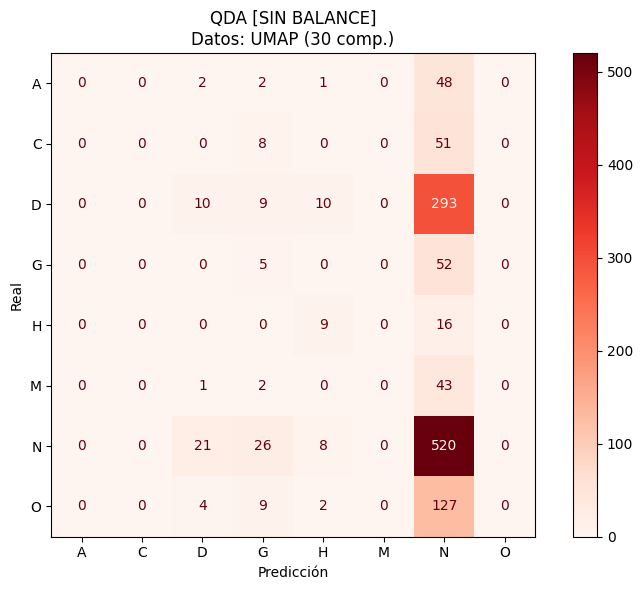

In [ ]:
# ── Ejecución sin balanceo ─────────────────────────────────────────────────
print("⏳ Entrenando QDA sin balanceo...")
resultados_qda_sin = {}
for nombre, (X_tr, X_te) in datasets_qda.items():
    resultados_qda_sin[nombre] = entrenar_qda(
        X_tr, y_train, X_te, y_test,
        balanceado=False, n_clases=n_clases
    )
reportar_qda(resultados_qda_sin, y_test, encoder,
             condicion="SIN BALANCE", color_mapa='Reds')




⏳ Entrenando QDA con balanceo (priors iguales)...

  QDA [BALANCEADO (Priors Iguales)]

>>> PCA  (30 comp.)
    Accuracy : 0.1587
    Tiempo   : 0.0144s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.10      0.21      0.13        53
           C       0.50      0.15      0.23        59
           D       0.27      0.20      0.23       322
           G       0.09      0.23      0.13        57
           H       0.04      0.68      0.07        25
           M       0.33      0.80      0.47        46
           N       0.58      0.05      0.08       575
           O       0.15      0.19      0.17       142

    accuracy                           0.16      1279
   macro avg       0.26      0.31      0.19      1279
weighted avg       0.39      0.16      0.15      1279



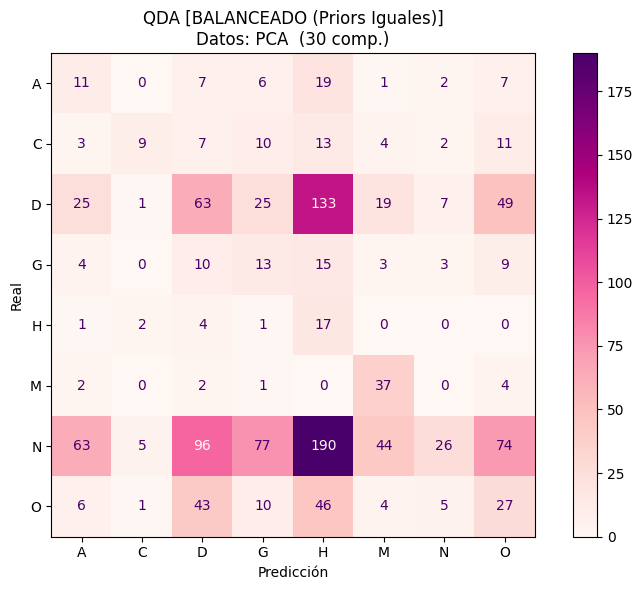


>>> AF   (30 fact.)
    Accuracy : 0.1392
    Tiempo   : 0.0128s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.09      0.25      0.13        53
           C       0.75      0.10      0.18        59
           D       0.28      0.09      0.14       322
           G       0.10      0.28      0.15        57
           H       0.04      0.84      0.08        25
           M       0.31      0.80      0.45        46
           N       0.62      0.04      0.08       575
           O       0.17      0.22      0.19       142

    accuracy                           0.14      1279
   macro avg       0.29      0.33      0.17      1279
weighted avg       0.42      0.14      0.13      1279



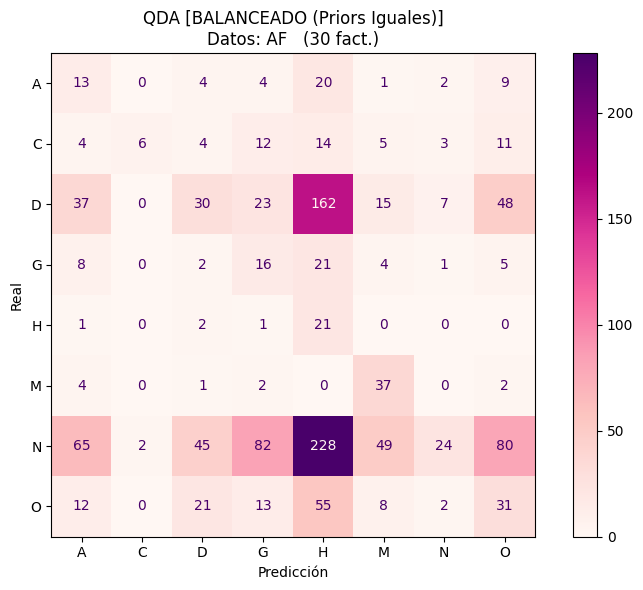


>>> UMAP (30 comp.)
    Accuracy : 0.0938
    Tiempo   : 0.0124s

--- Reporte de clasificación ---
              precision    recall  f1-score   support

           A       0.05      0.51      0.09        53
           C       0.11      0.15      0.13        59
           D       0.16      0.02      0.03       322
           G       0.11      0.67      0.19        57
           H       0.30      0.36      0.33        25
           M       0.06      0.17      0.09        46
           N       0.53      0.03      0.07       575
           O       0.06      0.02      0.03       142

    accuracy                           0.09      1279
   macro avg       0.17      0.24      0.12      1279
weighted avg       0.30      0.09      0.07      1279



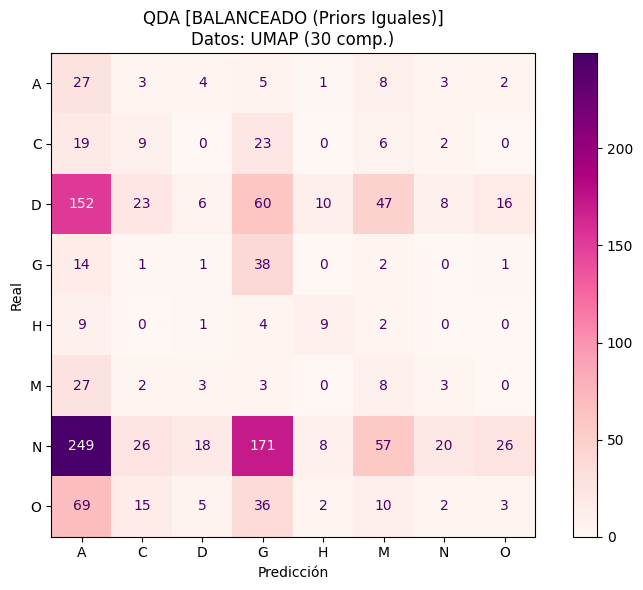

In [ ]:
# ── Ejecución con balanceo (priors iguales) ────────────────────────────────
print("\n⏳ Entrenando QDA con balanceo (priors iguales)...")
resultados_qda_bal = {}
for nombre, (X_tr, X_te) in datasets_qda.items():
    resultados_qda_bal[nombre] = entrenar_qda(
        X_tr, y_train, X_te, y_test,
        balanceado=True, n_clases=n_clases
    )
reportar_qda(resultados_qda_bal, y_test, encoder,
             condicion="BALANCEADO (Priors Iguales)", color_mapa='RdPu')

In [ ]:
# ── Tabla resumen comparativa ──────────────────────────────────────────────
print("\n" + "═"*62)
print("  RESUMEN COMPARATIVO — QDA")
print("═"*62)
print(f"  {'Dataset':<25} {'Sin balance':>12} {'Priors Iguales':>16}")
print("─"*62)

for nombre in datasets_qda.keys():
    acc_sin = resultados_qda_sin[nombre]['accuracy']
    acc_bal = resultados_qda_bal[nombre]['accuracy']
    print(f"  {nombre:<25} {acc_sin:>12.4f} {acc_bal:>16.4f}")

print("═"*62)


══════════════════════════════════════════════════════════════
  RESUMEN COMPARATIVO — QDA
══════════════════════════════════════════════════════════════
  Dataset                    Sin balance   Priors Iguales
──────────────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.2158           0.1587
  AF   (30 fact.)                 0.2275           0.1392
  UMAP (30 comp.)                 0.4253           0.0938
══════════════════════════════════════════════════════════════


### AdaBoost Classifier


                                                                      
  ADABOOST — SIN BALANCEO
  (class_weight no compatible con AdaBoost en datos desbalanceados)
                                                                      

  ADABOOST [SIN BALANCE] — PCA  (30 comp.)
  Buscando mejor modelo en 10 intentos...


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 01/10 | Accuracy: 0.4339  🌟 ¡Nuevo récord!


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 02/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 03/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 04/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 05/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 06/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 07/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 08/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 09/10 | Accuracy: 0.4339


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 10/10 | Accuracy: 0.4339

✅ Búsqueda finalizada en 36.3s
🏆 Mejor accuracy: 0.4339

--- Reporte de clasificación [PCA  (30 comp.)] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       1.00      0.02      0.03        59
           D       0.29      0.22      0.25       322
           G       0.33      0.02      0.03        57
           H       0.00      0.00      0.00        25
           M       0.51      0.39      0.44        46
           N       0.47      0.81      0.59       575
           O       0.00      0.00      0.00       142

    accuracy                           0.43      1279
   macro avg       0.33      0.18      0.17      1279
weighted avg       0.36      0.43      0.35      1279



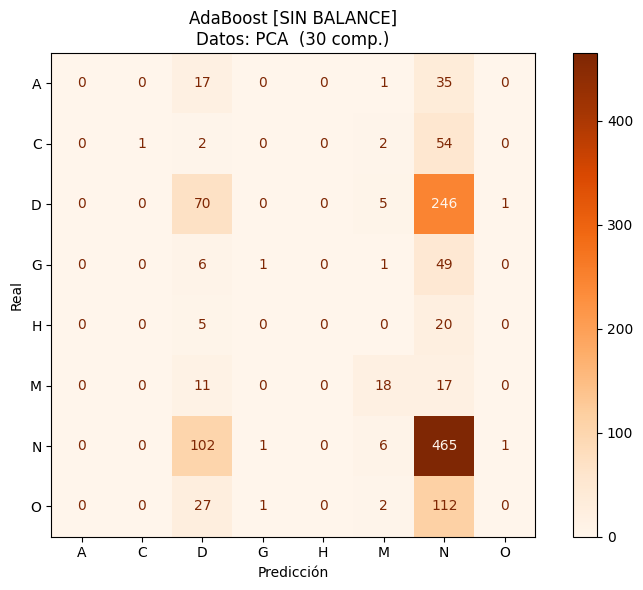


  ADABOOST [SIN BALANCE] — AF   (30 fact.)
  Buscando mejor modelo en 10 intentos...


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 01/10 | Accuracy: 0.4246  🌟 ¡Nuevo récord!


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 02/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 03/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 04/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 05/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 06/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 07/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 08/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 09/10 | Accuracy: 0.4246


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 10/10 | Accuracy: 0.4246

✅ Búsqueda finalizada en 36.6s
🏆 Mejor accuracy: 0.4246

--- Reporte de clasificación [AF   (30 fact.)] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.29      0.28      0.29       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.63      0.41      0.50        46
           N       0.47      0.75      0.58       575
           O       0.00      0.00      0.00       142

    accuracy                           0.42      1279
   macro avg       0.17      0.18      0.17      1279
weighted avg       0.30      0.42      0.35      1279



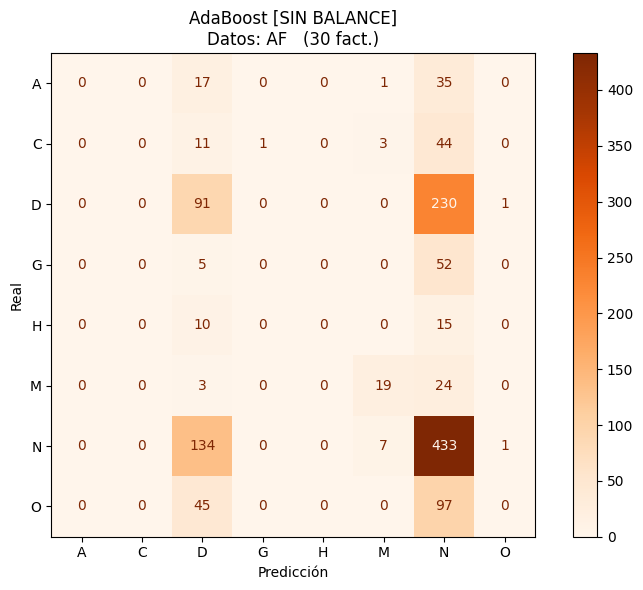


  ADABOOST [SIN BALANCE] — UMAP (30 comp.)
  Buscando mejor modelo en 10 intentos...


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 01/10 | Accuracy: 0.4277  🌟 ¡Nuevo récord!


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 02/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 03/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 04/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 05/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 06/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 07/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 08/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 09/10 | Accuracy: 0.4277


/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(


  Intento 10/10 | Accuracy: 0.4277

✅ Búsqueda finalizada en 35.4s
🏆 Mejor accuracy: 0.4277

--- Reporte de clasificación [UMAP (30 comp.)] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.00      0.00      0.00        59
           D       0.23      0.10      0.14       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.00      0.00      0.00        46
           N       0.45      0.90      0.60       575
           O       0.00      0.00      0.00       142

    accuracy                           0.43      1279
   macro avg       0.09      0.12      0.09      1279
weighted avg       0.26      0.43      0.30      1279



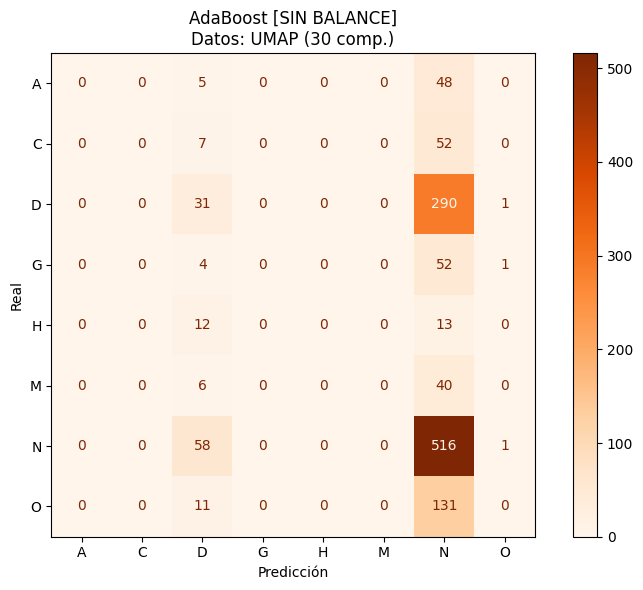


═══════════════════════════════════════════════════════
  RESUMEN — ADABOOST
═══════════════════════════════════════════════════════
  Dataset                    Sin balance
───────────────────────────────────────────────────────
  PCA  (30 comp.)                 0.4339
  AF   (30 fact.)                 0.4246
  UMAP (30 comp.)                 0.4277
═══════════════════════════════════════════════════════
  Nota: class_weight='balanced' no es compatible con
  AdaBoost en datos muy desbalanceados — el estimador
  base se vuelve peor que aleatorio y el ensemble falla.
═══════════════════════════════════════════════════════


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# ADABOOST CLASSIFIER
# ═══════════════════════════════════════════════════════════════════════════
# AdaBoost (Adaptive Boosting) construye un clasificador fuerte combinando
# múltiples clasificadores débiles de forma secuencial. Cada clasificador
# débil se entrena dando mayor peso a las muestras mal clasificadas por
# el clasificador anterior, forzando al modelo a enfocarse en los casos
# difíciles.
#
# Se usa como clasificador base un árbol de profundidad 1 (decision stump),
# que es el estimador base estándar para AdaBoost. Se usa el algoritmo
# SAMME que es el apropiado para clasificación multiclase (8 clases).
#
# Nota sobre balanceo: class_weight='balanced' en el estimador base rompe
# el algoritmo en datasets muy desbalanceados — el decision stump se vuelve
# peor que aleatorio y AdaBoost no puede construir el ensemble. Por esta
# razón solo se evalúa la condición sin balanceo.
#
# Se usa búsqueda Monte Carlo con 10 semillas porque la aleatoriedad en
# la selección de muestras afecta el conjunto de clasificadores débiles
# construidos.
# ═══════════════════════════════════════════════════════════════════════════

def entrenar_adaboost(X_train, y_train, X_test, y_test, semilla=42):
    """
    Entrena y evalúa un modelo AdaBoost con árbol de decisión como
    estimador base.

    Parámetros:
    -----------
    X_train : datos de entrenamiento reducidos
    y_train : etiquetas de entrenamiento
    X_test  : datos de prueba reducidos
    y_test  : etiquetas de prueba
    semilla : semilla para Monte Carlo

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    estimador_base = DecisionTreeClassifier(
        max_depth=1
        # class_weight no se usa: rompe el ensemble en datos desbalanceados
    )

    modelo = AdaBoostClassifier(
        estimator=estimador_base,
        n_estimators=100,
        learning_rate=1.0,
        algorithm='SAMME',  # Requerido para clasificación multiclase
        random_state=semilla
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def buscar_mejor_adaboost(X_train, y_train, X_test, y_test,
                           encoder, etiqueta="PCA",
                           n_intentos=10, color_mapa='Oranges'):
    """
    Búsqueda Monte Carlo del mejor AdaBoost variando la semilla.
    Reporta el modelo con mayor accuracy entre todos los intentos.
    """
    print(f"\n{'='*70}")
    print(f"  ADABOOST [SIN BALANCE] — {etiqueta}")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        res = entrenar_adaboost(
            X_train, y_train, X_test, y_test,
            semilla=semilla_actual
        )

        print(f"  Intento {i+1:02d}/{n_intentos} | "
              f"Accuracy: {res['accuracy']:.4f}", end="")

        if res['accuracy'] > mejor_acc:
            mejor_acc       = res['accuracy']
            mejor_resultado = res
            print("  🌟 ¡Nuevo récord!")
        else:
            print("")

    tiempo_total = time.time() - inicio_global
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f}s")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Reporte ────────────────────────────────────────────────────────────
    clases_nombres = encoder.classes_
    y_pred         = mejor_resultado['y_pred']

    print(f"\n--- Reporte de clasificación [{etiqueta}] ---")
    print(classification_report(
        y_test, y_pred,
        target_names=clases_nombres,
        zero_division=0
    ))

    # ── Matriz de confusión ────────────────────────────────────────────────
    fig, ax = plt.subplots(figsize=(8, 6))
    ConfusionMatrixDisplay.from_predictions(
        y_test, y_pred,
        display_labels=clases_nombres,
        cmap=color_mapa,
        ax=ax,
        colorbar=True
    )
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.title(f'AdaBoost [SIN BALANCE]\nDatos: {etiqueta}')
    plt.tight_layout()
    plt.show()

    return mejor_resultado


# ── Definición de datasets ─────────────────────────────────────────────────
datasets_ada = {
    f"PCA  ({n_componentes} comp.)"     : (X_train_pca,  X_test_pca),
    f"AF   ({n_factores} fact.)"        : (X_train_af,   X_test_af),
    f"UMAP ({n_componentes_umap} comp.)": (X_train_umap, X_test_umap)
}

# ── Ejecución ──────────────────────────────────────────────────────────────
print("\n" + " "*70)
print("  ADABOOST — SIN BALANCEO")
print("  (class_weight no compatible con AdaBoost en datos desbalanceados)")
print(" "*70)

resultados_ada_sin = {}
for nombre, (X_tr, X_te) in datasets_ada.items():
    resultados_ada_sin[nombre] = buscar_mejor_adaboost(
        X_tr, y_train, X_te, y_test, encoder,
        etiqueta=nombre, n_intentos=10,
        color_mapa='Oranges'
    )

# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*55)
print("  RESUMEN — ADABOOST")
print("═"*55)
print(f"  {'Dataset':<25} {'Sin balance':>12}")
print("─"*55)

for nombre, res in resultados_ada_sin.items():
    print(f"  {nombre:<25} {res['accuracy']:>12.4f}")

print("═"*55)
print("  Nota: class_weight='balanced' no es compatible con")
print("  AdaBoost en datos muy desbalanceados — el estimador")
print("  base se vuelve peor que aleatorio y el ensemble falla.")
print("═"*55)

## Tabla comparativa de todos los modelos usados en esta sección


════════════════════════════════════════════════════════════════════════════════
  TABLA COMPARATIVA GLOBAL — MODELOS CON REDUCCIÓN DIMENSIONAL
════════════════════════════════════════════════════════════════════════════════
             Modelo      Condición  PCA (30 comp.)  AF (30 fact.)  UMAP (30 comp.)
Regresión Logística    Sin balance          0.4441         0.4558           0.4511
         SVM LINEAR    Sin balance          0.2729         0.2721           0.4511
            SVM RBF    Sin balance          0.4855         0.4754           0.4527
           SVM POLY    Sin balance          0.4613         0.4394           0.4550
        SVM SIGMOID    Sin balance          0.3573         0.3229           0.3057
             CNN 1D    Sin balance          0.4832         0.4738           0.4605
        Transformer    Sin balance          0.4535         0.4519           0.4535
   MLP (TensorFlow)    Sin balance          0.5059         0.4980           0.4582
      MLP (Sklearn)    Sin 

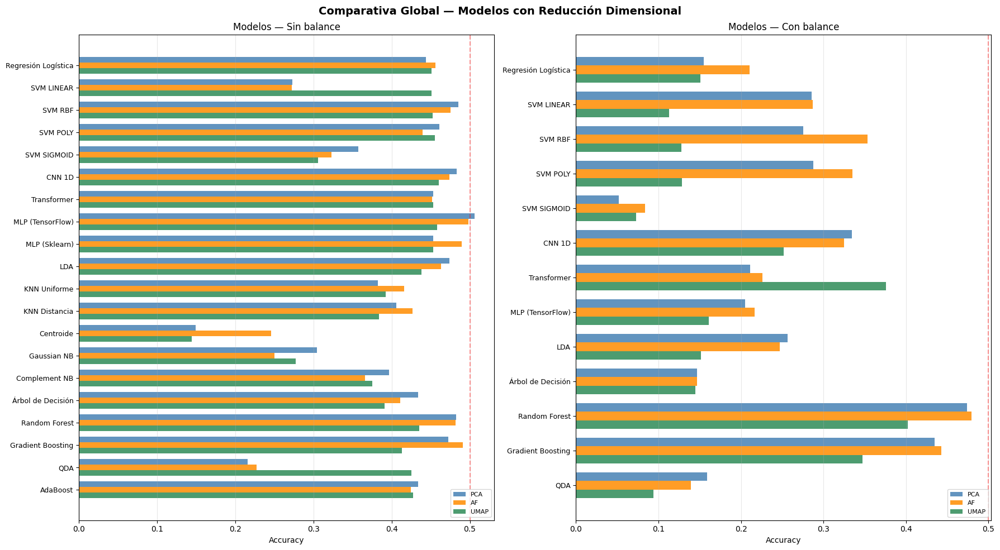

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# TABLA COMPARATIVA GLOBAL — MODELOS CON REDUCCIÓN DIMENSIONAL
# ═══════════════════════════════════════════════════════════════════════════

import pandas as pd

# ── Nombres de columnas ────────────────────────────────────────────────────
col_pca  = f"PCA ({n_componentes} comp.)"
col_af   = f"AF ({n_factores} fact.)"
col_umap = f"UMAP ({n_componentes_umap} comp.)"

filas = []

def agregar_fila(modelo, condicion, resultados):
    acc_pca  = resultados[f"PCA  ({n_componentes} comp.)"]     ['accuracy']
    acc_af   = resultados[f"AF   ({n_factores} fact.)"]         ['accuracy']
    acc_umap = resultados[f"UMAP ({n_componentes_umap} comp.)"] ['accuracy']
    filas.append({
        'Modelo'    : modelo,
        'Condición' : condicion,
        col_pca     : acc_pca,
        col_af      : acc_af,
        col_umap    : acc_umap,
    })

# ═══════════════════════════════════════════════════════════════════
# BLOQUE 1 — SIN BALANCE
# ═══════════════════════════════════════════════════════════════════
agregar_fila('Regresión Logística', 'Sin balance', resultados_sin_balance)

for kernel in ['linear', 'rbf', 'poly', 'sigmoid']:
    res_sin = {k: v[kernel] for k, v in resultados_svm_sin_balance.items()}
    agregar_fila(f'SVM {kernel.upper()}', 'Sin balance', res_sin)

res_cnn_sin = {
    f"PCA  ({n_componentes} comp.)"     : res_cnn_pca_sin,
    f"AF   ({n_factores} fact.)"        : res_cnn_af_sin,
    f"UMAP ({n_componentes_umap} comp.)": res_cnn_umap_sin
}
agregar_fila('CNN 1D',           'Sin balance', res_cnn_sin)
agregar_fila('Transformer',      'Sin balance', resultados_trans_sin)
agregar_fila('MLP (TensorFlow)', 'Sin balance', resultados_mlp_sin)
agregar_fila('MLP (Sklearn)',    'Sin balance', resultados_mlp_sk)
agregar_fila('LDA',              'Sin balance', resultados_lda_sin)
agregar_fila('KNN Uniforme',     'Sin balance', resultados_knn_uniform)
agregar_fila('KNN Distancia',    'Sin balance', resultados_knn_dist)
agregar_fila('Centroide',        'Sin balance', resultados_centroide)
agregar_fila('Gaussian NB',      'Sin balance', resultados_gnb)
agregar_fila('Complement NB',    'Sin balance', resultados_cnb)
agregar_fila('Árbol de Decisión','Sin balance', resultados_arboles_sin)
agregar_fila('Random Forest',    'Sin balance', resultados_rf_sin)
agregar_fila('Gradient Boosting','Sin balance', resultados_gb_sin)
agregar_fila('QDA',              'Sin balance', resultados_qda_sin)
agregar_fila('AdaBoost',         'Sin balance', resultados_ada_sin)

# ═══════════════════════════════════════════════════════════════════
# BLOQUE 2 — CON BALANCE
# ═══════════════════════════════════════════════════════════════════
agregar_fila('Regresión Logística', 'Class Weight', resultados_class_weight)

for kernel in ['linear', 'rbf', 'poly', 'sigmoid']:
    res_cw = {k: v[kernel] for k, v in resultados_svm_class_weight.items()}
    agregar_fila(f'SVM {kernel.upper()}', 'Class Weight', res_cw)

res_cnn_cw = {
    f"PCA  ({n_componentes} comp.)"     : res_cnn_pca_cw,
    f"AF   ({n_factores} fact.)"        : res_cnn_af_cw,
    f"UMAP ({n_componentes_umap} comp.)": res_cnn_umap_cw
}
agregar_fila('CNN 1D',           'Class Weight',  res_cnn_cw)
agregar_fila('Transformer',      'Class Weight',  resultados_trans_cw)
agregar_fila('MLP (TensorFlow)', 'Class Weight',  resultados_mlp_cw)
agregar_fila('LDA',              'Priors Iguales', resultados_lda_bal)
agregar_fila('Árbol de Decisión','Class Weight',  resultados_arboles_cw)
agregar_fila('Random Forest',    'Class Weight',  resultados_rf_cw)
agregar_fila('Gradient Boosting','Class Weight',  resultados_gb_cw)
agregar_fila('QDA',              'Priors Iguales', resultados_qda_bal)
# Nota: MLP Sklearn, KNN, Centroide, Naive Bayes y AdaBoost
# no tienen condición con balance

# ── Construcción del DataFrame ─────────────────────────────────────────────
df = pd.DataFrame(filas)

# ── Visualización ──────────────────────────────────────────────────────────
print("\n" + "═"*80)
print("  TABLA COMPARATIVA GLOBAL — MODELOS CON REDUCCIÓN DIMENSIONAL")
print("═"*80)

print(df.to_string(
    index=False,
    float_format=lambda x: f'{x:.4f}'
))

print("\n" + "═"*80)
print(f"  Total de configuraciones: {len(df)}")
print("═"*80)

# ── Gráfica ────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 10), sharey=False)

bloques = [
    ('Sin balance',  df[df['Condición'] == 'Sin balance'],  'steelblue',  axes[0]),
    ('Con balance',  df[df['Condición'] != 'Sin balance'],  'seagreen',   axes[1])
]

for titulo, datos, color, ax in bloques:
    modelos  = datos['Modelo']
    pca_vals = datos[col_pca].values
    af_vals  = datos[col_af].values
    umap_vals= datos[col_umap].values

    x      = range(len(modelos))
    ancho  = 0.25

    ax.barh([i - ancho for i in x], pca_vals,  ancho, label='PCA',  color='steelblue', alpha=0.85)
    ax.barh([i         for i in x], af_vals,   ancho, label='AF',   color='darkorange', alpha=0.85)
    ax.barh([i + ancho for i in x], umap_vals, ancho, label='UMAP', color='seagreen',  alpha=0.85)

    ax.set_yticks(list(x))
    ax.set_yticklabels(modelos, fontsize=9)
    ax.invert_yaxis()
    ax.set_xlabel('Accuracy')
    ax.set_title(f'Modelos — {titulo}', fontsize=12)
    ax.axvline(x=0.5, color='red', linestyle='--', alpha=0.4)
    ax.grid(True, alpha=0.3, axis='x')
    ax.legend(loc='lower right', fontsize=8)

plt.suptitle('Comparativa Global — Modelos con Reducción Dimensional',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# ── Guardar en Drive ───────────────────────────────────────────────────────
#df.to_csv(
    #'/content/drive/MyDrive/enfermedades oculares/resultados_reduccion.csv',
    #index=False
#)
#print("✅ Resultados guardados en Drive como 'resultados_reduccion.csv'")

# **Código para modelos sin reducción de dimensionalidad**

En esta sección los modelos trabajan directamente sobre las imágenes completas sin ninguna reducción previa. Esto permite quelos modelos aprendan representaciones visuales ricas como bordes, texturas y patrones propios de cada enfermedad ocular.

In [7]:
# ── Copiar imágenes a disco local ──────────────────────────────────────
# Las imágenes se copian desde Drive al disco local de Colab para acelerar
# la lectura durante el entrenamiento. Drive tiene latencia alta por ser
# una unidad de red, mientras que el disco local es ~10x más rápido.

# Rutas
origen_drive = '/content/drive/MyDrive/enfermedades oculares/preprocessed_images'
destino_colab = '/content/imagenes_temp'

print(f"Copiando imágenes desde Google Drive a Colab ({destino_colab})...")
print("Esto puede tardar un par de minutos, pero acelerará el entrenamiento x10.")

# Copiar todo el directorio
if os.path.exists(destino_colab):
    shutil.rmtree(destino_colab) # Limpiar si ya existe para evitar errores
shutil.copytree(origen_drive, destino_colab)

print("¡Copia terminada! Ahora las imágenes están en el disco local rápido.")

Copiando imágenes desde Google Drive a Colab (/content/imagenes_temp)...
Esto puede tardar un par de minutos, pero acelerará el entrenamiento x10.
¡Copia terminada! Ahora las imágenes están en el disco local rápido.


In [8]:
# ── Constantes globales ─────────────────────────────────────────────────
# Estas constantes son compartidas por todos los modelos de esta sección.
# IMG_SHAPE = (224, 224) es el tamaño estándar para modelos de transfer
# learning como EfficientNetB3.

CSV_PATH   = '/content/drive/MyDrive/enfermedades oculares/full_df.csv'
FOLDER_PATH = destino_colab
IMG_SHAPE  = (224, 224)
BATCH_SIZE = 32
SEED       = 42

In [9]:
# ── Carga y limpieza del CSV ────────────────────────────────────────────
df = pd.read_csv(CSV_PATH)
df['labels'] = df['labels'].str.replace(r"[\[\]' ]", "", regex=True)

print(f"✅ CSV cargado: {len(df)} imágenes")
print(f"   Distribución de clases:")
print(df['labels'].value_counts())

✅ CSV cargado: 6392 imágenes
   Distribución de clases:
labels
N    2873
D    1608
O     708
C     293
G     284
A     266
M     232
H     128
Name: count, dtype: int64


In [10]:
# ──  División train/test ─────────────────────────────────────────────────
# Se divide el DataFrame (no los arrays de imágenes) para eficiencia
# en memoria.
train_df, test_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df['labels'],
    random_state=SEED
)

print(f"\n✅ División completada:")
print(f"   Entrenamiento : {len(train_df)} imágenes")
print(f"   Prueba        : {len(test_df)} imágenes")


✅ División completada:
   Entrenamiento : 5113 imágenes
   Prueba        : 1279 imágenes


In [11]:
# ── Función de generadores ──────────────────────────────────────────────

def crear_generadores(preprocesamiento=None):
    """
    Crea generadores de entrenamiento y validación.

    Parámetros:
    -----------
    preprocesamiento : función de preprocesamiento del modelo
                       si None usa rescale=1./255

    Retorna:
    --------
    train_generator, val_generator
    """
    if preprocesamiento is not None:
        train_datagen = ImageDataGenerator(
            preprocessing_function=preprocesamiento,
            rotation_range=20,
            width_shift_range=0.1,
            height_shift_range=0.1,
            horizontal_flip=True,
            fill_mode='nearest'
        )
        val_datagen = ImageDataGenerator(
            preprocessing_function=preprocesamiento
        )
    else:
        train_datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=20,
            width_shift_range=0.1,
            height_shift_range=0.1,
            horizontal_flip=True,
            fill_mode='nearest'
        )
        val_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True,
        seed=SEED
    )

    val_generator = val_datagen.flow_from_dataframe(
        dataframe=test_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    return train_generator, val_generator


print("\n✅ Configuración lista. Generadores disponibles via crear_generadores()")
print(f"   Tamaño de imagen : {IMG_SHAPE}")
print(f"   Batch size       : {BATCH_SIZE}")
print(f"   Modelos propios  : crear_generadores()")
print(f"   Transfer learning: crear_generadores(preprocesamiento=preprocess_input)")


✅ Configuración lista. Generadores disponibles via crear_generadores()
   Tamaño de imagen : (224, 224)
   Batch size       : 32
   Modelos propios  : crear_generadores()
   Transfer learning: crear_generadores(preprocesamiento=preprocess_input)


In [12]:
# ──Función: cargar imágenes como array para modelos sklearn ────────────
# Para LogReg y SVM-RBF. Carga las imágenes a 128×128 (mismo tamaño que
# la sección de reducción dimensional) y las aplana en un vector 1D.

IMG_SHAPE_SK = (128, 128)

def cargar_imagenes_como_array(df, folder_path, img_shape=IMG_SHAPE_SK):
    """
    Carga imágenes desde disco y las convierte en array 2D aplanado
    listo para modelos sklearn.

    Parámetros:
    -----------
    df          : DataFrame con columnas 'filename' y 'labels'
    folder_path : ruta a la carpeta de imágenes
    img_shape   : tamaño de redimensionado (default: 128×128)

    Retorna:
    --------
    X : array (n_muestras, 49152) normalizado [0, 1]
    y : array de etiquetas codificadas
    """
    X, y  = [], []
    total = len(df)

    for i, (_, fila) in enumerate(df.iterrows()):
        ruta = os.path.join(folder_path, fila['filename'])
        img  = cv2.imread(ruta)
        img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img  = cv2.resize(img, img_shape)
        img  = img / 255.0      # Normalizar a [0, 1]
        X.append(img.flatten()) # 128×128×3 → 49,152 features
        y.append(fila['labels'])

        if (i + 1) % 500 == 0:
            print(f"   Cargadas {i+1}/{total} imágenes...", end="\r")

    print(f"   ✅ {total} imágenes cargadas como array             ")
    return np.array(X, dtype=np.float32), np.array(y)

## Código para guardar las variables de modelos sin reducción

In [13]:
# ═══════════════════════════════════════════════════════════════════════════
# SISTEMA DE CHECKPOINTS — MODELOS SIN REDUCCIÓN DIMENSIONAL
# ═══════════════════════════════════════════════════════════════════════════

import pickle
import os

CHECKPOINT_PATH = '/content/drive/MyDrive/enfermedades oculares/checkpoint_resultados.pkl'

def guardar_checkpoint(nuevo_resultado):
    if os.path.exists(CHECKPOINT_PATH):
        with open(CHECKPOINT_PATH, 'rb') as f:
            checkpoint = pickle.load(f)
        print(f"📂 Checkpoint existente cargado con {len(checkpoint)} entradas")
    else:
        checkpoint = {}
        print("📂 Creando checkpoint nuevo...")

    checkpoint.update(nuevo_resultado)

    with open(CHECKPOINT_PATH, 'wb') as f:
        pickle.dump(checkpoint, f)

    print(f"✅ Checkpoint actualizado — entradas: {list(checkpoint.keys())}")


def cargar_checkpoint():
    if not os.path.exists(CHECKPOINT_PATH):
        print("⚠️ No existe checkpoint guardado en Drive")
        return {}

    with open(CHECKPOINT_PATH, 'rb') as f:
        checkpoint = pickle.load(f)

    print(f"✅ Checkpoint cargado con {len(checkpoint)} entradas:")
    for clave, valor in checkpoint.items():
        if isinstance(valor, float):
            print(f"   {clave:30s} : {valor:.4f}")
        else:
            print(f"   {clave:30s} : array {type(valor).__name__}")

    return checkpoint


def mostrar_pendientes(checkpoint):
    todos = [
        'acc_cnn_sin',  'acc_cnn_cw',
        'acc_vit_sin',  'acc_vit_cw',
        'acc_eff_sin',  'acc_eff_cw',
        'acc_rn_sin',   'acc_rn_cw',
        'acc_dn_sin',   'acc_dn_cw',
        'acc_inc_sin',  'acc_inc_cw',
        'acc_mlp_sin',  'acc_mlp_cw',
        'acc_lr_sin',   'acc_lr_cw',
        'acc_svm_sin',  'acc_svm_cw'
    ]

    print("\n" + "═"*50)
    print("  ESTADO DE MODELOS")
    print("═"*50)
    for clave in todos:
        estado = "✅" if clave in checkpoint else "⏳"
        print(f"  {estado} {clave}")
    print("═"*50)
    completados = sum(1 for c in todos if c in checkpoint)
    print(f"  Completados: {completados}/{len(todos)}")
    print("═"*50)


# ── Recuperar resultados del checkpoint ───────────────────────────────────
checkpoint = cargar_checkpoint()
mostrar_pendientes(checkpoint)

acc_cnn_sin = checkpoint.get('acc_cnn_sin', None)
acc_cnn_cw  = checkpoint.get('acc_cnn_cw',  None)
acc_vit_sin = checkpoint.get('acc_vit_sin', None)
acc_vit_cw  = checkpoint.get('acc_vit_cw',  None)
acc_eff_sin = checkpoint.get('acc_eff_sin', None)
acc_eff_cw  = checkpoint.get('acc_eff_cw',  None)
acc_rn_sin  = checkpoint.get('acc_rn_sin',  None)
acc_rn_cw   = checkpoint.get('acc_rn_cw',   None)
acc_dn_sin  = checkpoint.get('acc_dn_sin',  None)
acc_dn_cw   = checkpoint.get('acc_dn_cw',   None)
acc_inc_sin = checkpoint.get('acc_inc_sin', None)
acc_inc_cw  = checkpoint.get('acc_inc_cw',  None)
acc_mlp_sin = checkpoint.get('acc_mlp_sin', None)
acc_mlp_cw  = checkpoint.get('acc_mlp_cw',  None)
acc_lr_sin  = checkpoint.get('acc_lr_sin',  None)
acc_lr_cw   = checkpoint.get('acc_lr_cw',   None)
acc_svm_sin = checkpoint.get('acc_svm_sin', None)
acc_svm_cw  = checkpoint.get('acc_svm_cw',  None)

print("\n✅ Variables restauradas — listo para continuar")

✅ Checkpoint cargado con 24 entradas:
   acc_cnn_sin                    : 0.5528
   acc_cnn_cw                     : 0.2846
   acc_lr_sin                     : 0.4386
   acc_lr_cw                      : 0.3847
   acc_mlp_sin                    : 0.4808
   acc_mlp_cw                     : 0.1970
   acc_rn_sin                     : 0.6153
   acc_rn_cw                      : 0.4668
   acc_dn_sin                     : 0.6255
   acc_dn_cw                      : 0.4707
   acc_inc_sin                    : 0.6380
   acc_inc_cw                     : 0.5395
   acc_eff_sin                    : 0.6435
   y_prob_eff_sin                 : array ndarray
   acc_eff_cw                     : 0.3909
   y_prob_eff_cw                  : array ndarray
   acc_vit_sin                    : 0.5887
   y_prob_vit_sin                 : array ndarray
   acc_vit_cw                     : 0.4605
   y_prob_vit_cw                  : array ndarray
   acc_svm_sin                    : 0.4824
   y_prob_svm_sin              

## Modelos presentados en el documento


### Red neuronal convolucional


In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# RED NEURONAL CONVOLUCIONAL 2D (CNN)
# ═══════════════════════════════════════════════════════════════════════════

def crear_generadores_cnn():
    """
    Crea generadores específicos para CNN con data augmentation extendido.
    El augmentation incluye cambios de brillo para simular variaciones en
    las condiciones de iluminación de los exámenes oculares.
    Solo se aplica augmentation al entrenamiento, nunca a validación.
    """
    tren_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        zoom_range=0.2,
        shear_range=0.1,
        brightness_range=[0.8, 1.2],  # Simula variaciones de iluminación
        fill_mode='nearest'
    )
    val_datagen = ImageDataGenerator(rescale=1./255)

    generador_tren = tren_datagen.flow_from_dataframe(
        dataframe=train_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True,
        seed=SEED
    )

    generador_val = val_datagen.flow_from_dataframe(
        dataframe=test_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    return generador_tren, generador_val


def construir_cnn(n_clases):
    """
    Construye la arquitectura CNN con 5 bloques convolucionales.
    Usa GlobalAveragePooling2D en lugar de Flatten para reducir
    parámetros y mejorar la generalización.

    Parámetros:
    -----------
    n_clases : número de clases a clasificar (8 enfermedades)

    Retorna:
    --------
    modelo Keras sin compilar
    """
    modelo = Sequential([
        # Bloque 1 — detección de bordes y texturas simples
        Conv2D(32, (3, 3), activation='relu',
               input_shape=(IMG_SHAPE[0], IMG_SHAPE[1], 3), padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        # Bloque 2
        Conv2D(64, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        # Bloque 3
        Conv2D(128, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        # Bloque 4
        Conv2D(256, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        # Bloque 5 — patrones complejos específicos por enfermedad
        Conv2D(512, (3, 3), activation='relu', padding='same'),
        BatchNormalization(),
        MaxPooling2D(pool_size=(2, 2)),

        # Clasificación — GlobalAveragePooling reduce sobreajuste vs Flatten
        GlobalAveragePooling2D(),
        Dense(512, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        Dropout(0.5),
        Dense(256, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        Dropout(0.3),
        Dense(n_clases, activation='softmax')
    ])

    return modelo


def graficar_curvas(historial, titulo):
    """
    Grafica las curvas de exactitud y pérdida de entrenamiento y validación.
    """
    exactitud     = historial.history['accuracy']
    val_exactitud = historial.history['val_accuracy']
    perdida       = historial.history['loss']
    val_perdida   = historial.history['val_loss']
    epocas        = range(len(exactitud))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(titulo, fontsize=14)

    ax1.plot(epocas, exactitud,     label='Entrenamiento')
    ax1.plot(epocas, val_exactitud, label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, perdida,     label='Entrenamiento')
    ax2.plot(epocas, val_perdida, label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


def generar_reporte_cnn(modelo, generador_val, titulo):
    """
    Genera reporte de clasificación y matriz de confusión para CNN.
    """
    generador_val.reset()
    predicciones  = modelo.predict(generador_val,
                                   steps=len(generador_val), verbose=1)
    y_pred        = np.argmax(predicciones, axis=1)
    y_real        = generador_val.classes
    nombres_clases = list(generador_val.class_indices.keys())

    acc = accuracy_score(y_real, y_pred)
    print(f"\n🏆 Accuracy final: {acc:.4f}")

    print(f"\n--- Reporte de clasificación: {titulo} ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases, zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — {titulo}')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    return acc


# ── Callbacks compartidos ──────────────────────────────────────────────────
# EarlyStopping: detiene si val_loss no mejora en 8 épocas
# ReduceLROnPlateau: reduce lr a la mitad si val_loss no mejora en 4 épocas
callbacks_cnn = [
    EarlyStopping(
        monitor='val_loss', patience=8,
        restore_best_weights=True, verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=4, min_lr=1e-7, verbose=1
    )
]

# ── Generadores ────────────────────────────────────────────────────────────
print("⏳ Creando generadores...")
generador_tren, generador_val = crear_generadores_cnn()
n_clases = len(generador_tren.class_indices)
print(f"✅ Clases detectadas: {n_clases} → {generador_tren.class_indices}")

# ── Pesos de clases ────────────────────────────────────────────────────────
pesos = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(generador_tren.classes),
    y=generador_tren.classes
)
pesos_dict = dict(enumerate(pesos))
print(f"\n⚖️  Pesos calculados: {pesos_dict}")



⏳ Creando generadores...
Found 5113 validated image filenames belonging to 8 classes.
Found 1279 validated image filenames belonging to 8 classes.
✅ Clases detectadas: 8 → {'A': 0, 'C': 1, 'D': 2, 'G': 3, 'H': 4, 'M': 5, 'N': 6, 'O': 7}

⚖️  Pesos calculados: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  CNN 2D — SIN BALANCE
                                                                      
Epoch 1/50
160/160 [==============================] - 81s 448ms/step - loss: 1.7963 - accuracy: 0.3798 - val_loss: 1.7022 - val_accuracy: 0.4496 - lr: 1.0000e-04
Epoch 2/50
160/160 [==============================] - 72s 447ms/step - loss: 1.6599 - accuracy: 0.4160 - val_loss: 1.8222 - val_accuracy: 0.4504 - lr: 1.0000e-04
Epoch 3/50
160/160 [==============================] - 72s 447ms/step - loss: 1.6203 - accuracy: 0.4299 - val_loss: 1.7585 - val_accuracy: 0.3823 - lr: 1.0000e-04
Epoch 4/50
160/160 [==============================] - 71s 444ms/step - loss: 1.5858 - accuracy: 0.4403 - val_loss: 1.5241 - val_accuracy: 0.4543 - lr: 1.0000e-04
Epoch 5/50
160/160 [==============================] - 75s 468ms/step - loss: 1.5599 - accuracy: 0.4553 - val_loss: 1.5404 - val_accuracy: 0.4629 - lr: 1.0000e-04
Epoch 6/50
160/160 [====

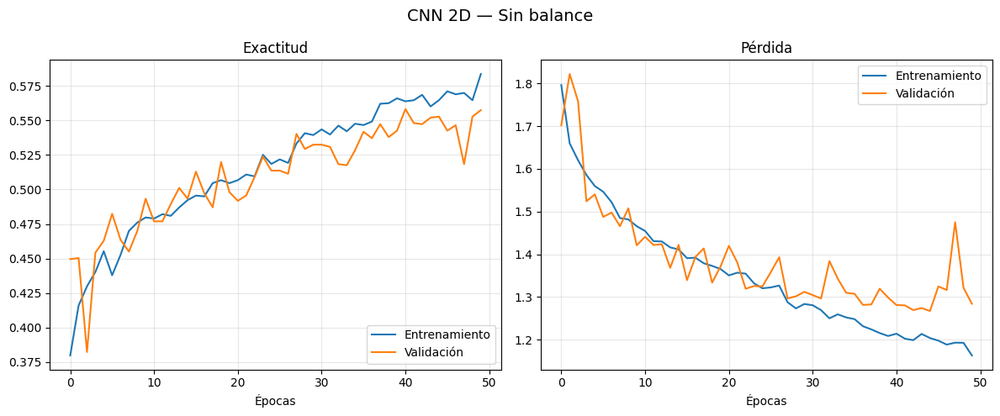

40/40 [==============================] - 4s 84ms/step

🏆 Accuracy final: 0.5528

--- Reporte de clasificación: CNN 2D — Sin balance ---
              precision    recall  f1-score   support

           A       0.67      0.08      0.14        53
           C       0.62      0.75      0.68        59
           D       0.54      0.25      0.34       322
           G       0.43      0.11      0.17        57
           H       0.00      0.00      0.00        25
           M       0.87      0.87      0.87        46
           N       0.54      0.92      0.68       575
           O       0.50      0.01      0.03       142

    accuracy                           0.55      1279
   macro avg       0.52      0.37      0.36      1279
weighted avg       0.54      0.55      0.47      1279



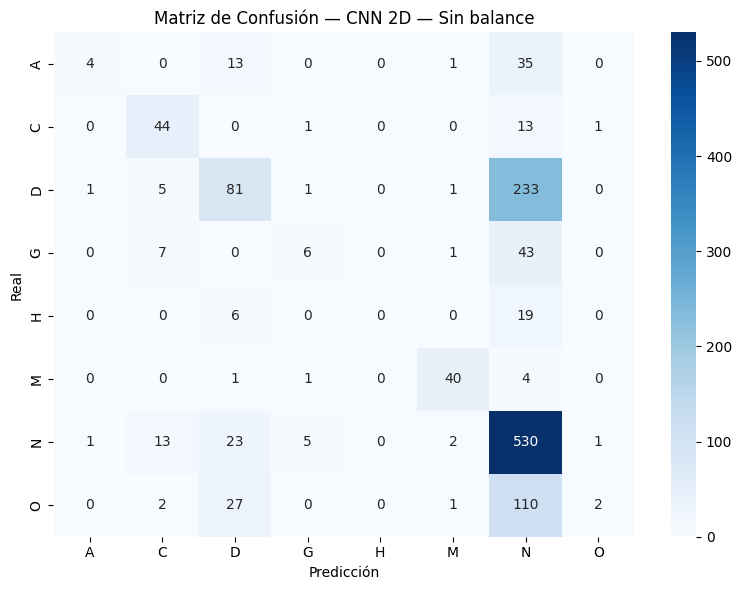

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  CNN 2D — SIN BALANCE")
print(" "*70)

modelo_cnn_sin = construir_cnn(n_clases)
modelo_cnn_sin.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inicio = time.time()
historial_sin = modelo_cnn_sin.fit(
    generador_tren,
    epochs=50,
    validation_data=generador_val,
    callbacks=callbacks_cnn,
    verbose=1
)
print(f"⏱️  Tiempo: {time.time() - inicio:.1f}s")

graficar_curvas(historial_sin, "CNN 2D — Sin balance")
acc_cnn_sin = generar_reporte_cnn(modelo_cnn_sin, generador_val,
                                   "CNN 2D — Sin balance")



                                                                      
  CNN 2D — CLASS WEIGHT
                                                                      
Epoch 1/50
160/160 [==============================] - 77s 450ms/step - loss: 2.2794 - accuracy: 0.1557 - val_loss: 2.3903 - val_accuracy: 0.0461 - lr: 1.0000e-04
Epoch 2/50
160/160 [==============================] - 71s 446ms/step - loss: 2.0565 - accuracy: 0.1604 - val_loss: 2.5008 - val_accuracy: 0.0555 - lr: 1.0000e-04
Epoch 3/50
160/160 [==============================] - 72s 448ms/step - loss: 1.9751 - accuracy: 0.1848 - val_loss: 3.0800 - val_accuracy: 0.0461 - lr: 1.0000e-04
Epoch 4/50
160/160 [==============================] - 72s 450ms/step - loss: 1.9083 - accuracy: 0.1737 - val_loss: 2.2224 - val_accuracy: 0.1032 - lr: 1.0000e-04
Epoch 5/50
160/160 [==============================] - 72s 447ms/step - loss: 1.8354 - accuracy: 0.1838 - val_loss: 2.1132 - val_accuracy: 0.1087 - lr: 1.0000e-04
Epoch 6/50
160/160 [===

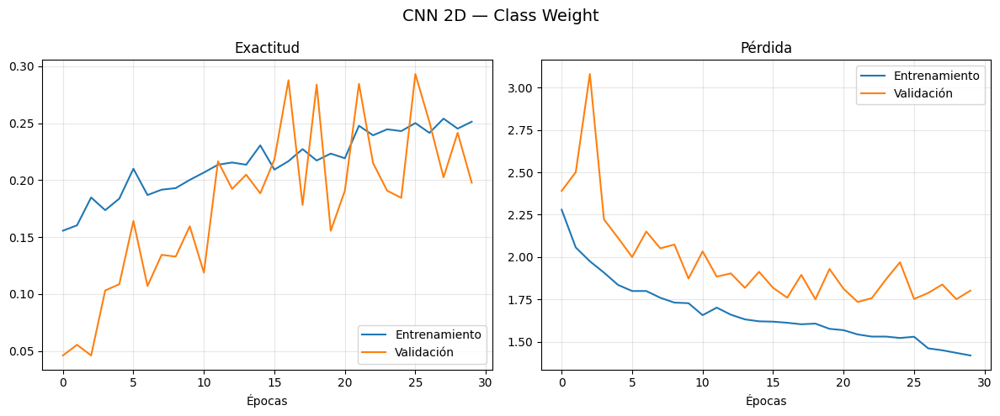

40/40 [==============================] - 3s 82ms/step

🏆 Accuracy final: 0.2846

--- Reporte de clasificación: CNN 2D — Class Weight ---
              precision    recall  f1-score   support

           A       0.11      0.43      0.17        53
           C       0.47      0.78      0.59        59
           D       0.35      0.34      0.34       322
           G       0.16      0.26      0.20        57
           H       0.04      0.44      0.07        25
           M       0.77      0.87      0.82        46
           N       0.60      0.20      0.30       575
           O       0.19      0.06      0.09       142

    accuracy                           0.28      1279
   macro avg       0.34      0.42      0.32      1279
weighted avg       0.44      0.28      0.30      1279



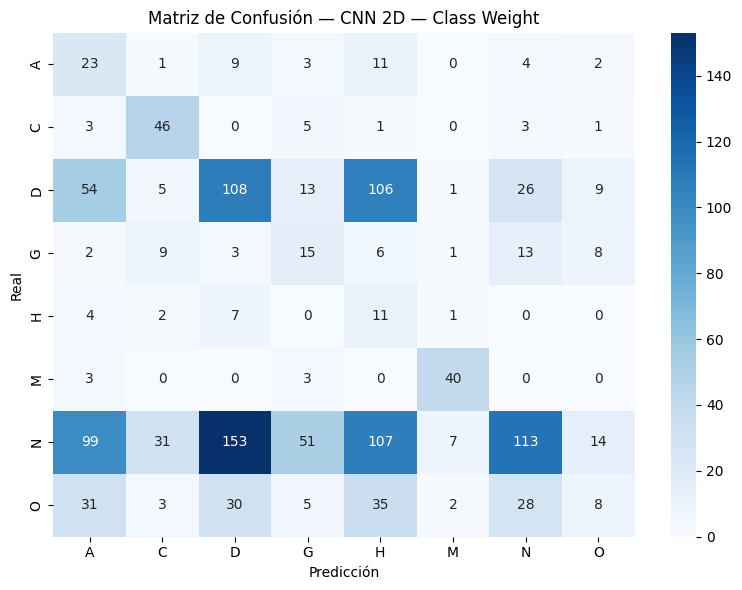

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  CNN 2D — CLASS WEIGHT")
print(" "*70)

modelo_cnn_cw = construir_cnn(n_clases)
modelo_cnn_cw.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inicio = time.time()
historial_cw = modelo_cnn_cw.fit(
    generador_tren,
    epochs=50,
    validation_data=generador_val,
    callbacks=callbacks_cnn,
    class_weight=pesos_dict,
    verbose=1
)
print(f"⏱️  Tiempo: {time.time() - inicio:.1f}s")

graficar_curvas(historial_cw, "CNN 2D — Class Weight")
acc_cnn_cw = generar_reporte_cnn(modelo_cnn_cw, generador_val,
                                  "CNN 2D — Class Weight")


In [ ]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — CNN 2D")
print("═"*45)
print(f"  Sin balance  : {acc_cnn_sin:.4f}")
print(f"  Class Weight : {acc_cnn_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — CNN 2D
═════════════════════════════════════════════
  Sin balance  : 0.5528
  Class Weight : 0.2846
═════════════════════════════════════════════


In [ ]:
# Al final del bloque CNN — después de la tabla resumen
guardar_checkpoint({
    'acc_cnn_sin': acc_cnn_sin,
    'acc_cnn_cw' : acc_cnn_cw
})

📂 Creando checkpoint nuevo...
✅ Checkpoint actualizado — resultados guardados: ['acc_cnn_sin', 'acc_cnn_cw']


### Red tipo transformer

In [43]:
# ═══════════════════════════════════════════════════════════════════════════
# VISION TRANSFORMER (ViT)
# ═══════════════════════════════════════════════════════════════════════════

VIT_URL = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"

def construir_vit(n_clases):
    modelo = models.Sequential([
        layers.InputLayer(input_shape=(224, 224, 3)),
        hub.KerasLayer(VIT_URL, trainable=False),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.Dropout(0.3),
        layers.BatchNormalization(),
        layers.Dense(128, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.Dropout(0.3),
        layers.Dense(n_clases, activation='softmax')
    ])
    return modelo


def graficar_curvas_vit(historial, titulo):
    epocas = range(len(historial.history['accuracy']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(titulo, fontsize=14)

    ax1.plot(epocas, historial.history['accuracy'],     label='Entrenamiento')
    ax1.plot(epocas, historial.history['val_accuracy'], label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, historial.history['loss'],     label='Entrenamiento')
    ax2.plot(epocas, historial.history['val_loss'], label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


def generar_reporte_vit(modelo, generador_val, titulo):
    """
    Genera reporte de clasificación y matriz de confusión para ViT.
    Retorna accuracy Y predicciones (probabilidades softmax) para checkpoint.
    """
    generador_val.reset()
    predicciones   = modelo.predict(generador_val, verbose=1)
    y_pred         = np.argmax(predicciones, axis=1)
    y_real         = generador_val.classes
    nombres_clases = list(generador_val.class_indices.keys())

    acc = accuracy_score(y_real, y_pred)
    print(f"\n🏆 Accuracy final: {acc:.4f}")

    print(f"\n--- Reporte de clasificación: {titulo} ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — {titulo}')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    # ── Retorna acc Y predicciones para checkpoint ─────────────────────────
    return acc, predicciones


# ── Generadores ────────────────────────────────────────────────────────────
print("⏳ Creando generadores...")
generador_tren_vit, generador_val_vit = crear_generadores()
n_clases_vit = len(generador_tren_vit.class_indices)
print(f"✅ Clases detectadas: {n_clases_vit} → {generador_tren_vit.class_indices}")

# ── Pesos de clases ────────────────────────────────────────────────────────
pesos_vit = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(generador_tren_vit.classes),
    y=generador_tren_vit.classes
)
pesos_dict_vit = dict(enumerate(pesos_vit))
print(f"\n⚖️  Pesos calculados: {pesos_dict_vit}")

# ── Callbacks ──────────────────────────────────────────────────────────────
callbacks_vit = [
    EarlyStopping(
        monitor='val_loss', patience=8,
        restore_best_weights=True, verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_loss', factor=0.5,
        patience=4, min_lr=1e-7, verbose=1
    )
]


⏳ Creando generadores...
Found 5113 validated image filenames belonging to 8 classes.
Found 1279 validated image filenames belonging to 8 classes.
✅ Clases detectadas: 8 → {'A': 0, 'C': 1, 'D': 2, 'G': 3, 'H': 4, 'M': 5, 'N': 6, 'O': 7}

⚖️  Pesos calculados: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  VISION TRANSFORMER — SIN BALANCE
                                                                      
Epoch 1/100
160/160 [==============================] - 115s 654ms/step - loss: 2.0520 - accuracy: 0.2654 - val_loss: 1.5212 - val_accuracy: 0.4120 - lr: 1.0000e-04
Epoch 2/100
160/160 [==============================] - 95s 589ms/step - loss: 1.6479 - accuracy: 0.4254 - val_loss: 1.4268 - val_accuracy: 0.5027 - lr: 1.0000e-04
Epoch 3/100
160/160 [==============================] - 93s 577ms/step - loss: 1.4977 - accuracy: 0.4807 - val_loss: 1.3496 - val_accuracy: 0.5301 - lr: 1.0000e-04
Epoch 4/100
160/160 [==============================] - 92s 571ms/step - loss: 1.4619 - accuracy: 0.4807 - val_loss: 1.3602 - val_accuracy: 0.5098 - lr: 1.0000e-04
Epoch 5/100
160/160 [==============================] - 93s 579ms/step - loss: 1.3948 - accuracy: 0.4954 - val_loss: 1.3176 - val_accuracy: 0.5473 - lr: 1.0000e-04
Epoch 

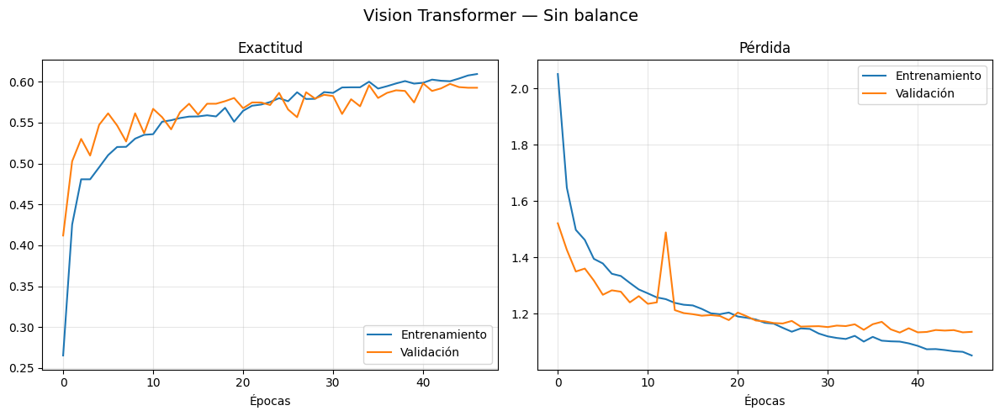

40/40 [==============================] - 18s 444ms/step

🏆 Accuracy final: 0.5887

--- Reporte de clasificación: Vision Transformer — Sin balance ---
              precision    recall  f1-score   support

           A       0.50      0.30      0.38        53
           C       0.73      0.81      0.77        59
           D       0.54      0.45      0.49       322
           G       0.48      0.21      0.29        57
           H       0.00      0.00      0.00        25
           M       0.89      0.85      0.87        46
           N       0.59      0.85      0.69       575
           O       0.55      0.04      0.08       142

    accuracy                           0.59      1279
   macro avg       0.53      0.44      0.45      1279
weighted avg       0.57      0.59      0.54      1279



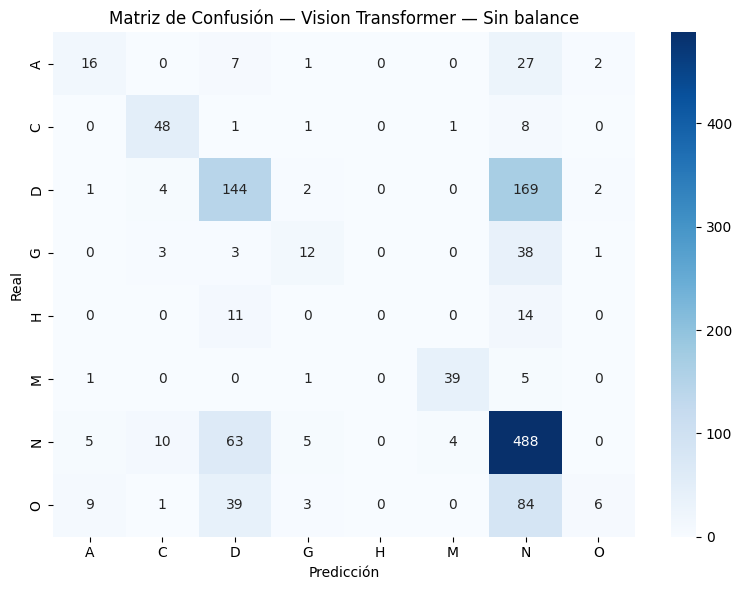

📂 Checkpoint existente cargado con 16 entradas
✅ Checkpoint actualizado — entradas: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw', 'acc_eff_sin', 'y_prob_eff_sin', 'acc_eff_cw', 'y_prob_eff_cw', 'acc_vit_sin', 'y_prob_vit_sin']


In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  VISION TRANSFORMER — SIN BALANCE")
print(" "*70)

modelo_vit_sin = construir_vit(n_clases_vit)
modelo_vit_sin.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inicio = time.time()
historial_vit_sin = modelo_vit_sin.fit(
    generador_tren_vit,
    epochs=100,
    validation_data=generador_val_vit,
    callbacks=callbacks_vit,
    verbose=1
)
print(f"⏱️  Tiempo: {time.time() - inicio:.1f}s")

graficar_curvas_vit(historial_vit_sin, "Vision Transformer — Sin balance")
acc_vit_sin, pred_vit_sin = generar_reporte_vit(
    modelo_vit_sin, generador_val_vit,
    "Vision Transformer — Sin balance"
)
guardar_checkpoint({
    'acc_vit_sin'    : acc_vit_sin,
    'y_prob_vit_sin' : pred_vit_sin
})


                                                                      
  VISION TRANSFORMER — CLASS WEIGHT
                                                                      
Epoch 1/100
160/160 [==============================] - 102s 590ms/step - loss: 2.1817 - accuracy: 0.1893 - val_loss: 1.8602 - val_accuracy: 0.2361 - lr: 1.0000e-04
Epoch 2/100
160/160 [==============================] - 91s 569ms/step - loss: 1.8725 - accuracy: 0.2302 - val_loss: 1.7376 - val_accuracy: 0.3409 - lr: 1.0000e-04
Epoch 3/100
160/160 [==============================] - 91s 567ms/step - loss: 1.7037 - accuracy: 0.2580 - val_loss: 1.8623 - val_accuracy: 0.2760 - lr: 1.0000e-04
Epoch 4/100
160/160 [==============================] - 91s 566ms/step - loss: 1.6432 - accuracy: 0.2908 - val_loss: 1.9017 - val_accuracy: 0.2400 - lr: 1.0000e-04
Epoch 5/100
160/160 [==============================] - 91s 565ms/step - loss: 1.5773 - accuracy: 0.2871 - val_loss: 1.7101 - val_accuracy: 0.3503 - lr: 1.0000e-04
Epoch

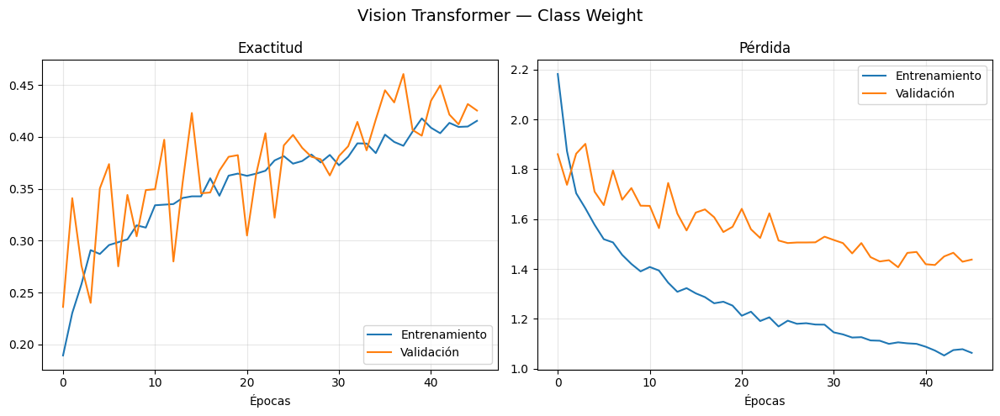

40/40 [==============================] - 18s 443ms/step

🏆 Accuracy final: 0.4605

--- Reporte de clasificación: Vision Transformer — Class Weight ---
              precision    recall  f1-score   support

           A       0.24      0.57      0.34        53
           C       0.64      0.85      0.73        59
           D       0.42      0.49      0.46       322
           G       0.29      0.53      0.37        57
           H       0.13      0.48      0.21        25
           M       0.77      0.93      0.84        46
           N       0.66      0.42      0.51       575
           O       0.31      0.18      0.23       142

    accuracy                           0.46      1279
   macro avg       0.43      0.56      0.46      1279
weighted avg       0.52      0.46      0.47      1279



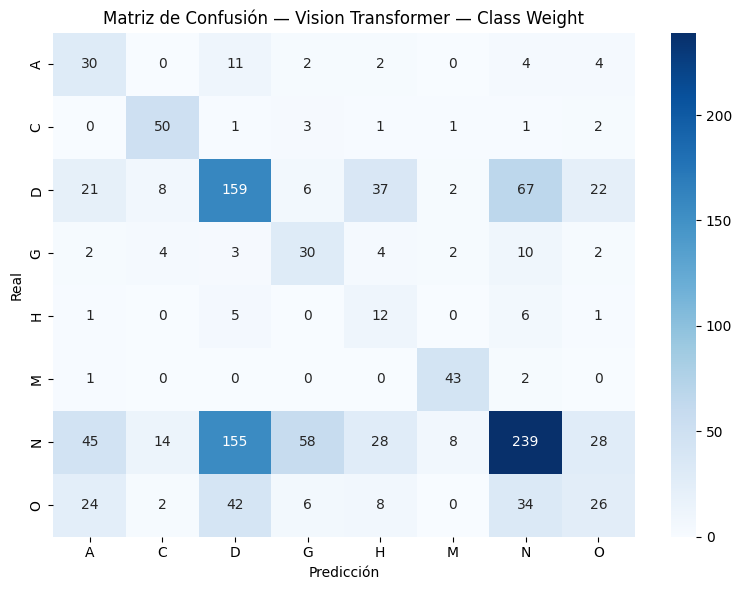

📂 Checkpoint existente cargado con 24 entradas
✅ Checkpoint actualizado — entradas: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw', 'acc_eff_sin', 'y_prob_eff_sin', 'acc_eff_cw', 'y_prob_eff_cw', 'acc_vit_sin', 'y_prob_vit_sin', 'acc_vit_cw', 'y_prob_vit_cw', 'acc_svm_sin', 'y_prob_svm_sin', 'acc_svm_cw', 'y_prob_svm_cw']


In [45]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  VISION TRANSFORMER — CLASS WEIGHT")
print(" "*70)

modelo_vit_cw = construir_vit(n_clases_vit)
modelo_vit_cw.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inicio = time.time()
historial_vit_cw = modelo_vit_cw.fit(
    generador_tren_vit,
    epochs=100,
    validation_data=generador_val_vit,
    callbacks=callbacks_vit,
    class_weight=pesos_dict_vit,
    verbose=1
)
print(f"⏱️  Tiempo: {time.time() - inicio:.1f}s")

graficar_curvas_vit(historial_vit_cw, "Vision Transformer — Class Weight")
acc_vit_cw, pred_vit_cw = generar_reporte_vit(
    modelo_vit_cw, generador_val_vit,
    "Vision Transformer — Class Weight"
)
guardar_checkpoint({
    'acc_vit_cw'    : acc_vit_cw,
    'y_prob_vit_cw' : pred_vit_cw
})

In [14]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — VISION TRANSFORMER")
print("═"*45)
print(f"  Sin balance  : {acc_vit_sin:.4f}")
print(f"  Class Weight : {acc_vit_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — VISION TRANSFORMER
═════════════════════════════════════════════
  Sin balance  : 0.5887
  Class Weight : 0.4605
═════════════════════════════════════════════


### EfficientNetB3

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# EFFICIENTNETB3
# ═══════════════════════════════════════════════════════════════════════════

IMG_SHAPE_EFF  = (300, 300)
BATCH_SIZE_EFF = 16


def crear_generadores_effnet():
    tren_datagen = ImageDataGenerator(
        preprocessing_function=effnet_preprocess,
        brightness_range=[0.6, 1.4],
        channel_shift_range=20.0,
        zoom_range=0.25,
        rotation_range=25,
        width_shift_range=0.1,
        height_shift_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        fill_mode='nearest'
    )
    val_datagen = ImageDataGenerator(
        preprocessing_function=effnet_preprocess
    )

    generador_tren = tren_datagen.flow_from_dataframe(
        dataframe=train_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE_EFF,
        batch_size=BATCH_SIZE_EFF,
        class_mode='categorical',
        shuffle=True,
        seed=SEED
    )

    generador_val = val_datagen.flow_from_dataframe(
        dataframe=test_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE_EFF,
        batch_size=BATCH_SIZE_EFF,
        class_mode='categorical',
        shuffle=False
    )

    return generador_tren, generador_val


def construir_effnet(n_clases, semilla=42):
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    base = EfficientNetB3(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_SHAPE_EFF[0], IMG_SHAPE_EFF[1], 3)
    )
    base.trainable = False

    modelo = models.Sequential([
        base,
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.4),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.4),
        layers.Dense(n_clases, activation='softmax')
    ])

    return modelo, base


def entrenar_effnet_una_vez(generador_tren, generador_val,
                             n_clases, semilla=42,
                             pesos_dict=None):
    print(f"\n   🏗️  Construyendo modelo (semilla {semilla})...")
    modelo, base = construir_effnet(n_clases, semilla)

    callbacks_fase = [
        EarlyStopping(monitor='val_loss', patience=8,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=4, min_lr=1e-7, verbose=0)
    ]

    print(f"   📌 Fase 1: entrenando capas de clasificación (base congelada)...")
    modelo.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    modelo.fit(
        generador_tren,
        epochs=5,
        validation_data=generador_val,
        class_weight=pesos_dict,
        verbose=0
    )

    print(f"   🔓 Fase 2: fine-tuning completo (lr=1e-5)...")
    base.trainable = True
    modelo.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    inicio = time.time()
    historial = modelo.fit(
        generador_tren,
        epochs=30,
        validation_data=generador_val,
        class_weight=pesos_dict,
        callbacks=callbacks_fase,
        verbose=0
    )
    duracion = time.time() - inicio

    _, acc = modelo.evaluate(generador_val, verbose=0)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'historial': historial,
        'tiempo'   : duracion
    }


def buscar_mejor_effnet(generador_tren, generador_val,
                         n_clases, condicion="SIN BALANCE",
                         pesos_dict=None, n_intentos=3):
    print(f"\n{'='*70}")
    print(f"  EFFICIENTNETB3 [{condicion}]")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        print(f"\n🔄 Intento {i+1}/{n_intentos}...")

        try:
            res = entrenar_effnet_una_vez(
                generador_tren, generador_val,
                n_clases, semilla=semilla_actual,
                pesos_dict=pesos_dict
            )
            print(f"   ✅ Accuracy: {res['accuracy']:.4f} | "
                  f"Tiempo: {res['tiempo']/60:.1f} min", end="")

            if res['accuracy'] > mejor_acc:
                mejor_acc       = res['accuracy']
                mejor_resultado = res
                print("  🌟 ¡Nuevo récord!")
            else:
                print("")
                del res

        except Exception as e:
            print(f"\n   ❌ Error en intento {i+1}: {e}")

    tiempo_total = (time.time() - inicio_global) / 60
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f} minutos")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Curvas de aprendizaje ──────────────────────────────────────────────
    historial = mejor_resultado['historial']
    epocas    = range(len(historial.history['accuracy']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f'EfficientNetB3 [{condicion}] — Mejor intento', fontsize=14)

    ax1.plot(epocas, historial.history['accuracy'],     label='Entrenamiento')
    ax1.plot(epocas, historial.history['val_accuracy'], label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, historial.history['loss'],     label='Entrenamiento')
    ax2.plot(epocas, historial.history['val_loss'], label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ── Reporte y matriz ───────────────────────────────────────────────────
    generador_val.reset()
    predicciones   = mejor_resultado['modelo'].predict(
        generador_val, verbose=1
    )
    y_pred         = np.argmax(predicciones, axis=1)
    y_real         = generador_val.classes
    nombres_clases = list(generador_val.class_indices.keys())

    print(f"\n--- Reporte de clasificación [{condicion}] ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — EfficientNetB3 [{condicion}]')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    # ── Retorna resultado y predicciones para checkpoint ───────────────────
    return mejor_resultado, predicciones


# ── Generadores y pesos ────────────────────────────────────────────────────
print("⏳ Creando generadores EfficientNetB3 (300×300)...")
generador_tren_eff, generador_val_eff = crear_generadores_effnet()
n_clases_eff = len(generador_tren_eff.class_indices)
print(f"✅ Clases: {n_clases_eff} → {generador_tren_eff.class_indices}")

pesos_eff = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(generador_tren_eff.classes),
    y=generador_tren_eff.classes
)
pesos_dict_eff = dict(enumerate(pesos_eff))
print(f"⚖️  Pesos: {pesos_dict_eff}")

⏳ Creando generadores EfficientNetB3 (300×300)...
Found 5113 validated image filenames belonging to 8 classes.
Found 1279 validated image filenames belonging to 8 classes.
✅ Clases: 8 → {'A': 0, 'C': 1, 'D': 2, 'G': 3, 'H': 4, 'M': 5, 'N': 6, 'O': 7}
⚖️  Pesos: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  EFFICIENTNETB3 — SIN BALANCE
                                                                      

  EFFICIENTNETB3 [SIN BALANCE]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
43941136/43941136 [==============================] - 0s 0us/step
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6271 | Tiempo: 86.8 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6263 | Tiempo: 87.0 min

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6435 | Tiempo: 87.0 min  🌟 ¡Nuevo récord!



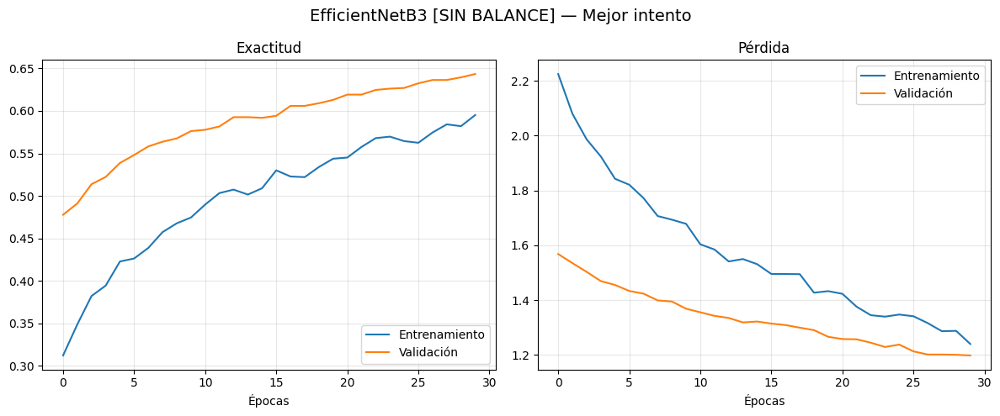

80/80 [==============================] - 11s 107ms/step

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.62      0.34      0.44        53
           C       0.82      0.76      0.79        59
           D       0.71      0.45      0.55       322
           G       0.54      0.37      0.44        57
           H       0.00      0.00      0.00        25
           M       0.86      0.83      0.84        46
           N       0.61      0.93      0.74       575
           O       0.62      0.15      0.24       142

    accuracy                           0.64      1279
   macro avg       0.60      0.48      0.50      1279
weighted avg       0.64      0.64      0.60      1279



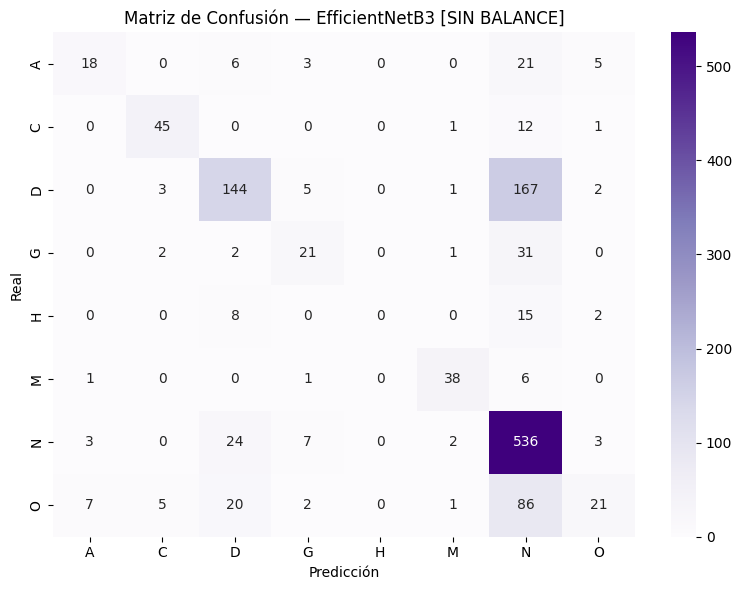

📂 Checkpoint existente cargado con 12 entradas
✅ Checkpoint actualizado — entradas: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw', 'acc_eff_sin', 'y_prob_eff_sin']


In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  EFFICIENTNETB3 — SIN BALANCE")
print(" "*70)

resultado_eff_sin, pred_eff_sin = buscar_mejor_effnet(
    generador_tren_eff, generador_val_eff,
    n_clases_eff,
    condicion="SIN BALANCE",
    pesos_dict=None,
    n_intentos=3
)
acc_eff_sin = resultado_eff_sin['accuracy']
guardar_checkpoint({
    'acc_eff_sin'    : acc_eff_sin,
    'y_prob_eff_sin' : pred_eff_sin
})


                                                                      
  EFFICIENTNETB3 — CLASS WEIGHT
                                                                      

  EFFICIENTNETB3 [CLASS WEIGHT]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.3448 | Tiempo: 87.0 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.3909 | Tiempo: 87.0 min  🌟 ¡Nuevo récord!

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.2619 | Tiempo: 27.2 min

✅ Búsqueda finalizada en 234.9 minutos
🏆 Mejor accuracy: 0.3909

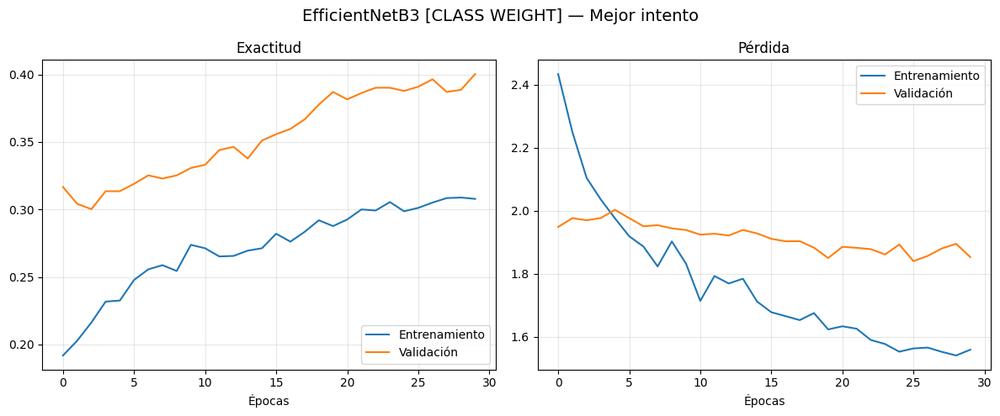

80/80 [==============================] - 11s 107ms/step

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.34      0.66      0.45        53
           C       0.44      0.88      0.59        59
           D       0.49      0.16      0.24       322
           G       0.21      0.60      0.31        57
           H       0.05      0.52      0.09        25
           M       0.51      0.96      0.67        46
           N       0.64      0.45      0.53       575
           O       0.26      0.08      0.13       142

    accuracy                           0.39      1279
   macro avg       0.37      0.54      0.38      1279
weighted avg       0.50      0.39      0.40      1279



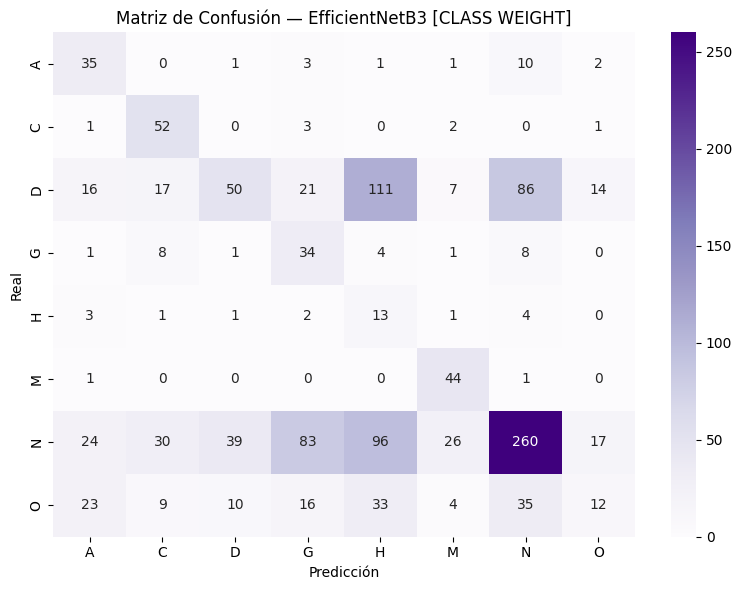

📂 Checkpoint existente cargado con 14 entradas
✅ Checkpoint actualizado — entradas: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw', 'acc_eff_sin', 'y_prob_eff_sin', 'acc_eff_cw', 'y_prob_eff_cw']


In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  EFFICIENTNETB3 — CLASS WEIGHT")
print(" "*70)

resultado_eff_cw, pred_eff_cw = buscar_mejor_effnet(
    generador_tren_eff, generador_val_eff,
    n_clases_eff,
    condicion="CLASS WEIGHT",
    pesos_dict=pesos_dict_eff,
    n_intentos=3
)
acc_eff_cw = resultado_eff_cw['accuracy']
guardar_checkpoint({
    'acc_eff_cw'    : acc_eff_cw,
    'y_prob_eff_cw' : pred_eff_cw
})


In [39]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — EFFICIENTNETB3")
print("═"*45)
print(f"  Sin balance  : {acc_eff_sin:.4f}")
print(f"  Class Weight : {acc_eff_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — EFFICIENTNETB3
═════════════════════════════════════════════
  Sin balance  : 0.6435
  Class Weight : 0.3909
═════════════════════════════════════════════


### Regresión Logística

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# REGRESIÓN LOGÍSTICA SOBRE PÍXELES DIRECTOS
# ═══════════════════════════════════════════════════════════════════════════
# A diferencia de la sección anterior donde la Regresión Logística operaba
# sobre 30 componentes reducidos, aquí opera directamente sobre los píxeles
# de la imagen completa (128×128×3 = 49,152 características por imagen).
# Esto permite comparar el impacto real de la reducción dimensional sobre
# el mismo modelo base.
#
# Se usa el mismo tamaño de imagen que en la sección de reducción (128×128)
# para que los resultados sean directamente comparables.
# ═══════════════════════════════════════════════════════════════════════════

#from sklearn.preprocessing import MinMaxScaler


# ── Carga de imágenes (independiente) ─────────────────────────────────────
print("⏳ Cargando imágenes de entrenamiento (128×128)...")
X_train_lr, y_train_lr = cargar_imagenes_como_array(train_df, FOLDER_PATH)

print("⏳ Cargando imágenes de prueba...")
X_test_lr, y_test_lr = cargar_imagenes_como_array(test_df, FOLDER_PATH)

print(f"\n✅ Shapes:")
print(f"   X_train : {X_train_lr.shape} → {X_train_lr.nbytes / 1e6:.1f} MB")
print(f"   X_test  : {X_test_lr.shape}  → {X_test_lr.nbytes / 1e6:.1f} MB")


# ── Entrenamiento ──────────────────────────────────────────────────────────
def entrenar_logreg_pixeles(X_train, y_train, X_test, y_test,
                             balanceado=False):
    """
    Entrena y evalúa Regresión Logística sobre píxeles directos.

    Parámetros:
    -----------
    X_train    : array de imágenes aplanadas de entrenamiento
    y_train    : etiquetas de entrenamiento
    X_test     : array de imágenes aplanadas de prueba
    y_test     : etiquetas de prueba
    balanceado : si True usa class_weight='balanced'

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo y predicciones
    """
    modelo = LogisticRegression(
        class_weight='balanced' if balanceado else None,
        max_iter=1000,
        random_state=SEED,
        solver='lbfgs',
        n_jobs=-1
    )

    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred = modelo.predict(X_test)
    acc    = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred
    }


def reportar_logreg_pixeles(resultado, y_test, etiqueta,
                             nombres_clases, color_mapa='Blues'):
    """
    Genera reporte de clasificación y matriz de confusión.
    """
    y_pred = resultado['y_pred']

    print(f"\n🏆 Accuracy: {resultado['accuracy']:.4f}")
    print(f"⏱️  Tiempo  : {resultado['tiempo']:.2f}s")

    print(f"\n--- Reporte de clasificación [{etiqueta}] ---")
    print(classification_report(y_test, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm   = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=nombres_clases
    )
    disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.title(f'Regresión Logística (Píxeles) [{etiqueta}]')
    plt.tight_layout()
    plt.show()


# ── Nombres de clases ──────────────────────────────────────────────────────
nombres_clases_lr = sorted(train_df['labels'].unique())



⏳ Cargando imágenes de entrenamiento (128×128)...
   ✅ 5113 imágenes cargadas como array             
⏳ Cargando imágenes de prueba...
   ✅ 1279 imágenes cargadas como array             

✅ Shapes:
   X_train : (5113, 49152) → 1005.3 MB
   X_test  : (1279, 49152)  → 251.5 MB



                                                                      
  REGRESIÓN LOGÍSTICA (PÍXELES) — SIN BALANCE
                                                                      

🏆 Accuracy: 0.4386
⏱️  Tiempo  : 910.50s

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.07      0.02      0.03        53
           C       0.43      0.51      0.47        59
           D       0.39      0.37      0.38       322
           G       0.29      0.21      0.24        57
           H       0.17      0.04      0.06        25
           M       0.63      0.41      0.50        46
           N       0.50      0.63      0.56       575
           O       0.17      0.09      0.12       142

    accuracy                           0.44      1279
   macro avg       0.33      0.29      0.30      1279
weighted avg       0.40      0.44      0.41      1279



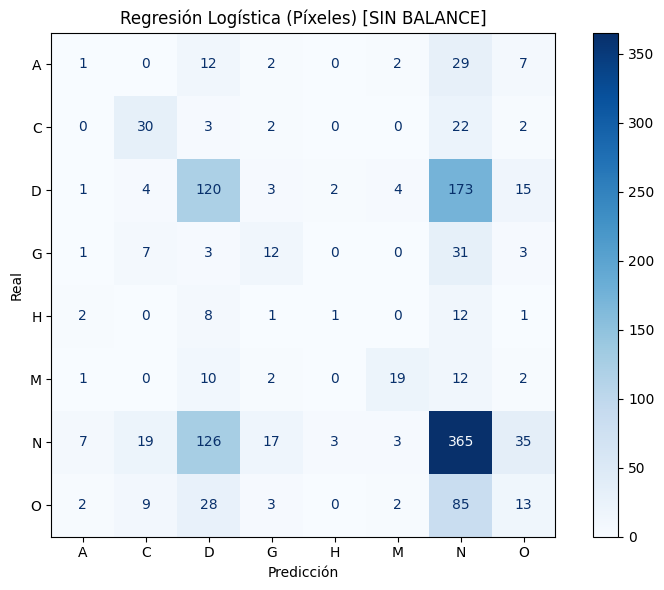

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  REGRESIÓN LOGÍSTICA (PÍXELES) — SIN BALANCE")
print(" "*70)

res_lr_sin = entrenar_logreg_pixeles(
    X_train_lr, y_train_lr,
    X_test_lr,  y_test_lr,
    balanceado=False
)
reportar_logreg_pixeles(res_lr_sin, y_test_lr,
                         "SIN BALANCE", nombres_clases_lr,
                         color_mapa='Blues')


                                                                      
  REGRESIÓN LOGÍSTICA (PÍXELES) — CLASS WEIGHT
                                                                      

🏆 Accuracy: 0.3847
⏱️  Tiempo  : 910.66s

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.07      0.06      0.06        53
           C       0.32      0.59      0.42        59
           D       0.37      0.38      0.38       322
           G       0.25      0.26      0.26        57
           H       0.05      0.04      0.05        25
           M       0.54      0.48      0.51        46
           N       0.52      0.48      0.50       575
           O       0.13      0.14      0.14       142

    accuracy                           0.38      1279
   macro avg       0.28      0.30      0.29      1279
weighted avg       0.39      0.38      0.39      1279



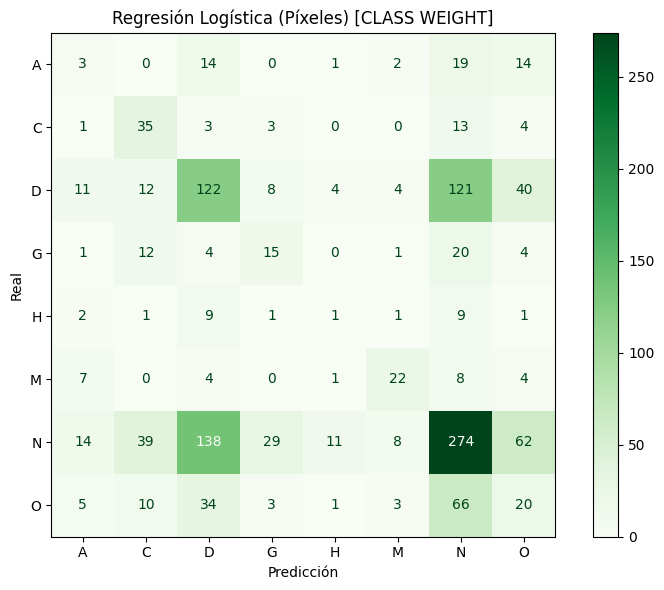

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  REGRESIÓN LOGÍSTICA (PÍXELES) — CLASS WEIGHT")
print(" "*70)

res_lr_cw = entrenar_logreg_pixeles(
    X_train_lr, y_train_lr,
    X_test_lr,  y_test_lr,
    balanceado=True
)
reportar_logreg_pixeles(res_lr_cw, y_test_lr,
                         "CLASS WEIGHT", nombres_clases_lr,
                         color_mapa='Greens')


In [ ]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*50)
print("  RESUMEN — REGRESIÓN LOGÍSTICA (PÍXELES)")
print("═"*50)
print(f"  Sin balance  : {res_lr_sin['accuracy']:.4f}")
print(f"  Class Weight : {res_lr_cw['accuracy']:.4f}")
print("═"*50)


══════════════════════════════════════════════════
  RESUMEN — REGRESIÓN LOGÍSTICA (PÍXELES)
══════════════════════════════════════════════════
  Sin balance  : 0.4386
  Class Weight : 0.3847
══════════════════════════════════════════════════


In [ ]:
# Después de Regresión Logística
guardar_checkpoint({
    'acc_lr_sin': res_lr_sin['accuracy'],
    'acc_lr_cw' : res_lr_cw['accuracy']
})


📂 Checkpoint existente cargado con 2 resultados
✅ Checkpoint actualizado — resultados guardados: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw']


### Soporte Vectorial (Kernel = rbf)

In [18]:
# ═══════════════════════════════════════════════════════════════════════════
# SVM-RBF SOBRE PÍXELES DIRECTOS
# ═══════════════════════════════════════════════════════════════════════════

# ── Carga de imágenes (independiente) ─────────────────────────────────────
print("⏳ Cargando imágenes de entrenamiento (128×128)...")
X_train_svm, y_train_svm = cargar_imagenes_como_array(train_df, FOLDER_PATH)

print("⏳ Cargando imágenes de prueba...")
X_test_svm, y_test_svm = cargar_imagenes_como_array(test_df, FOLDER_PATH)

print(f"\n✅ Shapes:")
print(f"   X_train : {X_train_svm.shape} → {X_train_svm.nbytes / 1e6:.1f} MB")
print(f"   X_test  : {X_test_svm.shape}  → {X_test_svm.nbytes / 1e6:.1f} MB")

nombres_clases_svm = sorted(train_df['labels'].unique())


def entrenar_svm_rbf(X_train, y_train, X_test, y_test,
                     balanceado=False):
    """
    Entrena y evalúa SVM-RBF sobre píxeles directos.

    Parámetros:
    -----------
    X_train    : array de imágenes aplanadas de entrenamiento
    y_train    : etiquetas de entrenamiento
    X_test     : array de imágenes aplanadas de prueba
    y_test     : etiquetas de prueba
    balanceado : si True usa class_weight='balanced'

    Retorna:
    --------
    diccionario con modelo, accuracy, tiempo, predicciones y probabilidades
    """
    modelo = SVC(
        kernel='rbf',
        C=10,
        gamma='scale',
        class_weight='balanced' if balanceado else None,
        cache_size=2000,
        probability=True,    # ← necesario para obtener probabilidades softmax
        random_state=SEED
    )

    print("⏳ Entrenando SVM-RBF (puede tardar varias horas)...")
    inicio   = time.time()
    modelo.fit(X_train, y_train)
    duracion = time.time() - inicio

    y_pred  = modelo.predict(X_test)
    y_prob  = modelo.predict_proba(X_test)  # ← probabilidades por clase
    acc     = accuracy_score(y_test, y_pred)

    return {
        'modelo'  : modelo,
        'accuracy': acc,
        'tiempo'  : duracion,
        'y_pred'  : y_pred,
        'y_prob'  : y_prob   # ← nuevo
    }


def reportar_svm_pixeles(resultado, y_test, etiqueta,
                          nombres_clases, color_mapa='Blues'):
    """
    Genera reporte de clasificación y matriz de confusión para SVM.
    """
    y_pred = resultado['y_pred']

    print(f"\n🏆 Accuracy: {resultado['accuracy']:.4f}")
    print(f"⏱️  Tiempo  : {resultado['tiempo']:.2f}s")

    print(f"\n--- Reporte de clasificación [{etiqueta}] ---")
    print(classification_report(y_test, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm   = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(
        confusion_matrix=cm,
        display_labels=nombres_clases
    )
    disp.plot(cmap=color_mapa, ax=ax, values_format='d', colorbar=True)
    ax.set_xlabel('Predicción')
    ax.set_ylabel('Real')
    plt.title(f'SVM-RBF (Píxeles) [{etiqueta}]')
    plt.tight_layout()
    plt.show()


⏳ Cargando imágenes de entrenamiento (128×128)...
   ✅ 5113 imágenes cargadas como array             
⏳ Cargando imágenes de prueba...
   ✅ 1279 imágenes cargadas como array             

✅ Shapes:
   X_train : (5113, 49152) → 1005.3 MB
   X_test  : (1279, 49152)  → 251.5 MB



                                                                      
  SVM-RBF (PÍXELES) — SIN BALANCE
                                                                      
⏳ Entrenando SVM-RBF (puede tardar varias horas)...

🏆 Accuracy: 0.4824
⏱️  Tiempo  : 5632.39s

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.50      0.08      0.14        59
           D       0.45      0.23      0.30       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.61      0.59      0.60        46
           N       0.48      0.89      0.63       575
           O       1.00      0.01      0.03       142

    accuracy                           0.48      1279
   macro avg       0.38      0.22      0.21      1279
weighted avg       0.49      0.48      0.39      1279



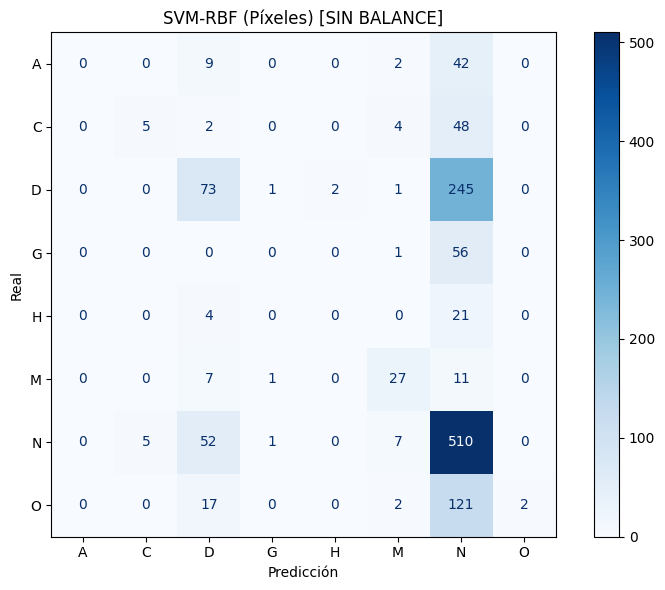

📂 Checkpoint existente cargado con 20 entradas
✅ Checkpoint actualizado — entradas: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw', 'acc_eff_sin', 'y_prob_eff_sin', 'acc_eff_cw', 'y_prob_eff_cw', 'acc_vit_sin', 'y_prob_vit_sin', 'acc_vit_cw', 'y_prob_vit_cw', 'acc_svm_sin', 'y_prob_svm_sin']


In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  SVM-RBF (PÍXELES) — SIN BALANCE")
print(" "*70)

res_svm_sin = entrenar_svm_rbf(
    X_train_svm, y_train_svm,
    X_test_svm,  y_test_svm,
    balanceado=False
)
reportar_svm_pixeles(res_svm_sin, y_test_svm,
                      "SIN BALANCE", nombres_clases_svm,
                      color_mapa='Blues')
guardar_checkpoint({
    'acc_svm_sin'    : res_svm_sin['accuracy'],
    'y_prob_svm_sin' : res_svm_sin['y_prob']
})



                                                                      
  SVM-RBF (PÍXELES) — CLASS WEIGHT
                                                                      
⏳ Entrenando SVM-RBF (puede tardar varias horas)...

🏆 Accuracy: 0.3268
⏱️  Tiempo  : 7258.34s

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.11      0.30      0.17        53
           C       0.25      0.54      0.34        59
           D       0.40      0.36      0.38       322
           G       0.21      0.51      0.29        57
           H       0.06      0.20      0.09        25
           M       0.62      0.67      0.65        46
           N       0.56      0.27      0.37       575
           O       0.19      0.22      0.20       142

    accuracy                           0.33      1279
   macro avg       0.30      0.39      0.31      1279
weighted avg       0.42      0.33      0.34      1279



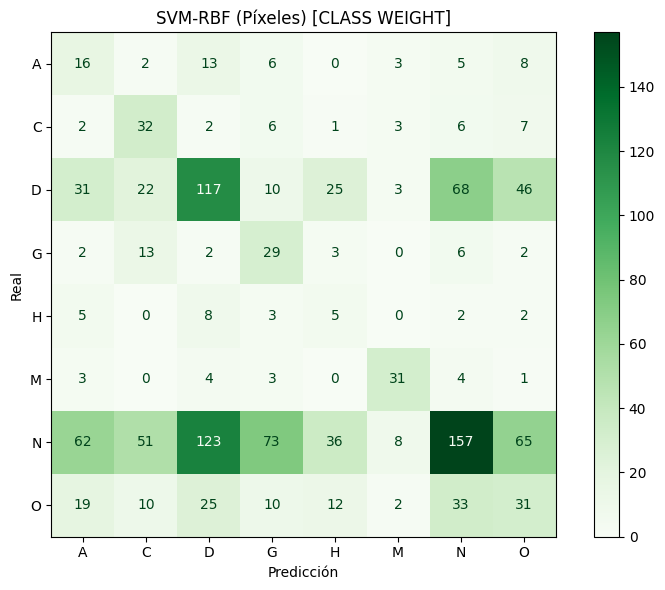

📂 Checkpoint existente cargado con 24 entradas
✅ Checkpoint actualizado — entradas: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw', 'acc_eff_sin', 'y_prob_eff_sin', 'acc_eff_cw', 'y_prob_eff_cw', 'acc_vit_sin', 'y_prob_vit_sin', 'acc_vit_cw', 'y_prob_vit_cw', 'acc_svm_sin', 'y_prob_svm_sin', 'acc_svm_cw', 'y_prob_svm_cw']


In [16]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  SVM-RBF (PÍXELES) — CLASS WEIGHT")
print(" "*70)

res_svm_cw = entrenar_svm_rbf(
    X_train_svm, y_train_svm,
    X_test_svm,  y_test_svm,
    balanceado=True
)
reportar_svm_pixeles(res_svm_cw, y_test_svm,
                      "CLASS WEIGHT", nombres_clases_svm,
                      color_mapa='Greens')
guardar_checkpoint({
    'acc_svm_cw'    : res_svm_cw['accuracy'],
    'y_prob_svm_cw' : res_svm_cw['y_prob']
})

In [21]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*50)
print("  RESUMEN — SVM-RBF (PÍXELES)")
print("═"*50)
print(f"  Sin balance  : {acc_svm_sin:.4f}")
print(f"  Class Weight : {acc_svm_cw:.4f}")
print("═"*50)


══════════════════════════════════════════════════
  RESUMEN — SVM-RBF (PÍXELES)
══════════════════════════════════════════════════
  Sin balance  : 0.4824
  Class Weight : 0.3268
══════════════════════════════════════════════════


## Modelos de exploración

### ResNet50

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# RESNET50 (TRANSFER LEARNING)
# ═══════════════════════════════════════════════════════════════════════════
# ResNet50 es una arquitectura con 50 capas que introduce conexiones
# residuales (skip connections) para resolver el problema del gradiente
# desvaneciente en redes profundas. Pre-entrenada en ImageNet con
# 25 millones de parámetros.
#
# Se usa la misma estrategia de dos fases que EfficientNetB3:
# Fase 1 — base congelada (5 épocas): estabiliza las capas de clasificación
# Fase 2 — fine-tuning completo (lr=1e-5): ajuste fino para imágenes oculares
#
# Se usa búsqueda Monte Carlo con 3 intentos — menos que EfficientNetB3
# porque ResNet50 es más estable en su inicialización.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════



def crear_generadores_resnet():
    """
    Crea generadores específicos para ResNet50 con preprocess_input
    propio de ResNet y data augmentation extendido.
    """
    tren_datagen = ImageDataGenerator(
        preprocessing_function=resnet_preprocess,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2],
        fill_mode='nearest'
    )
    val_datagen = ImageDataGenerator(
        preprocessing_function=resnet_preprocess
    )

    generador_tren = tren_datagen.flow_from_dataframe(
        dataframe=train_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True,
        seed=SEED
    )

    generador_val = val_datagen.flow_from_dataframe(
        dataframe=test_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    return generador_tren, generador_val


def construir_resnet(n_clases, semilla=42):
    """
    Construye ResNet50 con capas de clasificación.
    Retorna el modelo con la base congelada listo para la Fase 1.

    Parámetros:
    -----------
    n_clases : número de clases (8 enfermedades)
    semilla  : semilla para reproducibilidad

    Retorna:
    --------
    modelo Keras, base ResNet50
    """
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    base = ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_SHAPE[0], IMG_SHAPE[1], 3)
    )
    base.trainable = False  # Fase 1: base congelada

    modelo = models.Sequential([
        base,
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.Dropout(0.3),
        layers.Dense(n_clases, activation='softmax')
    ])

    return modelo, base


def entrenar_resnet_una_vez(generador_tren, generador_val,
                             n_clases, semilla=42, pesos_dict=None):
    """
    Entrena ResNet50 en dos fases con una semilla específica.

    Fase 1: base congelada, lr=1e-4, 5 épocas
    Fase 2: fine-tuning completo, lr=1e-5, hasta EarlyStopping

    Parámetros:
    -----------
    generador_tren : generador de entrenamiento
    generador_val  : generador de validación
    n_clases       : número de clases
    semilla        : semilla para Monte Carlo
    pesos_dict     : pesos de clase o None

    Retorna:
    --------
    diccionario con modelo, accuracy, historial y tiempo
    """
    print(f"\n   🏗️  Construyendo modelo (semilla {semilla})...")
    modelo, base = construir_resnet(n_clases, semilla)

    callbacks_fase = [
        EarlyStopping(monitor='val_loss', patience=8,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=4, min_lr=1e-7, verbose=0)
    ]

    # ── Fase 1: base congelada ─────────────────────────────────────────────
    print(f"   📌 Fase 1: entrenando capas de clasificación (base congelada)...")
    modelo.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    modelo.fit(
        generador_tren,
        epochs=5,
        validation_data=generador_val,
        class_weight=pesos_dict,
        verbose=0
    )

    # ── Fase 2: fine-tuning completo ───────────────────────────────────────
    print(f"   🔓 Fase 2: fine-tuning completo (lr=1e-5)...")
    base.trainable = True
    modelo.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    inicio = time.time()
    historial = modelo.fit(
        generador_tren,
        epochs=30,
        validation_data=generador_val,
        class_weight=pesos_dict,
        callbacks=callbacks_fase,
        verbose=0
    )
    duracion = time.time() - inicio

    _, acc = modelo.evaluate(generador_val, verbose=0)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'historial': historial,
        'tiempo'   : duracion
    }


def buscar_mejor_resnet(generador_tren, generador_val,
                         n_clases, condicion="SIN BALANCE",
                         pesos_dict=None, n_intentos=3):
    """
    Búsqueda Monte Carlo del mejor ResNet50 variando la semilla.
    """
    print(f"\n{'='*70}")
    print(f"  RESNET50 [{condicion}]")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        print(f"\n🔄 Intento {i+1}/{n_intentos}...")

        try:
            res = entrenar_resnet_una_vez(
                generador_tren, generador_val,
                n_clases, semilla=semilla_actual,
                pesos_dict=pesos_dict
            )
            print(f"   ✅ Accuracy: {res['accuracy']:.4f} | "
                  f"Tiempo: {res['tiempo']/60:.1f} min", end="")

            if res['accuracy'] > mejor_acc:
                mejor_acc       = res['accuracy']
                mejor_resultado = res
                print("  🌟 ¡Nuevo récord!")
            else:
                print("")
                del res

        except Exception as e:
            print(f"\n   ❌ Error en intento {i+1}: {e}")

    tiempo_total = (time.time() - inicio_global) / 60
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f} minutos")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Curvas de aprendizaje ──────────────────────────────────────────────
    historial = mejor_resultado['historial']
    epocas    = range(len(historial.history['accuracy']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f'ResNet50 [{condicion}] — Mejor intento', fontsize=14)

    ax1.plot(epocas, historial.history['accuracy'],     label='Entrenamiento')
    ax1.plot(epocas, historial.history['val_accuracy'], label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, historial.history['loss'],     label='Entrenamiento')
    ax2.plot(epocas, historial.history['val_loss'], label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ── Reporte y matriz ───────────────────────────────────────────────────
    generador_val.reset()
    predicciones   = mejor_resultado['modelo'].predict(
        generador_val, verbose=1
    )
    y_pred         = np.argmax(predicciones, axis=1)
    y_real         = generador_val.classes
    nombres_clases = list(generador_val.class_indices.keys())

    acc_final = accuracy_score(y_real, y_pred)
    print(f"\n--- Reporte de clasificación [{condicion}] ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — ResNet50 [{condicion}]')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    return mejor_resultado, acc_final


# ── Generadores y pesos ────────────────────────────────────────────────────
print("⏳ Creando generadores ResNet50...")
generador_tren_rn, generador_val_rn = crear_generadores_resnet()
n_clases_rn = len(generador_tren_rn.class_indices)
print(f"✅ Clases: {n_clases_rn} → {generador_tren_rn.class_indices}")

pesos_rn = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(generador_tren_rn.classes),
    y=generador_tren_rn.classes
)
pesos_dict_rn = dict(enumerate(pesos_rn))
print(f"⚖️  Pesos: {pesos_dict_rn}")


⏳ Creando generadores ResNet50...
Found 5113 validated image filenames belonging to 8 classes.
Found 1279 validated image filenames belonging to 8 classes.
✅ Clases: 8 → {'A': 0, 'C': 1, 'D': 2, 'G': 3, 'H': 4, 'M': 5, 'N': 6, 'O': 7}
⚖️  Pesos: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  RESNET50 — SIN BALANCE
                                                                      

  RESNET50 [SIN BALANCE]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
94765736/94765736 [==============================] - 0s 0us/step
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6083 | Tiempo: 37.9 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6153 | Tiempo: 38.4 min  🌟 ¡Nuevo récord!

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6130 | Tiempo: 36.1 min

✅ Búsqueda f

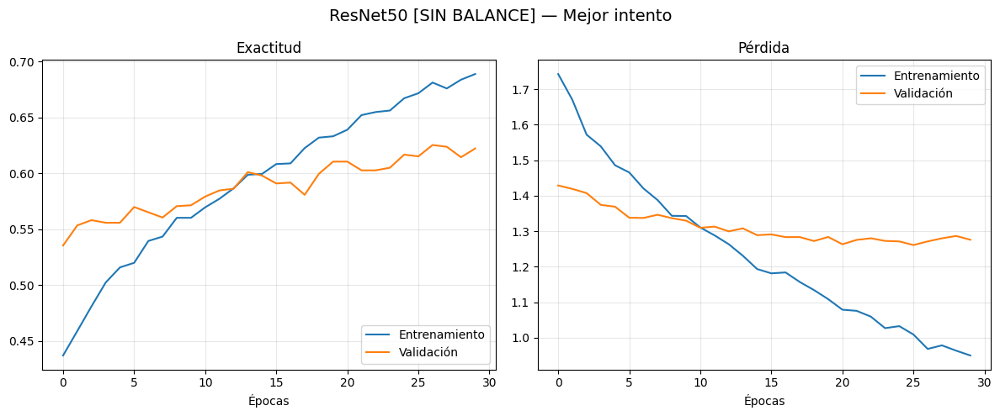

40/40 [==============================] - 5s 109ms/step

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.54      0.47      0.51        53
           C       0.74      0.81      0.77        59
           D       0.57      0.47      0.51       322
           G       0.51      0.49      0.50        57
           H       0.07      0.04      0.05        25
           M       0.80      0.85      0.82        46
           N       0.65      0.81      0.72       575
           O       0.49      0.21      0.30       142

    accuracy                           0.62      1279
   macro avg       0.54      0.52      0.52      1279
weighted avg       0.60      0.62      0.59      1279



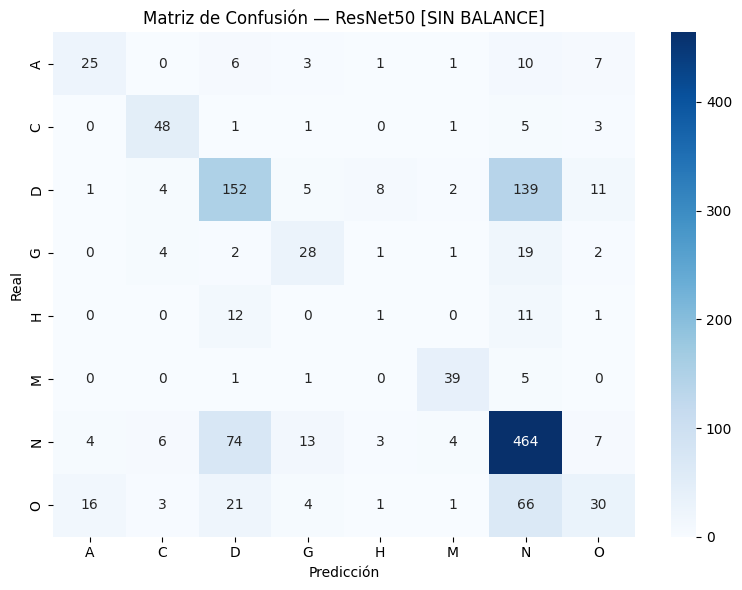

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  RESNET50 — SIN BALANCE")
print(" "*70)

resultado_rn_sin, acc_rn_sin = buscar_mejor_resnet(
    generador_tren_rn, generador_val_rn,
    n_clases_rn,
    condicion="SIN BALANCE",
    pesos_dict=None,
    n_intentos=3
)


                                                                      
  RESNET50 — CLASS WEIGHT
                                                                      

  RESNET50 [CLASS WEIGHT]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.4590 | Tiempo: 34.3 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.4668 | Tiempo: 39.3 min  🌟 ¡Nuevo récord!

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.4629 | Tiempo: 39.9 min

✅ Búsqueda finalizada en 133.1 minutos
🏆 Mejor accuracy: 0.4668


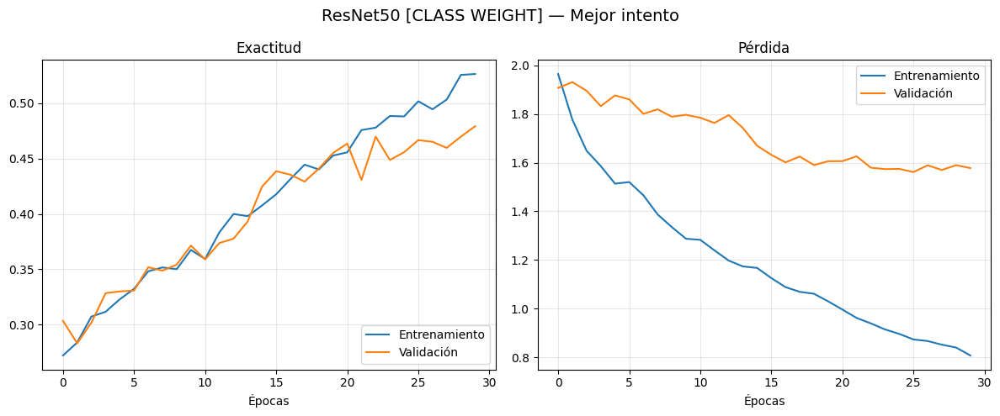

40/40 [==============================] - 5s 109ms/step

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.48      0.62      0.54        53
           C       0.59      0.90      0.71        59
           D       0.44      0.35      0.39       322
           G       0.30      0.61      0.40        57
           H       0.08      0.44      0.13        25
           M       0.75      0.89      0.81        46
           N       0.65      0.46      0.54       575
           O       0.31      0.32      0.31       142

    accuracy                           0.47      1279
   macro avg       0.45      0.57      0.48      1279
weighted avg       0.53      0.47      0.48      1279



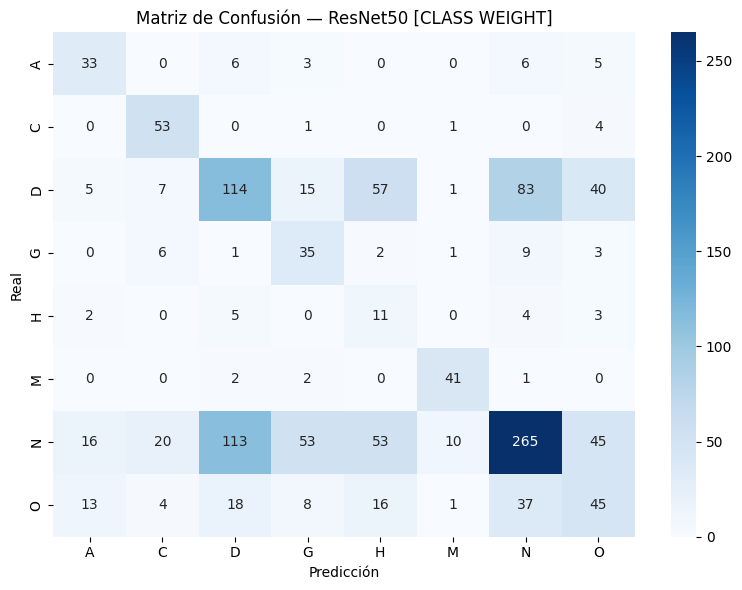

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  RESNET50 — CLASS WEIGHT")
print(" "*70)

resultado_rn_cw, acc_rn_cw = buscar_mejor_resnet(
    generador_tren_rn, generador_val_rn,
    n_clases_rn,
    condicion="CLASS WEIGHT",
    pesos_dict=pesos_dict_rn,
    n_intentos=3
)

In [ ]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — RESNET50")
print("═"*45)
print(f"  Sin balance  : {acc_rn_sin:.4f}")
print(f"  Class Weight : {acc_rn_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — RESNET50
═════════════════════════════════════════════
  Sin balance  : 0.6153
  Class Weight : 0.4668
═════════════════════════════════════════════


In [ ]:
# Después de ResNet50
guardar_checkpoint({
    'acc_rn_sin': acc_rn_sin,
    'acc_rn_cw' : acc_rn_cw
})

📂 Checkpoint existente cargado con 6 resultados
✅ Checkpoint actualizado — resultados guardados: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw']


### Perceptrón Multicapa (Tensorflow)

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# PERCEPTRÓN MULTICAPA (MLP — TENSORFLOW)
# ═══════════════════════════════════════════════════════════════════════════
# A diferencia del MLP de la sección anterior que operaba sobre 30
# componentes reducidos, aquí opera directamente sobre los píxeles
# de la imagen completa (128×128×3 = 49,152 características por imagen).
#
# Se usa el mismo tamaño de imagen que en la sección de reducción (128×128)
# para que los resultados sean directamente comparables.
#
# Arquitectura: 4 capas densas (512→256→128→64) con BatchNormalization,
# Dropout progresivo y regularización L2 consistente con los demás modelos.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════

from tensorflow.keras.utils import to_categorical

# ── Carga de imágenes (independiente) ─────────────────────────────────────
print("⏳ Cargando imágenes de entrenamiento (128×128)...")
X_train_mlp, y_train_mlp_raw = cargar_imagenes_como_array(train_df, FOLDER_PATH)

print("⏳ Cargando imágenes de prueba...")
X_test_mlp, y_test_mlp_raw = cargar_imagenes_como_array(test_df, FOLDER_PATH)

print(f"\n✅ Shapes:")
print(f"   X_train : {X_train_mlp.shape} → {X_train_mlp.nbytes / 1e6:.1f} MB")
print(f"   X_test  : {X_test_mlp.shape}  → {X_test_mlp.nbytes / 1e6:.1f} MB")

# Codificar etiquetas como one-hot
nombres_clases_mlp = sorted(train_df['labels'].unique())
clase_a_indice     = {c: i for i, c in enumerate(nombres_clases_mlp)}
y_train_mlp = to_categorical(
    [clase_a_indice[c] for c in y_train_mlp_raw], num_classes=len(nombres_clases_mlp)
)
y_test_mlp = to_categorical(
    [clase_a_indice[c] for c in y_test_mlp_raw], num_classes=len(nombres_clases_mlp)
)

print(f"\n✅ Etiquetas codificadas:")
print(f"   y_train : {y_train_mlp.shape}")
print(f"   y_test  : {y_test_mlp.shape}")
print(f"   Clases  : {nombres_clases_mlp}")


def construir_mlp_pixeles(n_features, n_clases):
    """
    Construye MLP para clasificación sobre píxeles directos.
    Arquitectura: 4 capas densas con BatchNormalization y Dropout progresivo.

    Parámetros:
    -----------
    n_features : número de features de entrada (49,152 para 128×128×3)
    n_clases   : número de clases (8 enfermedades)

    Retorna:
    --------
    modelo Keras sin compilar
    """
    modelo = models.Sequential([
        layers.InputLayer(input_shape=(n_features,)),

        layers.Dense(512, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.4),

        layers.Dense(256, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.3),

        layers.Dense(128, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.2),

        layers.Dense(64, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),

        layers.Dense(n_clases, activation='softmax')
    ])

    return modelo


def graficar_curvas_mlp(historial, titulo):
    """
    Grafica las curvas de exactitud y pérdida de entrenamiento y validación.
    """
    epocas = range(len(historial.history['accuracy']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(titulo, fontsize=14)

    ax1.plot(epocas, historial.history['accuracy'],     label='Entrenamiento')
    ax1.plot(epocas, historial.history['val_accuracy'], label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, historial.history['loss'],     label='Entrenamiento')
    ax2.plot(epocas, historial.history['val_loss'], label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


def generar_reporte_mlp_pixeles(modelo, X_test, y_test_onehot,
                                 nombres_clases, titulo):
    """
    Genera reporte de clasificación y matriz de confusión para MLP.
    """
    predicciones   = modelo.predict(X_test, verbose=0)
    y_pred         = np.argmax(predicciones, axis=1)
    y_real         = np.argmax(y_test_onehot, axis=1)

    acc = accuracy_score(y_real, y_pred)
    print(f"\n🏆 Accuracy final: {acc:.4f}")

    print(f"\n--- Reporte de clasificación [{titulo}] ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — MLP (Píxeles) [{titulo}]')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    return acc


# ── Pesos de clases ────────────────────────────────────────────────────────
y_train_indices = np.argmax(y_train_mlp, axis=1)
pesos_mlp = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_indices),
    y=y_train_indices
)
pesos_dict_mlp = dict(enumerate(pesos_mlp))
print(f"⚖️  Pesos calculados: {pesos_dict_mlp}")

# ── Callbacks compartidos ──────────────────────────────────────────────────
callbacks_mlp = [
    EarlyStopping(monitor='val_loss', patience=8,
                  restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                      patience=4, min_lr=1e-7, verbose=1)
]

n_features = X_train_mlp.shape[1]
n_clases   = len(nombres_clases_mlp)



⏳ Cargando imágenes de entrenamiento (128×128)...
   ✅ 5113 imágenes cargadas como array             
⏳ Cargando imágenes de prueba...
   ✅ 1279 imágenes cargadas como array             

✅ Shapes:
   X_train : (5113, 49152) → 1005.3 MB
   X_test  : (1279, 49152)  → 251.5 MB

✅ Etiquetas codificadas:
   y_train : (5113, 8)
   y_test  : (1279, 8)
   Clases  : ['A', 'C', 'D', 'G', 'H', 'M', 'N', 'O']
⚖️  Pesos calculados: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  MLP (PÍXELES) — SIN BALANCE
                                                                      
Epoch 1/50
136/136 [==============================] - 7s 19ms/step - loss: 2.7228 - accuracy: 0.1574 - val_loss: 2.7155 - val_accuracy: 0.1356 - lr: 1.0000e-04
Epoch 2/50
136/136 [==============================] - 2s 15ms/step - loss: 2.5107 - accuracy: 0.2046 - val_loss: 2.3087 - val_accuracy: 0.2725 - lr: 1.0000e-04
Epoch 3/50
136/136 [==============================] - 2s 15ms/step - loss: 2.3576 - accuracy: 0.2322 - val_loss: 2.2792 - val_accuracy: 0.2920 - lr: 1.0000e-04
Epoch 4/50
136/136 [==============================] - 2s 15ms/step - loss: 2.2723 - accuracy: 0.2639 - val_loss: 2.0383 - val_accuracy: 0.3611 - lr: 1.0000e-04
Epoch 5/50
136/136 [==============================] - 2s 15ms/step - loss: 2.1817 - accuracy: 0.2816 - val_loss: 1.8925 - val_accuracy: 0.3872 - lr: 1.0000e-04
Epoch 6/50
136/136 [=======

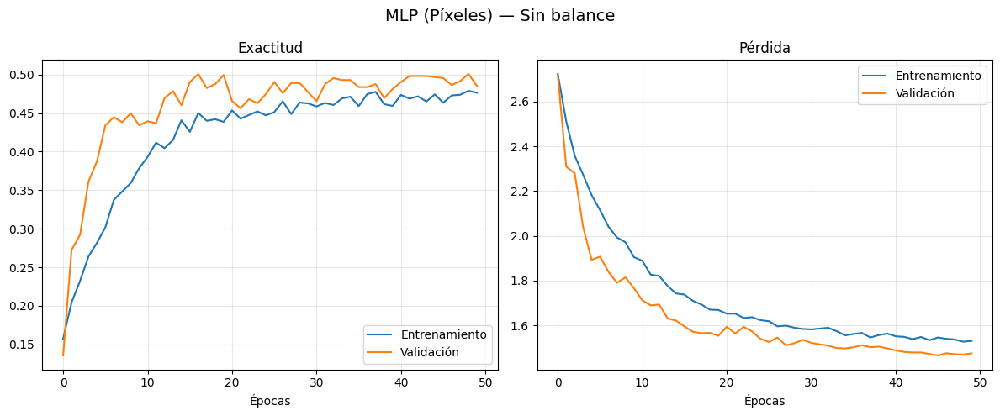


🏆 Accuracy final: 0.4808

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        53
           C       0.56      0.08      0.15        59
           D       0.41      0.20      0.27       322
           G       0.00      0.00      0.00        57
           H       0.00      0.00      0.00        25
           M       0.69      0.52      0.59        46
           N       0.48      0.91      0.63       575
           O       0.00      0.00      0.00       142

    accuracy                           0.48      1279
   macro avg       0.27      0.21      0.20      1279
weighted avg       0.37      0.48      0.38      1279



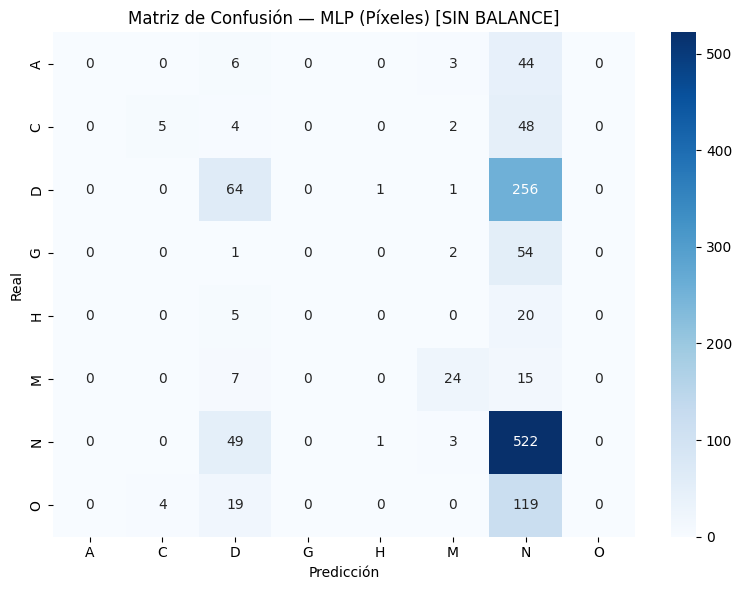

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  MLP (PÍXELES) — SIN BALANCE")
print(" "*70)

modelo_mlp_sin = construir_mlp_pixeles(n_features, n_clases)
modelo_mlp_sin.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inicio = time.time()
historial_mlp_sin = modelo_mlp_sin.fit(
    X_train_mlp, y_train_mlp,
    epochs=50,
    batch_size=32,
    validation_split=0.15,
    callbacks=callbacks_mlp,
    verbose=1
)
print(f"⏱️  Tiempo: {time.time() - inicio:.1f}s")

graficar_curvas_mlp(historial_mlp_sin, "MLP (Píxeles) — Sin balance")
acc_mlp_sin = generar_reporte_mlp_pixeles(
    modelo_mlp_sin, X_test_mlp, y_test_mlp,
    nombres_clases_mlp, "SIN BALANCE"
)




                                                                      
  MLP (PÍXELES) — CLASS WEIGHT
                                                                      
Epoch 1/50
136/136 [==============================] - 7s 19ms/step - loss: 2.7094 - accuracy: 0.1443 - val_loss: 3.0537 - val_accuracy: 0.1056 - lr: 1.0000e-04
Epoch 2/50
136/136 [==============================] - 2s 15ms/step - loss: 2.5263 - accuracy: 0.1486 - val_loss: 2.6253 - val_accuracy: 0.1252 - lr: 1.0000e-04
Epoch 3/50
136/136 [==============================] - 2s 16ms/step - loss: 2.3721 - accuracy: 0.1475 - val_loss: 2.5201 - val_accuracy: 0.1265 - lr: 1.0000e-04
Epoch 4/50
136/136 [==============================] - 2s 15ms/step - loss: 2.3307 - accuracy: 0.1429 - val_loss: 2.4722 - val_accuracy: 0.1278 - lr: 1.0000e-04
Epoch 5/50
136/136 [==============================] - 2s 14ms/step - loss: 2.2611 - accuracy: 0.1588 - val_loss: 2.5930 - val_accuracy: 0.1056 - lr: 1.0000e-04
Epoch 6/50
136/136 [======

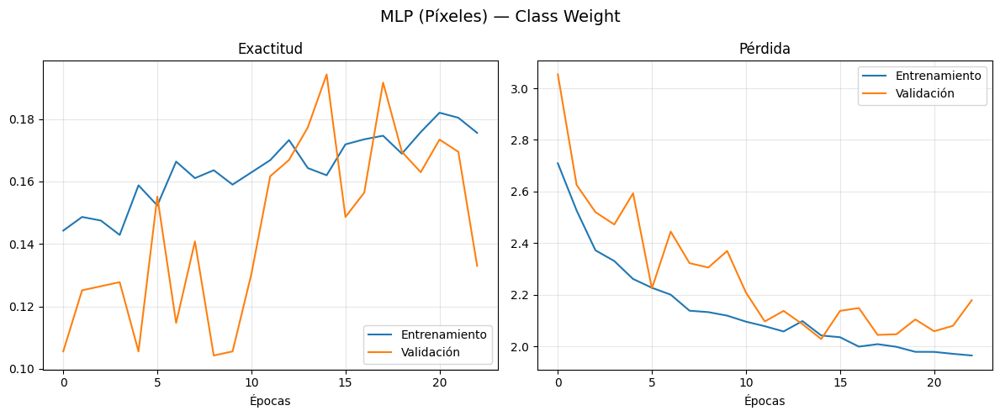


🏆 Accuracy final: 0.1970

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.09      0.17      0.12        53
           C       0.21      0.31      0.25        59
           D       0.34      0.09      0.14       322
           G       0.09      0.56      0.15        57
           H       0.04      0.44      0.07        25
           M       0.34      0.78      0.48        46
           N       0.44      0.20      0.28       575
           O       0.25      0.01      0.01       142

    accuracy                           0.20      1279
   macro avg       0.23      0.32      0.19      1279
weighted avg       0.34      0.20      0.20      1279



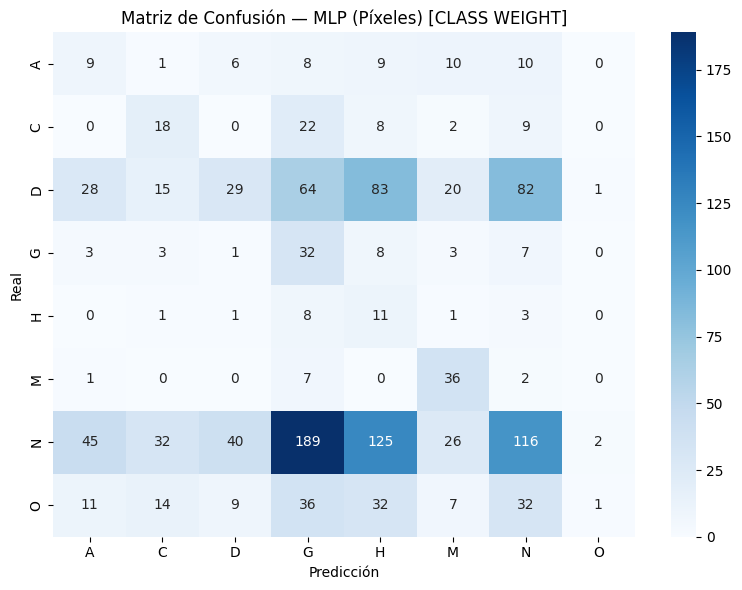

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  MLP (PÍXELES) — CLASS WEIGHT")
print(" "*70)

modelo_mlp_cw = construir_mlp_pixeles(n_features, n_clases)
modelo_mlp_cw.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

inicio = time.time()
historial_mlp_cw = modelo_mlp_cw.fit(
    X_train_mlp, y_train_mlp,
    epochs=50,
    batch_size=32,
    validation_split=0.15,
    callbacks=callbacks_mlp,
    class_weight=pesos_dict_mlp,
    verbose=1
)
print(f"⏱️  Tiempo: {time.time() - inicio:.1f}s")

graficar_curvas_mlp(historial_mlp_cw, "MLP (Píxeles) — Class Weight")
acc_mlp_cw = generar_reporte_mlp_pixeles(
    modelo_mlp_cw, X_test_mlp, y_test_mlp,
    nombres_clases_mlp, "CLASS WEIGHT"
)


In [ ]:
# ── Tabla resumen ─────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — MLP (PÍXELES)")
print("═"*45)
print(f"  Sin balance  : {acc_mlp_sin:.4f}")
print(f"  Class Weight : {acc_mlp_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — MLP (PÍXELES)
═════════════════════════════════════════════
  Sin balance  : 0.4808
  Class Weight : 0.1970
═════════════════════════════════════════════


In [ ]:
# Después de MLP TensorFlow
guardar_checkpoint({
    'acc_mlp_sin': acc_mlp_sin,
    'acc_mlp_cw' : acc_mlp_cw
})

📂 Checkpoint existente cargado con 4 resultados
✅ Checkpoint actualizado — resultados guardados: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw']


### DenseNet121

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# DENSENET121 (TRANSFER LEARNING)
# ═══════════════════════════════════════════════════════════════════════════
# DenseNet121 es la arquitectura más utilizada en la literatura de
# clasificación de enfermedades oculares y retinianas. A diferencia de
# ResNet que suma las conexiones residuales, DenseNet concatena las
# salidas de todas las capas anteriores — esto permite reutilizar features
# de bajo nivel (bordes, texturas) junto con features de alto nivel
# (patrones de enfermedad) en cada capa.
#
# Esta característica la hace especialmente eficiente con datasets médicos
# pequeños como ODIR-5K (~6,392 imágenes), donde cada feature aprendida
# es aprovechada al máximo por todas las capas siguientes.
#
# Se usa la misma estrategia de dos fases que EfficientNetB3 y ResNet50:
# Fase 1 — base congelada (5 épocas): estabiliza las capas de clasificación
# Fase 2 — fine-tuning completo (lr=1e-5): ajuste fino para imágenes oculares
#
# Se usa búsqueda Monte Carlo con 3 intentos.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════



def crear_generadores_densenet():
    """
    Crea generadores específicos para DenseNet121 con preprocess_input
    propio de DenseNet y data augmentation extendido.
    """
    tren_datagen = ImageDataGenerator(
        preprocessing_function=densenet_preprocess,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2],
        fill_mode='nearest'
    )
    val_datagen = ImageDataGenerator(
        preprocessing_function=densenet_preprocess
    )

    generador_tren = tren_datagen.flow_from_dataframe(
        dataframe=train_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True,
        seed=SEED
    )

    generador_val = val_datagen.flow_from_dataframe(
        dataframe=test_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE,
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )

    return generador_tren, generador_val


def construir_densenet(n_clases, semilla=42):
    """
    Construye DenseNet121 con capas de clasificación.
    Retorna el modelo con la base congelada listo para la Fase 1.

    Parámetros:
    -----------
    n_clases : número de clases (8 enfermedades)
    semilla  : semilla para reproducibilidad

    Retorna:
    --------
    modelo Keras, base DenseNet121
    """
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    base = DenseNet121(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_SHAPE[0], IMG_SHAPE[1], 3)
    )
    base.trainable = False  # Fase 1: base congelada

    modelo = models.Sequential([
        base,
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.Dropout(0.3),
        layers.Dense(n_clases, activation='softmax')
    ])

    return modelo, base


def entrenar_densenet_una_vez(generador_tren, generador_val,
                               n_clases, semilla=42,
                               pesos_dict=None):
    """
    Entrena DenseNet121 en dos fases con una semilla específica.

    Fase 1: base congelada, lr=1e-4, 5 épocas
    Fase 2: fine-tuning completo, lr=1e-5, hasta EarlyStopping

    Parámetros:
    -----------
    generador_tren : generador de entrenamiento
    generador_val  : generador de validación
    n_clases       : número de clases
    semilla        : semilla para Monte Carlo
    pesos_dict     : pesos de clase o None

    Retorna:
    --------
    diccionario con modelo, accuracy, historial y tiempo
    """
    print(f"\n   🏗️  Construyendo modelo (semilla {semilla})...")
    modelo, base = construir_densenet(n_clases, semilla)

    callbacks_fase = [
        EarlyStopping(monitor='val_loss', patience=8,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=4, min_lr=1e-7, verbose=0)
    ]

    # ── Fase 1: base congelada ─────────────────────────────────────────────
    print(f"   📌 Fase 1: entrenando capas de clasificación (base congelada)...")
    modelo.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    modelo.fit(
        generador_tren,
        epochs=5,
        validation_data=generador_val,
        class_weight=pesos_dict,
        verbose=0
    )

    # ── Fase 2: fine-tuning completo ───────────────────────────────────────
    print(f"   🔓 Fase 2: fine-tuning completo (lr=1e-5)...")
    base.trainable = True
    modelo.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    inicio = time.time()
    historial = modelo.fit(
        generador_tren,
        epochs=30,
        validation_data=generador_val,
        class_weight=pesos_dict,
        callbacks=callbacks_fase,
        verbose=0
    )
    duracion = time.time() - inicio

    _, acc = modelo.evaluate(generador_val, verbose=0)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'historial': historial,
        'tiempo'   : duracion
    }


def buscar_mejor_densenet(generador_tren, generador_val,
                           n_clases, condicion="SIN BALANCE",
                           pesos_dict=None, n_intentos=3):
    """
    Búsqueda Monte Carlo del mejor DenseNet121 variando la semilla.
    """
    print(f"\n{'='*70}")
    print(f"  DENSENET121 [{condicion}]")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        print(f"\n🔄 Intento {i+1}/{n_intentos}...")

        try:
            res = entrenar_densenet_una_vez(
                generador_tren, generador_val,
                n_clases, semilla=semilla_actual,
                pesos_dict=pesos_dict
            )
            print(f"   ✅ Accuracy: {res['accuracy']:.4f} | "
                  f"Tiempo: {res['tiempo']/60:.1f} min", end="")

            if res['accuracy'] > mejor_acc:
                mejor_acc       = res['accuracy']
                mejor_resultado = res
                print("  🌟 ¡Nuevo récord!")
            else:
                print("")
                del res

        except Exception as e:
            print(f"\n   ❌ Error en intento {i+1}: {e}")

    tiempo_total = (time.time() - inicio_global) / 60
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f} minutos")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Curvas de aprendizaje ──────────────────────────────────────────────
    historial = mejor_resultado['historial']
    epocas    = range(len(historial.history['accuracy']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f'DenseNet121 [{condicion}] — Mejor intento', fontsize=14)

    ax1.plot(epocas, historial.history['accuracy'],     label='Entrenamiento')
    ax1.plot(epocas, historial.history['val_accuracy'], label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, historial.history['loss'],     label='Entrenamiento')
    ax2.plot(epocas, historial.history['val_loss'], label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ── Reporte y matriz ───────────────────────────────────────────────────
    generador_val.reset()
    predicciones   = mejor_resultado['modelo'].predict(
        generador_val, verbose=1
    )
    y_pred         = np.argmax(predicciones, axis=1)
    y_real         = generador_val.classes
    nombres_clases = list(generador_val.class_indices.keys())

    acc_final = accuracy_score(y_real, y_pred)
    print(f"\n--- Reporte de clasificación [{condicion}] ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — DenseNet121 [{condicion}]')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    return mejor_resultado, acc_final


# ── Generadores y pesos ────────────────────────────────────────────────────
print("⏳ Creando generadores DenseNet121...")
generador_tren_dn, generador_val_dn = crear_generadores_densenet()
n_clases_dn = len(generador_tren_dn.class_indices)
print(f"✅ Clases: {n_clases_dn} → {generador_tren_dn.class_indices}")

pesos_dn = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(generador_tren_dn.classes),
    y=generador_tren_dn.classes
)
pesos_dict_dn = dict(enumerate(pesos_dn))
print(f"⚖️  Pesos: {pesos_dict_dn}")



⏳ Creando generadores DenseNet121...
Found 5113 validated image filenames belonging to 8 classes.
Found 1279 validated image filenames belonging to 8 classes.
✅ Clases: 8 → {'A': 0, 'C': 1, 'D': 2, 'G': 3, 'H': 4, 'M': 5, 'N': 6, 'O': 7}
⚖️  Pesos: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  DENSENET121 — SIN BALANCE
                                                                      

  DENSENET121 [SIN BALANCE]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
29084464/29084464 [==============================] - 0s 0us/step
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6091 | Tiempo: 39.6 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6255 | Tiempo: 39.4 min  🌟 ¡Nuevo récord!

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6130 | Tiempo: 39.2 min

✅ Búsq

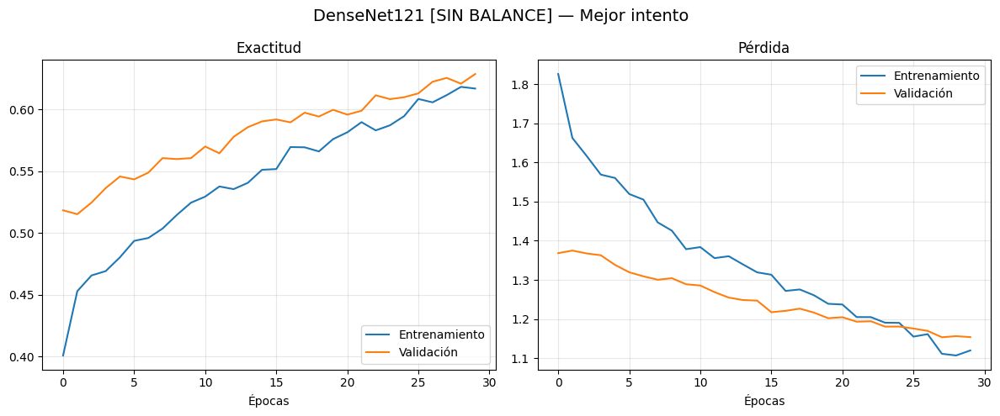

40/40 [==============================] - 6s 99ms/step

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.64      0.34      0.44        53
           C       0.69      0.86      0.77        59
           D       0.58      0.54      0.56       322
           G       0.40      0.37      0.38        57
           H       0.00      0.00      0.00        25
           M       0.84      0.89      0.86        46
           N       0.65      0.83      0.73       575
           O       0.47      0.12      0.19       142

    accuracy                           0.63      1279
   macro avg       0.53      0.49      0.49      1279
weighted avg       0.60      0.63      0.59      1279



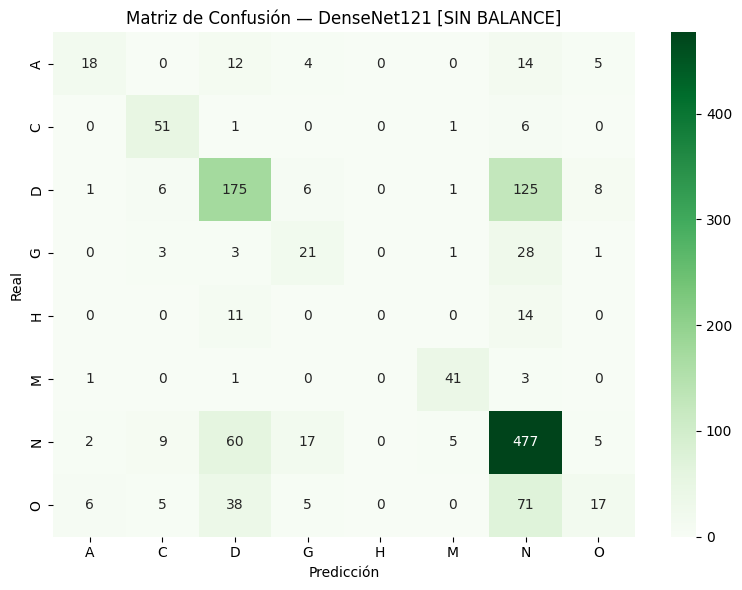

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  DENSENET121 — SIN BALANCE")
print(" "*70)

resultado_dn_sin, acc_dn_sin = buscar_mejor_densenet(
    generador_tren_dn, generador_val_dn,
    n_clases_dn,
    condicion="SIN BALANCE",
    pesos_dict=None,
    n_intentos=3
)



                                                                      
  DENSENET121 — CLASS WEIGHT
                                                                      

  DENSENET121 [CLASS WEIGHT]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.4707 | Tiempo: 39.5 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.3245 | Tiempo: 12.8 min

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.3315 | Tiempo: 12.6 min

✅ Búsqueda finalizada en 84.4 minutos
🏆 Mejor accuracy: 0.4707


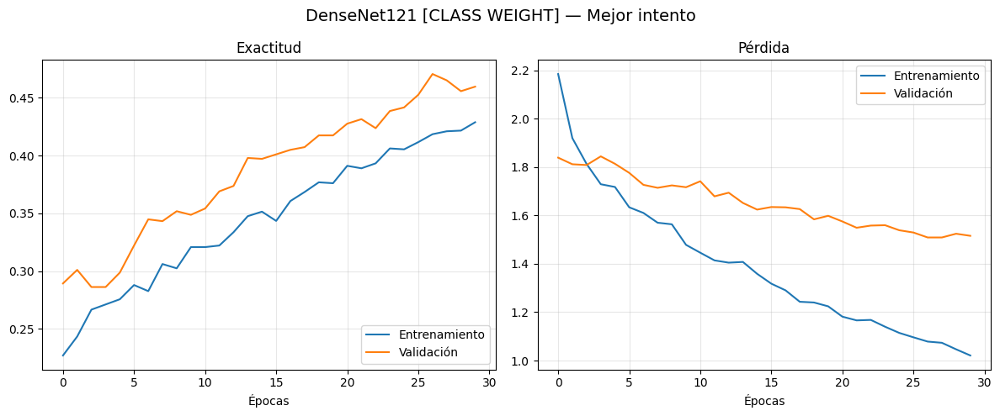

40/40 [==============================] - 6s 99ms/step

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.34      0.60      0.44        53
           C       0.59      0.92      0.72        59
           D       0.49      0.27      0.34       322
           G       0.28      0.67      0.40        57
           H       0.07      0.44      0.13        25
           M       0.69      0.91      0.79        46
           N       0.66      0.53      0.59       575
           O       0.31      0.25      0.27       142

    accuracy                           0.47      1279
   macro avg       0.43      0.57      0.46      1279
weighted avg       0.53      0.47      0.48      1279



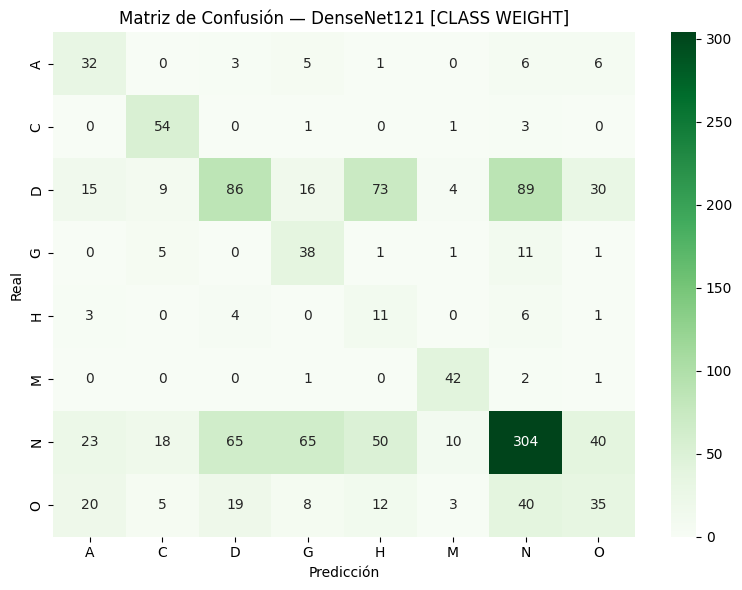

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  DENSENET121 — CLASS WEIGHT")
print(" "*70)

resultado_dn_cw, acc_dn_cw = buscar_mejor_densenet(
    generador_tren_dn, generador_val_dn,
    n_clases_dn,
    condicion="CLASS WEIGHT",
    pesos_dict=pesos_dict_dn,
    n_intentos=3
)


In [ ]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — DENSENET121")
print("═"*45)
print(f"  Sin balance  : {acc_dn_sin:.4f}")
print(f"  Class Weight : {acc_dn_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — DENSENET121
═════════════════════════════════════════════
  Sin balance  : 0.6255
  Class Weight : 0.4707
═════════════════════════════════════════════


In [ ]:
# Después de DenseNet121
guardar_checkpoint({
    'acc_dn_sin': acc_dn_sin,
    'acc_dn_cw' : acc_dn_cw
})

📂 Checkpoint existente cargado con 8 resultados
✅ Checkpoint actualizado — resultados guardados: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw']


###  InceptionV3

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
# INCEPTIONV3 (TRANSFER LEARNING)
# ═══════════════════════════════════════════════════════════════════════════
# InceptionV3 aplica convoluciones en paralelo de diferentes tamaños
# (1×1, 3×3, 5×5) en cada bloque, capturando features visuales a múltiples
# escalas simultáneamente. Esta característica es especialmente útil para
# imágenes oculares donde las lesiones pueden aparecer en distintos tamaños
# — desde microaneurismas pequeños hasta áreas grandes de retinopatía.
#
# Su tamaño nativo de entrada es 299×299, similar a EfficientNetB3 (300×300),
# por lo que se usan constantes locales para no sobreescribir las globales.
#
# Se usa la misma estrategia de dos fases que EfficientNetB3, ResNet50
# y DenseNet121:
# Fase 1 — base congelada (5 épocas): estabiliza las capas de clasificación
# Fase 2 — fine-tuning completo (lr=1e-5): ajuste fino para imágenes oculares
#
# Se usa búsqueda Monte Carlo con 3 intentos.
#
# Se evalúan dos condiciones:
# 1. Sin balanceo    : datos originales sin ajuste
# 2. Con class_weight: penalización proporcional a frecuencia de cada clase
# ═══════════════════════════════════════════════════════════════════════════

from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input as inception_preprocess

# InceptionV3 requiere 299×299 — constantes locales para no sobreescribir
# las globales (224×224) usadas por CNN, ViT, ResNet50 y DenseNet121
IMG_SHAPE_INC  = (299, 299)
BATCH_SIZE_INC = 16


def crear_generadores_inception():
    """
    Crea generadores específicos para InceptionV3 con preprocess_input
    propio de Inception y data augmentation extendido.
    Usa tamaño 299×299 nativo de InceptionV3.
    """
    tren_datagen = ImageDataGenerator(
        preprocessing_function=inception_preprocess,
        rotation_range=20,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2],
        fill_mode='nearest'
    )
    val_datagen = ImageDataGenerator(
        preprocessing_function=inception_preprocess
    )

    generador_tren = tren_datagen.flow_from_dataframe(
        dataframe=train_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE_INC,
        batch_size=BATCH_SIZE_INC,
        class_mode='categorical',
        shuffle=True,
        seed=SEED
    )

    generador_val = val_datagen.flow_from_dataframe(
        dataframe=test_df,
        directory=FOLDER_PATH,
        x_col='filename',
        y_col='labels',
        target_size=IMG_SHAPE_INC,
        batch_size=BATCH_SIZE_INC,
        class_mode='categorical',
        shuffle=False
    )

    return generador_tren, generador_val


def construir_inception(n_clases, semilla=42):
    """
    Construye InceptionV3 con capas de clasificación.
    Retorna el modelo con la base congelada listo para la Fase 1.

    Parámetros:
    -----------
    n_clases : número de clases (8 enfermedades)
    semilla  : semilla para reproducibilidad

    Retorna:
    --------
    modelo Keras, base InceptionV3
    """
    tf.keras.backend.clear_session()
    np.random.seed(semilla)
    tf.random.set_seed(semilla)

    base = InceptionV3(
        weights='imagenet',
        include_top=False,
        input_shape=(IMG_SHAPE_INC[0], IMG_SHAPE_INC[1], 3)
    )
    base.trainable = False  # Fase 1: base congelada

    modelo = models.Sequential([
        base,
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.Dropout(0.3),
        layers.Dense(n_clases, activation='softmax')
    ])

    return modelo, base


def entrenar_inception_una_vez(generador_tren, generador_val,
                                n_clases, semilla=42,
                                pesos_dict=None):
    """
    Entrena InceptionV3 en dos fases con una semilla específica.

    Fase 1: base congelada, lr=1e-4, 5 épocas
    Fase 2: fine-tuning completo, lr=1e-5, hasta EarlyStopping

    Parámetros:
    -----------
    generador_tren : generador de entrenamiento
    generador_val  : generador de validación
    n_clases       : número de clases
    semilla        : semilla para Monte Carlo
    pesos_dict     : pesos de clase o None

    Retorna:
    --------
    diccionario con modelo, accuracy, historial y tiempo
    """
    print(f"\n   🏗️  Construyendo modelo (semilla {semilla})...")
    modelo, base = construir_inception(n_clases, semilla)

    callbacks_fase = [
        EarlyStopping(monitor='val_loss', patience=8,
                      restore_best_weights=True, verbose=0),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5,
                          patience=4, min_lr=1e-7, verbose=0)
    ]

    # ── Fase 1: base congelada ─────────────────────────────────────────────
    print(f"   📌 Fase 1: entrenando capas de clasificación (base congelada)...")
    modelo.compile(
        optimizer=Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    modelo.fit(
        generador_tren,
        epochs=5,
        validation_data=generador_val,
        class_weight=pesos_dict,
        verbose=0
    )

    # ── Fase 2: fine-tuning completo ───────────────────────────────────────
    print(f"   🔓 Fase 2: fine-tuning completo (lr=1e-5)...")
    base.trainable = True
    modelo.compile(
        optimizer=Adam(learning_rate=1e-5),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    inicio = time.time()
    historial = modelo.fit(
        generador_tren,
        epochs=30,
        validation_data=generador_val,
        class_weight=pesos_dict,
        callbacks=callbacks_fase,
        verbose=0
    )
    duracion = time.time() - inicio

    _, acc = modelo.evaluate(generador_val, verbose=0)

    return {
        'modelo'   : modelo,
        'accuracy' : acc,
        'historial': historial,
        'tiempo'   : duracion
    }


def buscar_mejor_inception(generador_tren, generador_val,
                            n_clases, condicion="SIN BALANCE",
                            pesos_dict=None, n_intentos=3):
    """
    Búsqueda Monte Carlo del mejor InceptionV3 variando la semilla.
    """
    print(f"\n{'='*70}")
    print(f"  INCEPTIONV3 [{condicion}]")
    print(f"  Buscando mejor modelo en {n_intentos} intentos...")
    print(f"{'='*70}")

    mejor_acc       = 0.0
    mejor_resultado = None
    inicio_global   = time.time()

    for i in range(n_intentos):
        semilla_actual = 42 + i
        print(f"\n🔄 Intento {i+1}/{n_intentos}...")

        try:
            res = entrenar_inception_una_vez(
                generador_tren, generador_val,
                n_clases, semilla=semilla_actual,
                pesos_dict=pesos_dict
            )
            print(f"   ✅ Accuracy: {res['accuracy']:.4f} | "
                  f"Tiempo: {res['tiempo']/60:.1f} min", end="")

            if res['accuracy'] > mejor_acc:
                mejor_acc       = res['accuracy']
                mejor_resultado = res
                print("  🌟 ¡Nuevo récord!")
            else:
                print("")
                del res

        except Exception as e:
            print(f"\n   ❌ Error en intento {i+1}: {e}")

    tiempo_total = (time.time() - inicio_global) / 60
    print(f"\n✅ Búsqueda finalizada en {tiempo_total:.1f} minutos")
    print(f"🏆 Mejor accuracy: {mejor_acc:.4f}")

    # ── Curvas de aprendizaje ──────────────────────────────────────────────
    historial = mejor_resultado['historial']
    epocas    = range(len(historial.history['accuracy']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(f'InceptionV3 [{condicion}] — Mejor intento', fontsize=14)

    ax1.plot(epocas, historial.history['accuracy'],     label='Entrenamiento')
    ax1.plot(epocas, historial.history['val_accuracy'], label='Validación')
    ax1.set_title('Exactitud')
    ax1.set_xlabel('Épocas')
    ax1.legend(loc='lower right')
    ax1.grid(True, alpha=0.3)

    ax2.plot(epocas, historial.history['loss'],     label='Entrenamiento')
    ax2.plot(epocas, historial.history['val_loss'], label='Validación')
    ax2.set_title('Pérdida')
    ax2.set_xlabel('Épocas')
    ax2.legend(loc='upper right')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    # ── Reporte y matriz ───────────────────────────────────────────────────
    generador_val.reset()
    predicciones   = mejor_resultado['modelo'].predict(
        generador_val, verbose=1
    )
    y_pred         = np.argmax(predicciones, axis=1)
    y_real         = generador_val.classes
    nombres_clases = list(generador_val.class_indices.keys())

    acc_final = accuracy_score(y_real, y_pred)
    print(f"\n--- Reporte de clasificación [{condicion}] ---")
    print(classification_report(y_real, y_pred,
                                 target_names=nombres_clases,
                                 zero_division=0))

    fig, ax = plt.subplots(figsize=(8, 6))
    cm = confusion_matrix(y_real, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
                xticklabels=nombres_clases,
                yticklabels=nombres_clases, ax=ax)
    ax.set_title(f'Matriz de Confusión — InceptionV3 [{condicion}]')
    ax.set_ylabel('Real')
    ax.set_xlabel('Predicción')
    plt.tight_layout()
    plt.show()

    return mejor_resultado, acc_final


# ── Generadores y pesos ────────────────────────────────────────────────────
print("⏳ Creando generadores InceptionV3 (299×299)...")
generador_tren_inc, generador_val_inc = crear_generadores_inception()
n_clases_inc = len(generador_tren_inc.class_indices)
print(f"✅ Clases: {n_clases_inc} → {generador_tren_inc.class_indices}")

pesos_inc = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(generador_tren_inc.classes),
    y=generador_tren_inc.classes
)
pesos_dict_inc = dict(enumerate(pesos_inc))
print(f"⚖️  Pesos: {pesos_dict_inc}")


⏳ Creando generadores InceptionV3 (299×299)...
Found 5113 validated image filenames belonging to 8 classes.
Found 1279 validated image filenames belonging to 8 classes.
✅ Clases: 8 → {'A': 0, 'C': 1, 'D': 2, 'G': 3, 'H': 4, 'M': 5, 'N': 6, 'O': 7}
⚖️  Pesos: {0: np.float64(3.000586854460094), 1: np.float64(2.7313034188034186), 2: np.float64(0.4969867807153966), 3: np.float64(2.8155286343612334), 4: np.float64(6.205097087378641), 5: np.float64(3.4361559139784945), 6: np.float64(0.2781222802436902), 7: np.float64(1.129196113074205)}



                                                                      
  INCEPTIONV3 — SIN BALANCE
                                                                      

  INCEPTIONV3 [SIN BALANCE]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
87910968/87910968 [==============================] - 0s 0us/step
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6341 | Tiempo: 61.3 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6357 | Tiempo: 61.2 min  🌟 ¡Nuevo récord!

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.6380 | Tiempo: 61.4 min  🌟 ¡Nue

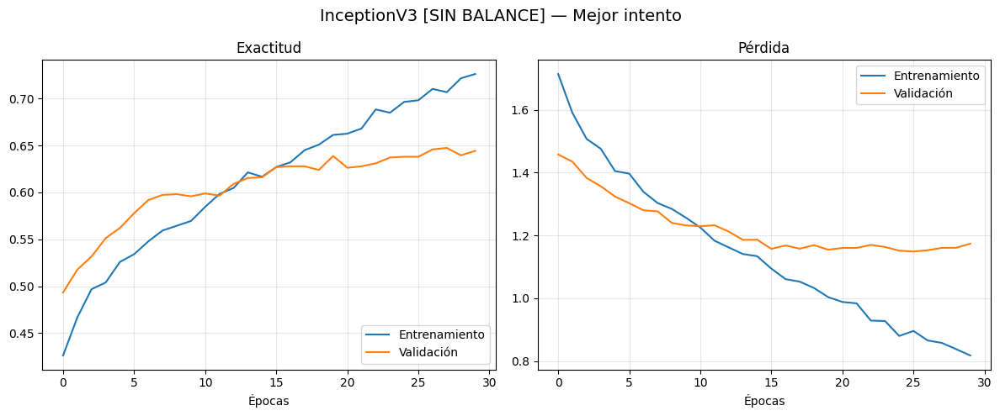

80/80 [==============================] - 7s 66ms/step

--- Reporte de clasificación [SIN BALANCE] ---
              precision    recall  f1-score   support

           A       0.66      0.51      0.57        53
           C       0.73      0.81      0.77        59
           D       0.64      0.48      0.55       322
           G       0.47      0.47      0.47        57
           H       0.25      0.08      0.12        25
           M       0.85      0.85      0.85        46
           N       0.64      0.83      0.73       575
           O       0.53      0.27      0.36       142

    accuracy                           0.64      1279
   macro avg       0.60      0.54      0.55      1279
weighted avg       0.63      0.64      0.62      1279



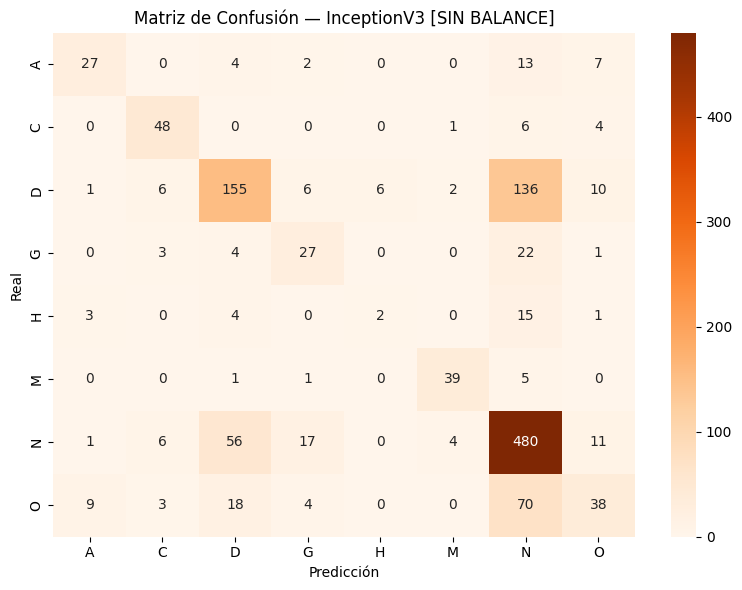

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 1 — SIN BALANCE
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  INCEPTIONV3 — SIN BALANCE")
print(" "*70)

resultado_inc_sin, acc_inc_sin = buscar_mejor_inception(
    generador_tren_inc, generador_val_inc,
    n_clases_inc,
    condicion="SIN BALANCE",
    pesos_dict=None,
    n_intentos=3
)




                                                                      
  INCEPTIONV3 — CLASS WEIGHT
                                                                      

  INCEPTIONV3 [CLASS WEIGHT]
  Buscando mejor modelo en 3 intentos...

🔄 Intento 1/3...

   🏗️  Construyendo modelo (semilla 42)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.5395 | Tiempo: 60.2 min  🌟 ¡Nuevo récord!

🔄 Intento 2/3...

   🏗️  Construyendo modelo (semilla 43)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.5293 | Tiempo: 59.4 min

🔄 Intento 3/3...

   🏗️  Construyendo modelo (semilla 44)...
   📌 Fase 1: entrenando capas de clasificación (base congelada)...
   🔓 Fase 2: fine-tuning completo (lr=1e-5)...
   ✅ Accuracy: 0.5262 | Tiempo: 59.3 min

✅ Búsqueda finalizada en 208.6 minutos
🏆 Mejor accuracy: 0.5395


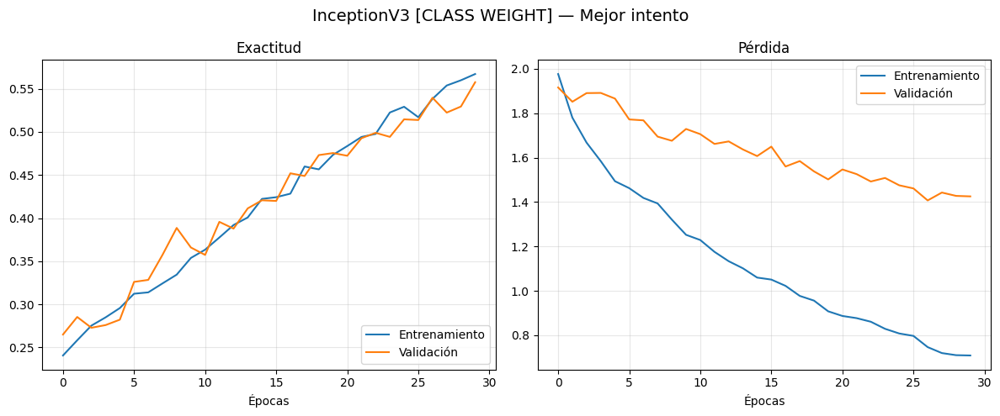

80/80 [==============================] - 7s 66ms/step

--- Reporte de clasificación [CLASS WEIGHT] ---
              precision    recall  f1-score   support

           A       0.34      0.75      0.47        53
           C       0.59      0.92      0.72        59
           D       0.57      0.41      0.48       322
           G       0.32      0.65      0.43        57
           H       0.10      0.28      0.15        25
           M       0.75      0.96      0.84        46
           N       0.68      0.57      0.62       575
           O       0.42      0.35      0.38       142

    accuracy                           0.54      1279
   macro avg       0.47      0.61      0.51      1279
weighted avg       0.58      0.54      0.55      1279



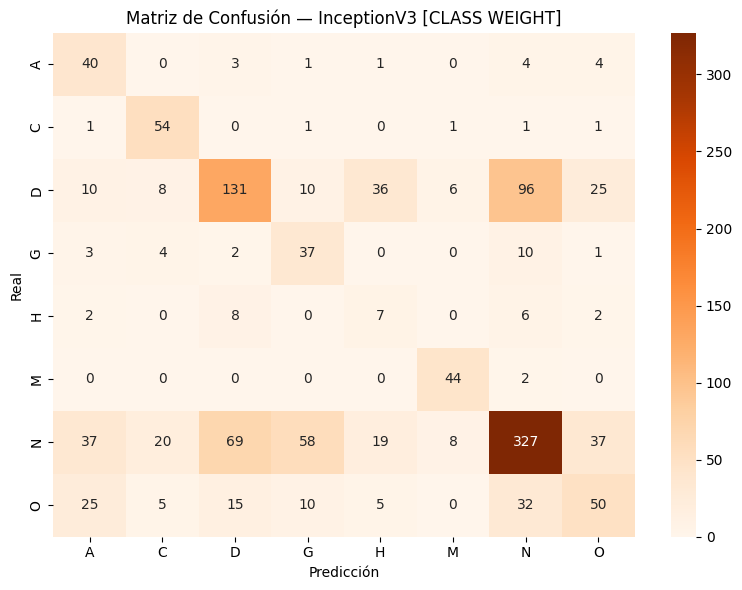

In [ ]:
# ══════════════════════════════════════════════════════════════════════════
# CONDICIÓN 2 — CLASS WEIGHT
# ══════════════════════════════════════════════════════════════════════════
print("\n" + " "*70)
print("  INCEPTIONV3 — CLASS WEIGHT")
print(" "*70)

resultado_inc_cw, acc_inc_cw = buscar_mejor_inception(
    generador_tren_inc, generador_val_inc,
    n_clases_inc,
    condicion="CLASS WEIGHT",
    pesos_dict=pesos_dict_inc,
    n_intentos=3
)


In [ ]:
# ── Tabla resumen ──────────────────────────────────────────────────────────
print("\n" + "═"*45)
print("  RESUMEN — INCEPTIONV3")
print("═"*45)
print(f"  Sin balance  : {acc_inc_sin:.4f}")
print(f"  Class Weight : {acc_inc_cw:.4f}")
print("═"*45)


═════════════════════════════════════════════
  RESUMEN — INCEPTIONV3
═════════════════════════════════════════════
  Sin balance  : 0.6380
  Class Weight : 0.5395
═════════════════════════════════════════════


In [ ]:
# Después de InceptionV3
guardar_checkpoint({
    'acc_inc_sin': acc_inc_sin,
    'acc_inc_cw' : acc_inc_cw
})

📂 Checkpoint existente cargado con 10 resultados
✅ Checkpoint actualizado — resultados guardados: ['acc_cnn_sin', 'acc_cnn_cw', 'acc_lr_sin', 'acc_lr_cw', 'acc_mlp_sin', 'acc_mlp_cw', 'acc_rn_sin', 'acc_rn_cw', 'acc_dn_sin', 'acc_dn_cw', 'acc_inc_sin', 'acc_inc_cw']


## Tabla comparativa de modelos sin reducción


════════════════════════════════════════════════════════════
  TABLA COMPARATIVA GLOBAL — MODELOS SIN REDUCCIÓN
════════════════════════════════════════════════════════════
             Modelo    Condición  Accuracy
             CNN 2D  Sin balance    0.5528
 Vision Transformer  Sin balance    0.5887
     EfficientNetB3  Sin balance    0.6435
           ResNet50  Sin balance    0.6153
        DenseNet121  Sin balance    0.6255
        InceptionV3  Sin balance    0.6380
   MLP (TensorFlow)  Sin balance    0.4808
Regresión Logística  Sin balance    0.4386
            SVM-RBF  Sin balance    0.4824
             CNN 2D Class Weight    0.2846
 Vision Transformer Class Weight    0.4081
     EfficientNetB3 Class Weight    0.3909
           ResNet50 Class Weight    0.4668
        DenseNet121 Class Weight    0.4707
        InceptionV3 Class Weight    0.5395
   MLP (TensorFlow) Class Weight    0.1970
Regresión Logística Class Weight    0.3847
            SVM-RBF Class Weight    0.3268

════════

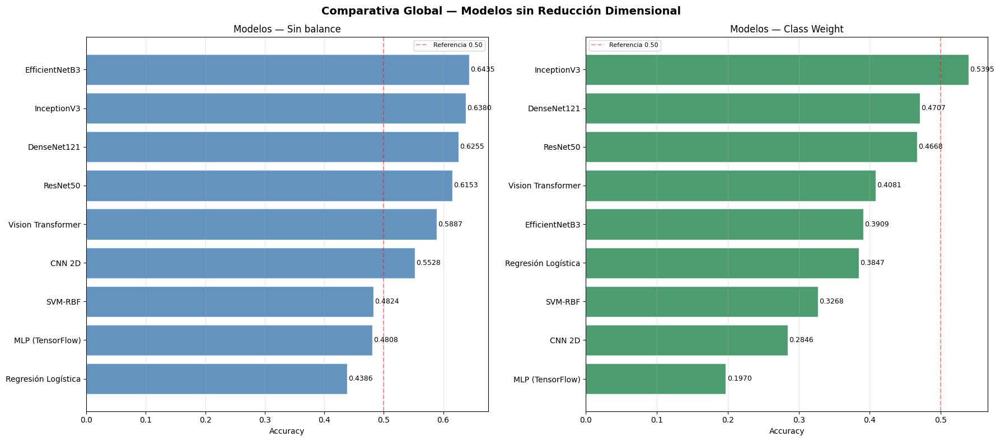

✅ Resultados guardados en Drive como 'resultados_sin_reduccion.csv'


In [42]:
# ═══════════════════════════════════════════════════════════════════════════
# TABLA COMPARATIVA GLOBAL — MODELOS SIN REDUCCIÓN DIMENSIONAL
# ═══════════════════════════════════════════════════════════════════════════
# Consolida los mejores resultados de accuracy de todos los modelos
# evaluados directamente sobre las imágenes completas, bajo las
# condiciones de balanceo disponibles para cada modelo.
# ═══════════════════════════════════════════════════════════════════════════

import pandas as pd

filas = []

def agregar_fila_global(modelo, condicion, accuracy):
    """Agrega una fila a la tabla comparativa global."""
    filas.append({
        'Modelo'    : modelo,
        'Condición' : condicion,
        'Accuracy'  : accuracy
    })

# ═══════════════════════════════════════════════════════════════════════════
# BLOQUE 1 — SIN BALANCE
# ═══════════════════════════════════════════════════════════════════════════
agregar_fila_global('CNN 2D',            'Sin balance', acc_cnn_sin)
agregar_fila_global('Vision Transformer','Sin balance', acc_vit_sin)
agregar_fila_global('EfficientNetB3',    'Sin balance', acc_eff_sin)
agregar_fila_global('ResNet50',          'Sin balance', acc_rn_sin)
agregar_fila_global('DenseNet121',       'Sin balance', acc_dn_sin)
agregar_fila_global('InceptionV3',       'Sin balance', acc_inc_sin)
agregar_fila_global('MLP (TensorFlow)',  'Sin balance', acc_mlp_sin)
agregar_fila_global('Regresión Logística','Sin balance', acc_lr_sin)
agregar_fila_global('SVM-RBF',           'Sin balance', acc_svm_sin)

# ═══════════════════════════════════════════════════════════════════════════
# BLOQUE 2 — CON BALANCE
# ═══════════════════════════════════════════════════════════════════════════
agregar_fila_global('CNN 2D',            'Class Weight', acc_cnn_cw)
agregar_fila_global('Vision Transformer','Class Weight', acc_vit_cw)
agregar_fila_global('EfficientNetB3',    'Class Weight', acc_eff_cw)
agregar_fila_global('ResNet50',          'Class Weight', acc_rn_cw)
agregar_fila_global('DenseNet121',       'Class Weight', acc_dn_cw)
agregar_fila_global('InceptionV3',       'Class Weight', acc_inc_cw)
agregar_fila_global('MLP (TensorFlow)',  'Class Weight', acc_mlp_cw)
agregar_fila_global('Regresión Logística','Class Weight', acc_lr_cw)
agregar_fila_global('SVM-RBF',           'Class Weight', acc_svm_cw)

# ── Construcción del DataFrame ─────────────────────────────────────────────
df_global = pd.DataFrame(filas)

# ── Visualización de la tabla ──────────────────────────────────────────────
print("\n" + "═"*60)
print("  TABLA COMPARATIVA GLOBAL — MODELOS SIN REDUCCIÓN")
print("═"*60)

print(df_global.to_string(
    index=False,
    float_format=lambda x: f'{x:.4f}'
))

print("\n" + "═"*60)
print(f"  Total de configuraciones: {len(df_global)}")
mejor = df_global.loc[df_global['Accuracy'].idxmax()]
print(f"  🏆 Mejor configuración global:")
print(f"     {mejor['Modelo']} — {mejor['Condición']}")
print(f"     Accuracy: {mejor['Accuracy']:.4f}")
print("═"*60)

# ── Gráfica comparativa ────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=False)

bloques = [
    ('Sin balance',  df_global[df_global['Condición'] == 'Sin balance'],  'steelblue',  axes[0]),
    ('Class Weight', df_global[df_global['Condición'] == 'Class Weight'], 'seagreen',   axes[1])
]

for titulo, datos, color, ax in bloques:
    datos_ord = datos.sort_values('Accuracy', ascending=True)

    bars = ax.barh(
        range(len(datos_ord)),
        datos_ord['Accuracy'],
        color=color, alpha=0.85, edgecolor='white'
    )

    ax.set_yticks(range(len(datos_ord)))
    ax.set_yticklabels(datos_ord['Modelo'], fontsize=10)
    ax.set_xlabel('Accuracy')
    ax.set_title(f'Modelos — {titulo}', fontsize=12)
    ax.axvline(x=0.5, color='red', linestyle='--',
               alpha=0.4, label='Referencia 0.50')
    ax.grid(True, alpha=0.3, axis='x')
    ax.legend(fontsize=8)

    for bar, val in zip(bars, datos_ord['Accuracy']):
        ax.text(bar.get_width() + 0.002,
                bar.get_y() + bar.get_height()/2,
                f'{val:.4f}', va='center', fontsize=9)

plt.suptitle('Comparativa Global — Modelos sin Reducción Dimensional',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## ── Guardar en Drive ───────────────────────────────────────────────────────
df_global.to_csv(
    '/content/drive/MyDrive/enfermedades oculares/resultados_sin_reduccion.csv',
    index=False
)
print("✅ Resultados guardados en Drive como 'resultados_sin_reduccion.csv'")

# **Algunos análisis descriptivos**

In [ ]:
# Mapa oficial ODIR-5K: código → nombre completo
mapa = {
    "N": "Normal",
    "D": "Diabetes",
    "G": "Glaucoma",
    "C": "Cataratas",
    "A": "Degeneración macular relacionada con la edad",
    "H": "Hipertensión",
    "M": "Miopía patológica",
    "O": "Otras anomalías"
}

# Aplicar el mapeo para convertir el contenido de labels
df["diagnostico_real"] = df["labels"].map(mapa)

# Verificar
df[["filename", "labels", "diagnostico_real"]].head()


,filename,labels,diagnostico_real
0,0_right.jpg,N,Normal
1,1_right.jpg,N,Normal
2,2_right.jpg,D,Diabetes
3,4_right.jpg,D,Diabetes
4,5_right.jpg,D,Diabetes


In [ ]:
# --- Preparación: columna ojo y grupo etario ---

# Ojo según filename
df["ojo"] = df["filename"].apply(lambda x: "left" if "left" in x.lower() else "right")

# Grupos de edad
bins = [0, 20, 40, 60, 80, 120]
labels_bins = ["0-20", "21-40", "41-60", "61-80", "81+"]
df["edad_grupo"] = pd.cut(df["Patient Age"], bins=bins, labels=labels_bins, include_lowest=True)

df["ojo"] = df["ojo"].replace({"left": "Izquierdo", "right": "Derecho"})

df["Patient Sex"] = df["Patient Sex"].replace({
    "Female": "Femenino",
    "Male": "Masculino"
})


In [ ]:
# --- 1. Frecuencia total de enfermedades ---
df["diagnostico_real"].value_counts()


,count
diagnostico_real,
Normal,2873
Diabetes,1608
Otras anomalías,708
Cataratas,293
Glaucoma,284
Degeneración macular relacionada con la edad,266
Miopía patológica,232
Hipertensión,128


<Figure size 1200x800 with 0 Axes>

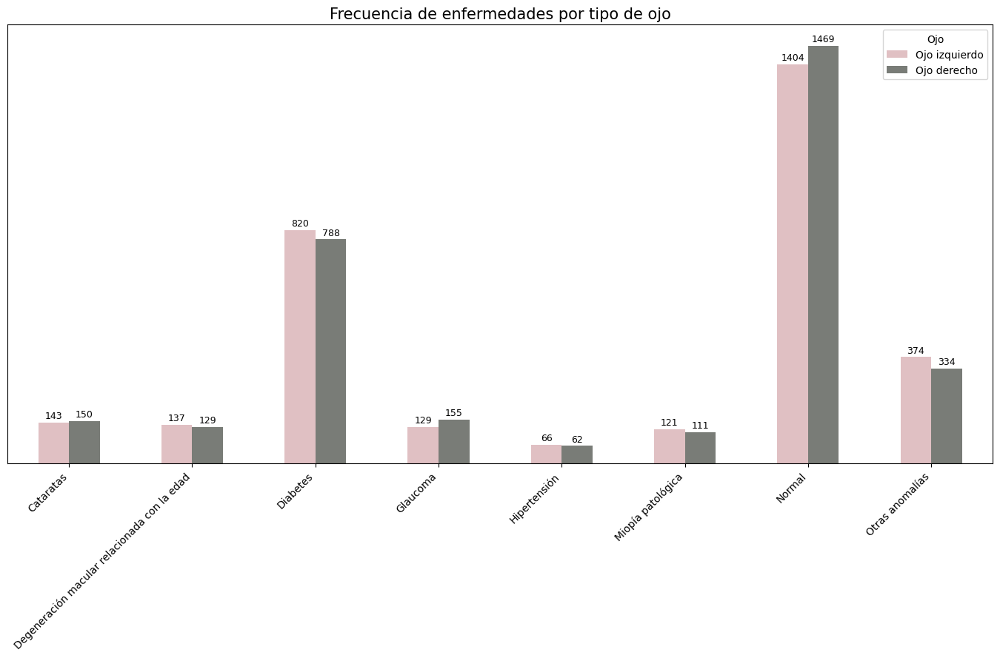

In [ ]:
colores = [ "#E0C0C3","#797C77"]

# Crear tabla dinámica
tabla = df.groupby("ojo")["diagnostico_real"].value_counts().unstack().T

plt.figure(figsize=(12, 8))
ax = tabla.plot(
    kind="bar",
    figsize=(14, 9),
    legend=True,
    color=colores
)

# Leyenda en español
ax.legend(["Ojo izquierdo", "Ojo derecho"], title="Ojo")

# Quitar ejes, números
ax.set_xlabel("")
ax.set_ylabel("")
ax.set_title("Frecuencia de enfermedades por tipo de ojo", fontsize=15)
ax.set_yticks([])

# Rotación de etiquetas
plt.xticks(rotation=45, ha='right')

# Etiquetas encima
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', padding=2, fontsize=9)

plt.tight_layout()
plt.show()


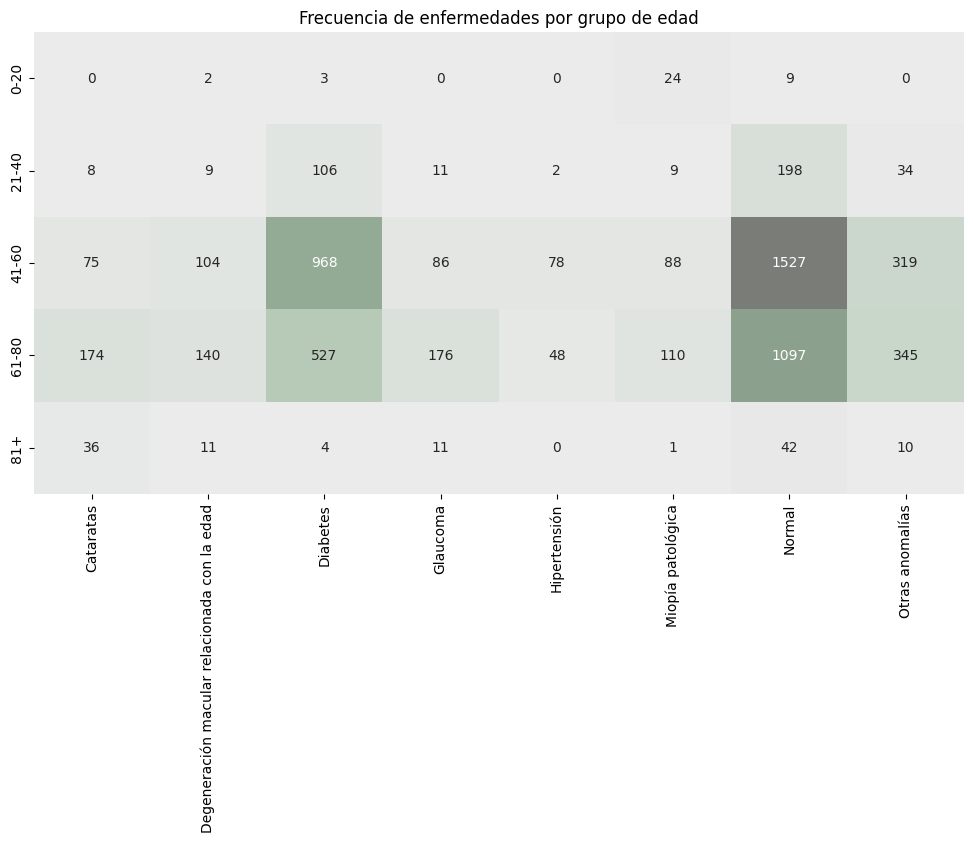

In [ ]:
paleta = ["#EBEBEB", "#C5D3C6","#9FBBA1","#899D8A","#797C77"]

# Crear el colormap
mi_paleta = LinearSegmentedColormap.from_list("mi_paleta", paleta)

tabla = pd.crosstab(df["edad_grupo"], df["diagnostico_real"])

plt.figure(figsize=(12,6))
sns.heatmap(
    tabla,
    annot=True,
    fmt='d',
    cmap=mi_paleta,
    cbar=False
)

plt.title("Frecuencia de enfermedades por grupo de edad")
plt.xlabel("")
plt.ylabel("")
plt.show()


<Figure size 1400x600 with 0 Axes>

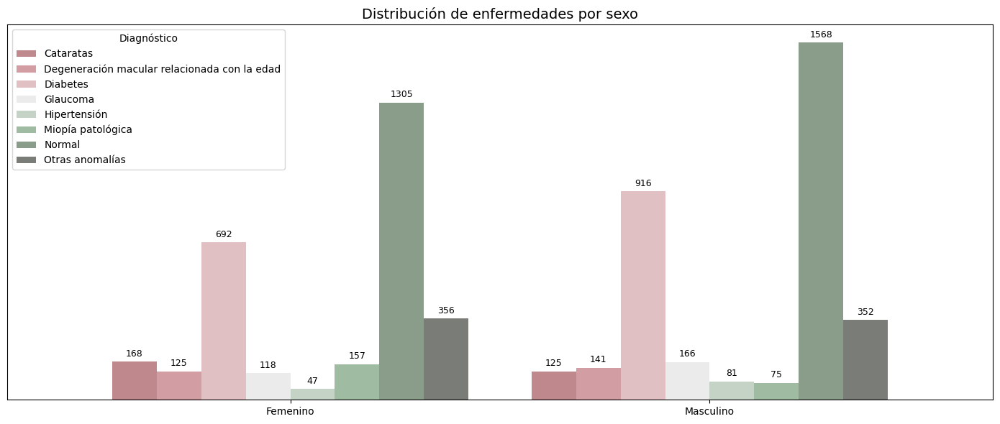

In [ ]:
paleta = ["#BF888D", "#D29DA3", "#E0C0C3", "#EBEBEB", "#C5D3C6","#9FBBA1","#899D8A","#797C77"]
cmap = ListedColormap(paleta)

# Tabla de frecuencias
tabla = df.groupby("Patient Sex")["diagnostico_real"].value_counts().unstack()

# --- Gráfico mejorado ---
plt.figure(figsize=(14,6))
ax = tabla.plot(
    kind="bar",
    figsize=(14,6),
    width=0.85,         # barras más gruesas
    color=paleta * 3   # repetir paleta si hay más columnas
)

# Título
plt.title("Distribución de enfermedades por sexo", fontsize=14)

# Quitar etiquetas de ejes
plt.xlabel("")
plt.ylabel("")

# Rotación del eje X
plt.xticks(rotation=0)

# Quitar números del eje Y
ax.set_yticks([])
ax.yaxis.set_ticklabels([])


# Mover la leyenda afuera
plt.legend(
    title="Diagnóstico",
    bbox_to_anchor=(0, 1),
    loc="upper left"
)

# --- Etiquetas encima de cada barra ---
for container in ax.containers:
    ax.bar_label(container, padding=3, fontsize=9)

plt.tight_layout()
plt.show()


In [ ]:
# --- 5. Edad promedio por enfermedad ---
df.groupby("diagnostico_real")["Patient Age"].mean().sort_values()


,Patient Age
diagnostico_real,
Pathological Myopia,54.887931
Diabetes,55.699627
Hypertension,57.046875
Normal,57.181692
Other abnormalities,59.607345
Age-related Macular Degeneration,61.210526
Glaucoma,63.021127
Cataract,66.764505


In [ ]:
pivot = df.pivot_table(
    index="ID",
    columns="ojo",
    values="diagnostico_real",
    aggfunc="first"
)

pivot = pivot.rename(columns={"Izquierdo": "Diagnostico ojo izquierdo", "Derecho": "Diagnostico ojo derecho"})


In [ ]:
# --- 6. Conteo de diagnosticos por paciente ---
conteo_ojos = df.groupby("ID")["ojo"].nunique()
conteo_ojos.value_counts()


,count
ojo,
2,3034
1,324


In [ ]:
# Columnas reales
col_izq = "Diagnostico ojo izquierdo"
col_der = "Diagnostico ojo derecho"

# Matriz de concordancia
tabla = pd.crosstab(pivot[col_izq], pivot[col_der])

colores = ["#EBEBEB", "#C5D3C6","#9FBBA1","#899D8A","#797C77"]

# Convertir lista en colormap
cmap_personal = LinearSegmentedColormap.from_list("mi_paleta", colores)

# Tabla estilizada
tabla_bonita = (
    tabla.style.background_gradient(cmap=cmap_personal)
         .set_properties(**{"text-align": "center"})
         .set_table_styles([
             dict(selector="th", props=[("font-size", "12px"), ("text-align", "center")]),
             dict(selector="td", props=[("font-size", "12px")]),
         ])
)

tabla_bonita

Diagnostico ojo derecho,Cataratas,Degeneración macular relacionada con la edad,Diabetes,Glaucoma,Hipertensión,Miopía patológica,Normal,Otras anomalías
Diagnostico ojo izquierdo,,,,,,,,
Cataratas,90,0,15,0,0,0,24,15
Degeneración macular relacionada con la edad,0,112,2,0,0,0,9,3
Diabetes,13,3,581,4,8,8,96,40
Glaucoma,1,1,5,102,2,0,25,13
Hipertensión,0,2,4,2,53,0,0,1
Miopía patológica,0,0,2,0,0,78,12,5
Normal,27,12,131,13,0,12,1021,170
Otras anomalías,4,4,46,3,1,6,144,109


# Limpieza de metadatos "Widgets"

In [ ]:

from google.colab import files
!cp "/content/drive/MyDrive/Colab Notebooks/version_final.ipynb" "/content/"


import nbformat, os

ruta_origen  = "version_final.ipynb"
ruta_destino = "clasificacion_enfermedades_oculares_ODIR5K.ipynb"

if not os.path.exists(ruta_origen):
    print(f"⚠️ No se encontró el archivo '{ruta_origen}'.")
else:
    nb = nbformat.read(ruta_origen, as_version=4)

    if "widgets" in nb.metadata:
        del nb.metadata["widgets"]
        print("✅ Metadatos 'widgets' eliminados correctamente.")
    else:
        print("ℹ️ El archivo no contenía metadatos 'widgets'.")

    nbformat.write(nb, ruta_destino)
    print(f"✅ Archivo guardado como '{ruta_destino}'")


files.download("clasificacion_enfermedades_oculares_ODIR5K.ipynb")

In [ ]:
from google.colab import files
!cp "/content/drive/MyDrive/Colab Notebooks/Copia de EO.ipynb" "/content/"


In [ ]:
import nbformat, os

ruta = "Copia de EO.ipynb"

if not os.path.exists(ruta):
    print(f"⚠️ No se encontró el archivo '{ruta}'. Verifica que esté en /content o descarga una copia desde Colab (Archivo → Descargar .ipynb).")
else:
    nb = nbformat.read(ruta, as_version=4)

    if "widgets" in nb.metadata:
        del nb.metadata["widgets"]
        nbformat.write(nb, ruta)
        print(f"✅ Se eliminaron los metadatos 'widgets' del archivo '{ruta}' correctamente.")
    else:
        print("ℹ️ El archivo no contenía metadatos 'widgets'. No se realizaron cambios.")


In [ ]:
files.download("Copia de EO.ipynb")